In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import numpy as np
import pandas as pd
pd.set_option('mode.use_inf_as_na', False)

import matplotlib.pyplot as plt
import seaborn  as sns

import optuna

from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler

import torch
import torch.nn as nn
import torch.optim as optim

import random

In [2]:
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
torch.manual_seed(SEED)

In [3]:
def preprocess(data):
    _col = data.columns

    for c in _col:
        if data[c].dtype == 'int64':
            data[c] = data[c].astype('int32')

        elif data[c].dtype == 'float64':
            data[c] = data[c].astype('float32')
    
    data['col_1'] = data['maxtemp'] - data['mintemp']
    data['col_2'] = data['temparature'] - data['mintemp']
    data['col_3'] = data['maxtemp'] - data['temparature']

    data['col_4'] = data['humidity'] - data['dewpoint']

    data['col_5'] = data['humidity'] / 100

    data['col_rad'] = np.deg2rad(data['winddirection'])
    data['col_6'] = np.sin(data['col_rad'])
    data['col_7'] = np.cos(data['col_rad'])
    data.drop(columns=['col_rad'], inplace=True)

    data['WIND_FACT'] = (
    35.74 + 
    (0.6215 * data['temparature']) - 
    (35.75 * (data['winddirection']**0.16)) + 
    (0.4275 * data['temparature'] * (data['winddirection']**0.16))
    )

    return data

In [4]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate=0.5):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)  
        self.fc2 = nn.Linear(hidden_size, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.dropout(out)  
        out = self.fc2(out)
        out = self.sigmoid(out)
        return out

In [5]:
df_train = pd.read_csv('/kaggle/input/playground-series-s5e3/train.csv')
df_test = pd.read_csv('/kaggle/input/playground-series-s5e3/test.csv')

mean_wind_tr = (df_train['winddirection'].mean()).round()
df_test['winddirection'].fillna(mean_wind_tr, inplace=True)

In [6]:
df_train = df_train.drop(columns=['id', 'day'])
df_test_id = df_test['id']
df_test = df_test.drop(columns=['id', 'day'])

In [7]:
df_train_y = df_train['rainfall']
df_train = df_train.drop(columns=['rainfall'])

In [8]:
df_train = preprocess(df_train)
df_test = preprocess(df_test)

In [9]:
pd.options.display.float_format = '{:.2f}'.format

In [10]:
scaler = StandardScaler()
df_train = scaler.fit_transform(df_train)
df_test = scaler.transform(df_test)

df_train_y = pd.Series(df_train_y)

In [11]:
X_train, X_val, y_train, y_val = train_test_split(df_train, df_train_y, test_size=0.2, random_state=SEED)

In [12]:
def objective(trial, X_train, X_val, y_train, y_val):
    lr = trial.suggest_loguniform('lr', 1e-5, 1e-2)
    hidden_size = trial.suggest_int('hidden_size', 20, 100)
    dropout_rate = trial.suggest_uniform('dropout_rate', 0.0, 0.5)
    batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])
    num_epochs = trial.suggest_int('num_epochs', 10, 200)

    X_train = torch.tensor(X_train, dtype=torch.float32)
    X_val = torch.tensor(X_val, dtype=torch.float32)
    y_train = torch.tensor(y_train.to_numpy(), dtype=torch.float32)
    y_val = torch.tensor(y_val.to_numpy(), dtype=torch.float32)

    class MLP(nn.Module):
        def __init__(self, input_size, hidden_size, dropout_rate=0.5):
            super(MLP, self).__init__()
            self.fc1 = nn.Linear(input_size, hidden_size)
            self.relu = nn.ReLU()
            self.dropout = nn.Dropout(dropout_rate)  
            self.fc2 = nn.Linear(hidden_size, 1)
            self.sigmoid = nn.Sigmoid()

        def forward(self, x):
            out = self.fc1(x)
            out = self.relu(out)
            out = self.dropout(out)  
            out = self.fc2(out)
            out = self.sigmoid(out)
            return out
    
    input_size = X_train.shape[1]
    model = MLP(input_size, hidden_size, dropout_rate)

    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    train_dataset = torch.utils.data.TensorDataset(X_train, y_train)
    train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)

    train_losses = []
    train_accuracies = []

    for epoch in range(num_epochs):
        epoch_loss = 0.0
        correct_predictions = 0
        total_samples = 0

        for i, (inputs, labels) in enumerate(train_loader):
            outputs = model(inputs)
            loss = criterion(outputs, labels.unsqueeze(1)) 
            optimizer.zero_grad()
            loss.backward()
            #torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0) 
            optimizer.step()

            epoch_loss += loss.item()  

  
            predicted = (outputs > 0.5).float()  
            correct_predictions += (predicted == labels.unsqueeze(1)).sum().item()
            total_samples += labels.size(0)

            if (i + 1) % 10 == 0:
                print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'
                      .format(epoch + 1, num_epochs, i + 1, len(train_loader), loss.item()))

        epoch_loss /= len(train_loader)
        epoch_accuracy = correct_predictions / total_samples

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_accuracy)

        print('Epoch [{}/{}], Train Loss: {:.4f}, Train Accuracy: {:.4f}'
              .format(epoch + 1, num_epochs, epoch_loss, epoch_accuracy))
    
    with torch.no_grad():
        outputs = model(X_val)
        predicted_probs = outputs.cpu().numpy() 
        auc = roc_auc_score(y_val.cpu().numpy(), predicted_probs) 
        print('Test AUC: {:.4f}'.format(auc))
    
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(train_accuracies, label='Train Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

    return auc



[I 2025-03-06 06:50:16,411] A new study created in memory with name: no-name-a69df5cc-5c4e-4c92-87b6-8f0f8a925a6e


Epoch [1/98], Step [10/14], Loss: 0.7220
Epoch [1/98], Train Loss: 0.7256, Train Accuracy: 0.3248
Epoch [2/98], Step [10/14], Loss: 0.6847
Epoch [2/98], Train Loss: 0.7045, Train Accuracy: 0.4110
Epoch [3/98], Step [10/14], Loss: 0.6824
Epoch [3/98], Train Loss: 0.6853, Train Accuracy: 0.5240
Epoch [4/98], Step [10/14], Loss: 0.6707
Epoch [4/98], Train Loss: 0.6659, Train Accuracy: 0.6381
Epoch [5/98], Step [10/14], Loss: 0.6483
Epoch [5/98], Train Loss: 0.6484, Train Accuracy: 0.7352
Epoch [6/98], Step [10/14], Loss: 0.6256
Epoch [6/98], Train Loss: 0.6319, Train Accuracy: 0.7911
Epoch [7/98], Step [10/14], Loss: 0.6186
Epoch [7/98], Train Loss: 0.6168, Train Accuracy: 0.8105
Epoch [8/98], Step [10/14], Loss: 0.6082
Epoch [8/98], Train Loss: 0.6026, Train Accuracy: 0.8202
Epoch [9/98], Step [10/14], Loss: 0.5838
Epoch [9/98], Train Loss: 0.5894, Train Accuracy: 0.8282
Epoch [10/98], Step [10/14], Loss: 0.5531
Epoch [10/98], Train Loss: 0.5757, Train Accuracy: 0.8236
Epoch [11/98], Ste

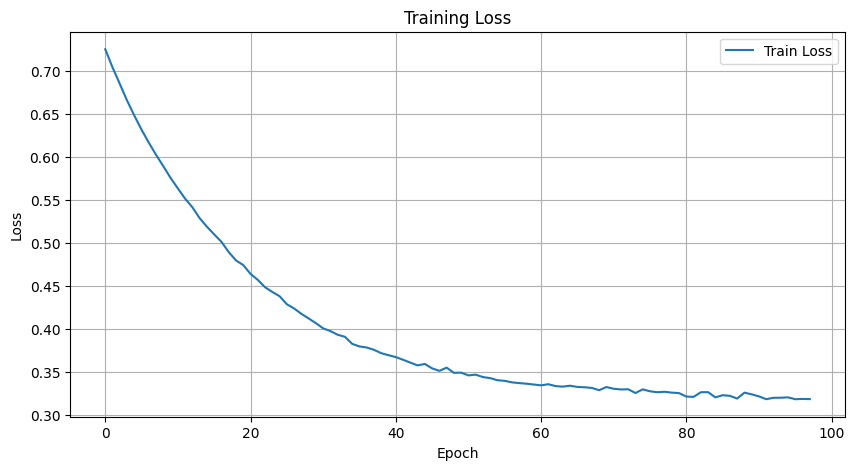

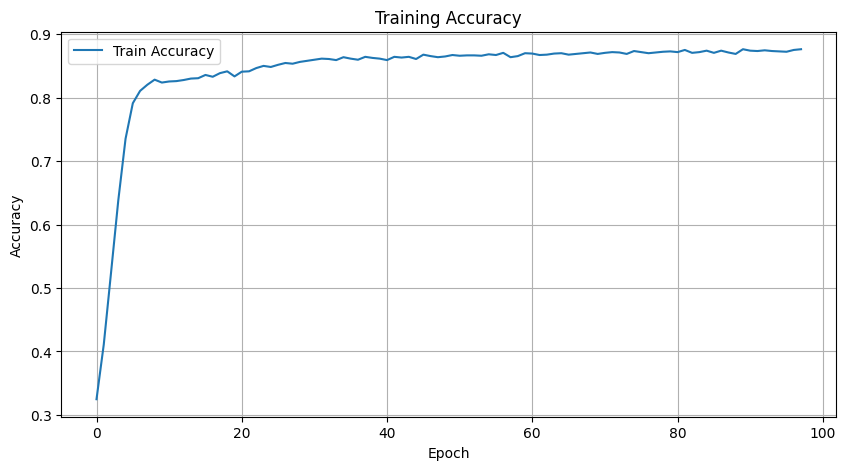

[I 2025-03-06 06:50:26,126] Trial 0 finished with value: 0.8595137114406891 and parameters: {'lr': 0.0001525796996432748, 'hidden_size': 85, 'dropout_rate': 0.048052203130554305, 'batch_size': 128, 'num_epochs': 98}. Best is trial 0 with value: 0.8595137114406891.


Epoch [1/170], Step [10/14], Loss: 0.6688
Epoch [1/170], Train Loss: 0.6716, Train Accuracy: 0.5970
Epoch [2/170], Step [10/14], Loss: 0.6758
Epoch [2/170], Train Loss: 0.6733, Train Accuracy: 0.6107
Epoch [3/170], Step [10/14], Loss: 0.6782
Epoch [3/170], Train Loss: 0.6691, Train Accuracy: 0.6233
Epoch [4/170], Step [10/14], Loss: 0.6605
Epoch [4/170], Train Loss: 0.6686, Train Accuracy: 0.6142
Epoch [5/170], Step [10/14], Loss: 0.6667
Epoch [5/170], Train Loss: 0.6691, Train Accuracy: 0.6124
Epoch [6/170], Step [10/14], Loss: 0.6689
Epoch [6/170], Train Loss: 0.6644, Train Accuracy: 0.6261
Epoch [7/170], Step [10/14], Loss: 0.6644
Epoch [7/170], Train Loss: 0.6647, Train Accuracy: 0.6478
Epoch [8/170], Step [10/14], Loss: 0.6617
Epoch [8/170], Train Loss: 0.6634, Train Accuracy: 0.6364
Epoch [9/170], Step [10/14], Loss: 0.6769
Epoch [9/170], Train Loss: 0.6631, Train Accuracy: 0.6473
Epoch [10/170], Step [10/14], Loss: 0.6572
Epoch [10/170], Train Loss: 0.6610, Train Accuracy: 0.641

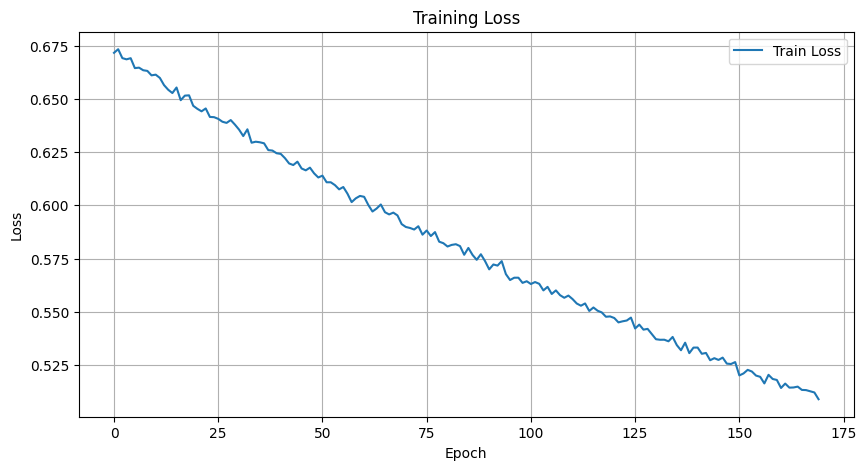

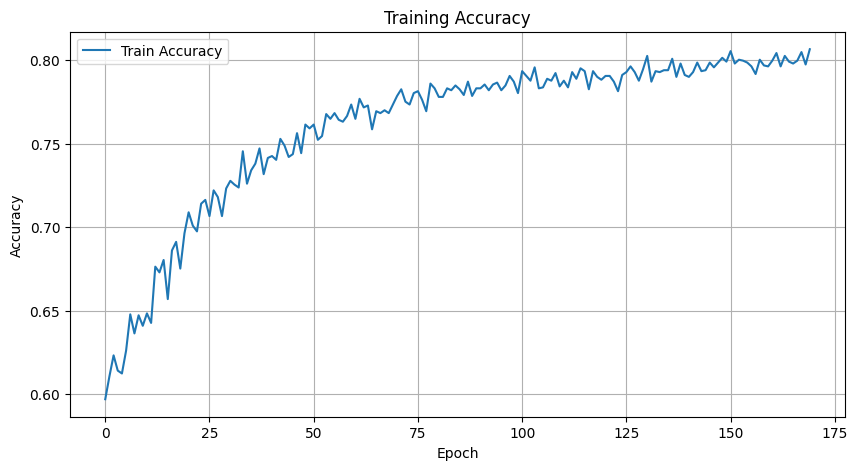

[I 2025-03-06 06:50:33,926] Trial 1 finished with value: 0.7885988251099814 and parameters: {'lr': 1.0750244491884766e-05, 'hidden_size': 81, 'dropout_rate': 0.18360561407478176, 'batch_size': 128, 'num_epochs': 170}. Best is trial 0 with value: 0.8595137114406891.


Epoch [1/36], Step [10/14], Loss: 0.6908
Epoch [1/36], Train Loss: 0.7056, Train Accuracy: 0.4692
Epoch [2/36], Step [10/14], Loss: 0.6939
Epoch [2/36], Train Loss: 0.7001, Train Accuracy: 0.5006
Epoch [3/36], Step [10/14], Loss: 0.6977
Epoch [3/36], Train Loss: 0.6878, Train Accuracy: 0.5371
Epoch [4/36], Step [10/14], Loss: 0.6823
Epoch [4/36], Train Loss: 0.6823, Train Accuracy: 0.5411
Epoch [5/36], Step [10/14], Loss: 0.6747
Epoch [5/36], Train Loss: 0.6740, Train Accuracy: 0.5702
Epoch [6/36], Step [10/14], Loss: 0.6514
Epoch [6/36], Train Loss: 0.6694, Train Accuracy: 0.5976
Epoch [7/36], Step [10/14], Loss: 0.6792
Epoch [7/36], Train Loss: 0.6576, Train Accuracy: 0.6341
Epoch [8/36], Step [10/14], Loss: 0.6453
Epoch [8/36], Train Loss: 0.6520, Train Accuracy: 0.6513
Epoch [9/36], Step [10/14], Loss: 0.6503
Epoch [9/36], Train Loss: 0.6480, Train Accuracy: 0.6473
Epoch [10/36], Step [10/14], Loss: 0.6276
Epoch [10/36], Train Loss: 0.6390, Train Accuracy: 0.6872
Epoch [11/36], Ste

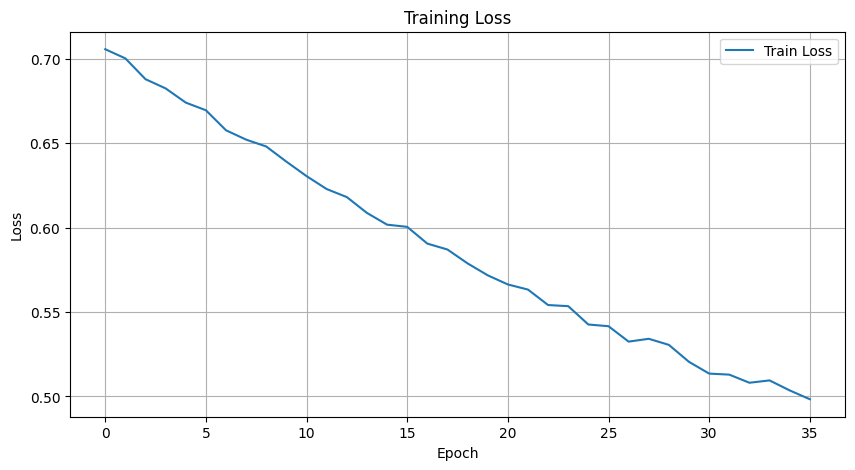

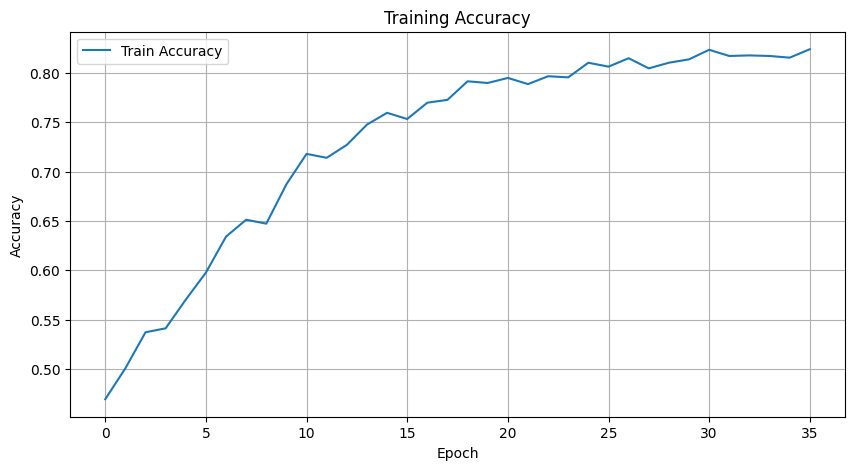

[I 2025-03-06 06:50:35,780] Trial 2 finished with value: 0.7748478701825559 and parameters: {'lr': 9.978637026863244e-05, 'hidden_size': 42, 'dropout_rate': 0.4637356225441323, 'batch_size': 128, 'num_epochs': 36}. Best is trial 0 with value: 0.8595137114406891.


Epoch [1/29], Step [10/55], Loss: 0.7282
Epoch [1/29], Step [20/55], Loss: 0.7083
Epoch [1/29], Step [30/55], Loss: 0.5959
Epoch [1/29], Step [40/55], Loss: 0.6243
Epoch [1/29], Step [50/55], Loss: 0.6067
Epoch [1/29], Train Loss: 0.6484, Train Accuracy: 0.6558
Epoch [2/29], Step [10/55], Loss: 0.5749
Epoch [2/29], Step [20/55], Loss: 0.5688
Epoch [2/29], Step [30/55], Loss: 0.5606
Epoch [2/29], Step [40/55], Loss: 0.5692
Epoch [2/29], Step [50/55], Loss: 0.4899
Epoch [2/29], Train Loss: 0.5653, Train Accuracy: 0.7974
Epoch [3/29], Step [10/55], Loss: 0.5445
Epoch [3/29], Step [20/55], Loss: 0.5459
Epoch [3/29], Step [30/55], Loss: 0.4882
Epoch [3/29], Step [40/55], Loss: 0.5451
Epoch [3/29], Step [50/55], Loss: 0.4084
Epoch [3/29], Train Loss: 0.5074, Train Accuracy: 0.8225
Epoch [4/29], Step [10/55], Loss: 0.4949
Epoch [4/29], Step [20/55], Loss: 0.5339
Epoch [4/29], Step [30/55], Loss: 0.3883
Epoch [4/29], Step [40/55], Loss: 0.5215
Epoch [4/29], Step [50/55], Loss: 0.5096
Epoch [4/

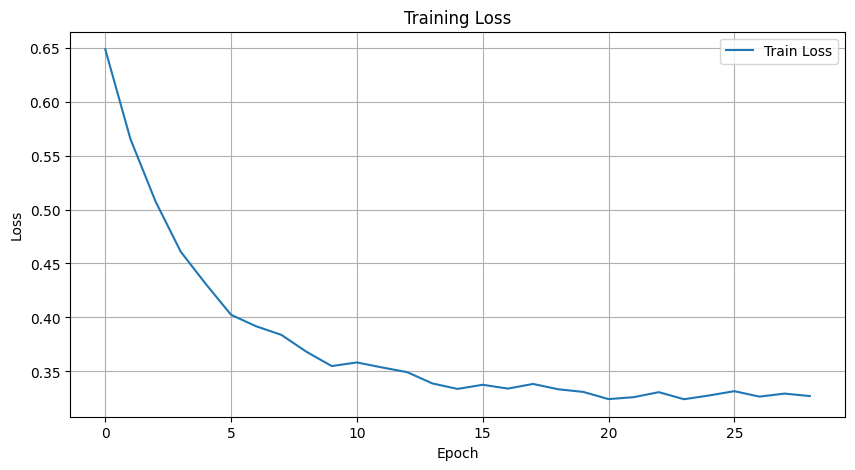

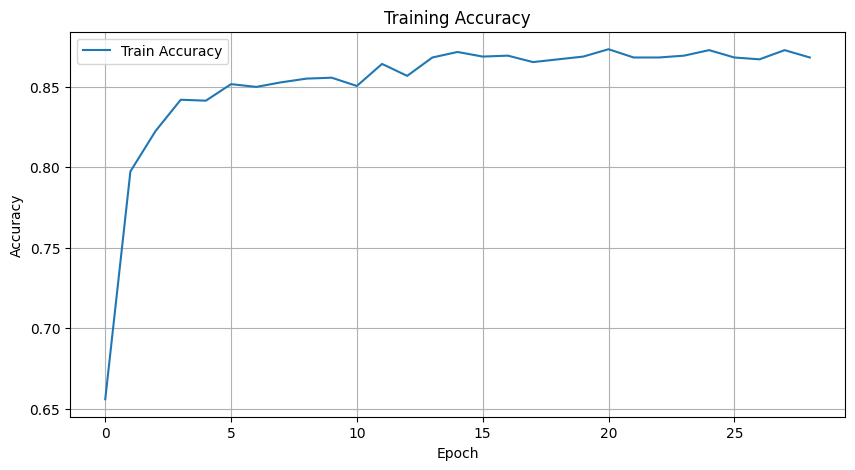

[I 2025-03-06 06:50:39,169] Trial 3 finished with value: 0.8525855483259135 and parameters: {'lr': 0.000343700450474953, 'hidden_size': 49, 'dropout_rate': 0.37063763937893823, 'batch_size': 32, 'num_epochs': 29}. Best is trial 0 with value: 0.8595137114406891.


Epoch [1/134], Step [10/55], Loss: 0.4932
Epoch [1/134], Step [20/55], Loss: 0.3238
Epoch [1/134], Step [30/55], Loss: 0.3157
Epoch [1/134], Step [40/55], Loss: 0.3508
Epoch [1/134], Step [50/55], Loss: 0.4188
Epoch [1/134], Train Loss: 0.4098, Train Accuracy: 0.8453
Epoch [2/134], Step [10/55], Loss: 0.3652
Epoch [2/134], Step [20/55], Loss: 0.3236
Epoch [2/134], Step [30/55], Loss: 0.2185
Epoch [2/134], Step [40/55], Loss: 0.5385
Epoch [2/134], Step [50/55], Loss: 0.2426
Epoch [2/134], Train Loss: 0.3320, Train Accuracy: 0.8647
Epoch [3/134], Step [10/55], Loss: 0.2086
Epoch [3/134], Step [20/55], Loss: 0.2506
Epoch [3/134], Step [30/55], Loss: 0.2770
Epoch [3/134], Step [40/55], Loss: 0.4371
Epoch [3/134], Step [50/55], Loss: 0.3495
Epoch [3/134], Train Loss: 0.3211, Train Accuracy: 0.8733
Epoch [4/134], Step [10/55], Loss: 0.2599
Epoch [4/134], Step [20/55], Loss: 0.3376
Epoch [4/134], Step [30/55], Loss: 0.3141
Epoch [4/134], Step [40/55], Loss: 0.2566
Epoch [4/134], Step [50/55],

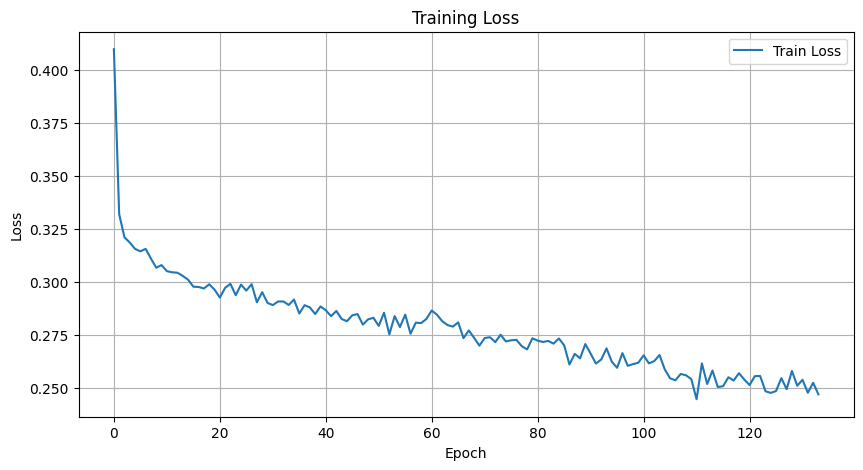

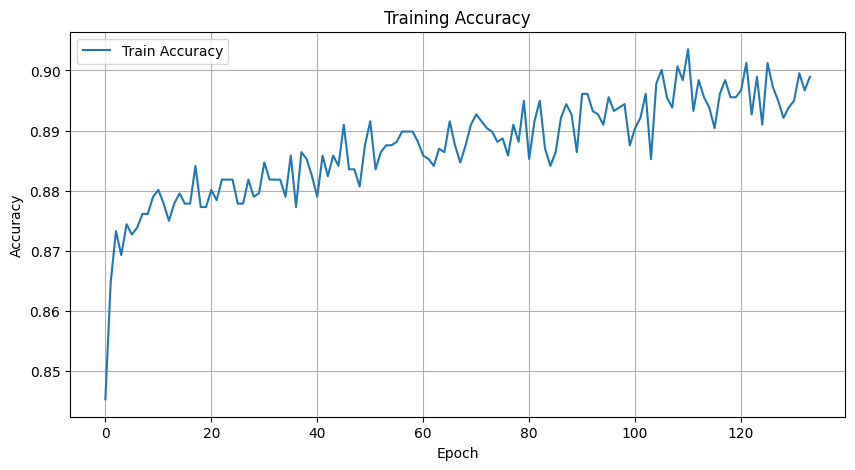

[I 2025-03-06 06:50:52,692] Trial 4 finished with value: 0.8279813492795237 and parameters: {'lr': 0.0028764777581810055, 'hidden_size': 81, 'dropout_rate': 0.10368353182057133, 'batch_size': 32, 'num_epochs': 134}. Best is trial 0 with value: 0.8595137114406891.


Epoch [1/111], Step [10/14], Loss: 0.5637
Epoch [1/111], Train Loss: 0.6089, Train Accuracy: 0.7100
Epoch [2/111], Step [10/14], Loss: 0.4244
Epoch [2/111], Train Loss: 0.4592, Train Accuracy: 0.8185
Epoch [3/111], Step [10/14], Loss: 0.3971
Epoch [3/111], Train Loss: 0.3854, Train Accuracy: 0.8419
Epoch [4/111], Step [10/14], Loss: 0.3495
Epoch [4/111], Train Loss: 0.3602, Train Accuracy: 0.8579
Epoch [5/111], Step [10/14], Loss: 0.2343
Epoch [5/111], Train Loss: 0.3372, Train Accuracy: 0.8653
Epoch [6/111], Step [10/14], Loss: 0.3635
Epoch [6/111], Train Loss: 0.3296, Train Accuracy: 0.8664
Epoch [7/111], Step [10/14], Loss: 0.3824
Epoch [7/111], Train Loss: 0.3302, Train Accuracy: 0.8710
Epoch [8/111], Step [10/14], Loss: 0.2814
Epoch [8/111], Train Loss: 0.3268, Train Accuracy: 0.8710
Epoch [9/111], Step [10/14], Loss: 0.3125
Epoch [9/111], Train Loss: 0.3190, Train Accuracy: 0.8716
Epoch [10/111], Step [10/14], Loss: 0.3205
Epoch [10/111], Train Loss: 0.3155, Train Accuracy: 0.876

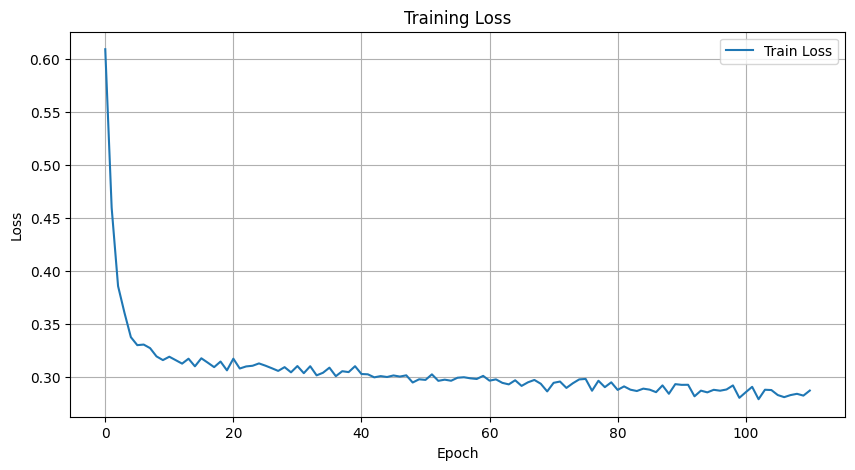

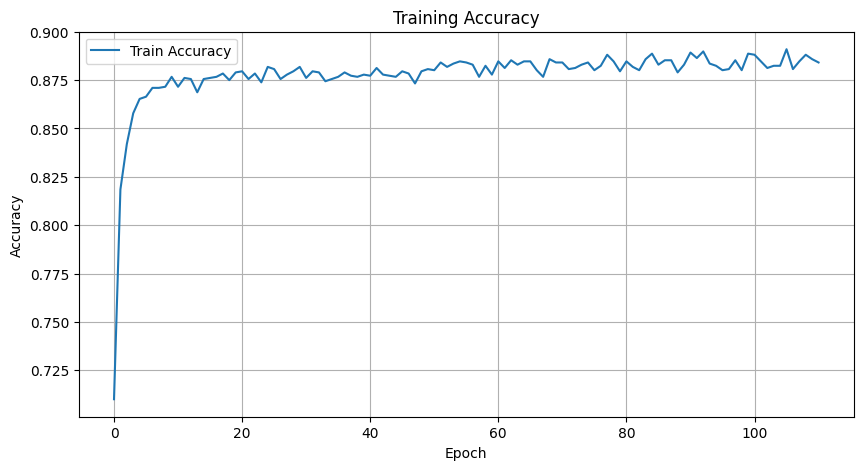

[I 2025-03-06 06:50:57,410] Trial 5 finished with value: 0.8414161903005716 and parameters: {'lr': 0.0033939519502023795, 'hidden_size': 43, 'dropout_rate': 0.18615107109785312, 'batch_size': 128, 'num_epochs': 111}. Best is trial 0 with value: 0.8595137114406891.


Epoch [1/77], Step [10/55], Loss: 0.6987
Epoch [1/77], Step [20/55], Loss: 0.6929
Epoch [1/77], Step [30/55], Loss: 0.7301
Epoch [1/77], Step [40/55], Loss: 0.7049
Epoch [1/77], Step [50/55], Loss: 0.7266
Epoch [1/77], Train Loss: 0.7250, Train Accuracy: 0.4207
Epoch [2/77], Step [10/55], Loss: 0.7403
Epoch [2/77], Step [20/55], Loss: 0.6870
Epoch [2/77], Step [30/55], Loss: 0.7271
Epoch [2/77], Step [40/55], Loss: 0.7216
Epoch [2/77], Step [50/55], Loss: 0.6951
Epoch [2/77], Train Loss: 0.7169, Train Accuracy: 0.4555
Epoch [3/77], Step [10/55], Loss: 0.7114
Epoch [3/77], Step [20/55], Loss: 0.7184
Epoch [3/77], Step [30/55], Loss: 0.6780
Epoch [3/77], Step [40/55], Loss: 0.7032
Epoch [3/77], Step [50/55], Loss: 0.6495
Epoch [3/77], Train Loss: 0.6965, Train Accuracy: 0.5200
Epoch [4/77], Step [10/55], Loss: 0.7328
Epoch [4/77], Step [20/55], Loss: 0.6929
Epoch [4/77], Step [30/55], Loss: 0.7007
Epoch [4/77], Step [40/55], Loss: 0.6823
Epoch [4/77], Step [50/55], Loss: 0.6368
Epoch [4/

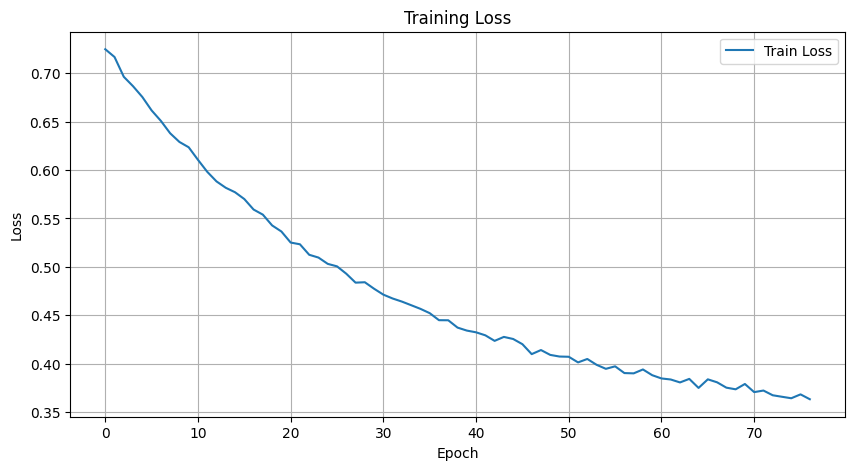

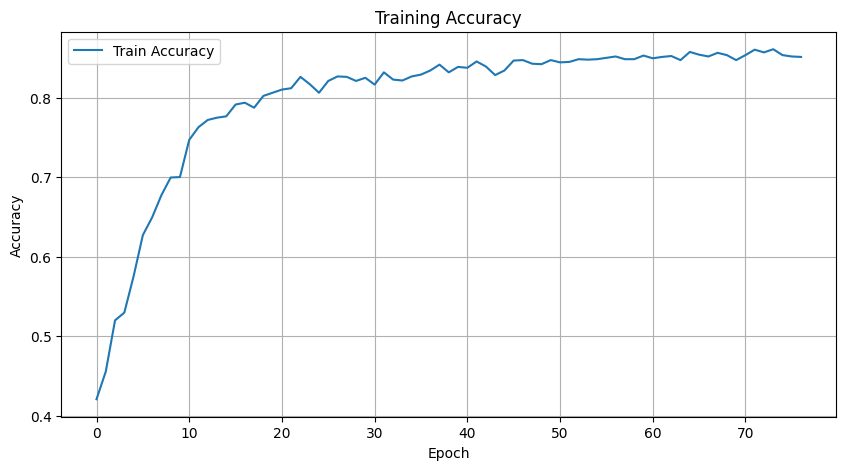

[I 2025-03-06 06:51:06,020] Trial 6 finished with value: 0.8515845209557177 and parameters: {'lr': 3.528822989650962e-05, 'hidden_size': 68, 'dropout_rate': 0.47922792764507005, 'batch_size': 32, 'num_epochs': 77}. Best is trial 0 with value: 0.8595137114406891.


Epoch [1/103], Step [10/28], Loss: 0.6391
Epoch [1/103], Step [20/28], Loss: 0.5460
Epoch [1/103], Train Loss: 0.5637, Train Accuracy: 0.7568
Epoch [2/103], Step [10/28], Loss: 0.3925
Epoch [2/103], Step [20/28], Loss: 0.4183
Epoch [2/103], Train Loss: 0.4505, Train Accuracy: 0.8202
Epoch [3/103], Step [10/28], Loss: 0.3244
Epoch [3/103], Step [20/28], Loss: 0.4071
Epoch [3/103], Train Loss: 0.4020, Train Accuracy: 0.8419
Epoch [4/103], Step [10/28], Loss: 0.5125
Epoch [4/103], Step [20/28], Loss: 0.3147
Epoch [4/103], Train Loss: 0.3741, Train Accuracy: 0.8533
Epoch [5/103], Step [10/28], Loss: 0.5616
Epoch [5/103], Step [20/28], Loss: 0.2013
Epoch [5/103], Train Loss: 0.3536, Train Accuracy: 0.8590
Epoch [6/103], Step [10/28], Loss: 0.2771
Epoch [6/103], Step [20/28], Loss: 0.3691
Epoch [6/103], Train Loss: 0.3493, Train Accuracy: 0.8653
Epoch [7/103], Step [10/28], Loss: 0.4290
Epoch [7/103], Step [20/28], Loss: 0.1931
Epoch [7/103], Train Loss: 0.3471, Train Accuracy: 0.8659
Epoch 

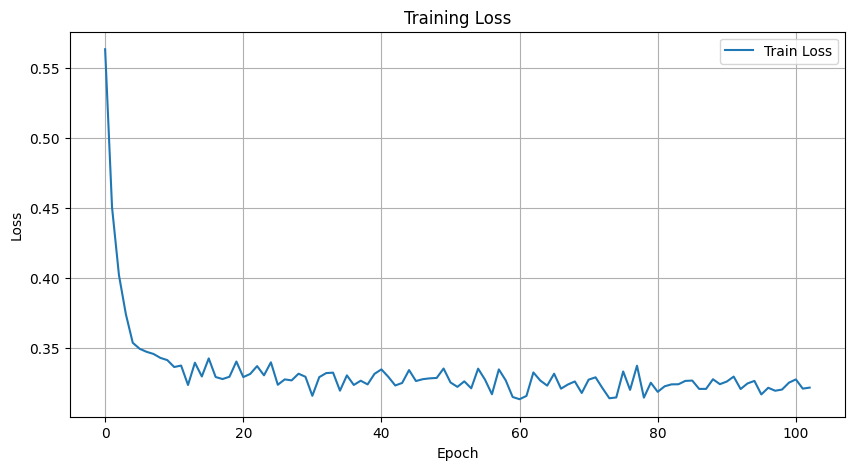

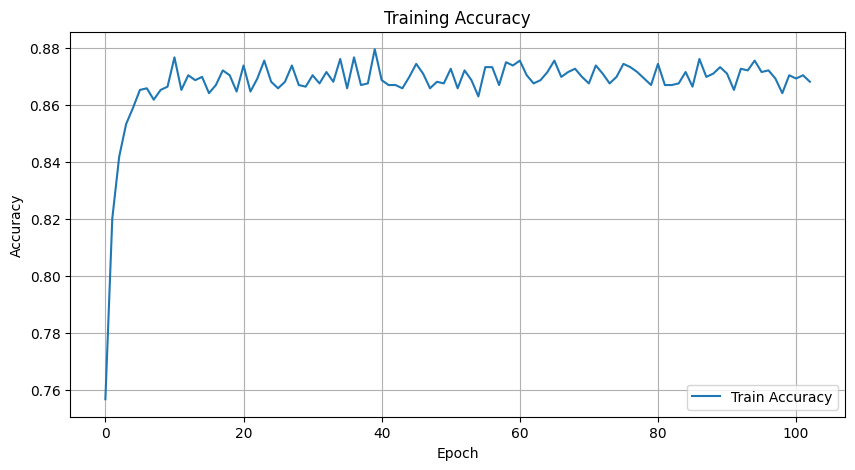

[I 2025-03-06 06:51:12,509] Trial 7 finished with value: 0.8552988593556545 and parameters: {'lr': 0.0034131849646375874, 'hidden_size': 20, 'dropout_rate': 0.49379637491863404, 'batch_size': 64, 'num_epochs': 103}. Best is trial 0 with value: 0.8595137114406891.


Epoch [1/37], Step [10/55], Loss: 0.6892
Epoch [1/37], Step [20/55], Loss: 0.6796
Epoch [1/37], Step [30/55], Loss: 0.7003
Epoch [1/37], Step [40/55], Loss: 0.7202
Epoch [1/37], Step [50/55], Loss: 0.6930
Epoch [1/37], Train Loss: 0.7061, Train Accuracy: 0.4486
Epoch [2/37], Step [10/55], Loss: 0.6958
Epoch [2/37], Step [20/55], Loss: 0.6891
Epoch [2/37], Step [30/55], Loss: 0.6835
Epoch [2/37], Step [40/55], Loss: 0.7226
Epoch [2/37], Step [50/55], Loss: 0.7037
Epoch [2/37], Train Loss: 0.7022, Train Accuracy: 0.4743
Epoch [3/37], Step [10/55], Loss: 0.6912
Epoch [3/37], Step [20/55], Loss: 0.7023
Epoch [3/37], Step [30/55], Loss: 0.7035
Epoch [3/37], Step [40/55], Loss: 0.7002
Epoch [3/37], Step [50/55], Loss: 0.7018
Epoch [3/37], Train Loss: 0.6978, Train Accuracy: 0.4909
Epoch [4/37], Step [10/55], Loss: 0.7050
Epoch [4/37], Step [20/55], Loss: 0.6805
Epoch [4/37], Step [30/55], Loss: 0.6866
Epoch [4/37], Step [40/55], Loss: 0.6802
Epoch [4/37], Step [50/55], Loss: 0.6850
Epoch [4/

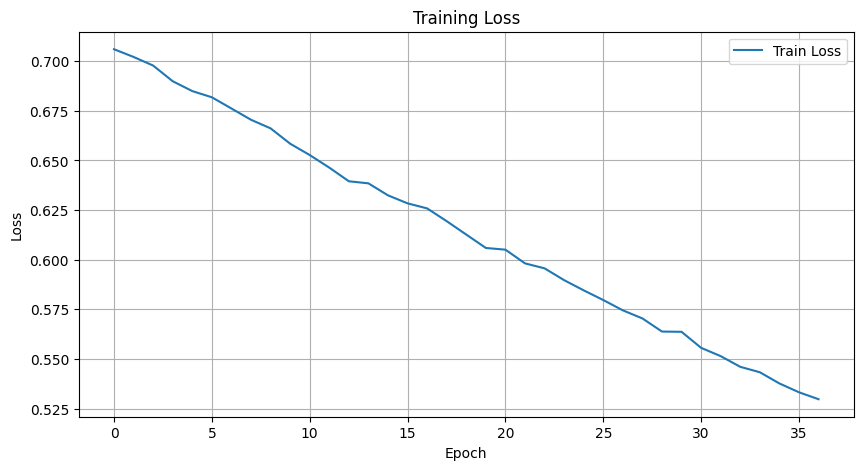

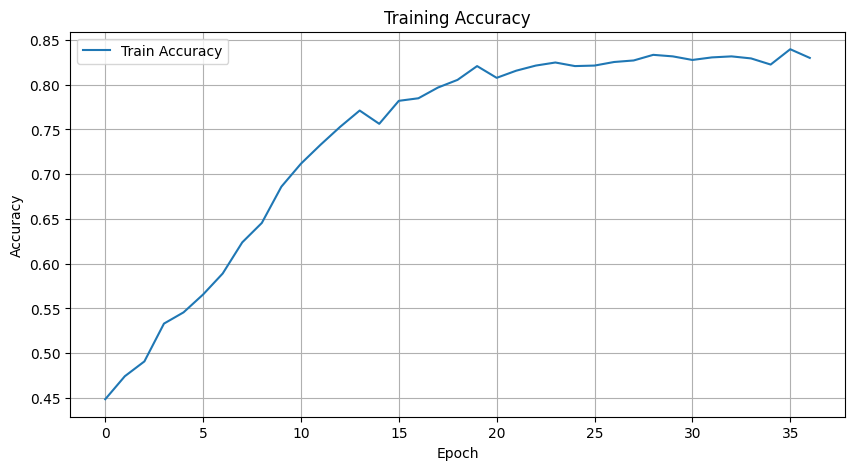

[I 2025-03-06 06:51:16,788] Trial 8 finished with value: 0.8262427227944469 and parameters: {'lr': 3.0377487529851102e-05, 'hidden_size': 30, 'dropout_rate': 0.2655660587342813, 'batch_size': 32, 'num_epochs': 37}. Best is trial 0 with value: 0.8595137114406891.


Epoch [1/179], Step [10/28], Loss: 0.7195
Epoch [1/179], Step [20/28], Loss: 0.7163
Epoch [1/179], Train Loss: 0.7095, Train Accuracy: 0.4635
Epoch [2/179], Step [10/28], Loss: 0.7140
Epoch [2/179], Step [20/28], Loss: 0.7039
Epoch [2/179], Train Loss: 0.7064, Train Accuracy: 0.4669
Epoch [3/179], Step [10/28], Loss: 0.6974
Epoch [3/179], Step [20/28], Loss: 0.6723
Epoch [3/179], Train Loss: 0.7007, Train Accuracy: 0.4817
Epoch [4/179], Step [10/28], Loss: 0.6994
Epoch [4/179], Step [20/28], Loss: 0.6931
Epoch [4/179], Train Loss: 0.6983, Train Accuracy: 0.4971
Epoch [5/179], Step [10/28], Loss: 0.6892
Epoch [5/179], Step [20/28], Loss: 0.6842
Epoch [5/179], Train Loss: 0.6954, Train Accuracy: 0.5120
Epoch [6/179], Step [10/28], Loss: 0.6922
Epoch [6/179], Step [20/28], Loss: 0.6793
Epoch [6/179], Train Loss: 0.6876, Train Accuracy: 0.5354
Epoch [7/179], Step [10/28], Loss: 0.6912
Epoch [7/179], Step [20/28], Loss: 0.6999
Epoch [7/179], Train Loss: 0.6888, Train Accuracy: 0.5337
Epoch 

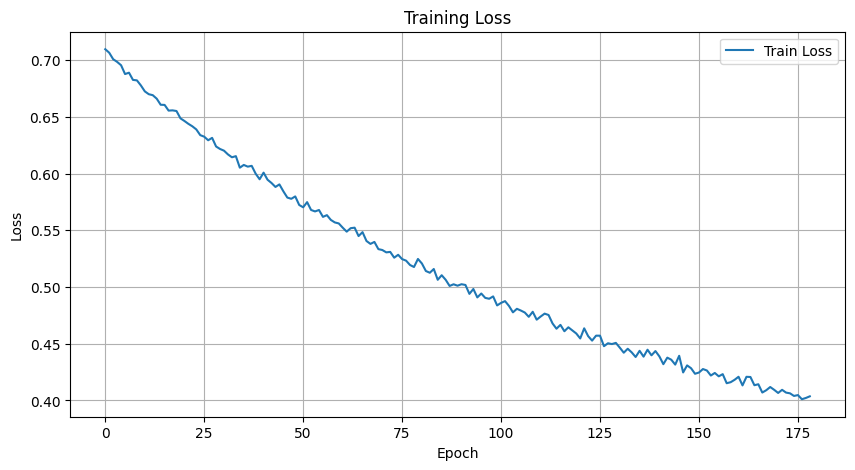

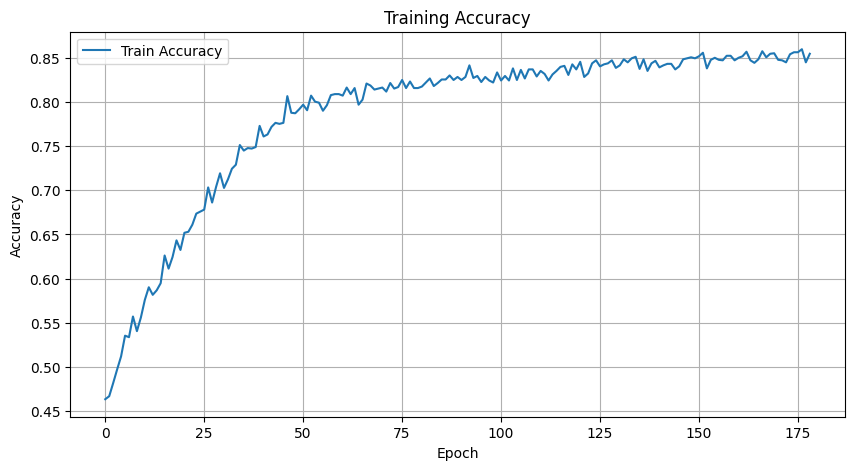

[I 2025-03-06 06:51:28,123] Trial 9 finished with value: 0.8165749058243987 and parameters: {'lr': 1.9437820986501462e-05, 'hidden_size': 51, 'dropout_rate': 0.4599593683813227, 'batch_size': 64, 'num_epochs': 179}. Best is trial 0 with value: 0.8595137114406891.


Epoch [1/84], Step [10/14], Loss: 0.7196
Epoch [1/84], Train Loss: 0.7483, Train Accuracy: 0.3390
Epoch [2/84], Step [10/14], Loss: 0.6507
Epoch [2/84], Train Loss: 0.6659, Train Accuracy: 0.6747
Epoch [3/84], Step [10/14], Loss: 0.5786
Epoch [3/84], Train Loss: 0.5989, Train Accuracy: 0.8282
Epoch [4/84], Step [10/14], Loss: 0.5201
Epoch [4/84], Train Loss: 0.5460, Train Accuracy: 0.8293
Epoch [5/84], Step [10/14], Loss: 0.4677
Epoch [5/84], Train Loss: 0.5042, Train Accuracy: 0.8311
Epoch [6/84], Step [10/14], Loss: 0.4603
Epoch [6/84], Train Loss: 0.4660, Train Accuracy: 0.8430
Epoch [7/84], Step [10/14], Loss: 0.4100
Epoch [7/84], Train Loss: 0.4387, Train Accuracy: 0.8522
Epoch [8/84], Step [10/14], Loss: 0.4264
Epoch [8/84], Train Loss: 0.4139, Train Accuracy: 0.8545
Epoch [9/84], Step [10/14], Loss: 0.3696
Epoch [9/84], Train Loss: 0.3961, Train Accuracy: 0.8567
Epoch [10/84], Step [10/14], Loss: 0.3827
Epoch [10/84], Train Loss: 0.3824, Train Accuracy: 0.8613
Epoch [11/84], Ste

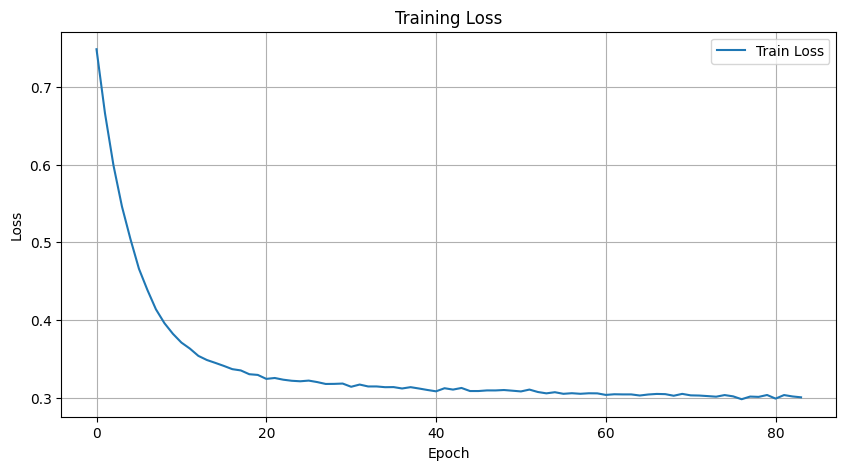

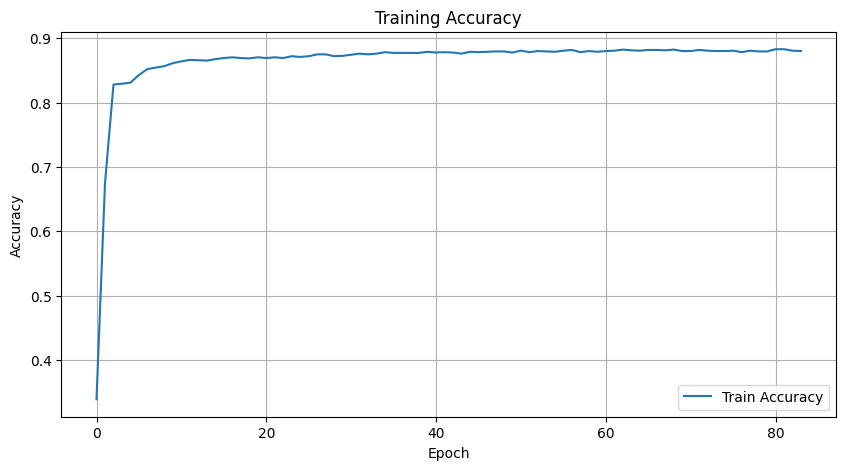

[I 2025-03-06 06:51:31,905] Trial 10 finished with value: 0.8618055372619268 and parameters: {'lr': 0.0005175386326038534, 'hidden_size': 99, 'dropout_rate': 0.020635902716128956, 'batch_size': 128, 'num_epochs': 84}. Best is trial 10 with value: 0.8618055372619268.


Epoch [1/72], Step [10/14], Loss: 0.6529
Epoch [1/72], Train Loss: 0.6783, Train Accuracy: 0.5651
Epoch [2/72], Step [10/14], Loss: 0.6274
Epoch [2/72], Train Loss: 0.6362, Train Accuracy: 0.7414
Epoch [3/72], Step [10/14], Loss: 0.5876
Epoch [3/72], Train Loss: 0.5998, Train Accuracy: 0.7922
Epoch [4/72], Step [10/14], Loss: 0.5671
Epoch [4/72], Train Loss: 0.5700, Train Accuracy: 0.8025
Epoch [5/72], Step [10/14], Loss: 0.5481
Epoch [5/72], Train Loss: 0.5415, Train Accuracy: 0.8139
Epoch [6/72], Step [10/14], Loss: 0.5092
Epoch [6/72], Train Loss: 0.5157, Train Accuracy: 0.8196
Epoch [7/72], Step [10/14], Loss: 0.4925
Epoch [7/72], Train Loss: 0.4933, Train Accuracy: 0.8305
Epoch [8/72], Step [10/14], Loss: 0.4761
Epoch [8/72], Train Loss: 0.4720, Train Accuracy: 0.8373
Epoch [9/72], Step [10/14], Loss: 0.4539
Epoch [9/72], Train Loss: 0.4527, Train Accuracy: 0.8447
Epoch [10/72], Step [10/14], Loss: 0.4591
Epoch [10/72], Train Loss: 0.4364, Train Accuracy: 0.8487
Epoch [11/72], Ste

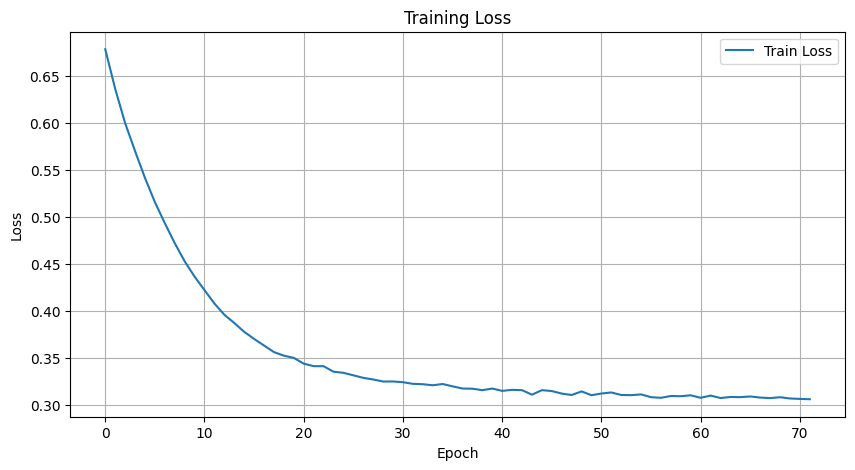

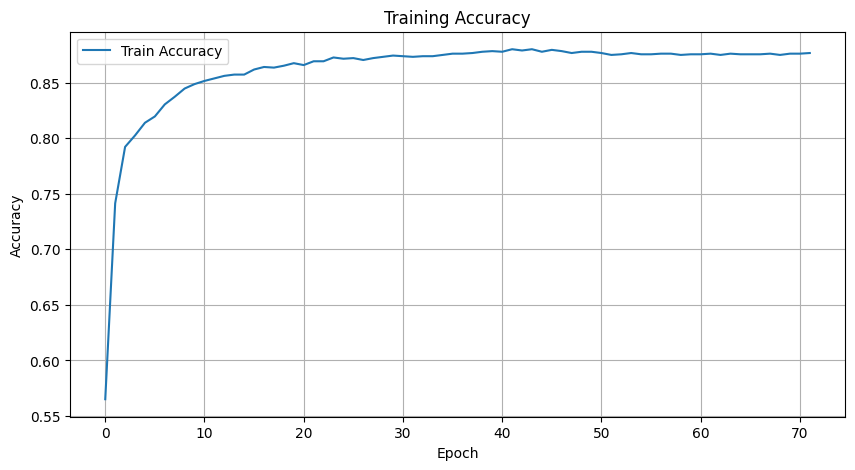

[I 2025-03-06 06:51:35,349] Trial 11 finished with value: 0.8610415953215141 and parameters: {'lr': 0.0003512847872166344, 'hidden_size': 97, 'dropout_rate': 0.0020842873277074764, 'batch_size': 128, 'num_epochs': 72}. Best is trial 10 with value: 0.8618055372619268.


Epoch [1/70], Step [10/14], Loss: 0.6536
Epoch [1/70], Train Loss: 0.6693, Train Accuracy: 0.5976
Epoch [2/70], Step [10/14], Loss: 0.5873
Epoch [2/70], Train Loss: 0.5791, Train Accuracy: 0.8082
Epoch [3/70], Step [10/14], Loss: 0.4851
Epoch [3/70], Train Loss: 0.5150, Train Accuracy: 0.8174
Epoch [4/70], Step [10/14], Loss: 0.4629
Epoch [4/70], Train Loss: 0.4661, Train Accuracy: 0.8385
Epoch [5/70], Step [10/14], Loss: 0.4277
Epoch [5/70], Train Loss: 0.4301, Train Accuracy: 0.8522
Epoch [6/70], Step [10/14], Loss: 0.3830
Epoch [6/70], Train Loss: 0.4024, Train Accuracy: 0.8556
Epoch [7/70], Step [10/14], Loss: 0.3886
Epoch [7/70], Train Loss: 0.3777, Train Accuracy: 0.8602
Epoch [8/70], Step [10/14], Loss: 0.3485
Epoch [8/70], Train Loss: 0.3652, Train Accuracy: 0.8590
Epoch [9/70], Step [10/14], Loss: 0.3928
Epoch [9/70], Train Loss: 0.3528, Train Accuracy: 0.8602
Epoch [10/70], Step [10/14], Loss: 0.2991
Epoch [10/70], Train Loss: 0.3450, Train Accuracy: 0.8619
Epoch [11/70], Ste

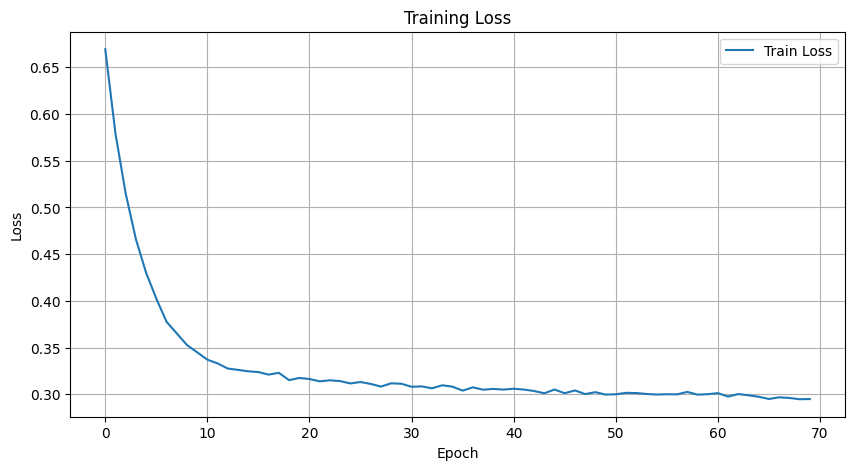

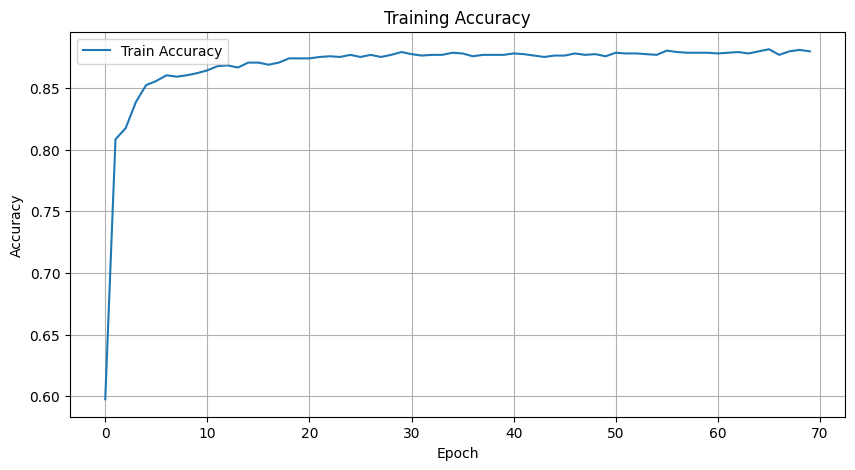

[I 2025-03-06 06:51:39,101] Trial 12 finished with value: 0.8574589710492346 and parameters: {'lr': 0.000762088499892507, 'hidden_size': 98, 'dropout_rate': 0.001180951707259307, 'batch_size': 128, 'num_epochs': 70}. Best is trial 10 with value: 0.8618055372619268.


Epoch [1/65], Step [10/14], Loss: 0.6277
Epoch [1/65], Train Loss: 0.6637, Train Accuracy: 0.6124
Epoch [2/65], Step [10/14], Loss: 0.5565
Epoch [2/65], Train Loss: 0.5627, Train Accuracy: 0.7774
Epoch [3/65], Step [10/14], Loss: 0.5143
Epoch [3/65], Train Loss: 0.4981, Train Accuracy: 0.7922
Epoch [4/65], Step [10/14], Loss: 0.4332
Epoch [4/65], Train Loss: 0.4543, Train Accuracy: 0.8031
Epoch [5/65], Step [10/14], Loss: 0.4610
Epoch [5/65], Train Loss: 0.4216, Train Accuracy: 0.8305
Epoch [6/65], Step [10/14], Loss: 0.3918
Epoch [6/65], Train Loss: 0.3948, Train Accuracy: 0.8430
Epoch [7/65], Step [10/14], Loss: 0.3621
Epoch [7/65], Train Loss: 0.3750, Train Accuracy: 0.8607
Epoch [8/65], Step [10/14], Loss: 0.3050
Epoch [8/65], Train Loss: 0.3588, Train Accuracy: 0.8596
Epoch [9/65], Step [10/14], Loss: 0.3672
Epoch [9/65], Train Loss: 0.3516, Train Accuracy: 0.8624
Epoch [10/65], Step [10/14], Loss: 0.3896
Epoch [10/65], Train Loss: 0.3458, Train Accuracy: 0.8636
Epoch [11/65], Ste

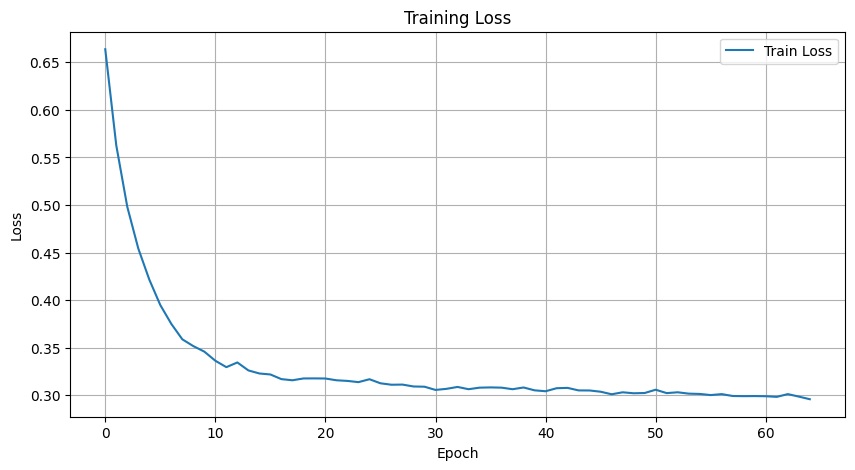

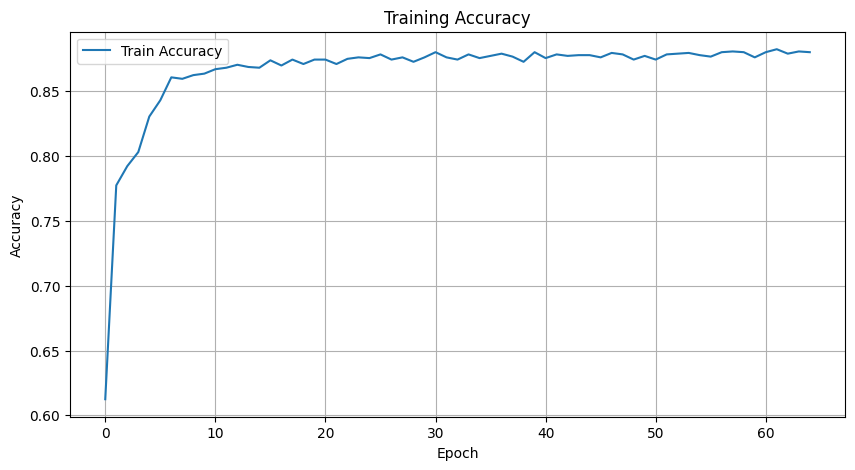

[I 2025-03-06 06:51:42,112] Trial 13 finished with value: 0.861937251389584 and parameters: {'lr': 0.0009195864983214426, 'hidden_size': 100, 'dropout_rate': 0.09623903709546999, 'batch_size': 128, 'num_epochs': 65}. Best is trial 13 with value: 0.861937251389584.


Epoch [1/138], Step [10/14], Loss: 0.5833
Epoch [1/138], Train Loss: 0.6116, Train Accuracy: 0.7540
Epoch [2/138], Step [10/14], Loss: 0.5392
Epoch [2/138], Train Loss: 0.5459, Train Accuracy: 0.7711
Epoch [3/138], Step [10/14], Loss: 0.5072
Epoch [3/138], Train Loss: 0.5021, Train Accuracy: 0.7808
Epoch [4/138], Step [10/14], Loss: 0.4318
Epoch [4/138], Train Loss: 0.4637, Train Accuracy: 0.7945
Epoch [5/138], Step [10/14], Loss: 0.4646
Epoch [5/138], Train Loss: 0.4357, Train Accuracy: 0.8116
Epoch [6/138], Step [10/14], Loss: 0.3802
Epoch [6/138], Train Loss: 0.4131, Train Accuracy: 0.8219
Epoch [7/138], Step [10/14], Loss: 0.3044
Epoch [7/138], Train Loss: 0.3919, Train Accuracy: 0.8368
Epoch [8/138], Step [10/14], Loss: 0.3752
Epoch [8/138], Train Loss: 0.3747, Train Accuracy: 0.8522
Epoch [9/138], Step [10/14], Loss: 0.4021
Epoch [9/138], Train Loss: 0.3645, Train Accuracy: 0.8590
Epoch [10/138], Step [10/14], Loss: 0.3518
Epoch [10/138], Train Loss: 0.3557, Train Accuracy: 0.859

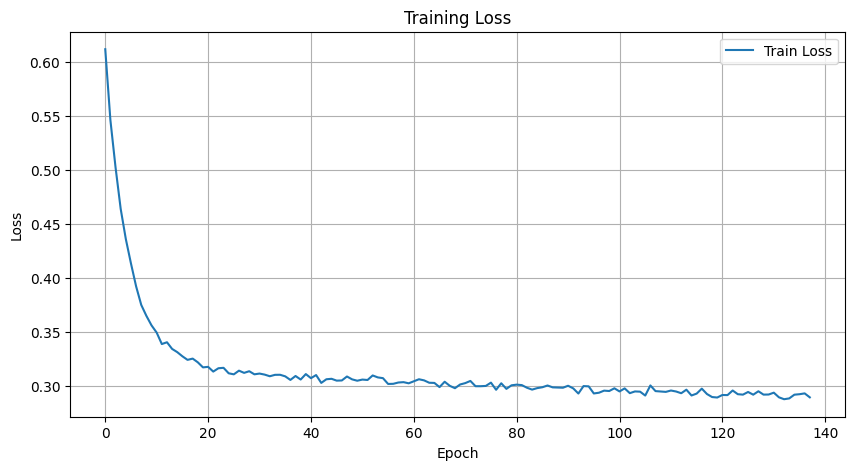

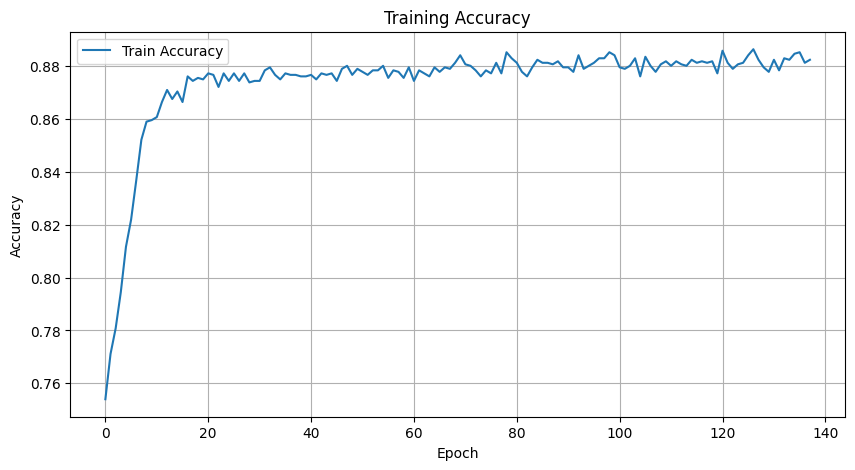

[I 2025-03-06 06:51:47,920] Trial 14 finished with value: 0.8512947498748716 and parameters: {'lr': 0.000822693105727736, 'hidden_size': 66, 'dropout_rate': 0.11867004145055579, 'batch_size': 128, 'num_epochs': 138}. Best is trial 13 with value: 0.861937251389584.


Epoch [1/69], Step [10/14], Loss: 0.6226
Epoch [1/69], Train Loss: 0.6458, Train Accuracy: 0.6712
Epoch [2/69], Step [10/14], Loss: 0.4853
Epoch [2/69], Train Loss: 0.5241, Train Accuracy: 0.7894
Epoch [3/69], Step [10/14], Loss: 0.4702
Epoch [3/69], Train Loss: 0.4453, Train Accuracy: 0.8111
Epoch [4/69], Step [10/14], Loss: 0.3775
Epoch [4/69], Train Loss: 0.3911, Train Accuracy: 0.8562
Epoch [5/69], Step [10/14], Loss: 0.3544
Epoch [5/69], Train Loss: 0.3571, Train Accuracy: 0.8636
Epoch [6/69], Step [10/14], Loss: 0.4537
Epoch [6/69], Train Loss: 0.3376, Train Accuracy: 0.8682
Epoch [7/69], Step [10/14], Loss: 0.4205
Epoch [7/69], Train Loss: 0.3329, Train Accuracy: 0.8704
Epoch [8/69], Step [10/14], Loss: 0.3389
Epoch [8/69], Train Loss: 0.3275, Train Accuracy: 0.8704
Epoch [9/69], Step [10/14], Loss: 0.3883
Epoch [9/69], Train Loss: 0.3232, Train Accuracy: 0.8716
Epoch [10/69], Step [10/14], Loss: 0.3512
Epoch [10/69], Train Loss: 0.3218, Train Accuracy: 0.8767
Epoch [11/69], Ste

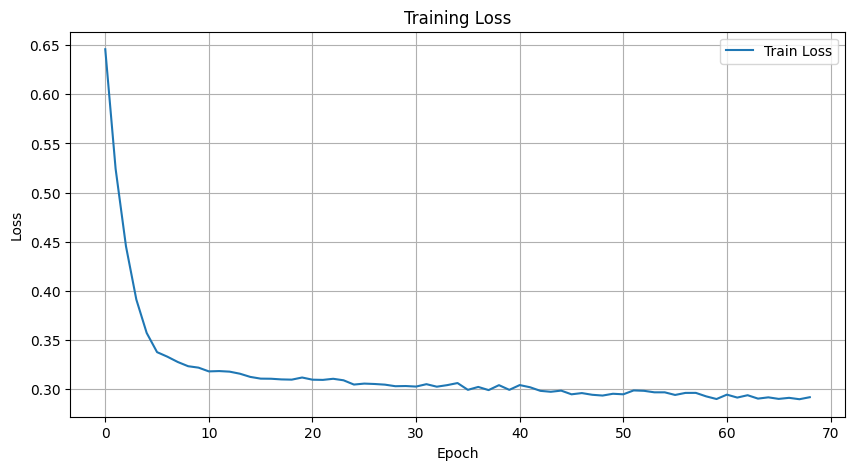

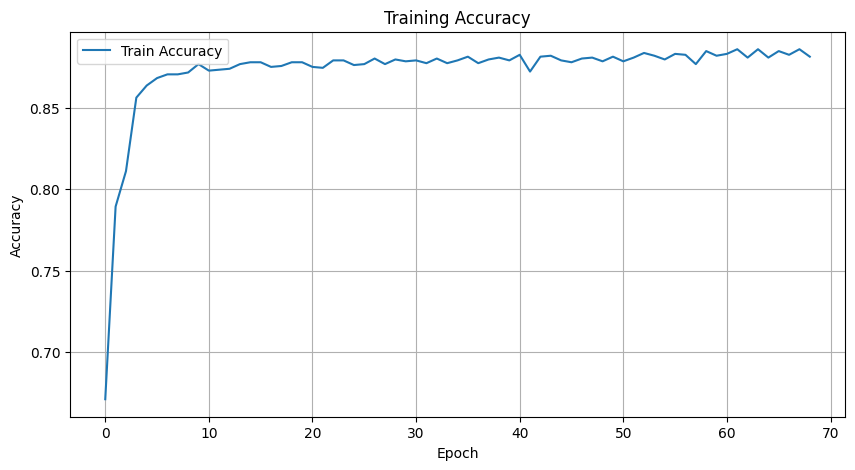

[I 2025-03-06 06:51:51,020] Trial 15 finished with value: 0.8570374858407313 and parameters: {'lr': 0.0014530695862341656, 'hidden_size': 90, 'dropout_rate': 0.10152956487991652, 'batch_size': 128, 'num_epochs': 69}. Best is trial 13 with value: 0.861937251389584.


Epoch [1/10], Step [10/28], Loss: 0.6751
Epoch [1/10], Step [20/28], Loss: 0.6467
Epoch [1/10], Train Loss: 0.6702, Train Accuracy: 0.6267
Epoch [2/10], Step [10/28], Loss: 0.6487
Epoch [2/10], Step [20/28], Loss: 0.6587
Epoch [2/10], Train Loss: 0.6486, Train Accuracy: 0.6821
Epoch [3/10], Step [10/28], Loss: 0.6321
Epoch [3/10], Step [20/28], Loss: 0.6165
Epoch [3/10], Train Loss: 0.6258, Train Accuracy: 0.7426
Epoch [4/10], Step [10/28], Loss: 0.6184
Epoch [4/10], Step [20/28], Loss: 0.5758
Epoch [4/10], Train Loss: 0.6080, Train Accuracy: 0.7580
Epoch [5/10], Step [10/28], Loss: 0.6100
Epoch [5/10], Step [20/28], Loss: 0.5667
Epoch [5/10], Train Loss: 0.5917, Train Accuracy: 0.7671
Epoch [6/10], Step [10/28], Loss: 0.5688
Epoch [6/10], Step [20/28], Loss: 0.5699
Epoch [6/10], Train Loss: 0.5725, Train Accuracy: 0.7797
Epoch [7/10], Step [10/28], Loss: 0.5460
Epoch [7/10], Step [20/28], Loss: 0.5658
Epoch [7/10], Train Loss: 0.5626, Train Accuracy: 0.7814
Epoch [8/10], Step [10/28],

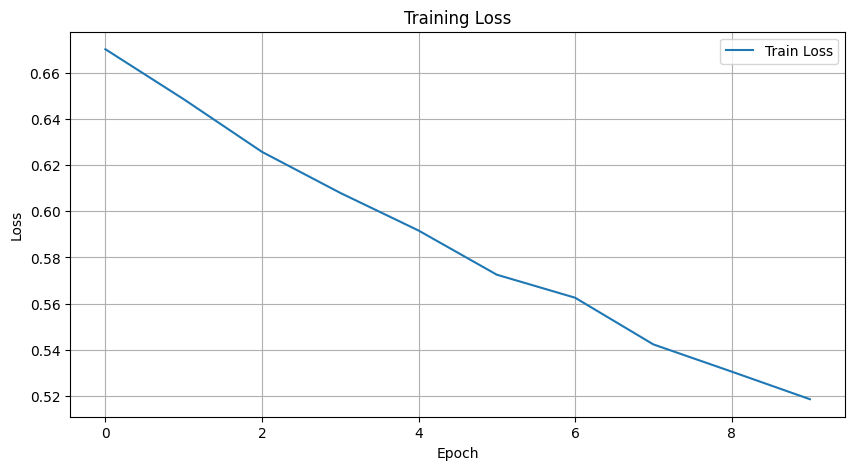

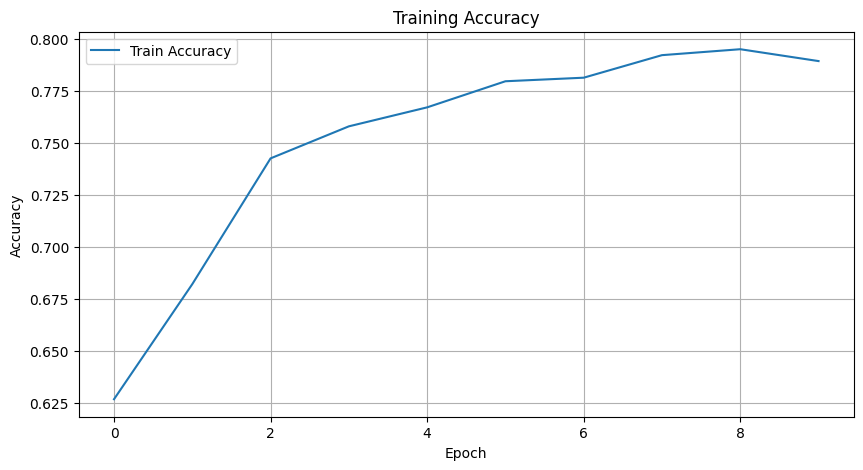

[I 2025-03-06 06:51:52,078] Trial 16 finished with value: 0.7917863069992886 and parameters: {'lr': 0.00011570359618445573, 'hidden_size': 74, 'dropout_rate': 0.27208541164763983, 'batch_size': 64, 'num_epochs': 10}. Best is trial 13 with value: 0.861937251389584.


Epoch [1/54], Step [10/14], Loss: 0.5345
Epoch [1/54], Train Loss: 0.4623, Train Accuracy: 0.7814
Epoch [2/54], Step [10/14], Loss: 0.3793
Epoch [2/54], Train Loss: 0.3465, Train Accuracy: 0.8642
Epoch [3/54], Step [10/14], Loss: 0.2634
Epoch [3/54], Train Loss: 0.3217, Train Accuracy: 0.8727
Epoch [4/54], Step [10/14], Loss: 0.3784
Epoch [4/54], Train Loss: 0.3185, Train Accuracy: 0.8756
Epoch [5/54], Step [10/14], Loss: 0.3366
Epoch [5/54], Train Loss: 0.3220, Train Accuracy: 0.8733
Epoch [6/54], Step [10/14], Loss: 0.3528
Epoch [6/54], Train Loss: 0.3166, Train Accuracy: 0.8750
Epoch [7/54], Step [10/14], Loss: 0.3658
Epoch [7/54], Train Loss: 0.3139, Train Accuracy: 0.8744
Epoch [8/54], Step [10/14], Loss: 0.2986
Epoch [8/54], Train Loss: 0.3104, Train Accuracy: 0.8750
Epoch [9/54], Step [10/14], Loss: 0.2769
Epoch [9/54], Train Loss: 0.3042, Train Accuracy: 0.8784
Epoch [10/54], Step [10/14], Loss: 0.2813
Epoch [10/54], Train Loss: 0.3094, Train Accuracy: 0.8767
Epoch [11/54], Ste

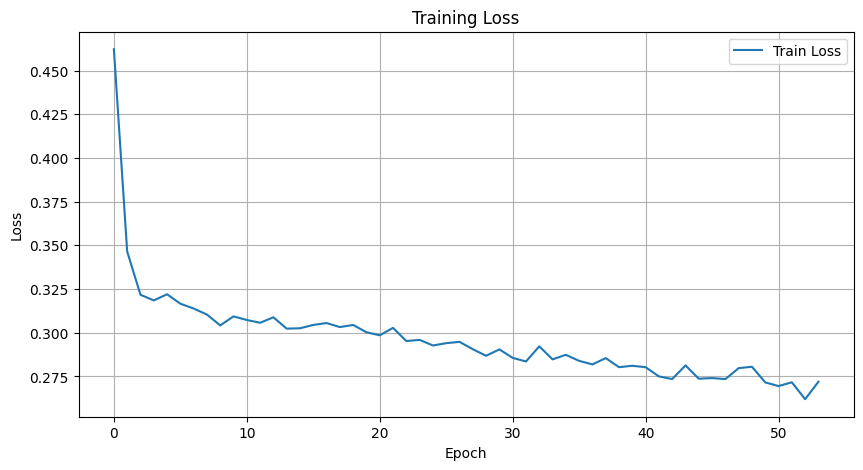

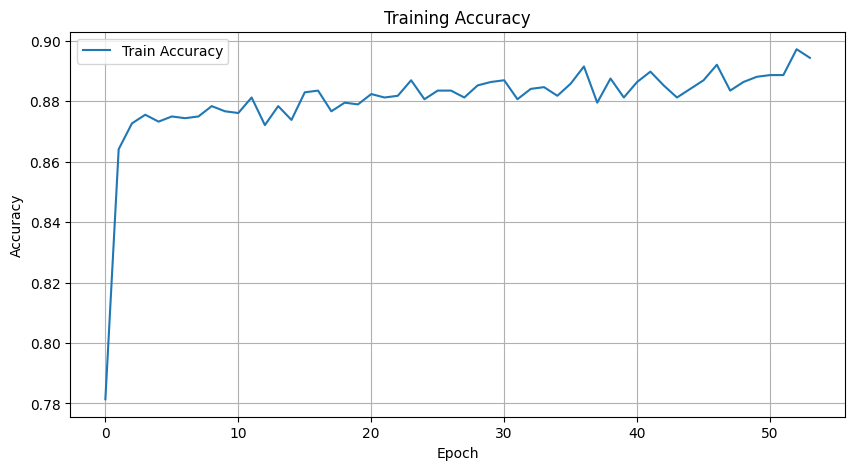

[I 2025-03-06 06:51:54,756] Trial 17 finished with value: 0.8477911540791866 and parameters: {'lr': 0.008854323422753503, 'hidden_size': 99, 'dropout_rate': 0.17131633309502486, 'batch_size': 128, 'num_epochs': 54}. Best is trial 13 with value: 0.861937251389584.


Epoch [1/132], Step [10/14], Loss: 0.7247
Epoch [1/132], Train Loss: 0.7541, Train Accuracy: 0.3436
Epoch [2/132], Step [10/14], Loss: 0.6398
Epoch [2/132], Train Loss: 0.6430, Train Accuracy: 0.6341
Epoch [3/132], Step [10/14], Loss: 0.5648
Epoch [3/132], Train Loss: 0.5628, Train Accuracy: 0.8231
Epoch [4/132], Step [10/14], Loss: 0.5054
Epoch [4/132], Train Loss: 0.5055, Train Accuracy: 0.8390
Epoch [5/132], Step [10/14], Loss: 0.4820
Epoch [5/132], Train Loss: 0.4605, Train Accuracy: 0.8453
Epoch [6/132], Step [10/14], Loss: 0.4769
Epoch [6/132], Train Loss: 0.4241, Train Accuracy: 0.8510
Epoch [7/132], Step [10/14], Loss: 0.3308
Epoch [7/132], Train Loss: 0.4001, Train Accuracy: 0.8550
Epoch [8/132], Step [10/14], Loss: 0.3550
Epoch [8/132], Train Loss: 0.3773, Train Accuracy: 0.8636
Epoch [9/132], Step [10/14], Loss: 0.3572
Epoch [9/132], Train Loss: 0.3603, Train Accuracy: 0.8630
Epoch [10/132], Step [10/14], Loss: 0.3423
Epoch [10/132], Train Loss: 0.3526, Train Accuracy: 0.862

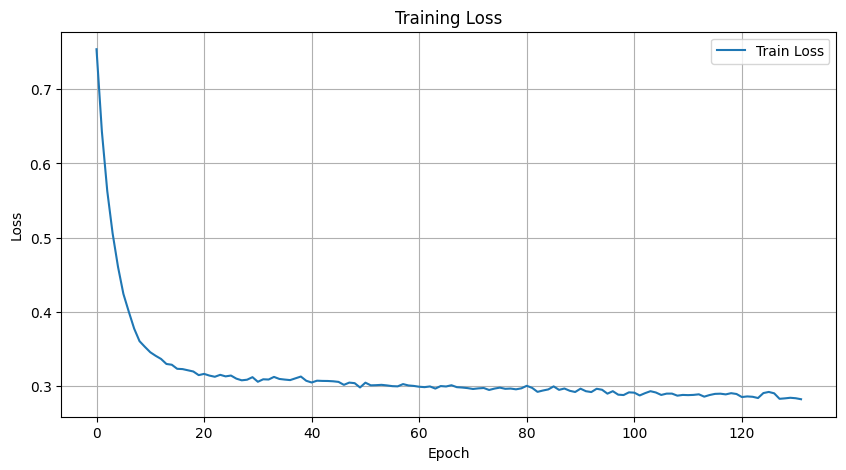

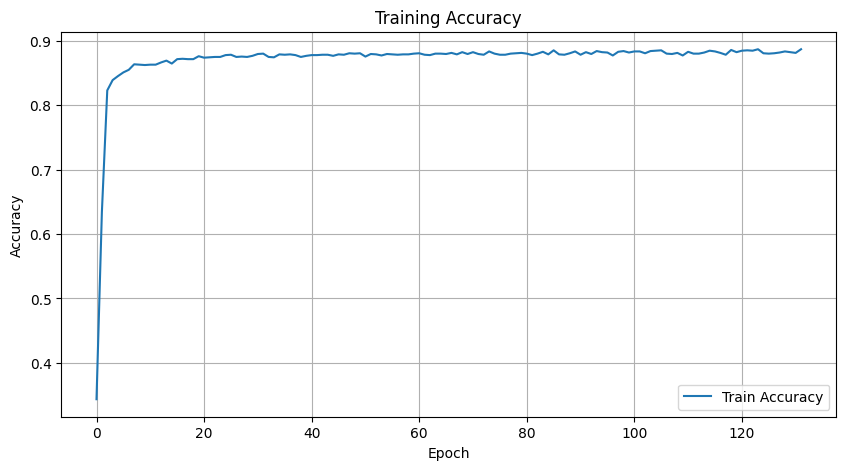

[I 2025-03-06 06:52:00,371] Trial 18 finished with value: 0.8503464081557387 and parameters: {'lr': 0.0008010908394358194, 'hidden_size': 88, 'dropout_rate': 0.06210546446156433, 'batch_size': 128, 'num_epochs': 132}. Best is trial 13 with value: 0.861937251389584.


Epoch [1/91], Step [10/28], Loss: 0.7175
Epoch [1/91], Step [20/28], Loss: 0.7060
Epoch [1/91], Train Loss: 0.7210, Train Accuracy: 0.3881
Epoch [2/91], Step [10/28], Loss: 0.6707
Epoch [2/91], Step [20/28], Loss: 0.6639
Epoch [2/91], Train Loss: 0.6727, Train Accuracy: 0.5890
Epoch [3/91], Step [10/28], Loss: 0.6249
Epoch [3/91], Step [20/28], Loss: 0.6353
Epoch [3/91], Train Loss: 0.6328, Train Accuracy: 0.7226
Epoch [4/91], Step [10/28], Loss: 0.6090
Epoch [4/91], Step [20/28], Loss: 0.5957
Epoch [4/91], Train Loss: 0.6008, Train Accuracy: 0.7728
Epoch [5/91], Step [10/28], Loss: 0.5632
Epoch [5/91], Step [20/28], Loss: 0.5803
Epoch [5/91], Train Loss: 0.5706, Train Accuracy: 0.7985
Epoch [6/91], Step [10/28], Loss: 0.5537
Epoch [6/91], Step [20/28], Loss: 0.5469
Epoch [6/91], Train Loss: 0.5423, Train Accuracy: 0.8242
Epoch [7/91], Step [10/28], Loss: 0.5196
Epoch [7/91], Step [20/28], Loss: 0.5076
Epoch [7/91], Train Loss: 0.5199, Train Accuracy: 0.8242
Epoch [8/91], Step [10/28],

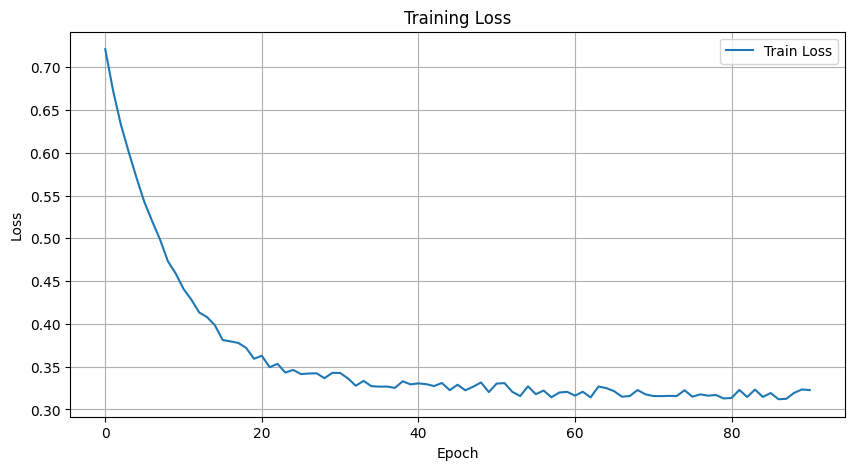

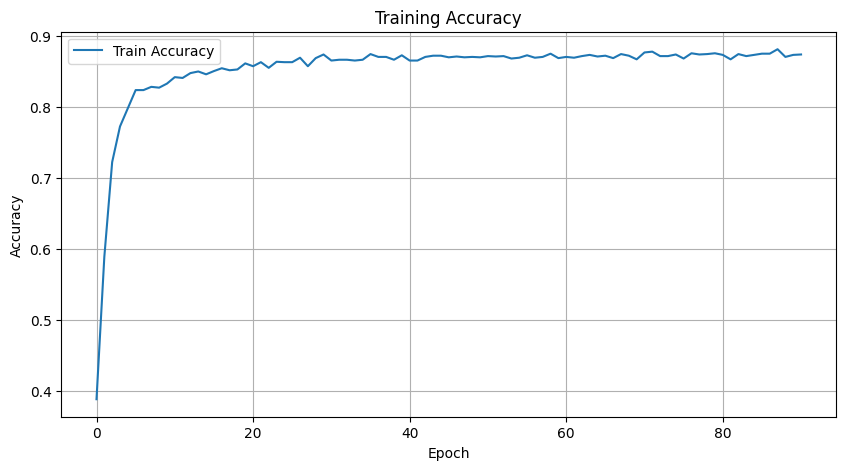

[I 2025-03-06 06:52:06,186] Trial 19 finished with value: 0.857643370827955 and parameters: {'lr': 0.0002216681659269313, 'hidden_size': 77, 'dropout_rate': 0.3571579392056312, 'batch_size': 64, 'num_epochs': 91}. Best is trial 13 with value: 0.861937251389584.


Epoch [1/52], Step [10/14], Loss: 0.5360
Epoch [1/52], Train Loss: 0.5693, Train Accuracy: 0.7631
Epoch [2/52], Step [10/14], Loss: 0.4471
Epoch [2/52], Train Loss: 0.4512, Train Accuracy: 0.8265
Epoch [3/52], Step [10/14], Loss: 0.3863
Epoch [3/52], Train Loss: 0.3923, Train Accuracy: 0.8470
Epoch [4/52], Step [10/14], Loss: 0.3364
Epoch [4/52], Train Loss: 0.3600, Train Accuracy: 0.8579
Epoch [5/52], Step [10/14], Loss: 0.3759
Epoch [5/52], Train Loss: 0.3458, Train Accuracy: 0.8647
Epoch [6/52], Step [10/14], Loss: 0.3251
Epoch [6/52], Train Loss: 0.3314, Train Accuracy: 0.8676
Epoch [7/52], Step [10/14], Loss: 0.3851
Epoch [7/52], Train Loss: 0.3328, Train Accuracy: 0.8687
Epoch [8/52], Step [10/14], Loss: 0.3203
Epoch [8/52], Train Loss: 0.3207, Train Accuracy: 0.8739
Epoch [9/52], Step [10/14], Loss: 0.3116
Epoch [9/52], Train Loss: 0.3209, Train Accuracy: 0.8756
Epoch [10/52], Step [10/14], Loss: 0.2845
Epoch [10/52], Train Loss: 0.3202, Train Accuracy: 0.8733
Epoch [11/52], Ste

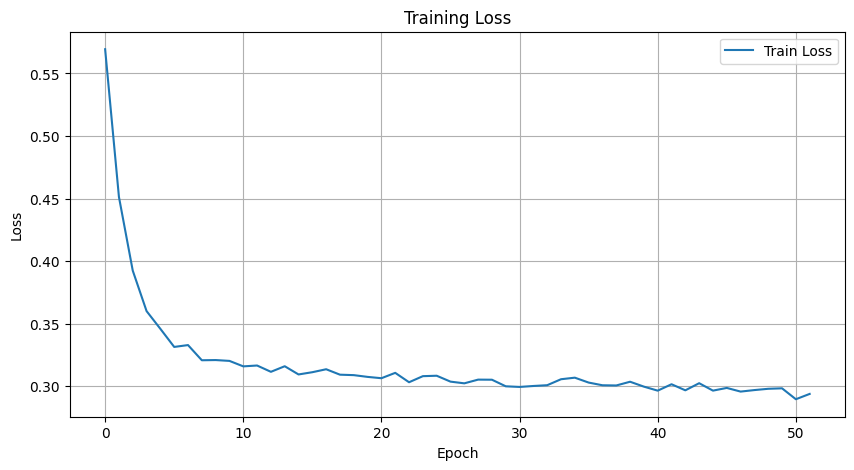

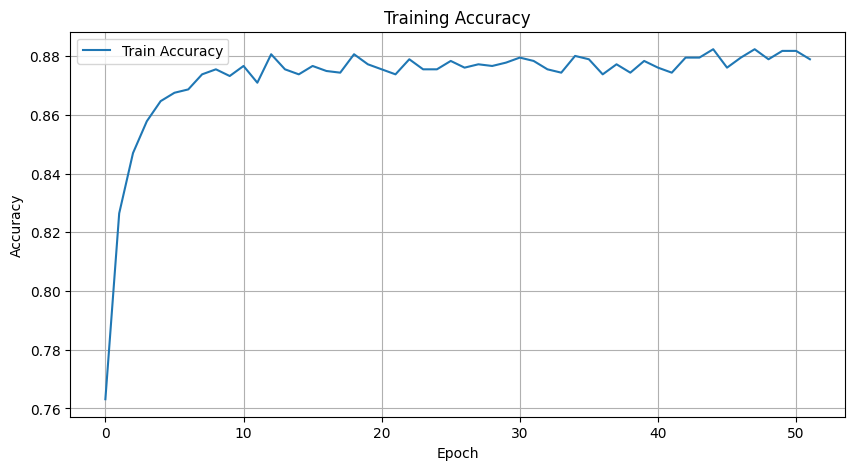

[I 2025-03-06 06:52:08,641] Trial 20 finished with value: 0.8566160006322279 and parameters: {'lr': 0.001660690816696484, 'hidden_size': 92, 'dropout_rate': 0.15035801923126146, 'batch_size': 128, 'num_epochs': 52}. Best is trial 13 with value: 0.861937251389584.


Epoch [1/78], Step [10/14], Loss: 0.6445
Epoch [1/78], Train Loss: 0.6503, Train Accuracy: 0.7038
Epoch [2/78], Step [10/14], Loss: 0.6029
Epoch [2/78], Train Loss: 0.5978, Train Accuracy: 0.7882
Epoch [3/78], Step [10/14], Loss: 0.5580
Epoch [3/78], Train Loss: 0.5532, Train Accuracy: 0.8151
Epoch [4/78], Step [10/14], Loss: 0.5239
Epoch [4/78], Train Loss: 0.5175, Train Accuracy: 0.8242
Epoch [5/78], Step [10/14], Loss: 0.4762
Epoch [5/78], Train Loss: 0.4889, Train Accuracy: 0.8265
Epoch [6/78], Step [10/14], Loss: 0.4794
Epoch [6/78], Train Loss: 0.4628, Train Accuracy: 0.8333
Epoch [7/78], Step [10/14], Loss: 0.4522
Epoch [7/78], Train Loss: 0.4407, Train Accuracy: 0.8396
Epoch [8/78], Step [10/14], Loss: 0.4229
Epoch [8/78], Train Loss: 0.4251, Train Accuracy: 0.8470
Epoch [9/78], Step [10/14], Loss: 0.4765
Epoch [9/78], Train Loss: 0.4087, Train Accuracy: 0.8493
Epoch [10/78], Step [10/14], Loss: 0.4307
Epoch [10/78], Train Loss: 0.3951, Train Accuracy: 0.8527
Epoch [11/78], Ste

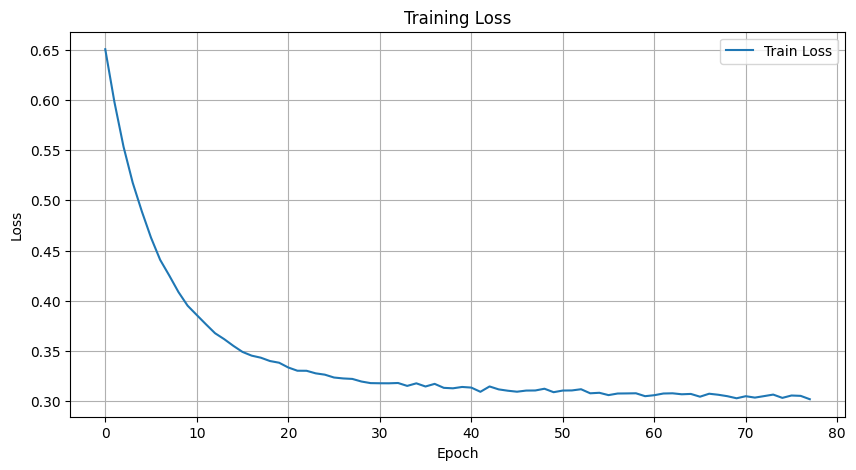

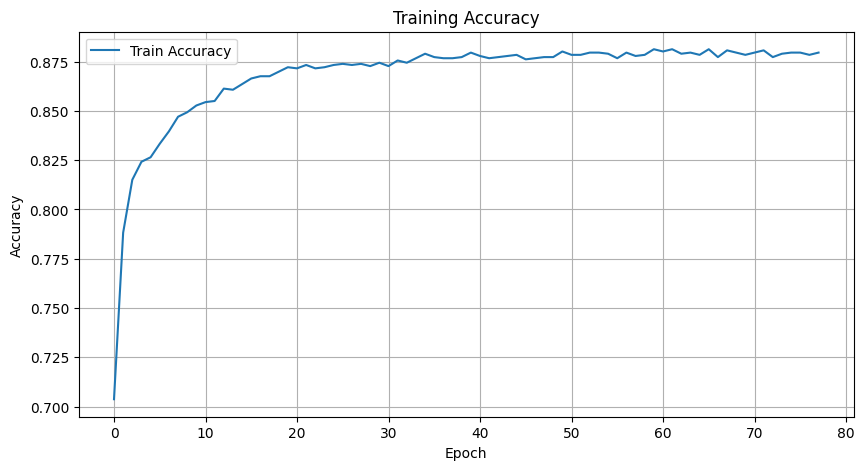

[I 2025-03-06 06:52:12,098] Trial 21 finished with value: 0.8630173072363743 and parameters: {'lr': 0.00039585522148088254, 'hidden_size': 99, 'dropout_rate': 0.015431292442559315, 'batch_size': 128, 'num_epochs': 78}. Best is trial 21 with value: 0.8630173072363743.


Epoch [1/118], Step [10/14], Loss: 0.5919
Epoch [1/118], Train Loss: 0.6214, Train Accuracy: 0.7574
Epoch [2/118], Step [10/14], Loss: 0.5634
Epoch [2/118], Train Loss: 0.5718, Train Accuracy: 0.7643
Epoch [3/118], Step [10/14], Loss: 0.5194
Epoch [3/118], Train Loss: 0.5296, Train Accuracy: 0.7711
Epoch [4/118], Step [10/14], Loss: 0.4897
Epoch [4/118], Train Loss: 0.4952, Train Accuracy: 0.7820
Epoch [5/118], Step [10/14], Loss: 0.4647
Epoch [5/118], Train Loss: 0.4686, Train Accuracy: 0.7951
Epoch [6/118], Step [10/14], Loss: 0.4463
Epoch [6/118], Train Loss: 0.4442, Train Accuracy: 0.8134
Epoch [7/118], Step [10/14], Loss: 0.4901
Epoch [7/118], Train Loss: 0.4223, Train Accuracy: 0.8339
Epoch [8/118], Step [10/14], Loss: 0.4068
Epoch [8/118], Train Loss: 0.4062, Train Accuracy: 0.8408
Epoch [9/118], Step [10/14], Loss: 0.3905
Epoch [9/118], Train Loss: 0.3920, Train Accuracy: 0.8470
Epoch [10/118], Step [10/14], Loss: 0.3658
Epoch [10/118], Train Loss: 0.3799, Train Accuracy: 0.856

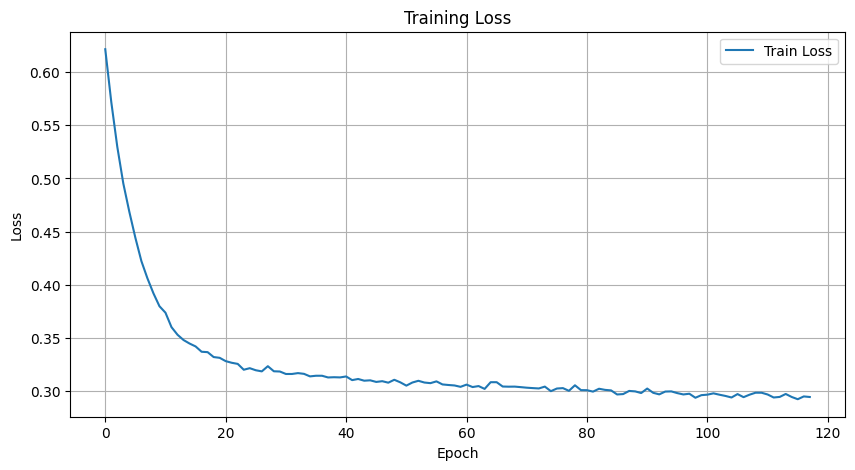

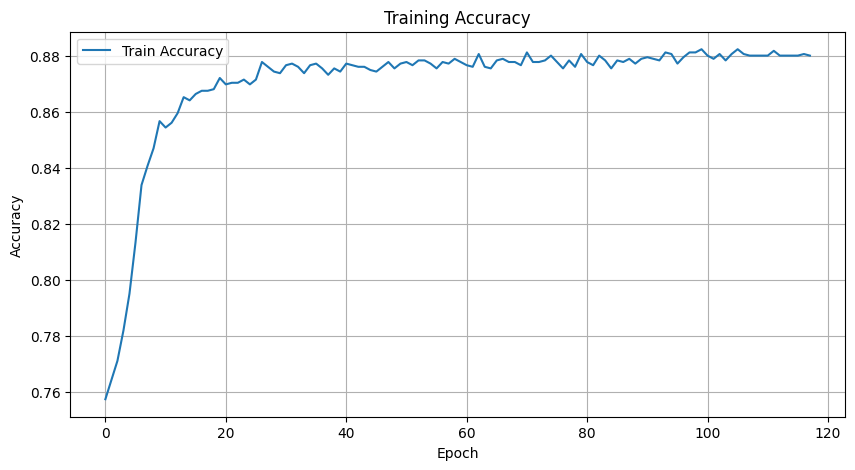

[I 2025-03-06 06:52:17,012] Trial 22 finished with value: 0.8633070783172202 and parameters: {'lr': 0.00047736637319962817, 'hidden_size': 93, 'dropout_rate': 0.05644141652540647, 'batch_size': 128, 'num_epochs': 118}. Best is trial 22 with value: 0.8633070783172202.


Epoch [1/118], Step [10/14], Loss: 0.6639
Epoch [1/118], Train Loss: 0.6684, Train Accuracy: 0.6370
Epoch [2/118], Step [10/14], Loss: 0.6613
Epoch [2/118], Train Loss: 0.6568, Train Accuracy: 0.6918
Epoch [3/118], Step [10/14], Loss: 0.6451
Epoch [3/118], Train Loss: 0.6470, Train Accuracy: 0.7112
Epoch [4/118], Step [10/14], Loss: 0.6335
Epoch [4/118], Train Loss: 0.6367, Train Accuracy: 0.7494
Epoch [5/118], Step [10/14], Loss: 0.6373
Epoch [5/118], Train Loss: 0.6247, Train Accuracy: 0.7660
Epoch [6/118], Step [10/14], Loss: 0.6370
Epoch [6/118], Train Loss: 0.6156, Train Accuracy: 0.7900
Epoch [7/118], Step [10/14], Loss: 0.6113
Epoch [7/118], Train Loss: 0.6060, Train Accuracy: 0.7917
Epoch [8/118], Step [10/14], Loss: 0.5798
Epoch [8/118], Train Loss: 0.5970, Train Accuracy: 0.8031
Epoch [9/118], Step [10/14], Loss: 0.6047
Epoch [9/118], Train Loss: 0.5903, Train Accuracy: 0.8151
Epoch [10/118], Step [10/14], Loss: 0.5692
Epoch [10/118], Train Loss: 0.5815, Train Accuracy: 0.817

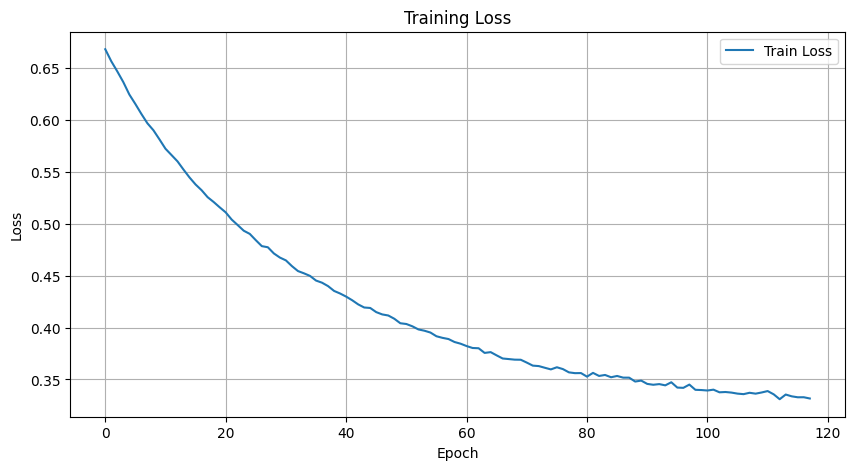

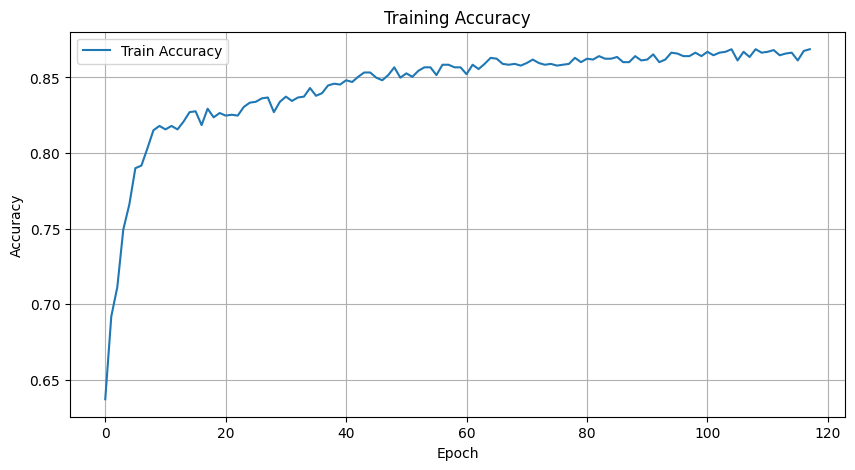

[I 2025-03-06 06:52:22,130] Trial 23 finished with value: 0.8615157661810806 and parameters: {'lr': 7.422079378616422e-05, 'hidden_size': 93, 'dropout_rate': 0.06400105810336959, 'batch_size': 128, 'num_epochs': 118}. Best is trial 22 with value: 0.8633070783172202.


Epoch [1/153], Step [10/14], Loss: 0.5633
Epoch [1/153], Train Loss: 0.6037, Train Accuracy: 0.7420
Epoch [2/153], Step [10/14], Loss: 0.4595
Epoch [2/153], Train Loss: 0.4776, Train Accuracy: 0.8248
Epoch [3/153], Step [10/14], Loss: 0.4337
Epoch [3/153], Train Loss: 0.4050, Train Accuracy: 0.8413
Epoch [4/153], Step [10/14], Loss: 0.3024
Epoch [4/153], Train Loss: 0.3665, Train Accuracy: 0.8573
Epoch [5/153], Step [10/14], Loss: 0.3339
Epoch [5/153], Train Loss: 0.3495, Train Accuracy: 0.8556
Epoch [6/153], Step [10/14], Loss: 0.3160
Epoch [6/153], Train Loss: 0.3369, Train Accuracy: 0.8676
Epoch [7/153], Step [10/14], Loss: 0.3152
Epoch [7/153], Train Loss: 0.3358, Train Accuracy: 0.8670
Epoch [8/153], Step [10/14], Loss: 0.3124
Epoch [8/153], Train Loss: 0.3315, Train Accuracy: 0.8687
Epoch [9/153], Step [10/14], Loss: 0.3036
Epoch [9/153], Train Loss: 0.3327, Train Accuracy: 0.8704
Epoch [10/153], Step [10/14], Loss: 0.3014
Epoch [10/153], Train Loss: 0.3198, Train Accuracy: 0.871

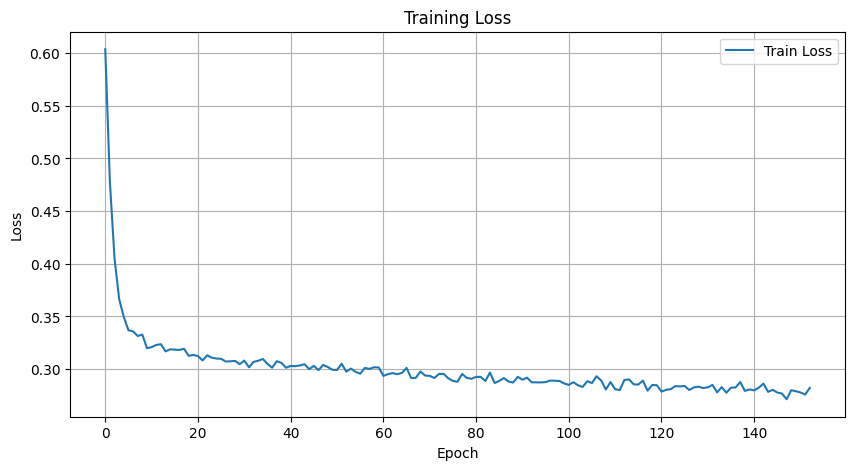

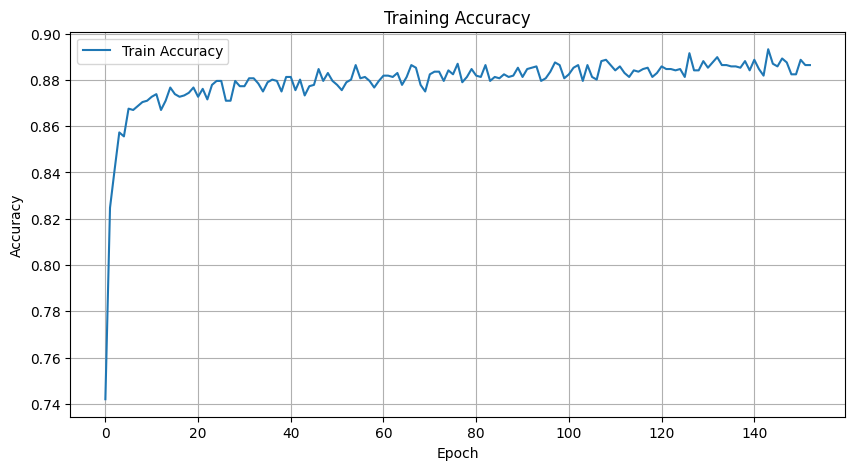

[I 2025-03-06 06:52:28,723] Trial 24 finished with value: 0.8459998419430468 and parameters: {'lr': 0.001495456686373424, 'hidden_size': 86, 'dropout_rate': 0.21266510779647524, 'batch_size': 128, 'num_epochs': 153}. Best is trial 22 with value: 0.8633070783172202.


Epoch [1/52], Step [10/14], Loss: 0.6221
Epoch [1/52], Train Loss: 0.6280, Train Accuracy: 0.7443
Epoch [2/52], Step [10/14], Loss: 0.6327
Epoch [2/52], Train Loss: 0.6052, Train Accuracy: 0.7614
Epoch [3/52], Step [10/14], Loss: 0.5798
Epoch [3/52], Train Loss: 0.5850, Train Accuracy: 0.7700
Epoch [4/52], Step [10/14], Loss: 0.5531
Epoch [4/52], Train Loss: 0.5664, Train Accuracy: 0.7791
Epoch [5/52], Step [10/14], Loss: 0.5682
Epoch [5/52], Train Loss: 0.5504, Train Accuracy: 0.7928
Epoch [6/52], Step [10/14], Loss: 0.5285
Epoch [6/52], Train Loss: 0.5349, Train Accuracy: 0.7911
Epoch [7/52], Step [10/14], Loss: 0.5115
Epoch [7/52], Train Loss: 0.5202, Train Accuracy: 0.8031
Epoch [8/52], Step [10/14], Loss: 0.5207
Epoch [8/52], Train Loss: 0.5064, Train Accuracy: 0.8071
Epoch [9/52], Step [10/14], Loss: 0.4954
Epoch [9/52], Train Loss: 0.4947, Train Accuracy: 0.8145
Epoch [10/52], Step [10/14], Loss: 0.5089
Epoch [10/52], Train Loss: 0.4848, Train Accuracy: 0.8099
Epoch [11/52], Ste

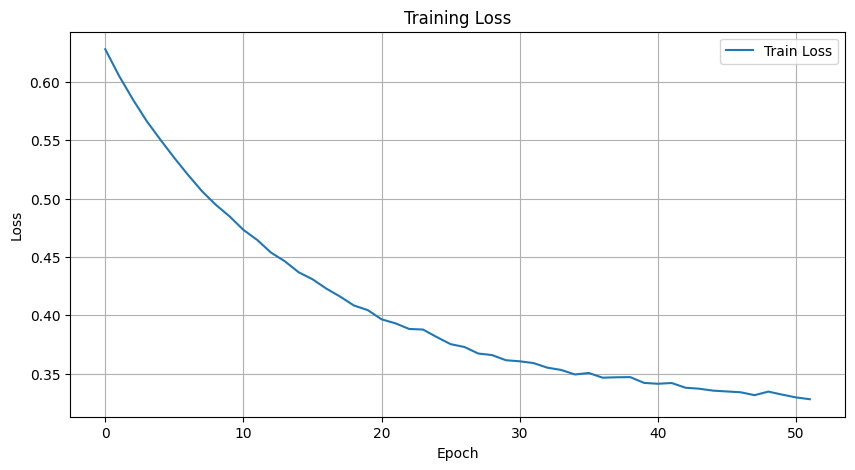

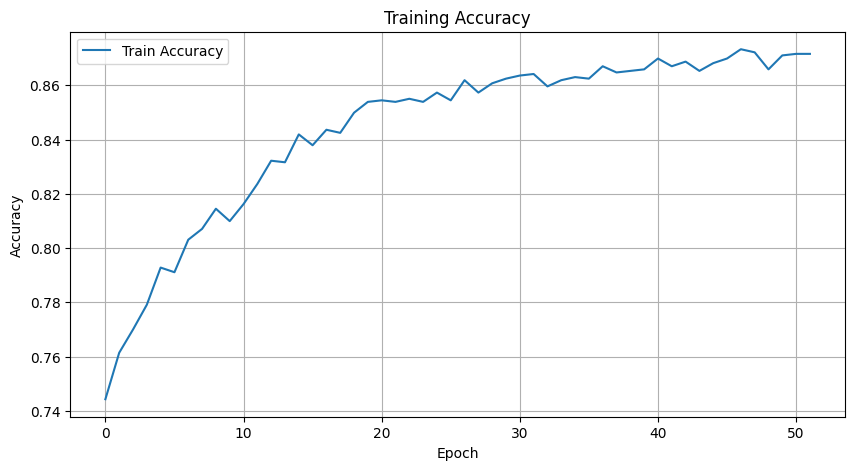

[I 2025-03-06 06:52:31,198] Trial 25 finished with value: 0.8596981112194093 and parameters: {'lr': 0.000218752563598922, 'hidden_size': 69, 'dropout_rate': 0.08417281202187504, 'batch_size': 128, 'num_epochs': 52}. Best is trial 22 with value: 0.8633070783172202.


Epoch [1/120], Step [10/14], Loss: 0.6962
Epoch [1/120], Train Loss: 0.7064, Train Accuracy: 0.4720
Epoch [2/120], Step [10/14], Loss: 0.6537
Epoch [2/120], Train Loss: 0.6562, Train Accuracy: 0.7032
Epoch [3/120], Step [10/14], Loss: 0.6149
Epoch [3/120], Train Loss: 0.6147, Train Accuracy: 0.7551
Epoch [4/120], Step [10/14], Loss: 0.5774
Epoch [4/120], Train Loss: 0.5790, Train Accuracy: 0.7751
Epoch [5/120], Step [10/14], Loss: 0.5358
Epoch [5/120], Train Loss: 0.5512, Train Accuracy: 0.7803
Epoch [6/120], Step [10/14], Loss: 0.5099
Epoch [6/120], Train Loss: 0.5238, Train Accuracy: 0.7957
Epoch [7/120], Step [10/14], Loss: 0.5059
Epoch [7/120], Train Loss: 0.4992, Train Accuracy: 0.8088
Epoch [8/120], Step [10/14], Loss: 0.4721
Epoch [8/120], Train Loss: 0.4799, Train Accuracy: 0.8242
Epoch [9/120], Step [10/14], Loss: 0.4590
Epoch [9/120], Train Loss: 0.4600, Train Accuracy: 0.8236
Epoch [10/120], Step [10/14], Loss: 0.4650
Epoch [10/120], Train Loss: 0.4390, Train Accuracy: 0.837

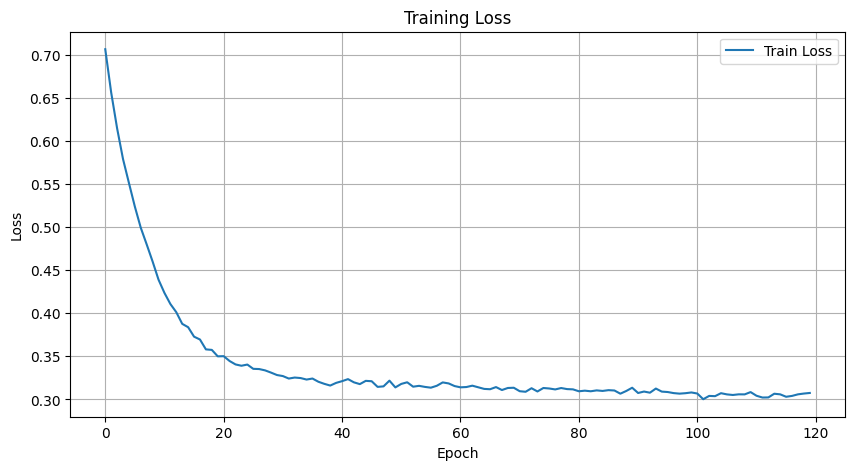

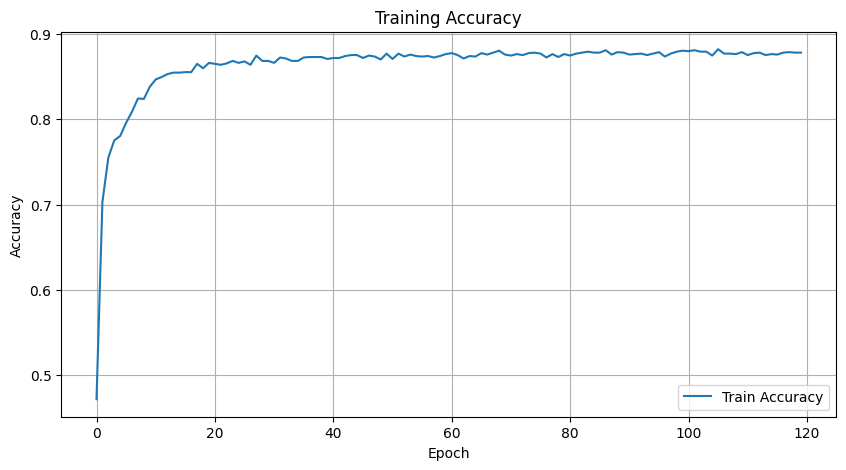

[I 2025-03-06 06:52:36,340] Trial 26 finished with value: 0.8595137114406891 and parameters: {'lr': 0.0004840760851805442, 'hidden_size': 58, 'dropout_rate': 0.13487875470451566, 'batch_size': 128, 'num_epochs': 120}. Best is trial 22 with value: 0.8633070783172202.


Epoch [1/90], Step [10/14], Loss: 0.3168
Epoch [1/90], Train Loss: 0.4442, Train Accuracy: 0.8128
Epoch [2/90], Step [10/14], Loss: 0.4391
Epoch [2/90], Train Loss: 0.3374, Train Accuracy: 0.8647
Epoch [3/90], Step [10/14], Loss: 0.2807
Epoch [3/90], Train Loss: 0.3224, Train Accuracy: 0.8733
Epoch [4/90], Step [10/14], Loss: 0.3193
Epoch [4/90], Train Loss: 0.3131, Train Accuracy: 0.8761
Epoch [5/90], Step [10/14], Loss: 0.3239
Epoch [5/90], Train Loss: 0.3203, Train Accuracy: 0.8756
Epoch [6/90], Step [10/14], Loss: 0.3907
Epoch [6/90], Train Loss: 0.3125, Train Accuracy: 0.8710
Epoch [7/90], Step [10/14], Loss: 0.2985
Epoch [7/90], Train Loss: 0.3073, Train Accuracy: 0.8773
Epoch [8/90], Step [10/14], Loss: 0.3831
Epoch [8/90], Train Loss: 0.3031, Train Accuracy: 0.8761
Epoch [9/90], Step [10/14], Loss: 0.2240
Epoch [9/90], Train Loss: 0.3081, Train Accuracy: 0.8739
Epoch [10/90], Step [10/14], Loss: 0.2411
Epoch [10/90], Train Loss: 0.3054, Train Accuracy: 0.8767
Epoch [11/90], Ste

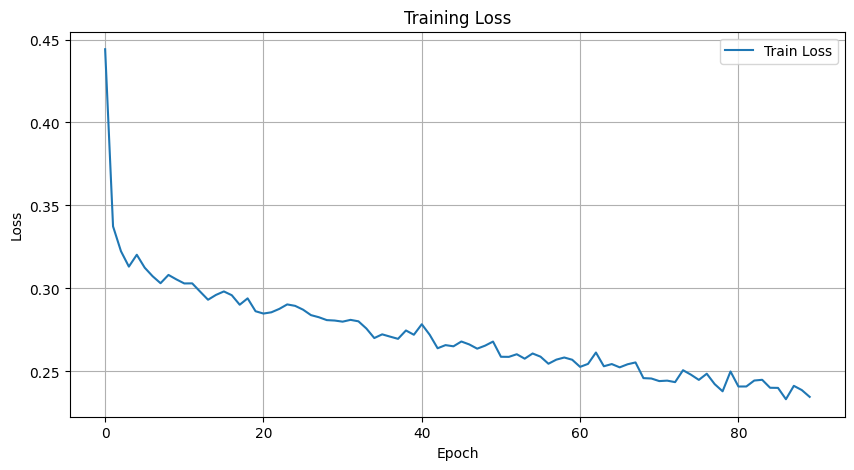

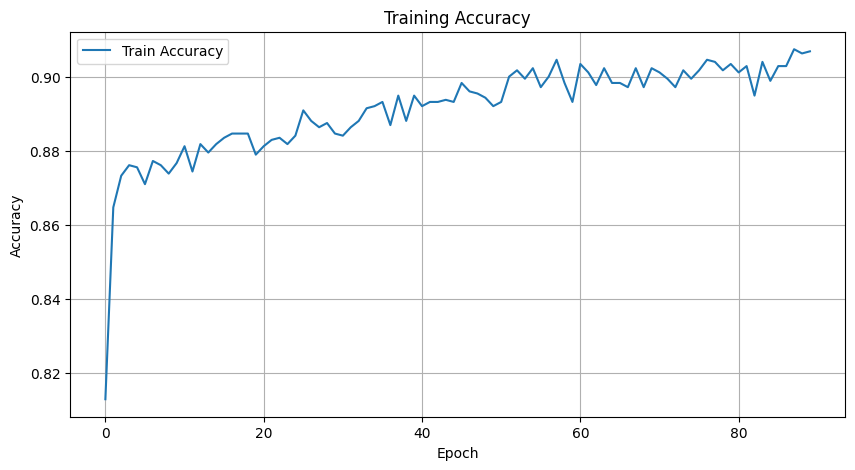

[I 2025-03-06 06:52:40,344] Trial 27 finished with value: 0.8446300150154106 and parameters: {'lr': 0.0064194222154919664, 'hidden_size': 94, 'dropout_rate': 0.041014717989334516, 'batch_size': 128, 'num_epochs': 90}. Best is trial 22 with value: 0.8633070783172202.


Epoch [1/200], Step [10/28], Loss: 0.5838
Epoch [1/200], Step [20/28], Loss: 0.5399
Epoch [1/200], Train Loss: 0.5799, Train Accuracy: 0.7386
Epoch [2/200], Step [10/28], Loss: 0.4276
Epoch [2/200], Step [20/28], Loss: 0.4501
Epoch [2/200], Train Loss: 0.4609, Train Accuracy: 0.8025
Epoch [3/200], Step [10/28], Loss: 0.3598
Epoch [3/200], Step [20/28], Loss: 0.4620
Epoch [3/200], Train Loss: 0.3967, Train Accuracy: 0.8356
Epoch [4/200], Step [10/28], Loss: 0.2737
Epoch [4/200], Step [20/28], Loss: 0.3717
Epoch [4/200], Train Loss: 0.3665, Train Accuracy: 0.8590
Epoch [5/200], Step [10/28], Loss: 0.3749
Epoch [5/200], Step [20/28], Loss: 0.4123
Epoch [5/200], Train Loss: 0.3452, Train Accuracy: 0.8676
Epoch [6/200], Step [10/28], Loss: 0.2258
Epoch [6/200], Step [20/28], Loss: 0.4578
Epoch [6/200], Train Loss: 0.3357, Train Accuracy: 0.8699
Epoch [7/200], Step [10/28], Loss: 0.3210
Epoch [7/200], Step [20/28], Loss: 0.3524
Epoch [7/200], Train Loss: 0.3277, Train Accuracy: 0.8682
Epoch 

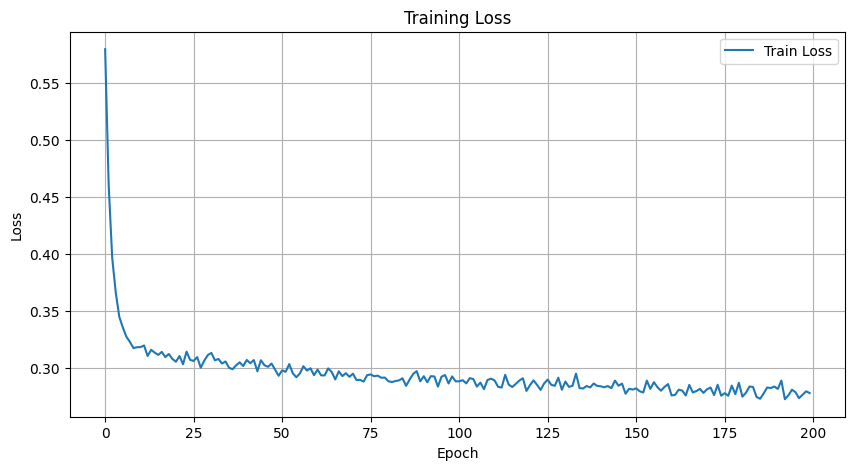

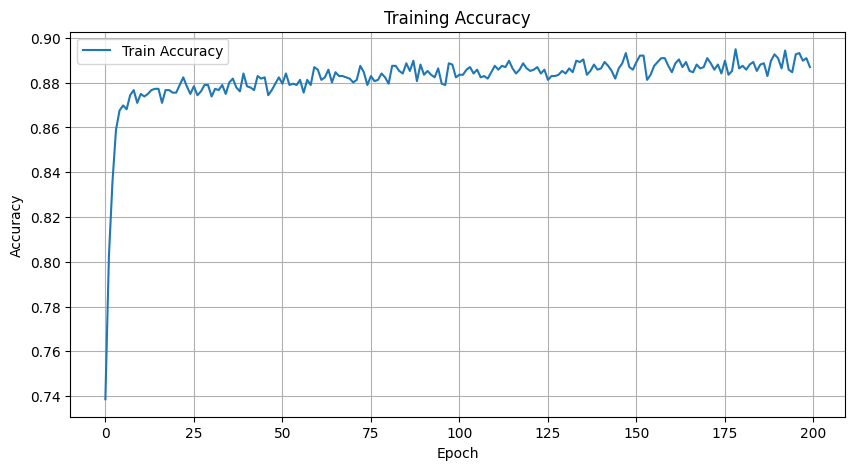

[I 2025-03-06 06:52:52,953] Trial 28 finished with value: 0.8573009140960459 and parameters: {'lr': 0.0011739476919328427, 'hidden_size': 82, 'dropout_rate': 0.21960216850976225, 'batch_size': 64, 'num_epochs': 200}. Best is trial 22 with value: 0.8633070783172202.


Epoch [1/60], Step [10/55], Loss: 0.6920
Epoch [1/60], Step [20/55], Loss: 0.6826
Epoch [1/60], Step [30/55], Loss: 0.6774
Epoch [1/60], Step [40/55], Loss: 0.6599
Epoch [1/60], Step [50/55], Loss: 0.6036
Epoch [1/60], Train Loss: 0.6775, Train Accuracy: 0.5942
Epoch [2/60], Step [10/55], Loss: 0.6221
Epoch [2/60], Step [20/55], Loss: 0.6338
Epoch [2/60], Step [30/55], Loss: 0.6062
Epoch [2/60], Step [40/55], Loss: 0.5422
Epoch [2/60], Step [50/55], Loss: 0.5771
Epoch [2/60], Train Loss: 0.6063, Train Accuracy: 0.7825
Epoch [3/60], Step [10/55], Loss: 0.5749
Epoch [3/60], Step [20/55], Loss: 0.5430
Epoch [3/60], Step [30/55], Loss: 0.5353
Epoch [3/60], Step [40/55], Loss: 0.5342
Epoch [3/60], Step [50/55], Loss: 0.5220
Epoch [3/60], Train Loss: 0.5499, Train Accuracy: 0.8185
Epoch [4/60], Step [10/55], Loss: 0.4840
Epoch [4/60], Step [20/55], Loss: 0.5211
Epoch [4/60], Step [30/55], Loss: 0.4447
Epoch [4/60], Step [40/55], Loss: 0.5430
Epoch [4/60], Step [50/55], Loss: 0.4647
Epoch [4/

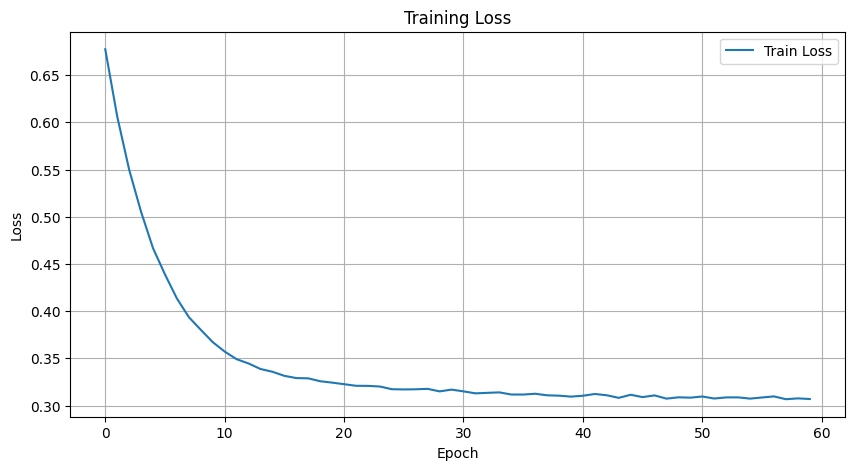

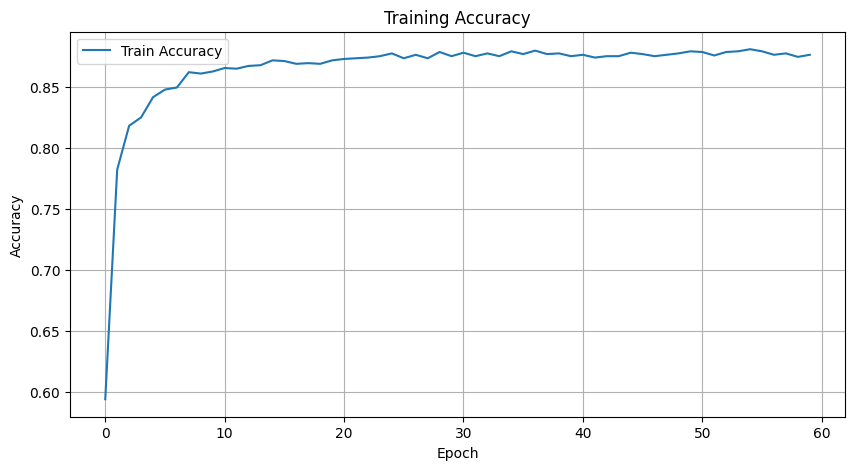

[I 2025-03-06 06:52:59,421] Trial 29 finished with value: 0.8632807354916888 and parameters: {'lr': 0.000186180441559142, 'hidden_size': 86, 'dropout_rate': 0.046278487015876696, 'batch_size': 32, 'num_epochs': 60}. Best is trial 22 with value: 0.8633070783172202.


Epoch [1/100], Step [10/55], Loss: 0.7527
Epoch [1/100], Step [20/55], Loss: 0.7172
Epoch [1/100], Step [30/55], Loss: 0.7190
Epoch [1/100], Step [40/55], Loss: 0.6441
Epoch [1/100], Step [50/55], Loss: 0.6676
Epoch [1/100], Train Loss: 0.6937, Train Accuracy: 0.5314
Epoch [2/100], Step [10/55], Loss: 0.6540
Epoch [2/100], Step [20/55], Loss: 0.6255
Epoch [2/100], Step [30/55], Loss: 0.5846
Epoch [2/100], Step [40/55], Loss: 0.5830
Epoch [2/100], Step [50/55], Loss: 0.5921
Epoch [2/100], Train Loss: 0.6153, Train Accuracy: 0.8059
Epoch [3/100], Step [10/55], Loss: 0.6067
Epoch [3/100], Step [20/55], Loss: 0.5605
Epoch [3/100], Step [30/55], Loss: 0.5757
Epoch [3/100], Step [40/55], Loss: 0.5189
Epoch [3/100], Step [50/55], Loss: 0.5328
Epoch [3/100], Train Loss: 0.5513, Train Accuracy: 0.8425
Epoch [4/100], Step [10/55], Loss: 0.5340
Epoch [4/100], Step [20/55], Loss: 0.5763
Epoch [4/100], Step [30/55], Loss: 0.5872
Epoch [4/100], Step [40/55], Loss: 0.5425
Epoch [4/100], Step [50/55],

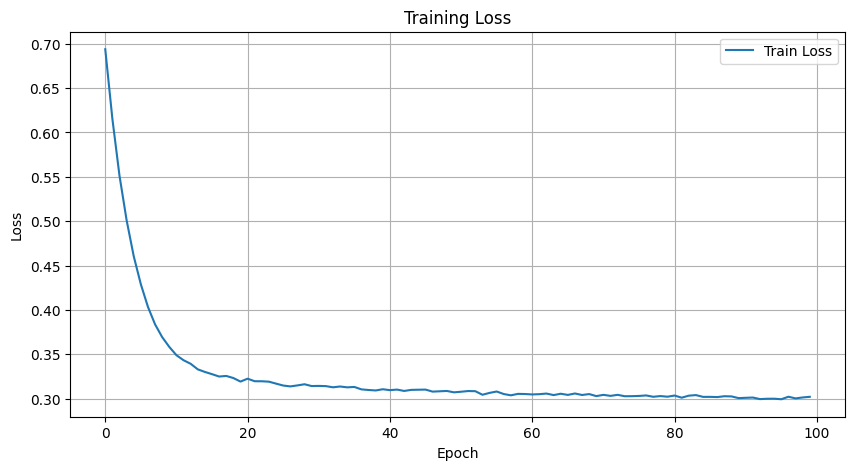

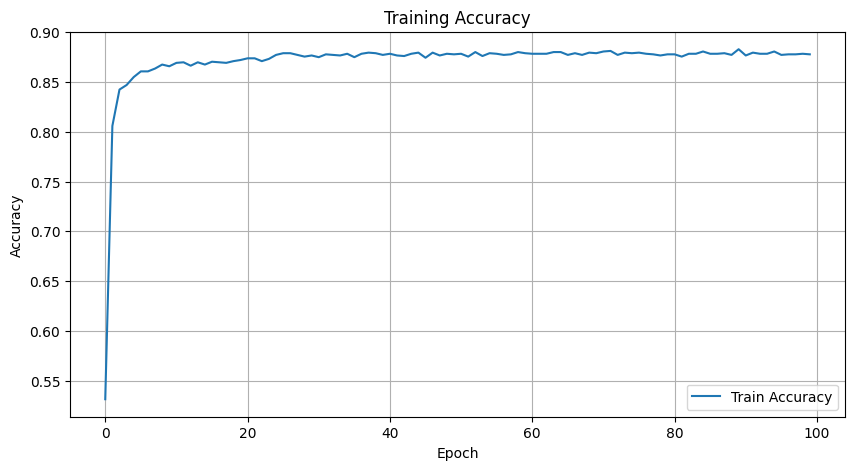

[I 2025-03-06 06:53:09,724] Trial 30 finished with value: 0.86204262269171 and parameters: {'lr': 0.00019705255625745147, 'hidden_size': 73, 'dropout_rate': 0.03930747606462204, 'batch_size': 32, 'num_epochs': 100}. Best is trial 22 with value: 0.8633070783172202.


Epoch [1/97], Step [10/55], Loss: 0.6486
Epoch [1/97], Step [20/55], Loss: 0.6661
Epoch [1/97], Step [30/55], Loss: 0.6419
Epoch [1/97], Step [40/55], Loss: 0.6433
Epoch [1/97], Step [50/55], Loss: 0.6122
Epoch [1/97], Train Loss: 0.6560, Train Accuracy: 0.6592
Epoch [2/97], Step [10/55], Loss: 0.6474
Epoch [2/97], Step [20/55], Loss: 0.5726
Epoch [2/97], Step [30/55], Loss: 0.6126
Epoch [2/97], Step [40/55], Loss: 0.5584
Epoch [2/97], Step [50/55], Loss: 0.5487
Epoch [2/97], Train Loss: 0.5922, Train Accuracy: 0.7705
Epoch [3/97], Step [10/55], Loss: 0.5011
Epoch [3/97], Step [20/55], Loss: 0.5542
Epoch [3/97], Step [30/55], Loss: 0.5500
Epoch [3/97], Step [40/55], Loss: 0.5757
Epoch [3/97], Step [50/55], Loss: 0.5573
Epoch [3/97], Train Loss: 0.5462, Train Accuracy: 0.7808
Epoch [4/97], Step [10/55], Loss: 0.5964
Epoch [4/97], Step [20/55], Loss: 0.5056
Epoch [4/97], Step [30/55], Loss: 0.4968
Epoch [4/97], Step [40/55], Loss: 0.5241
Epoch [4/97], Step [50/55], Loss: 0.4784
Epoch [4/

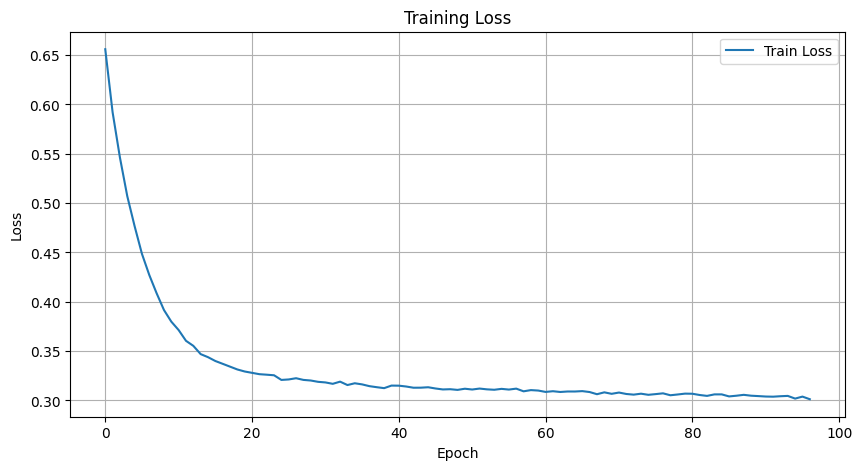

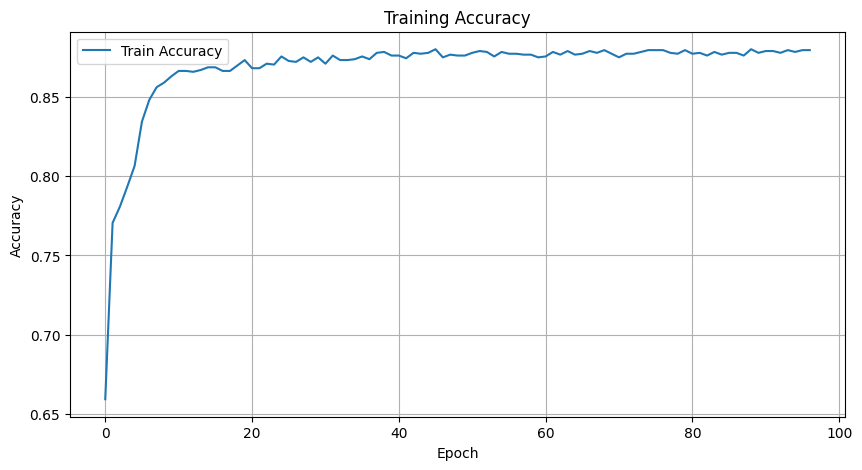

[I 2025-03-06 06:53:20,104] Trial 31 finished with value: 0.86420273438529 and parameters: {'lr': 0.00018005780360542584, 'hidden_size': 76, 'dropout_rate': 0.04023339295553564, 'batch_size': 32, 'num_epochs': 97}. Best is trial 31 with value: 0.86420273438529.


Epoch [1/85], Step [10/55], Loss: 0.6486
Epoch [1/85], Step [20/55], Loss: 0.6912
Epoch [1/85], Step [30/55], Loss: 0.6455
Epoch [1/85], Step [40/55], Loss: 0.5632
Epoch [1/85], Step [50/55], Loss: 0.6211
Epoch [1/85], Train Loss: 0.6324, Train Accuracy: 0.7197
Epoch [2/85], Step [10/55], Loss: 0.5921
Epoch [2/85], Step [20/55], Loss: 0.6375
Epoch [2/85], Step [30/55], Loss: 0.5381
Epoch [2/85], Step [40/55], Loss: 0.6019
Epoch [2/85], Step [50/55], Loss: 0.5698
Epoch [2/85], Train Loss: 0.5881, Train Accuracy: 0.7751
Epoch [3/85], Step [10/55], Loss: 0.5730
Epoch [3/85], Step [20/55], Loss: 0.5651
Epoch [3/85], Step [30/55], Loss: 0.5129
Epoch [3/85], Step [40/55], Loss: 0.5629
Epoch [3/85], Step [50/55], Loss: 0.5151
Epoch [3/85], Train Loss: 0.5484, Train Accuracy: 0.7939
Epoch [4/85], Step [10/55], Loss: 0.5830
Epoch [4/85], Step [20/55], Loss: 0.5530
Epoch [4/85], Step [30/55], Loss: 0.5282
Epoch [4/85], Step [40/55], Loss: 0.5055
Epoch [4/85], Step [50/55], Loss: 0.5489
Epoch [4/

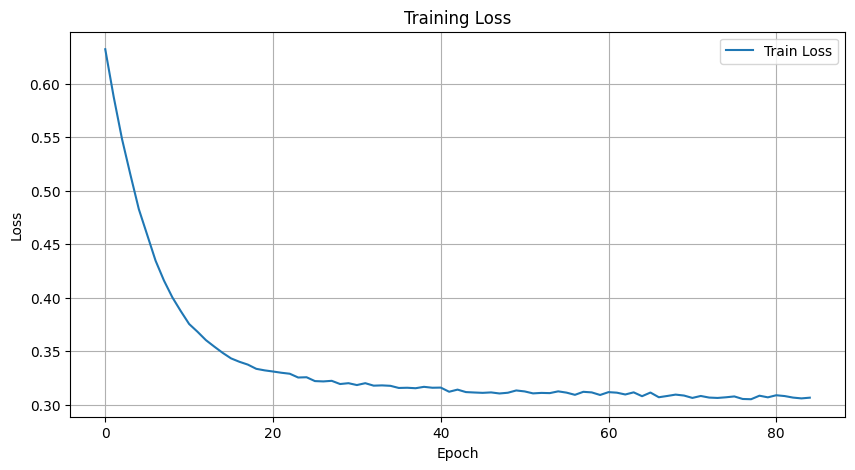

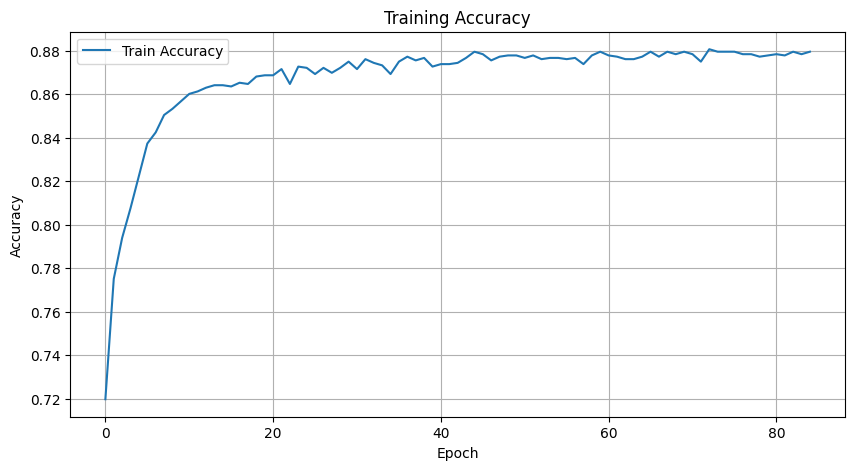

[I 2025-03-06 06:53:28,887] Trial 32 finished with value: 0.8647822765469825 and parameters: {'lr': 0.00014827766783550184, 'hidden_size': 84, 'dropout_rate': 0.0656234929392531, 'batch_size': 32, 'num_epochs': 85}. Best is trial 32 with value: 0.8647822765469825.


Epoch [1/113], Step [10/55], Loss: 0.7238
Epoch [1/113], Step [20/55], Loss: 0.7135
Epoch [1/113], Step [30/55], Loss: 0.7098
Epoch [1/113], Step [40/55], Loss: 0.7056
Epoch [1/113], Step [50/55], Loss: 0.6936
Epoch [1/113], Train Loss: 0.7037, Train Accuracy: 0.5274
Epoch [2/113], Step [10/55], Loss: 0.6580
Epoch [2/113], Step [20/55], Loss: 0.6735
Epoch [2/113], Step [30/55], Loss: 0.6999
Epoch [2/113], Step [40/55], Loss: 0.6990
Epoch [2/113], Step [50/55], Loss: 0.6755
Epoch [2/113], Train Loss: 0.6730, Train Accuracy: 0.6204
Epoch [3/113], Step [10/55], Loss: 0.6747
Epoch [3/113], Step [20/55], Loss: 0.6719
Epoch [3/113], Step [30/55], Loss: 0.6391
Epoch [3/113], Step [40/55], Loss: 0.5884
Epoch [3/113], Step [50/55], Loss: 0.5894
Epoch [3/113], Train Loss: 0.6438, Train Accuracy: 0.7072
Epoch [4/113], Step [10/55], Loss: 0.6084
Epoch [4/113], Step [20/55], Loss: 0.6480
Epoch [4/113], Step [30/55], Loss: 0.5930
Epoch [4/113], Step [40/55], Loss: 0.5952
Epoch [4/113], Step [50/55],

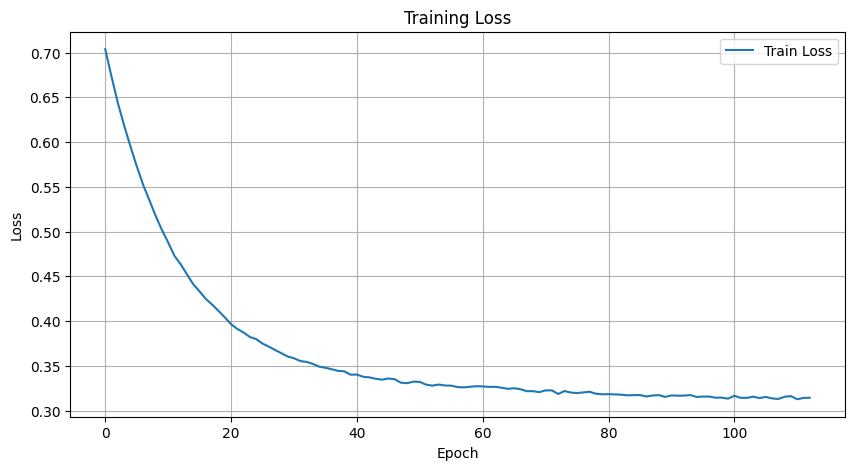

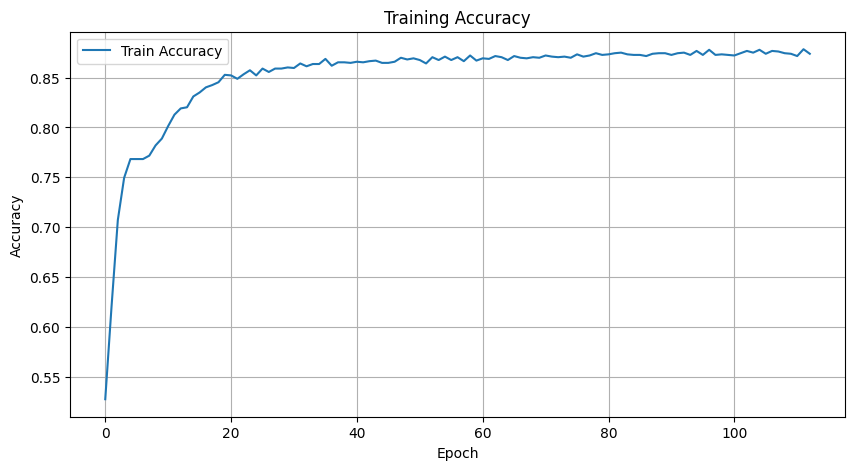

[I 2025-03-06 06:53:40,537] Trial 33 finished with value: 0.8661521034746187 and parameters: {'lr': 6.729752875080294e-05, 'hidden_size': 84, 'dropout_rate': 0.06486575410844082, 'batch_size': 32, 'num_epochs': 113}. Best is trial 33 with value: 0.8661521034746187.


Epoch [1/152], Step [10/55], Loss: 0.6902
Epoch [1/152], Step [20/55], Loss: 0.6918
Epoch [1/152], Step [30/55], Loss: 0.6671
Epoch [1/152], Step [40/55], Loss: 0.6407
Epoch [1/152], Step [50/55], Loss: 0.6765
Epoch [1/152], Train Loss: 0.6757, Train Accuracy: 0.6045
Epoch [2/152], Step [10/55], Loss: 0.6626
Epoch [2/152], Step [20/55], Loss: 0.6805
Epoch [2/152], Step [30/55], Loss: 0.6473
Epoch [2/152], Step [40/55], Loss: 0.6561
Epoch [2/152], Step [50/55], Loss: 0.6280
Epoch [2/152], Train Loss: 0.6510, Train Accuracy: 0.7095
Epoch [3/152], Step [10/55], Loss: 0.6382
Epoch [3/152], Step [20/55], Loss: 0.6341
Epoch [3/152], Step [30/55], Loss: 0.6408
Epoch [3/152], Step [40/55], Loss: 0.6108
Epoch [3/152], Step [50/55], Loss: 0.6214
Epoch [3/152], Train Loss: 0.6260, Train Accuracy: 0.7694
Epoch [4/152], Step [10/55], Loss: 0.6117
Epoch [4/152], Step [20/55], Loss: 0.6244
Epoch [4/152], Step [30/55], Loss: 0.6251
Epoch [4/152], Step [40/55], Loss: 0.6062
Epoch [4/152], Step [50/55],

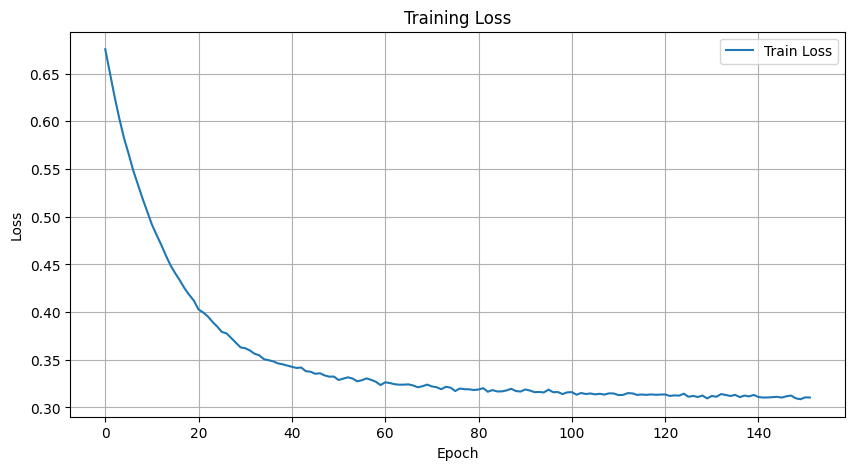

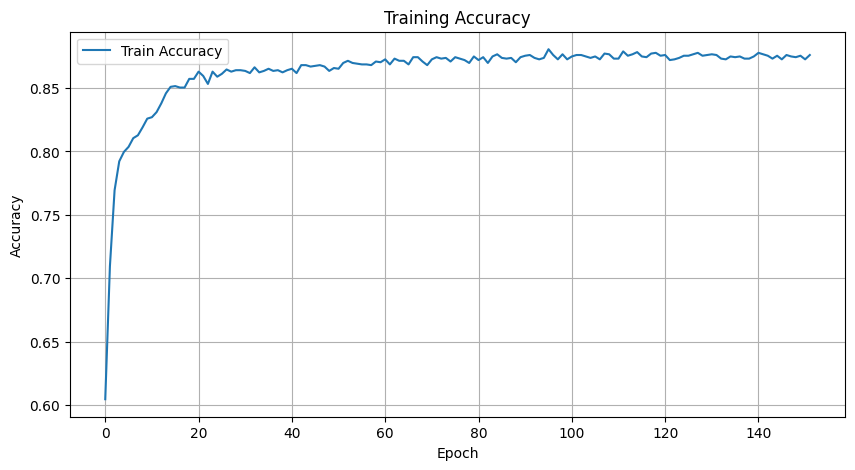

[I 2025-03-06 06:53:56,378] Trial 34 finished with value: 0.8650193619767657 and parameters: {'lr': 6.0573297069423366e-05, 'hidden_size': 80, 'dropout_rate': 0.06619608830716917, 'batch_size': 32, 'num_epochs': 152}. Best is trial 33 with value: 0.8661521034746187.


Epoch [1/153], Step [10/55], Loss: 0.6688
Epoch [1/153], Step [20/55], Loss: 0.6559
Epoch [1/153], Step [30/55], Loss: 0.6737
Epoch [1/153], Step [40/55], Loss: 0.6419
Epoch [1/153], Step [50/55], Loss: 0.6273
Epoch [1/153], Train Loss: 0.6587, Train Accuracy: 0.6524
Epoch [2/153], Step [10/55], Loss: 0.6325
Epoch [2/153], Step [20/55], Loss: 0.6230
Epoch [2/153], Step [30/55], Loss: 0.6104
Epoch [2/153], Step [40/55], Loss: 0.6537
Epoch [2/153], Step [50/55], Loss: 0.6483
Epoch [2/153], Train Loss: 0.6325, Train Accuracy: 0.7426
Epoch [3/153], Step [10/55], Loss: 0.6122
Epoch [3/153], Step [20/55], Loss: 0.6278
Epoch [3/153], Step [30/55], Loss: 0.6031
Epoch [3/153], Step [40/55], Loss: 0.5916
Epoch [3/153], Step [50/55], Loss: 0.6030
Epoch [3/153], Train Loss: 0.6102, Train Accuracy: 0.7814
Epoch [4/153], Step [10/55], Loss: 0.6278
Epoch [4/153], Step [20/55], Loss: 0.6066
Epoch [4/153], Step [30/55], Loss: 0.5929
Epoch [4/153], Step [40/55], Loss: 0.5942
Epoch [4/153], Step [50/55],

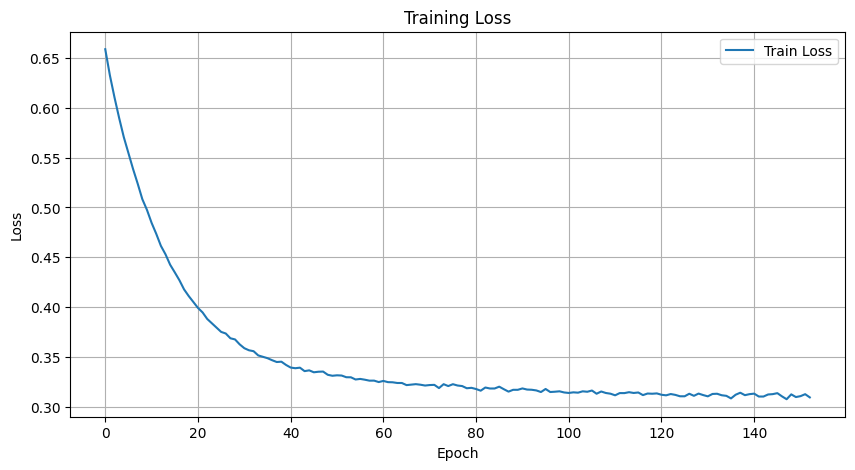

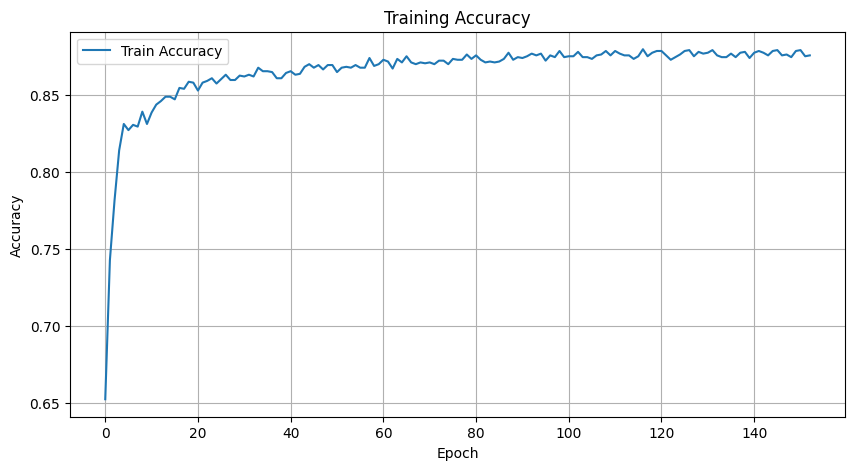

[I 2025-03-06 06:54:11,897] Trial 35 finished with value: 0.8638866204789127 and parameters: {'lr': 6.126154135788178e-05, 'hidden_size': 79, 'dropout_rate': 0.08120283499469308, 'batch_size': 32, 'num_epochs': 153}. Best is trial 33 with value: 0.8661521034746187.


Epoch [1/161], Step [10/55], Loss: 0.7645
Epoch [1/161], Step [20/55], Loss: 0.7961
Epoch [1/161], Step [30/55], Loss: 0.7629
Epoch [1/161], Step [40/55], Loss: 0.7718
Epoch [1/161], Step [50/55], Loss: 0.7304
Epoch [1/161], Train Loss: 0.7591, Train Accuracy: 0.2797
Epoch [2/161], Step [10/55], Loss: 0.7171
Epoch [2/161], Step [20/55], Loss: 0.7382
Epoch [2/161], Step [30/55], Loss: 0.6889
Epoch [2/161], Step [40/55], Loss: 0.7863
Epoch [2/161], Step [50/55], Loss: 0.6902
Epoch [2/161], Train Loss: 0.7315, Train Accuracy: 0.3265
Epoch [3/161], Step [10/55], Loss: 0.7165
Epoch [3/161], Step [20/55], Loss: 0.7157
Epoch [3/161], Step [30/55], Loss: 0.7248
Epoch [3/161], Step [40/55], Loss: 0.6774
Epoch [3/161], Step [50/55], Loss: 0.6820
Epoch [3/161], Train Loss: 0.7079, Train Accuracy: 0.4138
Epoch [4/161], Step [10/55], Loss: 0.6810
Epoch [4/161], Step [20/55], Loss: 0.6510
Epoch [4/161], Step [30/55], Loss: 0.7108
Epoch [4/161], Step [40/55], Loss: 0.6733
Epoch [4/161], Step [50/55],

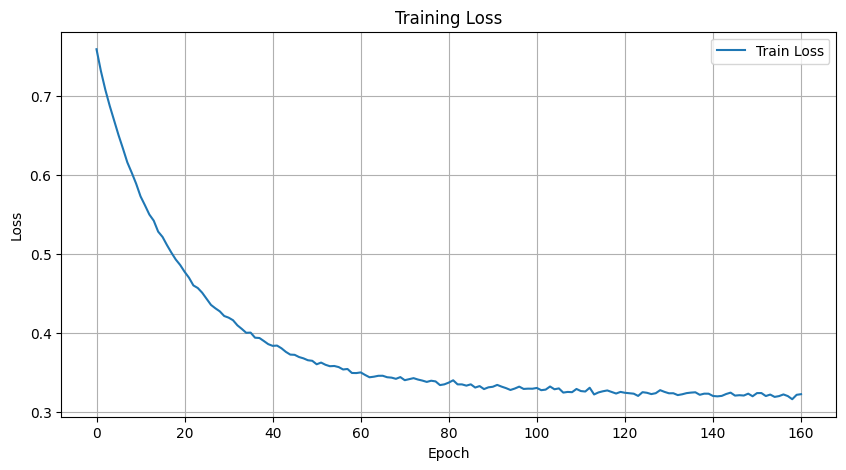

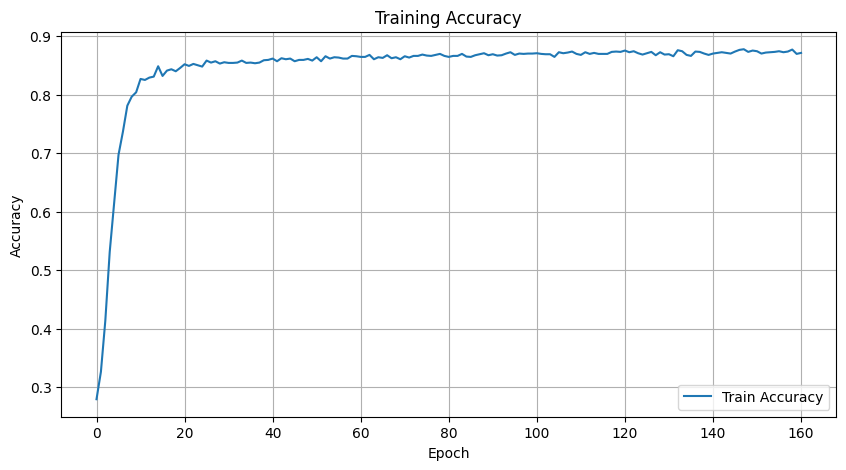

[I 2025-03-06 06:54:28,475] Trial 36 finished with value: 0.8582229129896473 and parameters: {'lr': 5.189222510601365e-05, 'hidden_size': 60, 'dropout_rate': 0.13668908401954752, 'batch_size': 32, 'num_epochs': 161}. Best is trial 33 with value: 0.8661521034746187.


Epoch [1/141], Step [10/55], Loss: 0.7273
Epoch [1/141], Step [20/55], Loss: 0.6985
Epoch [1/141], Step [30/55], Loss: 0.6889
Epoch [1/141], Step [40/55], Loss: 0.6808
Epoch [1/141], Step [50/55], Loss: 0.6530
Epoch [1/141], Train Loss: 0.6909, Train Accuracy: 0.5086
Epoch [2/141], Step [10/55], Loss: 0.6418
Epoch [2/141], Step [20/55], Loss: 0.6514
Epoch [2/141], Step [30/55], Loss: 0.6362
Epoch [2/141], Step [40/55], Loss: 0.6813
Epoch [2/141], Step [50/55], Loss: 0.6221
Epoch [2/141], Train Loss: 0.6414, Train Accuracy: 0.7095
Epoch [3/141], Step [10/55], Loss: 0.6536
Epoch [3/141], Step [20/55], Loss: 0.6071
Epoch [3/141], Step [30/55], Loss: 0.5479
Epoch [3/141], Step [40/55], Loss: 0.5790
Epoch [3/141], Step [50/55], Loss: 0.5313
Epoch [3/141], Train Loss: 0.5992, Train Accuracy: 0.7814
Epoch [4/141], Step [10/55], Loss: 0.5479
Epoch [4/141], Step [20/55], Loss: 0.5405
Epoch [4/141], Step [30/55], Loss: 0.6084
Epoch [4/141], Step [40/55], Loss: 0.6255
Epoch [4/141], Step [50/55],

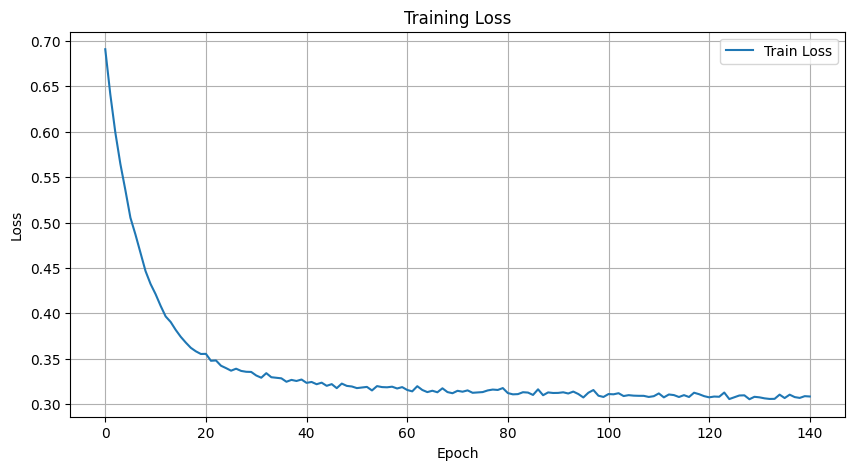

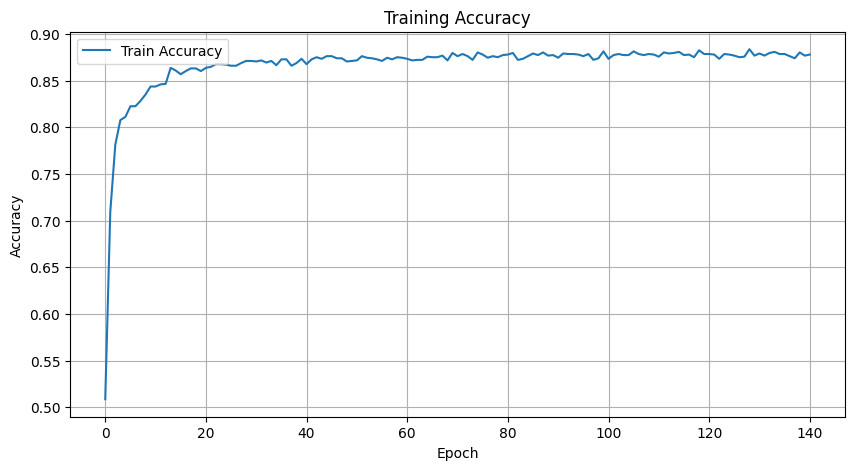

[I 2025-03-06 06:54:42,723] Trial 37 finished with value: 0.8665999315086537 and parameters: {'lr': 0.00011645313707050052, 'hidden_size': 83, 'dropout_rate': 0.16895177363124675, 'batch_size': 32, 'num_epochs': 141}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/145], Step [10/55], Loss: 0.6736
Epoch [1/145], Step [20/55], Loss: 0.6177
Epoch [1/145], Step [30/55], Loss: 0.6225
Epoch [1/145], Step [40/55], Loss: 0.5980
Epoch [1/145], Step [50/55], Loss: 0.6745
Epoch [1/145], Train Loss: 0.6351, Train Accuracy: 0.7374
Epoch [2/145], Step [10/55], Loss: 0.6318
Epoch [2/145], Step [20/55], Loss: 0.5652
Epoch [2/145], Step [30/55], Loss: 0.6261
Epoch [2/145], Step [40/55], Loss: 0.6368
Epoch [2/145], Step [50/55], Loss: 0.6136
Epoch [2/145], Train Loss: 0.6317, Train Accuracy: 0.7392
Epoch [3/145], Step [10/55], Loss: 0.6178
Epoch [3/145], Step [20/55], Loss: 0.6270
Epoch [3/145], Step [30/55], Loss: 0.5446
Epoch [3/145], Step [40/55], Loss: 0.6159
Epoch [3/145], Step [50/55], Loss: 0.6536
Epoch [3/145], Train Loss: 0.6284, Train Accuracy: 0.7437
Epoch [4/145], Step [10/55], Loss: 0.5810
Epoch [4/145], Step [20/55], Loss: 0.7548
Epoch [4/145], Step [30/55], Loss: 0.7240
Epoch [4/145], Step [40/55], Loss: 0.6146
Epoch [4/145], Step [50/55],

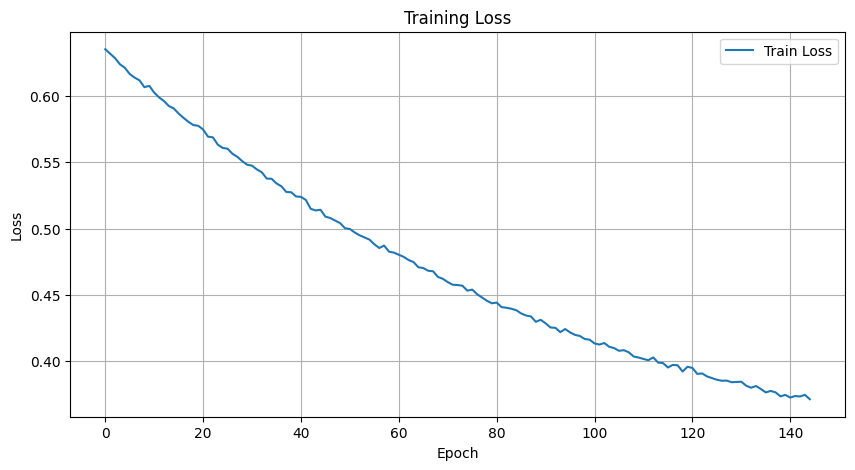

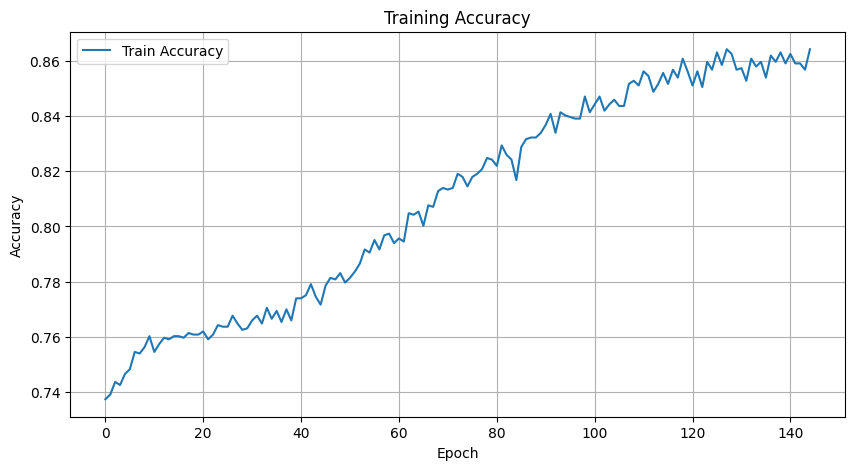

[I 2025-03-06 06:54:57,839] Trial 38 finished with value: 0.8507415505387107 and parameters: {'lr': 1.0955369505142903e-05, 'hidden_size': 83, 'dropout_rate': 0.17252486336080297, 'batch_size': 32, 'num_epochs': 145}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/178], Step [10/55], Loss: 0.7433
Epoch [1/178], Step [20/55], Loss: 0.7063
Epoch [1/178], Step [30/55], Loss: 0.7017
Epoch [1/178], Step [40/55], Loss: 0.7382
Epoch [1/178], Step [50/55], Loss: 0.7563
Epoch [1/178], Train Loss: 0.7397, Train Accuracy: 0.3978
Epoch [2/178], Step [10/55], Loss: 0.6716
Epoch [2/178], Step [20/55], Loss: 0.6909
Epoch [2/178], Step [30/55], Loss: 0.7140
Epoch [2/178], Step [40/55], Loss: 0.6944
Epoch [2/178], Step [50/55], Loss: 0.6169
Epoch [2/178], Train Loss: 0.6889, Train Accuracy: 0.5451
Epoch [3/178], Step [10/55], Loss: 0.6650
Epoch [3/178], Step [20/55], Loss: 0.6293
Epoch [3/178], Step [30/55], Loss: 0.6041
Epoch [3/178], Step [40/55], Loss: 0.6222
Epoch [3/178], Step [50/55], Loss: 0.6042
Epoch [3/178], Train Loss: 0.6481, Train Accuracy: 0.6353
Epoch [4/178], Step [10/55], Loss: 0.6011
Epoch [4/178], Step [20/55], Loss: 0.5920
Epoch [4/178], Step [30/55], Loss: 0.6687
Epoch [4/178], Step [40/55], Loss: 0.5360
Epoch [4/178], Step [50/55],

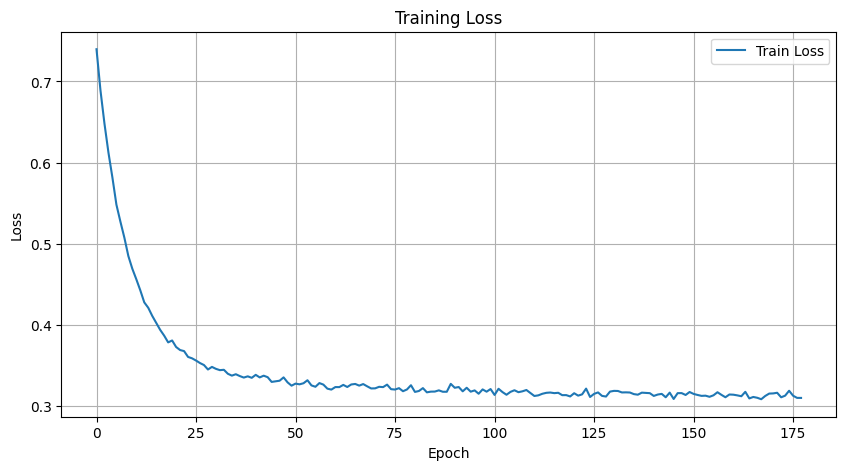

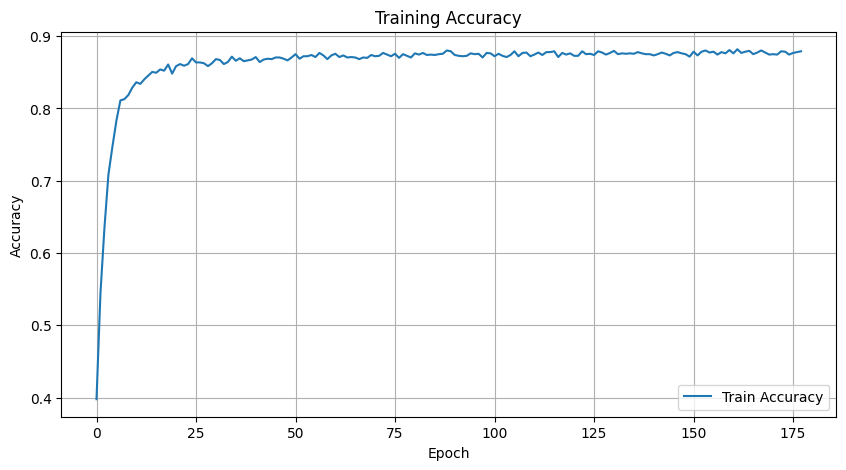

[I 2025-03-06 06:55:15,682] Trial 39 finished with value: 0.8542188035088644 and parameters: {'lr': 0.00011809376810632729, 'hidden_size': 62, 'dropout_rate': 0.30562585527217156, 'batch_size': 32, 'num_epochs': 178}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/127], Step [10/55], Loss: 0.7009
Epoch [1/127], Step [20/55], Loss: 0.6692
Epoch [1/127], Step [30/55], Loss: 0.6892
Epoch [1/127], Step [40/55], Loss: 0.6730
Epoch [1/127], Step [50/55], Loss: 0.6773
Epoch [1/127], Train Loss: 0.6746, Train Accuracy: 0.6455
Epoch [2/127], Step [10/55], Loss: 0.6861
Epoch [2/127], Step [20/55], Loss: 0.6500
Epoch [2/127], Step [30/55], Loss: 0.6578
Epoch [2/127], Step [40/55], Loss: 0.6990
Epoch [2/127], Step [50/55], Loss: 0.6353
Epoch [2/127], Train Loss: 0.6605, Train Accuracy: 0.7026
Epoch [3/127], Step [10/55], Loss: 0.6750
Epoch [3/127], Step [20/55], Loss: 0.6606
Epoch [3/127], Step [30/55], Loss: 0.6363
Epoch [3/127], Step [40/55], Loss: 0.6326
Epoch [3/127], Step [50/55], Loss: 0.6236
Epoch [3/127], Train Loss: 0.6469, Train Accuracy: 0.7317
Epoch [4/127], Step [10/55], Loss: 0.5935
Epoch [4/127], Step [20/55], Loss: 0.6678
Epoch [4/127], Step [30/55], Loss: 0.6366
Epoch [4/127], Step [40/55], Loss: 0.6087
Epoch [4/127], Step [50/55],

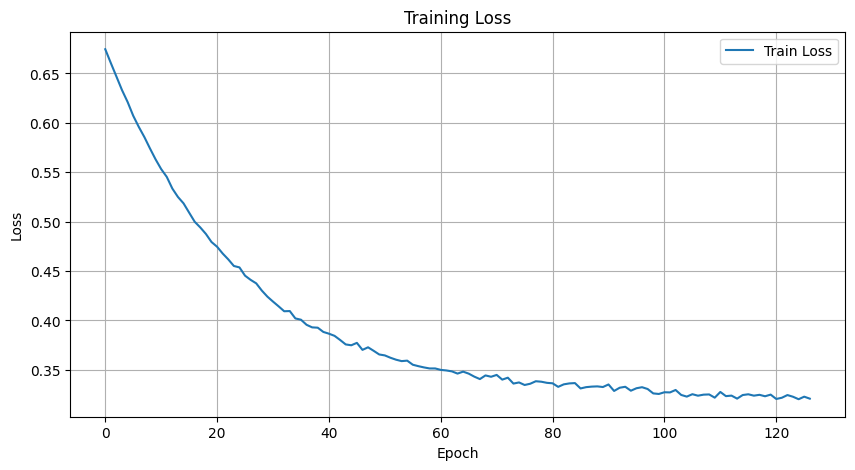

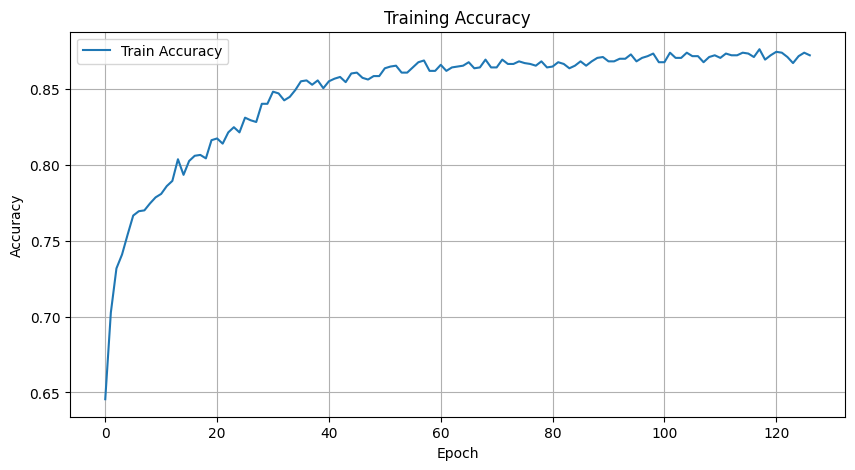

[I 2025-03-06 06:55:28,723] Trial 40 finished with value: 0.8637812491767868 and parameters: {'lr': 3.901937064055532e-05, 'hidden_size': 80, 'dropout_rate': 0.20961290802759075, 'batch_size': 32, 'num_epochs': 127}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/104], Step [10/55], Loss: 0.6610
Epoch [1/104], Step [20/55], Loss: 0.6692
Epoch [1/104], Step [30/55], Loss: 0.6712
Epoch [1/104], Step [40/55], Loss: 0.6275
Epoch [1/104], Step [50/55], Loss: 0.6491
Epoch [1/104], Train Loss: 0.6603, Train Accuracy: 0.6615
Epoch [2/104], Step [10/55], Loss: 0.6375
Epoch [2/104], Step [20/55], Loss: 0.6627
Epoch [2/104], Step [30/55], Loss: 0.6023
Epoch [2/104], Step [40/55], Loss: 0.6176
Epoch [2/104], Step [50/55], Loss: 0.6361
Epoch [2/104], Train Loss: 0.6333, Train Accuracy: 0.7255
Epoch [3/104], Step [10/55], Loss: 0.6068
Epoch [3/104], Step [20/55], Loss: 0.6397
Epoch [3/104], Step [30/55], Loss: 0.6162
Epoch [3/104], Step [40/55], Loss: 0.6488
Epoch [3/104], Step [50/55], Loss: 0.5644
Epoch [3/104], Train Loss: 0.6055, Train Accuracy: 0.7774
Epoch [4/104], Step [10/55], Loss: 0.5770
Epoch [4/104], Step [20/55], Loss: 0.5858
Epoch [4/104], Step [30/55], Loss: 0.5615
Epoch [4/104], Step [40/55], Loss: 0.5447
Epoch [4/104], Step [50/55],

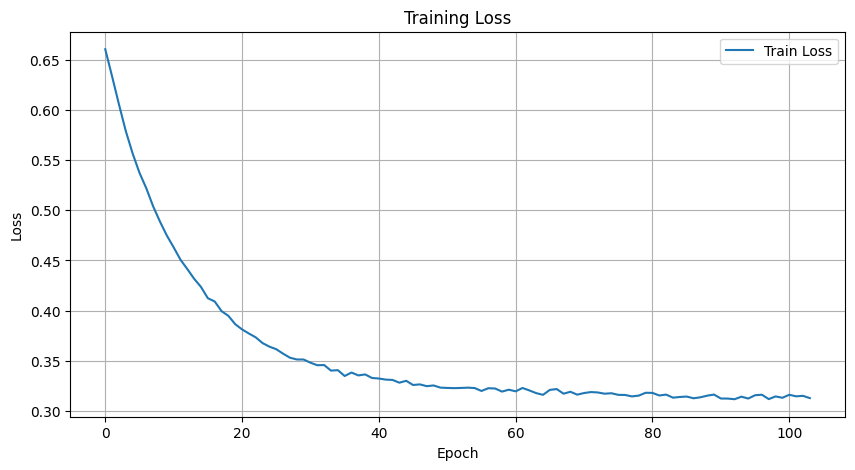

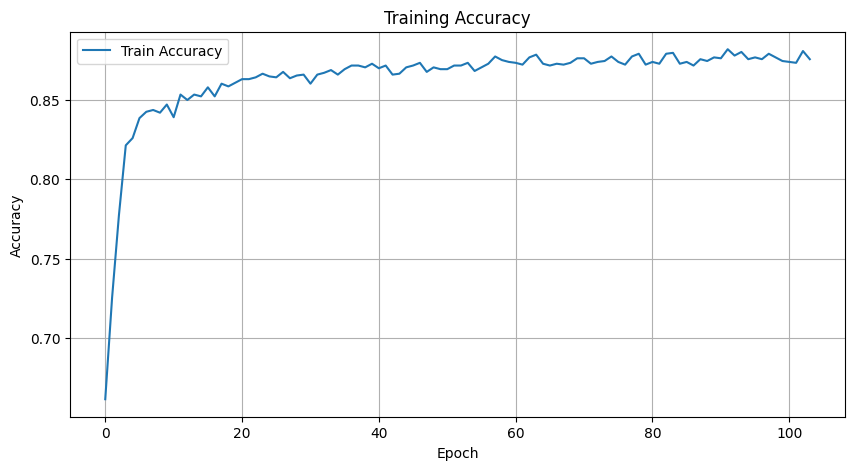

[I 2025-03-06 06:55:39,231] Trial 41 finished with value: 0.8627538789810594 and parameters: {'lr': 7.427634712937194e-05, 'hidden_size': 75, 'dropout_rate': 0.11884557538532531, 'batch_size': 32, 'num_epochs': 104}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/145], Step [10/55], Loss: 0.7622
Epoch [1/145], Step [20/55], Loss: 0.7519
Epoch [1/145], Step [30/55], Loss: 0.7371
Epoch [1/145], Step [40/55], Loss: 0.7167
Epoch [1/145], Step [50/55], Loss: 0.7005
Epoch [1/145], Train Loss: 0.7301, Train Accuracy: 0.3676
Epoch [2/145], Step [10/55], Loss: 0.6924
Epoch [2/145], Step [20/55], Loss: 0.6579
Epoch [2/145], Step [30/55], Loss: 0.6588
Epoch [2/145], Step [40/55], Loss: 0.6477
Epoch [2/145], Step [50/55], Loss: 0.6492
Epoch [2/145], Train Loss: 0.6707, Train Accuracy: 0.5936
Epoch [3/145], Step [10/55], Loss: 0.6308
Epoch [3/145], Step [20/55], Loss: 0.6142
Epoch [3/145], Step [30/55], Loss: 0.5970
Epoch [3/145], Step [40/55], Loss: 0.6451
Epoch [3/145], Step [50/55], Loss: 0.5828
Epoch [3/145], Train Loss: 0.6198, Train Accuracy: 0.7803
Epoch [4/145], Step [10/55], Loss: 0.5789
Epoch [4/145], Step [20/55], Loss: 0.6093
Epoch [4/145], Step [30/55], Loss: 0.5814
Epoch [4/145], Step [40/55], Loss: 0.5229
Epoch [4/145], Step [50/55],

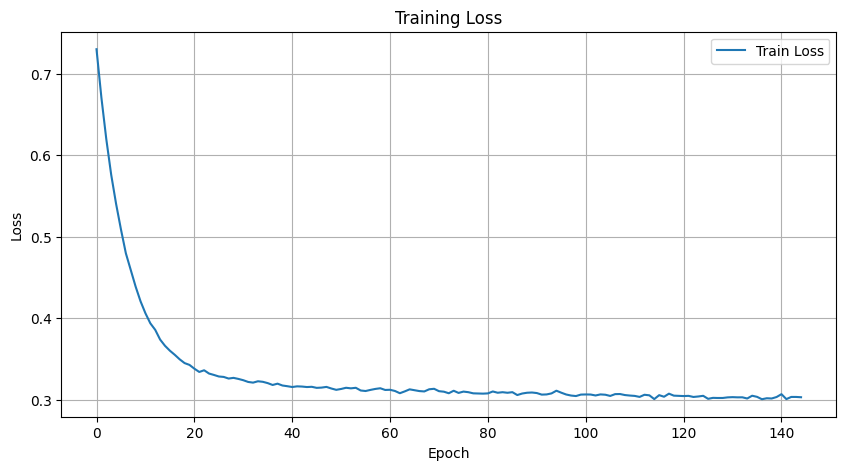

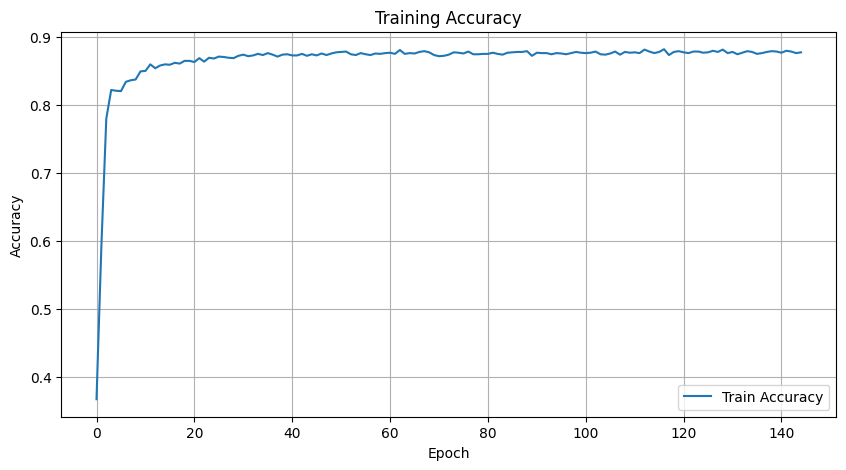

[I 2025-03-06 06:55:54,057] Trial 42 finished with value: 0.8602776533811016 and parameters: {'lr': 0.00014296416709815474, 'hidden_size': 71, 'dropout_rate': 0.07519102946095385, 'batch_size': 32, 'num_epochs': 145}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/111], Step [10/55], Loss: 0.6705
Epoch [1/111], Step [20/55], Loss: 0.6940
Epoch [1/111], Step [30/55], Loss: 0.6848
Epoch [1/111], Step [40/55], Loss: 0.6886
Epoch [1/111], Step [50/55], Loss: 0.6835
Epoch [1/111], Train Loss: 0.6953, Train Accuracy: 0.5046
Epoch [2/111], Step [10/55], Loss: 0.7240
Epoch [2/111], Step [20/55], Loss: 0.6873
Epoch [2/111], Step [30/55], Loss: 0.7128
Epoch [2/111], Step [40/55], Loss: 0.6798
Epoch [2/111], Step [50/55], Loss: 0.6742
Epoch [2/111], Train Loss: 0.6859, Train Accuracy: 0.5468
Epoch [3/111], Step [10/55], Loss: 0.6897
Epoch [3/111], Step [20/55], Loss: 0.6888
Epoch [3/111], Step [30/55], Loss: 0.6773
Epoch [3/111], Step [40/55], Loss: 0.6500
Epoch [3/111], Step [50/55], Loss: 0.6674
Epoch [3/111], Train Loss: 0.6763, Train Accuracy: 0.5970
Epoch [4/111], Step [10/55], Loss: 0.6726
Epoch [4/111], Step [20/55], Loss: 0.6641
Epoch [4/111], Step [30/55], Loss: 0.6655
Epoch [4/111], Step [40/55], Loss: 0.6891
Epoch [4/111], Step [50/55],

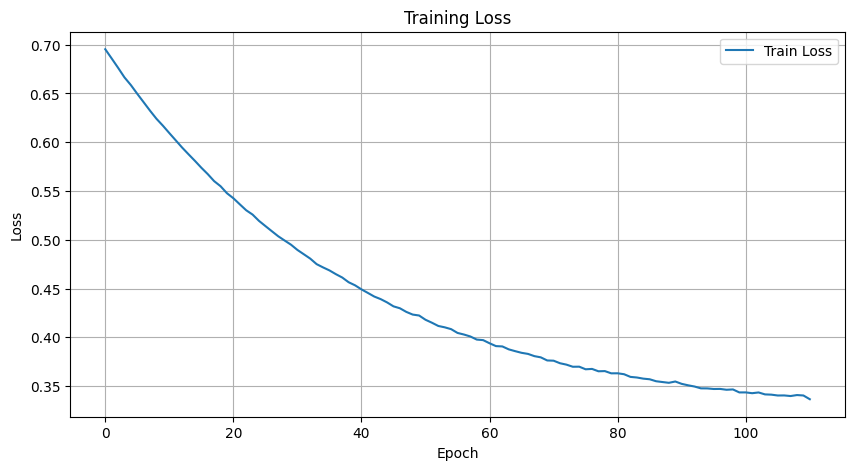

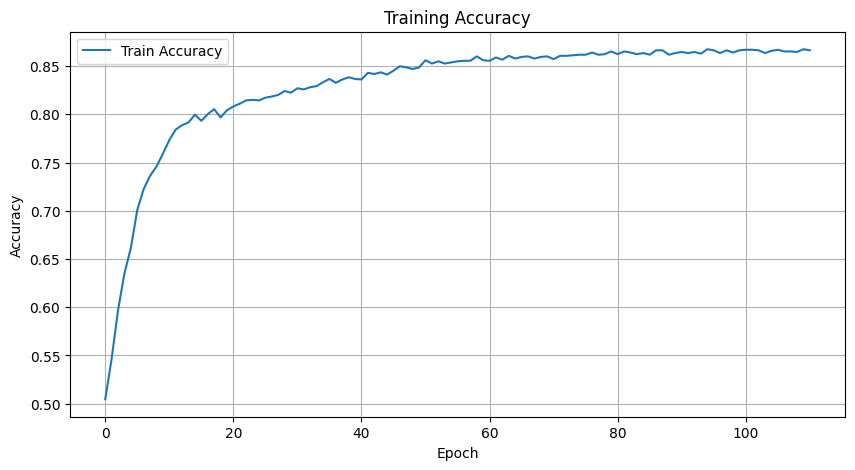

[I 2025-03-06 06:56:06,129] Trial 43 finished with value: 0.8572218856194516 and parameters: {'lr': 2.354105773889776e-05, 'hidden_size': 83, 'dropout_rate': 0.02961519025352067, 'batch_size': 32, 'num_epochs': 111}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/163], Step [10/55], Loss: 0.6399
Epoch [1/163], Step [20/55], Loss: 0.6777
Epoch [1/163], Step [30/55], Loss: 0.6267
Epoch [1/163], Step [40/55], Loss: 0.6501
Epoch [1/163], Step [50/55], Loss: 0.6385
Epoch [1/163], Train Loss: 0.6303, Train Accuracy: 0.7546
Epoch [2/163], Step [10/55], Loss: 0.6151
Epoch [2/163], Step [20/55], Loss: 0.6118
Epoch [2/163], Step [30/55], Loss: 0.5614
Epoch [2/163], Step [40/55], Loss: 0.5787
Epoch [2/163], Step [50/55], Loss: 0.5626
Epoch [2/163], Train Loss: 0.6035, Train Accuracy: 0.7620
Epoch [3/163], Step [10/55], Loss: 0.5458
Epoch [3/163], Step [20/55], Loss: 0.5956
Epoch [3/163], Step [30/55], Loss: 0.5781
Epoch [3/163], Step [40/55], Loss: 0.6099
Epoch [3/163], Step [50/55], Loss: 0.6030
Epoch [3/163], Train Loss: 0.5801, Train Accuracy: 0.7717
Epoch [4/163], Step [10/55], Loss: 0.5542
Epoch [4/163], Step [20/55], Loss: 0.5365
Epoch [4/163], Step [30/55], Loss: 0.5959
Epoch [4/163], Step [40/55], Loss: 0.5454
Epoch [4/163], Step [50/55],

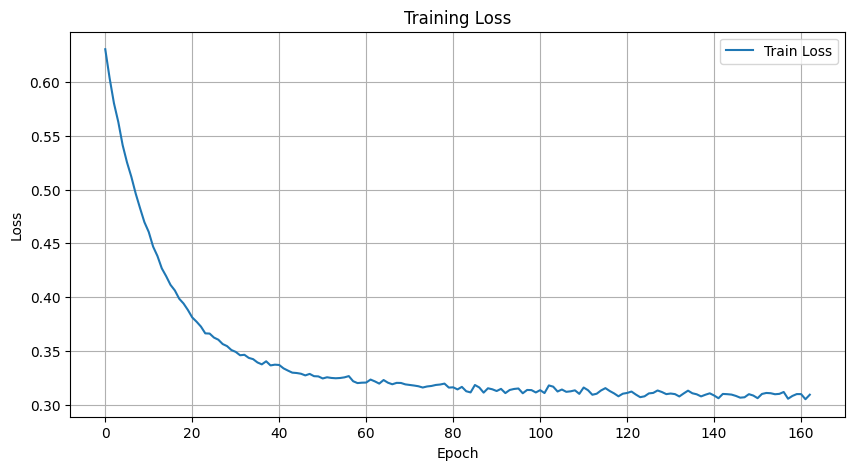

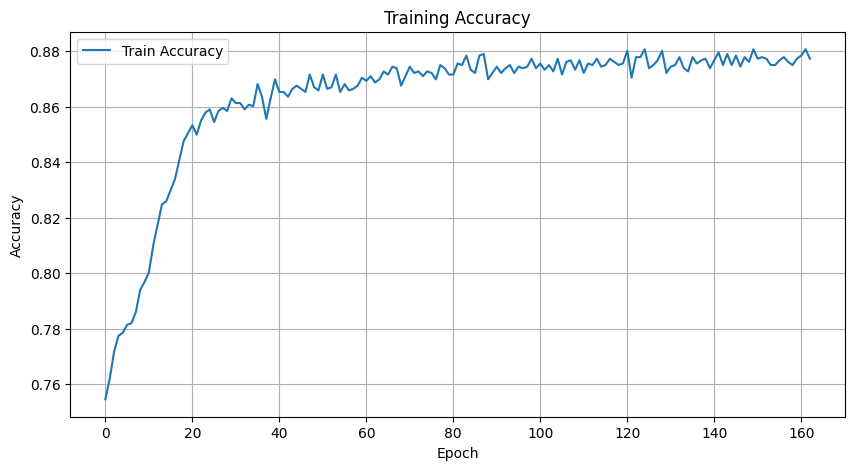

[I 2025-03-06 06:56:23,245] Trial 44 finished with value: 0.8561681725981929 and parameters: {'lr': 7.918711587924713e-05, 'hidden_size': 77, 'dropout_rate': 0.14927953654520154, 'batch_size': 32, 'num_epochs': 163}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/92], Step [10/55], Loss: 0.7041
Epoch [1/92], Step [20/55], Loss: 0.7248
Epoch [1/92], Step [30/55], Loss: 0.6676
Epoch [1/92], Step [40/55], Loss: 0.7238
Epoch [1/92], Step [50/55], Loss: 0.5971
Epoch [1/92], Train Loss: 0.6765, Train Accuracy: 0.5656
Epoch [2/92], Step [10/55], Loss: 0.5996
Epoch [2/92], Step [20/55], Loss: 0.6342
Epoch [2/92], Step [30/55], Loss: 0.5735
Epoch [2/92], Step [40/55], Loss: 0.5600
Epoch [2/92], Step [50/55], Loss: 0.5448
Epoch [2/92], Train Loss: 0.5860, Train Accuracy: 0.7831
Epoch [3/92], Step [10/55], Loss: 0.4929
Epoch [3/92], Step [20/55], Loss: 0.5177
Epoch [3/92], Step [30/55], Loss: 0.5491
Epoch [3/92], Step [40/55], Loss: 0.4759
Epoch [3/92], Step [50/55], Loss: 0.4754
Epoch [3/92], Train Loss: 0.5271, Train Accuracy: 0.8174
Epoch [4/92], Step [10/55], Loss: 0.4749
Epoch [4/92], Step [20/55], Loss: 0.5050
Epoch [4/92], Step [30/55], Loss: 0.5870
Epoch [4/92], Step [40/55], Loss: 0.5494
Epoch [4/92], Step [50/55], Loss: 0.3997
Epoch [4/

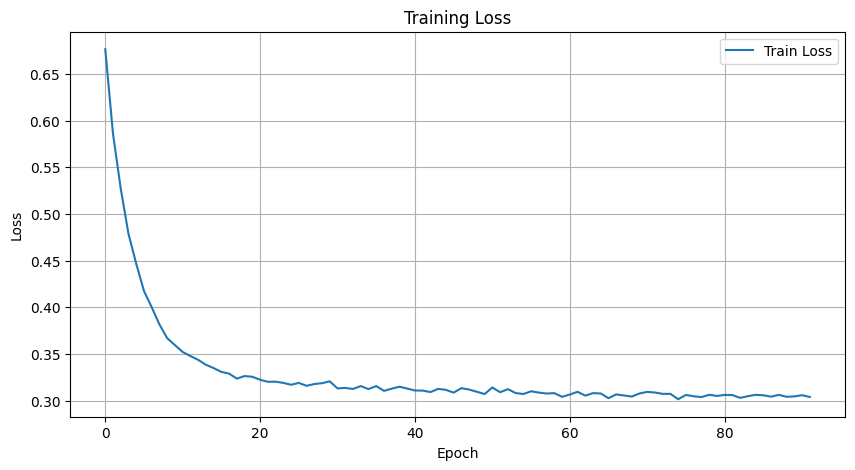

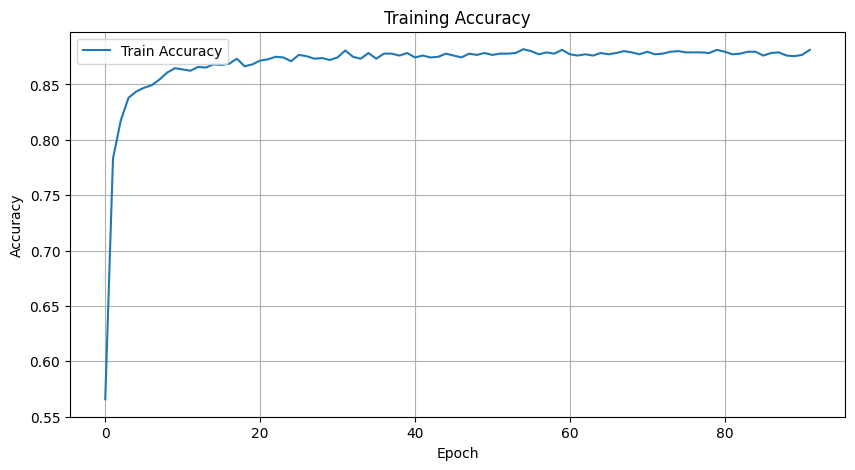

[I 2025-03-06 06:56:33,428] Trial 45 finished with value: 0.8619109085640527 and parameters: {'lr': 0.00027710248510008916, 'hidden_size': 66, 'dropout_rate': 0.11510078449015337, 'batch_size': 32, 'num_epochs': 92}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/109], Step [10/55], Loss: 0.6697
Epoch [1/109], Step [20/55], Loss: 0.7062
Epoch [1/109], Step [30/55], Loss: 0.6826
Epoch [1/109], Step [40/55], Loss: 0.6746
Epoch [1/109], Step [50/55], Loss: 0.6914
Epoch [1/109], Train Loss: 0.6915, Train Accuracy: 0.5308
Epoch [2/109], Step [10/55], Loss: 0.6777
Epoch [2/109], Step [20/55], Loss: 0.6786
Epoch [2/109], Step [30/55], Loss: 0.6823
Epoch [2/109], Step [40/55], Loss: 0.6494
Epoch [2/109], Step [50/55], Loss: 0.6241
Epoch [2/109], Train Loss: 0.6686, Train Accuracy: 0.6221
Epoch [3/109], Step [10/55], Loss: 0.6505
Epoch [3/109], Step [20/55], Loss: 0.6381
Epoch [3/109], Step [30/55], Loss: 0.5953
Epoch [3/109], Step [40/55], Loss: 0.6116
Epoch [3/109], Step [50/55], Loss: 0.6635
Epoch [3/109], Train Loss: 0.6482, Train Accuracy: 0.6941
Epoch [4/109], Step [10/55], Loss: 0.6411
Epoch [4/109], Step [20/55], Loss: 0.6051
Epoch [4/109], Step [30/55], Loss: 0.6188
Epoch [4/109], Step [40/55], Loss: 0.5814
Epoch [4/109], Step [50/55],

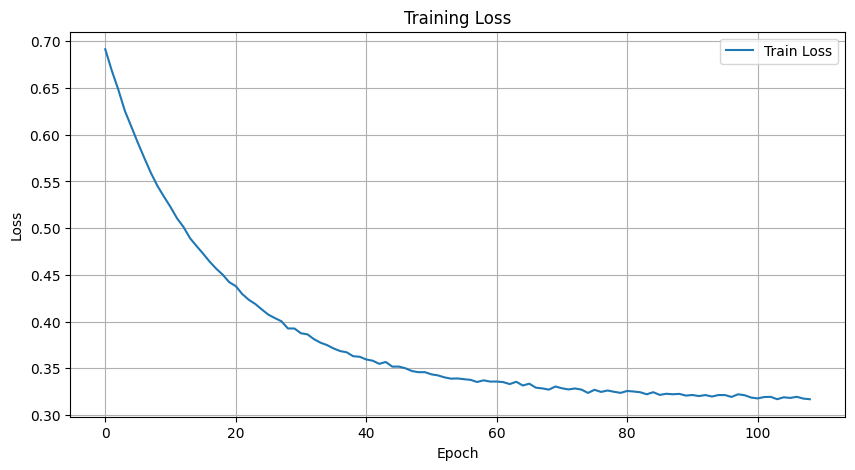

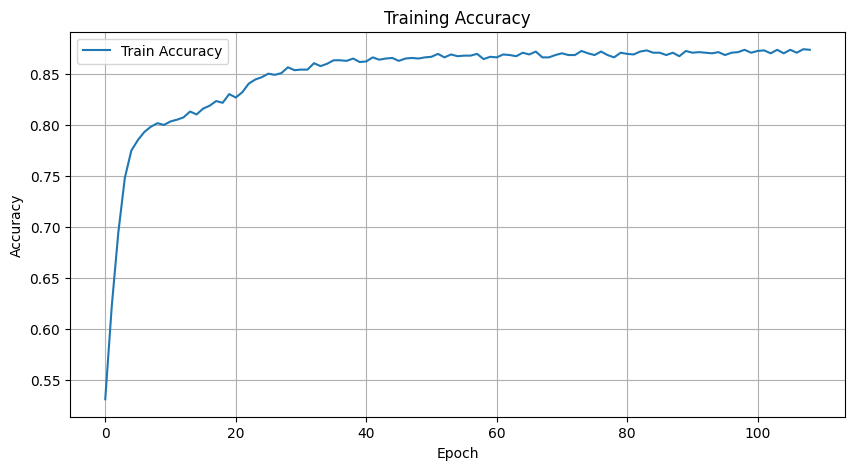

[I 2025-03-06 06:56:45,495] Trial 46 finished with value: 0.8626485076789335 and parameters: {'lr': 4.519425198668163e-05, 'hidden_size': 88, 'dropout_rate': 0.09363795718606362, 'batch_size': 32, 'num_epochs': 109}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/126], Step [10/55], Loss: 0.6873
Epoch [1/126], Step [20/55], Loss: 0.6495
Epoch [1/126], Step [30/55], Loss: 0.6448
Epoch [1/126], Step [40/55], Loss: 0.7150
Epoch [1/126], Step [50/55], Loss: 0.6250
Epoch [1/126], Train Loss: 0.6492, Train Accuracy: 0.7346
Epoch [2/126], Step [10/55], Loss: 0.6161
Epoch [2/126], Step [20/55], Loss: 0.6204
Epoch [2/126], Step [30/55], Loss: 0.6104
Epoch [2/126], Step [40/55], Loss: 0.6315
Epoch [2/126], Step [50/55], Loss: 0.6249
Epoch [2/126], Train Loss: 0.6079, Train Accuracy: 0.8088
Epoch [3/126], Step [10/55], Loss: 0.5875
Epoch [3/126], Step [20/55], Loss: 0.5912
Epoch [3/126], Step [30/55], Loss: 0.5946
Epoch [3/126], Step [40/55], Loss: 0.6023
Epoch [3/126], Step [50/55], Loss: 0.5833
Epoch [3/126], Train Loss: 0.5729, Train Accuracy: 0.8231
Epoch [4/126], Step [10/55], Loss: 0.5334
Epoch [4/126], Step [20/55], Loss: 0.5386
Epoch [4/126], Step [30/55], Loss: 0.5117
Epoch [4/126], Step [40/55], Loss: 0.5798
Epoch [4/126], Step [50/55],

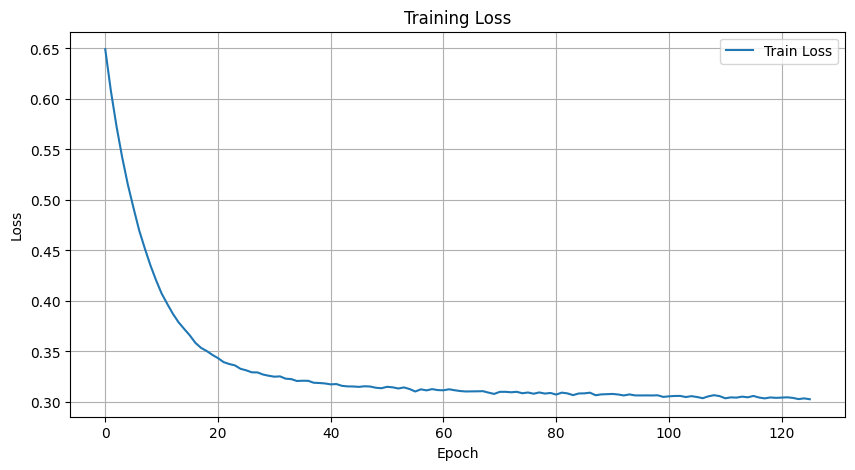

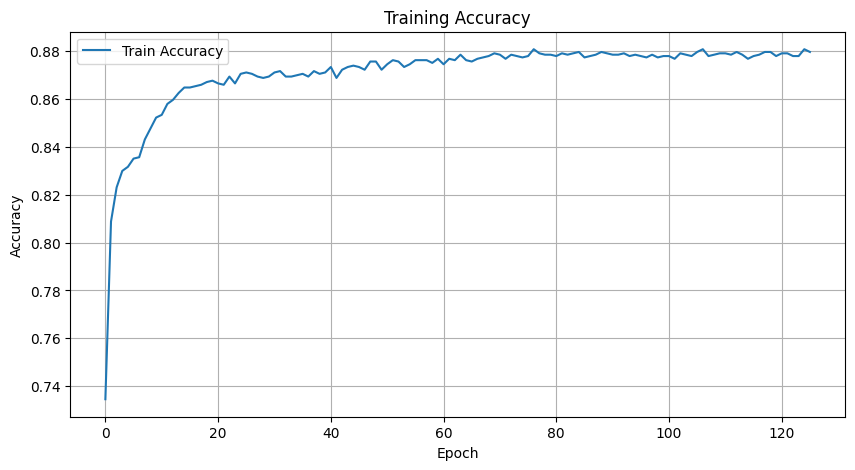

[I 2025-03-06 06:56:59,114] Trial 47 finished with value: 0.8644398198150733 and parameters: {'lr': 0.0001060185621175036, 'hidden_size': 79, 'dropout_rate': 0.013090836119462657, 'batch_size': 32, 'num_epochs': 126}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/125], Step [10/55], Loss: 0.6732
Epoch [1/125], Step [20/55], Loss: 0.6698
Epoch [1/125], Step [30/55], Loss: 0.6990
Epoch [1/125], Step [40/55], Loss: 0.6696
Epoch [1/125], Step [50/55], Loss: 0.6474
Epoch [1/125], Train Loss: 0.6854, Train Accuracy: 0.5799
Epoch [2/125], Step [10/55], Loss: 0.6163
Epoch [2/125], Step [20/55], Loss: 0.6741
Epoch [2/125], Step [30/55], Loss: 0.6387
Epoch [2/125], Step [40/55], Loss: 0.6628
Epoch [2/125], Step [50/55], Loss: 0.6386
Epoch [2/125], Train Loss: 0.6629, Train Accuracy: 0.6433
Epoch [3/125], Step [10/55], Loss: 0.6099
Epoch [3/125], Step [20/55], Loss: 0.6270
Epoch [3/125], Step [30/55], Loss: 0.6503
Epoch [3/125], Step [40/55], Loss: 0.6132
Epoch [3/125], Step [50/55], Loss: 0.6529
Epoch [3/125], Train Loss: 0.6439, Train Accuracy: 0.6975
Epoch [4/125], Step [10/55], Loss: 0.6464
Epoch [4/125], Step [20/55], Loss: 0.6394
Epoch [4/125], Step [30/55], Loss: 0.6043
Epoch [4/125], Step [40/55], Loss: 0.5891
Epoch [4/125], Step [50/55],

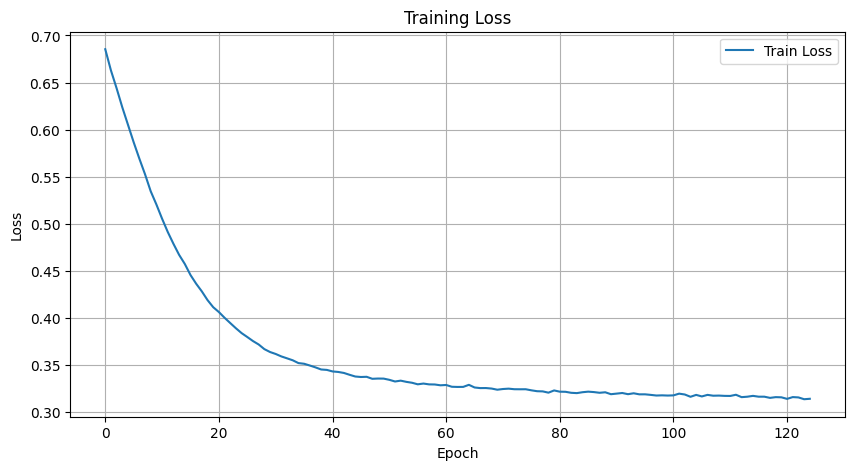

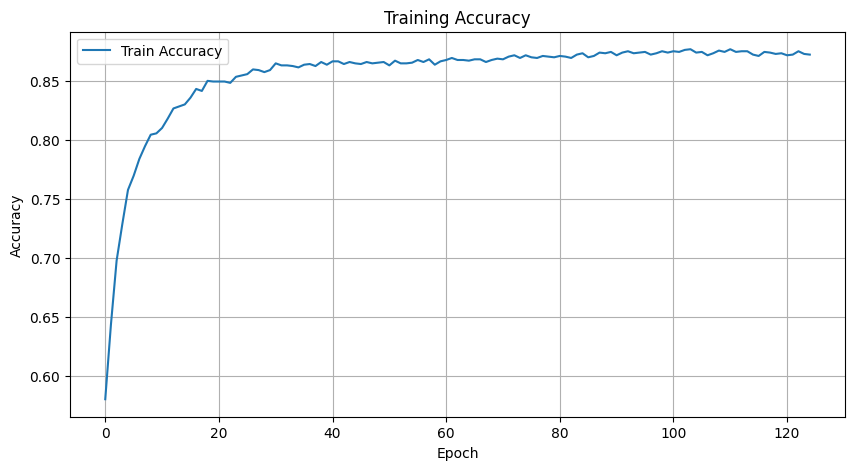

[I 2025-03-06 06:57:12,070] Trial 48 finished with value: 0.8639393061299754 and parameters: {'lr': 0.00010127565408801287, 'hidden_size': 31, 'dropout_rate': 0.01493383874315922, 'batch_size': 32, 'num_epochs': 125}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/135], Step [10/55], Loss: 0.7349
Epoch [1/135], Step [20/55], Loss: 0.7431
Epoch [1/135], Step [30/55], Loss: 0.7276
Epoch [1/135], Step [40/55], Loss: 0.7391
Epoch [1/135], Step [50/55], Loss: 0.6970
Epoch [1/135], Train Loss: 0.7302, Train Accuracy: 0.3299
Epoch [2/135], Step [10/55], Loss: 0.7319
Epoch [2/135], Step [20/55], Loss: 0.7471
Epoch [2/135], Step [30/55], Loss: 0.7592
Epoch [2/135], Step [40/55], Loss: 0.7186
Epoch [2/135], Step [50/55], Loss: 0.7277
Epoch [2/135], Train Loss: 0.7251, Train Accuracy: 0.3510
Epoch [3/135], Step [10/55], Loss: 0.7422
Epoch [3/135], Step [20/55], Loss: 0.7204
Epoch [3/135], Step [30/55], Loss: 0.7202
Epoch [3/135], Step [40/55], Loss: 0.6885
Epoch [3/135], Step [50/55], Loss: 0.7088
Epoch [3/135], Train Loss: 0.7169, Train Accuracy: 0.3898
Epoch [4/135], Step [10/55], Loss: 0.6971
Epoch [4/135], Step [20/55], Loss: 0.7156
Epoch [4/135], Step [30/55], Loss: 0.6946
Epoch [4/135], Step [40/55], Loss: 0.6891
Epoch [4/135], Step [50/55],

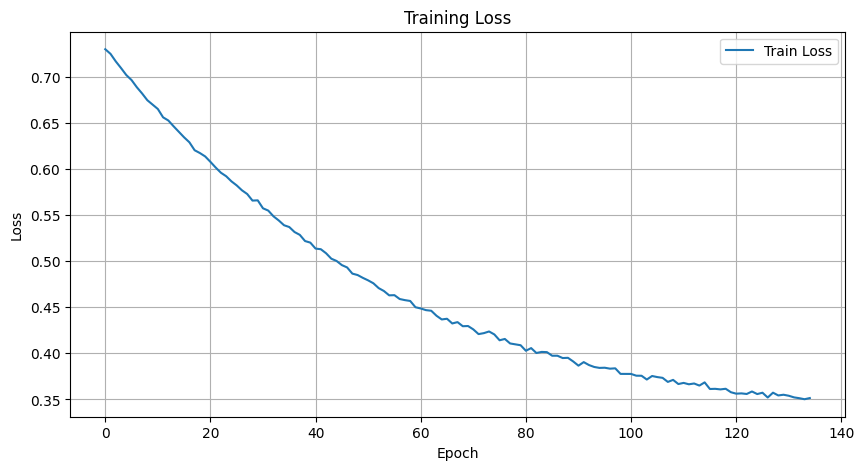

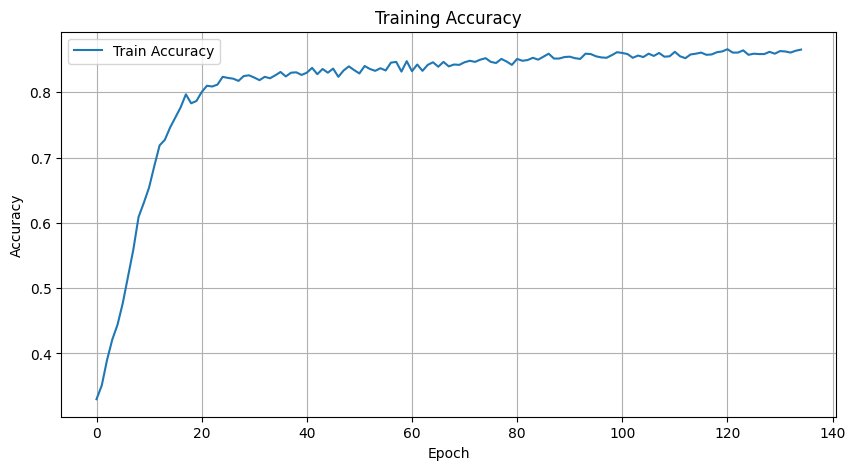

[I 2025-03-06 06:57:26,151] Trial 49 finished with value: 0.8524011485471932 and parameters: {'lr': 2.2243445856055963e-05, 'hidden_size': 51, 'dropout_rate': 0.1858484967726735, 'batch_size': 32, 'num_epochs': 135}. Best is trial 37 with value: 0.8665999315086537.


Epoch [1/142], Step [10/55], Loss: 0.6769
Epoch [1/142], Step [20/55], Loss: 0.6375
Epoch [1/142], Step [30/55], Loss: 0.6994
Epoch [1/142], Step [40/55], Loss: 0.6524
Epoch [1/142], Step [50/55], Loss: 0.6764
Epoch [1/142], Train Loss: 0.6750, Train Accuracy: 0.6176
Epoch [2/142], Step [10/55], Loss: 0.6837
Epoch [2/142], Step [20/55], Loss: 0.7151
Epoch [2/142], Step [30/55], Loss: 0.7196
Epoch [2/142], Step [40/55], Loss: 0.7264
Epoch [2/142], Step [50/55], Loss: 0.7255
Epoch [2/142], Train Loss: 0.6653, Train Accuracy: 0.6239
Epoch [3/142], Step [10/55], Loss: 0.6927
Epoch [3/142], Step [20/55], Loss: 0.6992
Epoch [3/142], Step [30/55], Loss: 0.6629
Epoch [3/142], Step [40/55], Loss: 0.6531
Epoch [3/142], Step [50/55], Loss: 0.7110
Epoch [3/142], Train Loss: 0.6518, Train Accuracy: 0.6632
Epoch [4/142], Step [10/55], Loss: 0.7099
Epoch [4/142], Step [20/55], Loss: 0.6484
Epoch [4/142], Step [30/55], Loss: 0.6678
Epoch [4/142], Step [40/55], Loss: 0.6531
Epoch [4/142], Step [50/55],

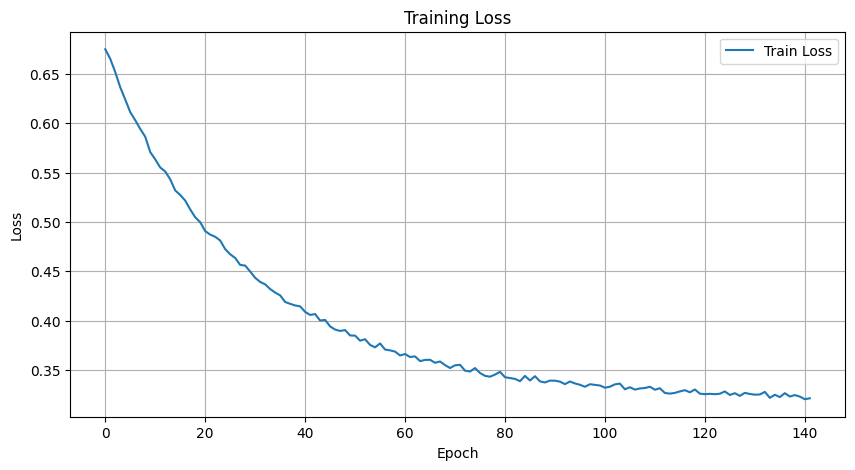

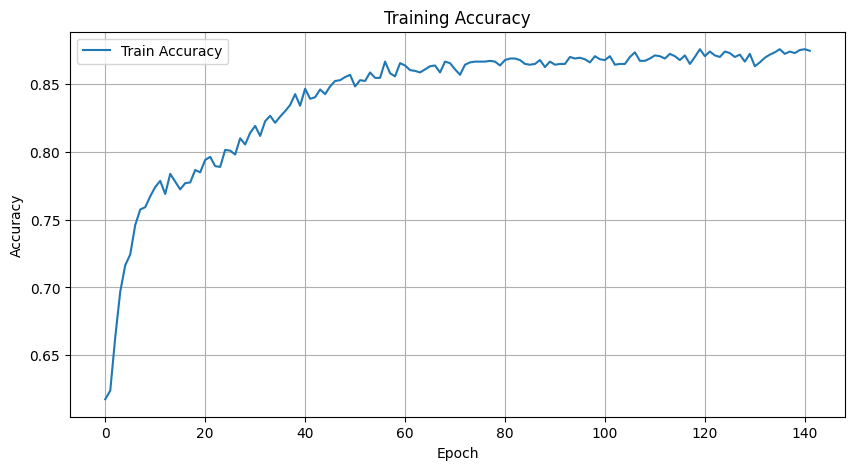

[I 2025-03-06 06:57:41,048] Trial 50 finished with value: 0.8681014725639471 and parameters: {'lr': 3.29889427434869e-05, 'hidden_size': 89, 'dropout_rate': 0.23469344555093144, 'batch_size': 32, 'num_epochs': 142}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/172], Step [10/55], Loss: 0.7897
Epoch [1/172], Step [20/55], Loss: 0.7530
Epoch [1/172], Step [30/55], Loss: 0.7472
Epoch [1/172], Step [40/55], Loss: 0.7789
Epoch [1/172], Step [50/55], Loss: 0.7750
Epoch [1/172], Train Loss: 0.7643, Train Accuracy: 0.3356
Epoch [2/172], Step [10/55], Loss: 0.7534
Epoch [2/172], Step [20/55], Loss: 0.7517
Epoch [2/172], Step [30/55], Loss: 0.7607
Epoch [2/172], Step [40/55], Loss: 0.7091
Epoch [2/172], Step [50/55], Loss: 0.7387
Epoch [2/172], Train Loss: 0.7464, Train Accuracy: 0.3830
Epoch [3/172], Step [10/55], Loss: 0.7320
Epoch [3/172], Step [20/55], Loss: 0.7747
Epoch [3/172], Step [30/55], Loss: 0.7341
Epoch [3/172], Step [40/55], Loss: 0.7226
Epoch [3/172], Step [50/55], Loss: 0.6840
Epoch [3/172], Train Loss: 0.7326, Train Accuracy: 0.4184
Epoch [4/172], Step [10/55], Loss: 0.6929
Epoch [4/172], Step [20/55], Loss: 0.7175
Epoch [4/172], Step [30/55], Loss: 0.7233
Epoch [4/172], Step [40/55], Loss: 0.6879
Epoch [4/172], Step [50/55],

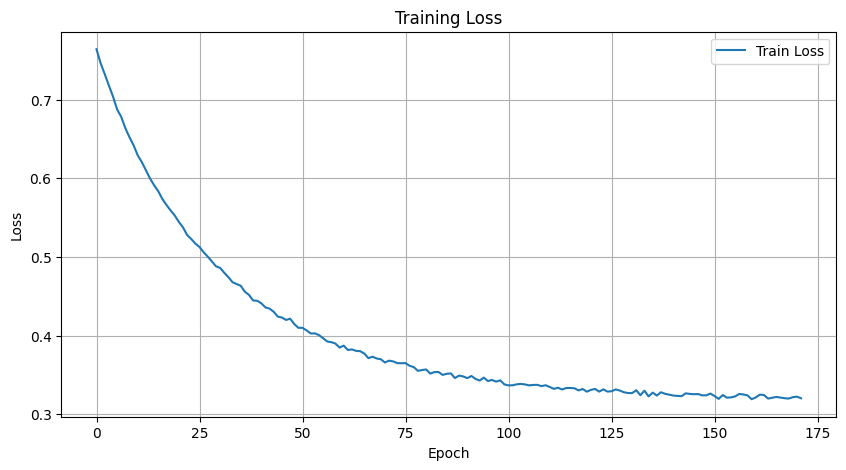

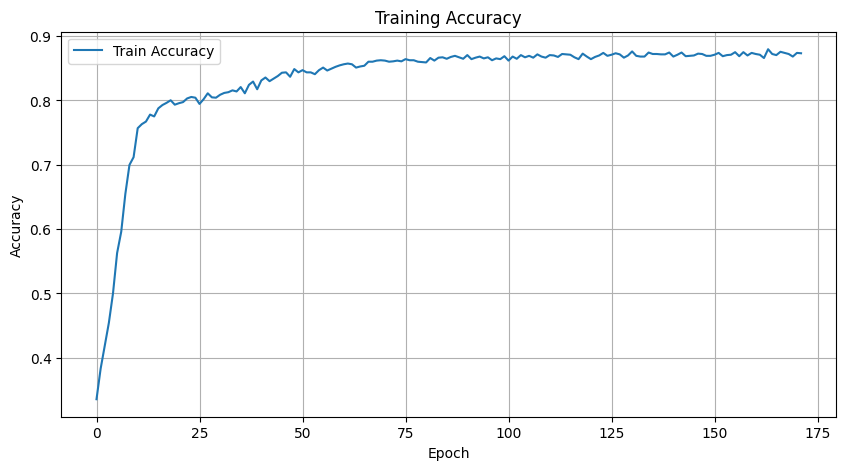

[I 2025-03-06 06:57:59,120] Trial 51 finished with value: 0.8543505176365217 and parameters: {'lr': 2.871942346027936e-05, 'hidden_size': 84, 'dropout_rate': 0.2441592028266642, 'batch_size': 32, 'num_epochs': 172}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/144], Step [10/55], Loss: 0.7252
Epoch [1/144], Step [20/55], Loss: 0.7217
Epoch [1/144], Step [30/55], Loss: 0.6561
Epoch [1/144], Step [40/55], Loss: 0.6695
Epoch [1/144], Step [50/55], Loss: 0.6901
Epoch [1/144], Train Loss: 0.6871, Train Accuracy: 0.5308
Epoch [2/144], Step [10/55], Loss: 0.6831
Epoch [2/144], Step [20/55], Loss: 0.6532
Epoch [2/144], Step [30/55], Loss: 0.6468
Epoch [2/144], Step [40/55], Loss: 0.6542
Epoch [2/144], Step [50/55], Loss: 0.6270
Epoch [2/144], Train Loss: 0.6643, Train Accuracy: 0.6016
Epoch [3/144], Step [10/55], Loss: 0.6000
Epoch [3/144], Step [20/55], Loss: 0.6280
Epoch [3/144], Step [30/55], Loss: 0.6618
Epoch [3/144], Step [40/55], Loss: 0.6798
Epoch [3/144], Step [50/55], Loss: 0.6245
Epoch [3/144], Train Loss: 0.6427, Train Accuracy: 0.6564
Epoch [4/144], Step [10/55], Loss: 0.6390
Epoch [4/144], Step [20/55], Loss: 0.6102
Epoch [4/144], Step [30/55], Loss: 0.6014
Epoch [4/144], Step [40/55], Loss: 0.6301
Epoch [4/144], Step [50/55],

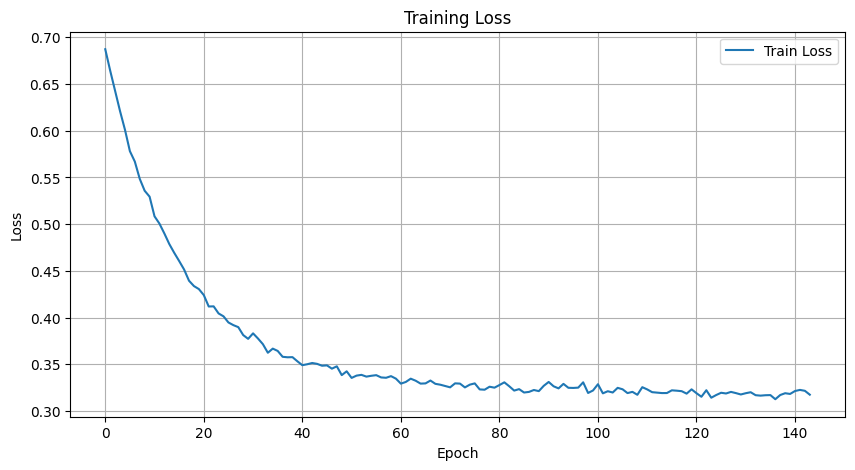

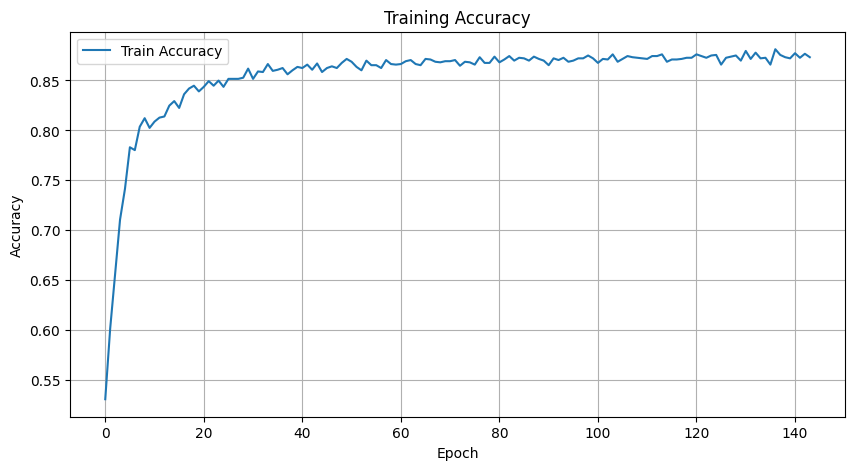

[I 2025-03-06 06:58:14,210] Trial 52 finished with value: 0.859619082742815 and parameters: {'lr': 5.9433534005923294e-05, 'hidden_size': 89, 'dropout_rate': 0.347066947625849, 'batch_size': 32, 'num_epochs': 144}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/156], Step [10/55], Loss: 0.6897
Epoch [1/156], Step [20/55], Loss: 0.7498
Epoch [1/156], Step [30/55], Loss: 0.6812
Epoch [1/156], Step [40/55], Loss: 0.6930
Epoch [1/156], Step [50/55], Loss: 0.6926
Epoch [1/156], Train Loss: 0.6981, Train Accuracy: 0.5382
Epoch [2/156], Step [10/55], Loss: 0.6870
Epoch [2/156], Step [20/55], Loss: 0.6981
Epoch [2/156], Step [30/55], Loss: 0.6918
Epoch [2/156], Step [40/55], Loss: 0.6867
Epoch [2/156], Step [50/55], Loss: 0.6949
Epoch [2/156], Train Loss: 0.6918, Train Accuracy: 0.5400
Epoch [3/156], Step [10/55], Loss: 0.7059
Epoch [3/156], Step [20/55], Loss: 0.6880
Epoch [3/156], Step [30/55], Loss: 0.6625
Epoch [3/156], Step [40/55], Loss: 0.6811
Epoch [3/156], Step [50/55], Loss: 0.6674
Epoch [3/156], Train Loss: 0.6814, Train Accuracy: 0.6033
Epoch [4/156], Step [10/55], Loss: 0.6980
Epoch [4/156], Step [20/55], Loss: 0.6693
Epoch [4/156], Step [30/55], Loss: 0.6724
Epoch [4/156], Step [40/55], Loss: 0.7033
Epoch [4/156], Step [50/55],

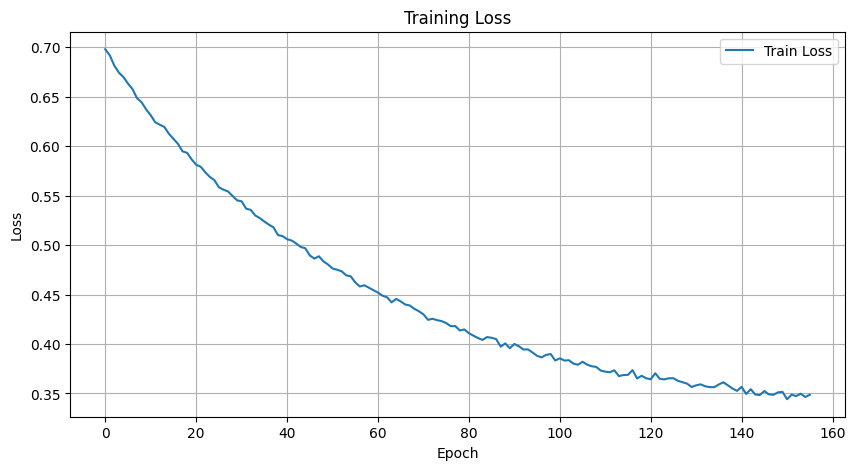

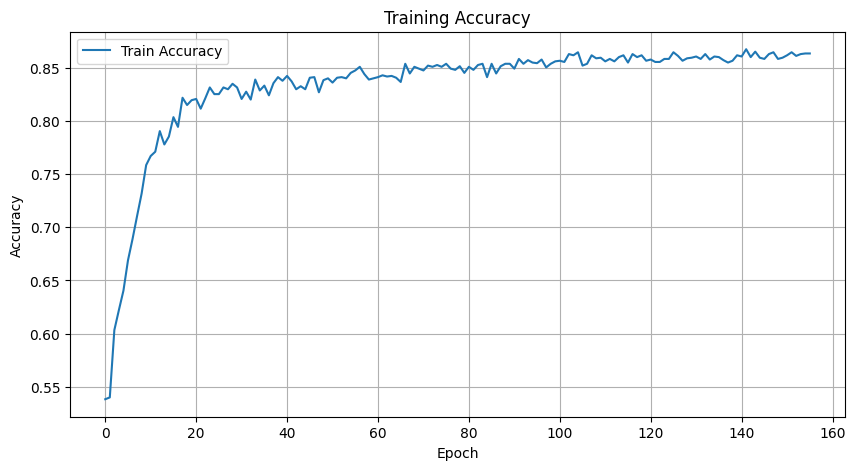

[I 2025-03-06 06:58:30,609] Trial 53 finished with value: 0.8572218856194516 and parameters: {'lr': 1.619746440424442e-05, 'hidden_size': 79, 'dropout_rate': 0.2921349261897605, 'batch_size': 32, 'num_epochs': 156}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/129], Step [10/55], Loss: 0.8076
Epoch [1/129], Step [20/55], Loss: 0.7862
Epoch [1/129], Step [30/55], Loss: 0.7648
Epoch [1/129], Step [40/55], Loss: 0.7974
Epoch [1/129], Step [50/55], Loss: 0.7299
Epoch [1/129], Train Loss: 0.7875, Train Accuracy: 0.2900
Epoch [2/129], Step [10/55], Loss: 0.7007
Epoch [2/129], Step [20/55], Loss: 0.7159
Epoch [2/129], Step [30/55], Loss: 0.7349
Epoch [2/129], Step [40/55], Loss: 0.6547
Epoch [2/129], Step [50/55], Loss: 0.6922
Epoch [2/129], Train Loss: 0.7071, Train Accuracy: 0.4675
Epoch [3/129], Step [10/55], Loss: 0.6909
Epoch [3/129], Step [20/55], Loss: 0.6605
Epoch [3/129], Step [30/55], Loss: 0.6347
Epoch [3/129], Step [40/55], Loss: 0.6567
Epoch [3/129], Step [50/55], Loss: 0.6319
Epoch [3/129], Train Loss: 0.6448, Train Accuracy: 0.6809
Epoch [4/129], Step [10/55], Loss: 0.5767
Epoch [4/129], Step [20/55], Loss: 0.6152
Epoch [4/129], Step [30/55], Loss: 0.6480
Epoch [4/129], Step [40/55], Loss: 0.5706
Epoch [4/129], Step [50/55],

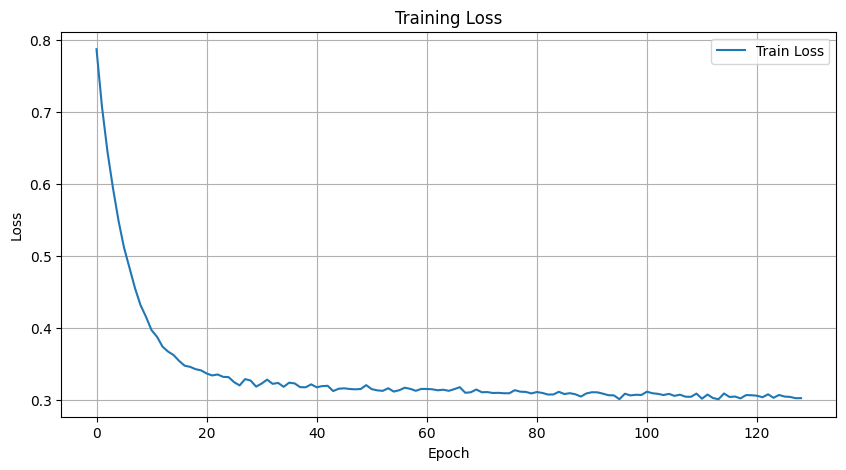

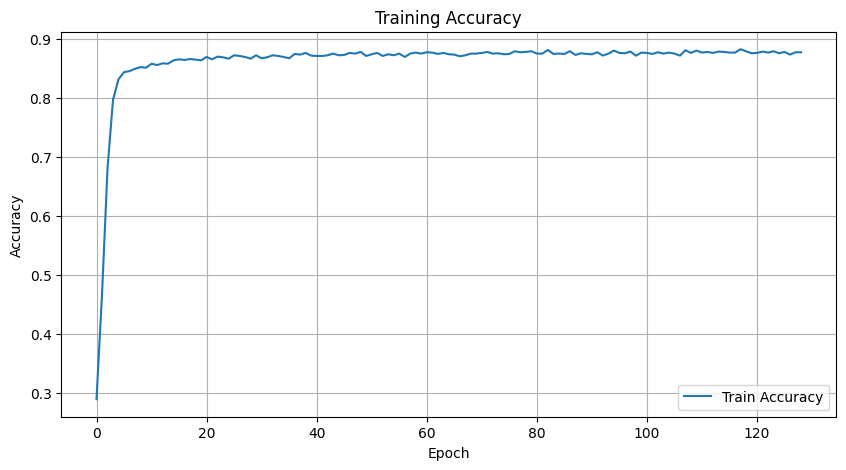

[I 2025-03-06 06:58:44,229] Trial 54 finished with value: 0.8582755986407102 and parameters: {'lr': 0.0001469319465802024, 'hidden_size': 95, 'dropout_rate': 0.23569130390281115, 'batch_size': 32, 'num_epochs': 129}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/135], Step [10/55], Loss: 0.7217
Epoch [1/135], Step [20/55], Loss: 0.6740
Epoch [1/135], Step [30/55], Loss: 0.6856
Epoch [1/135], Step [40/55], Loss: 0.7072
Epoch [1/135], Step [50/55], Loss: 0.6959
Epoch [1/135], Train Loss: 0.6943, Train Accuracy: 0.4846
Epoch [2/135], Step [10/55], Loss: 0.7096
Epoch [2/135], Step [20/55], Loss: 0.6739
Epoch [2/135], Step [30/55], Loss: 0.6866
Epoch [2/135], Step [40/55], Loss: 0.6872
Epoch [2/135], Step [50/55], Loss: 0.6761
Epoch [2/135], Train Loss: 0.6771, Train Accuracy: 0.5354
Epoch [3/135], Step [10/55], Loss: 0.6683
Epoch [3/135], Step [20/55], Loss: 0.6505
Epoch [3/135], Step [30/55], Loss: 0.6651
Epoch [3/135], Step [40/55], Loss: 0.6713
Epoch [3/135], Step [50/55], Loss: 0.6633
Epoch [3/135], Train Loss: 0.6610, Train Accuracy: 0.5890
Epoch [4/135], Step [10/55], Loss: 0.6440
Epoch [4/135], Step [20/55], Loss: 0.6540
Epoch [4/135], Step [30/55], Loss: 0.6688
Epoch [4/135], Step [40/55], Loss: 0.6751
Epoch [4/135], Step [50/55],

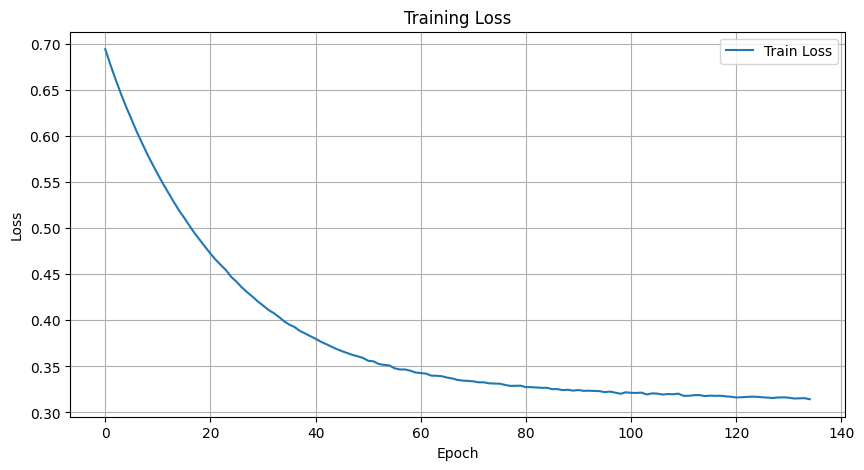

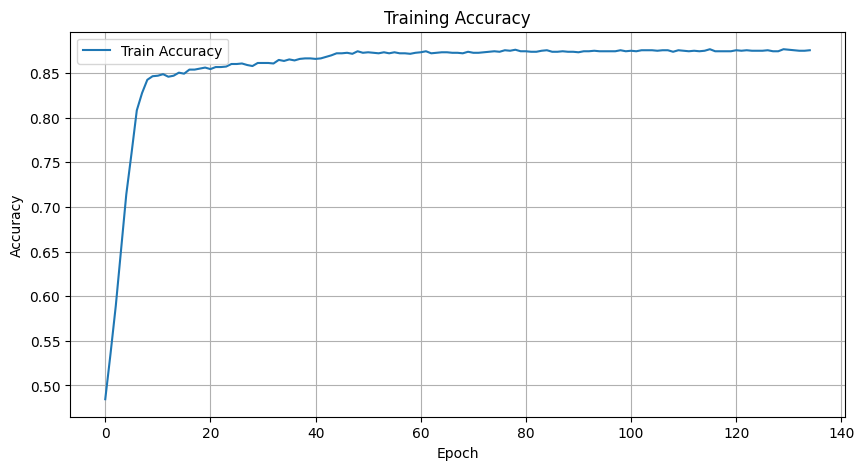

[I 2025-03-06 06:58:58,560] Trial 55 finished with value: 0.8598825109981296 and parameters: {'lr': 3.583849823187297e-05, 'hidden_size': 86, 'dropout_rate': 0.0024320423591187856, 'batch_size': 32, 'num_epochs': 135}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/122], Step [10/55], Loss: 0.6589
Epoch [1/122], Step [20/55], Loss: 0.5830
Epoch [1/122], Step [30/55], Loss: 0.6280
Epoch [1/122], Step [40/55], Loss: 0.5931
Epoch [1/122], Step [50/55], Loss: 0.5733
Epoch [1/122], Train Loss: 0.6078, Train Accuracy: 0.7586
Epoch [2/122], Step [10/55], Loss: 0.5762
Epoch [2/122], Step [20/55], Loss: 0.5800
Epoch [2/122], Step [30/55], Loss: 0.5994
Epoch [2/122], Step [40/55], Loss: 0.5736
Epoch [2/122], Step [50/55], Loss: 0.5349
Epoch [2/122], Train Loss: 0.5835, Train Accuracy: 0.7728
Epoch [3/122], Step [10/55], Loss: 0.5661
Epoch [3/122], Step [20/55], Loss: 0.5528
Epoch [3/122], Step [30/55], Loss: 0.5929
Epoch [3/122], Step [40/55], Loss: 0.5581
Epoch [3/122], Step [50/55], Loss: 0.4852
Epoch [3/122], Train Loss: 0.5589, Train Accuracy: 0.7837
Epoch [4/122], Step [10/55], Loss: 0.5866
Epoch [4/122], Step [20/55], Loss: 0.5135
Epoch [4/122], Step [30/55], Loss: 0.4708
Epoch [4/122], Step [40/55], Loss: 0.5024
Epoch [4/122], Step [50/55],

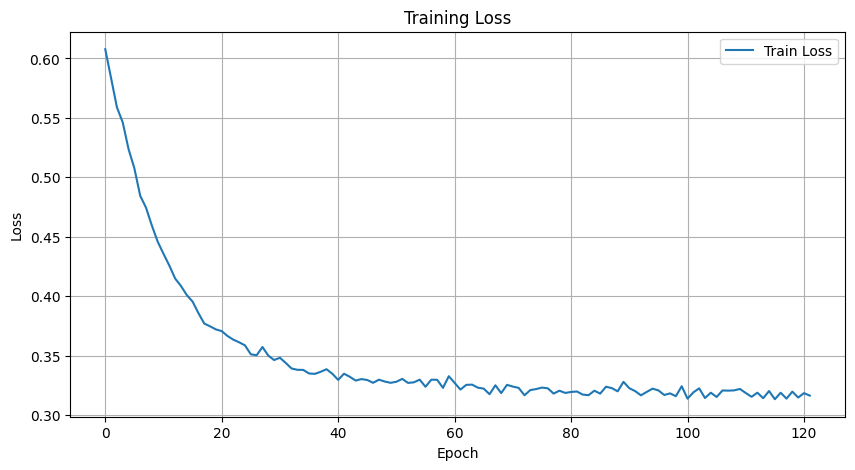

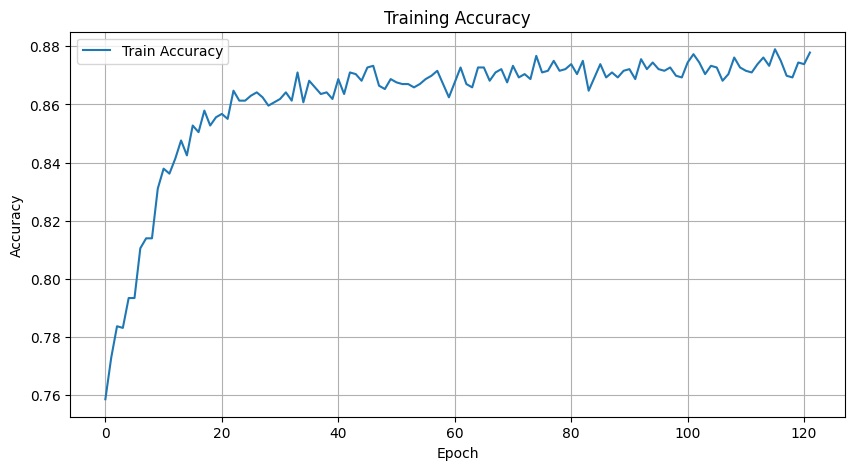

[I 2025-03-06 06:59:11,802] Trial 56 finished with value: 0.8599088538236611 and parameters: {'lr': 8.514867597591308e-05, 'hidden_size': 90, 'dropout_rate': 0.3937482412070506, 'batch_size': 32, 'num_epochs': 122}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/140], Step [10/28], Loss: 0.6288
Epoch [1/140], Step [20/28], Loss: 0.6435
Epoch [1/140], Train Loss: 0.6494, Train Accuracy: 0.5902
Epoch [2/140], Step [10/28], Loss: 0.6182
Epoch [2/140], Step [20/28], Loss: 0.6269
Epoch [2/140], Train Loss: 0.6328, Train Accuracy: 0.6758
Epoch [3/140], Step [10/28], Loss: 0.6707
Epoch [3/140], Step [20/28], Loss: 0.5860
Epoch [3/140], Train Loss: 0.6101, Train Accuracy: 0.7460
Epoch [4/140], Step [10/28], Loss: 0.6199
Epoch [4/140], Step [20/28], Loss: 0.6013
Epoch [4/140], Train Loss: 0.5921, Train Accuracy: 0.7905
Epoch [5/140], Step [10/28], Loss: 0.5965
Epoch [5/140], Step [20/28], Loss: 0.6221
Epoch [5/140], Train Loss: 0.5770, Train Accuracy: 0.8065
Epoch [6/140], Step [10/28], Loss: 0.5950
Epoch [6/140], Step [20/28], Loss: 0.5693
Epoch [6/140], Train Loss: 0.5595, Train Accuracy: 0.8076
Epoch [7/140], Step [10/28], Loss: 0.6011
Epoch [7/140], Step [20/28], Loss: 0.5352
Epoch [7/140], Train Loss: 0.5465, Train Accuracy: 0.8151
Epoch 

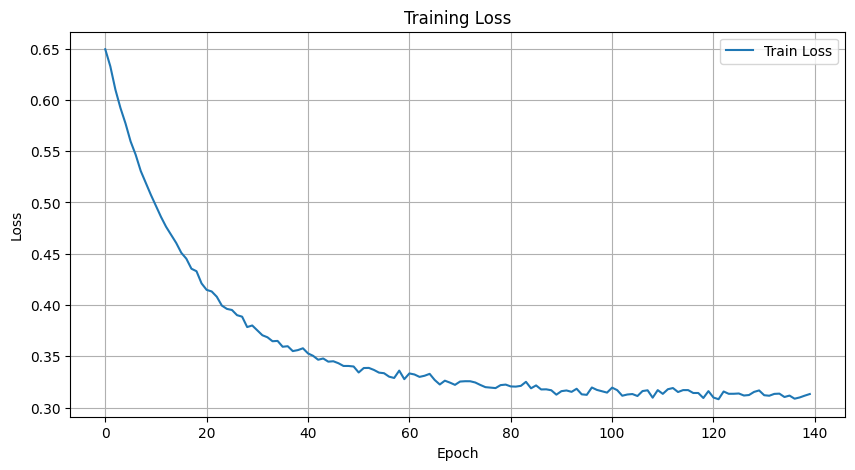

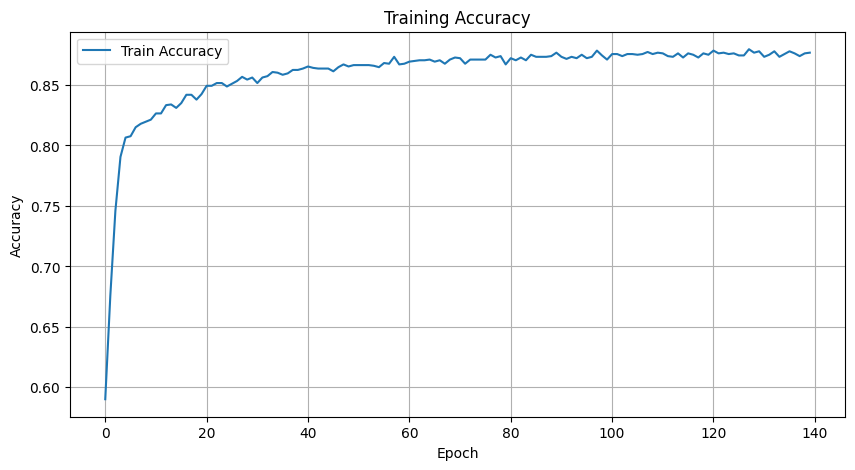

[I 2025-03-06 06:59:20,662] Trial 57 finished with value: 0.8612259951002343 and parameters: {'lr': 9.650664941518855e-05, 'hidden_size': 72, 'dropout_rate': 0.07612057009226558, 'batch_size': 64, 'num_epochs': 140}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/114], Step [10/55], Loss: 0.6355
Epoch [1/114], Step [20/55], Loss: 0.6647
Epoch [1/114], Step [30/55], Loss: 0.5518
Epoch [1/114], Step [40/55], Loss: 0.5901
Epoch [1/114], Step [50/55], Loss: 0.6106
Epoch [1/114], Train Loss: 0.6137, Train Accuracy: 0.7614
Epoch [2/114], Step [10/55], Loss: 0.5780
Epoch [2/114], Step [20/55], Loss: 0.5441
Epoch [2/114], Step [30/55], Loss: 0.4978
Epoch [2/114], Step [40/55], Loss: 0.5117
Epoch [2/114], Step [50/55], Loss: 0.4835
Epoch [2/114], Train Loss: 0.5371, Train Accuracy: 0.8054
Epoch [3/114], Step [10/55], Loss: 0.4860
Epoch [3/114], Step [20/55], Loss: 0.4500
Epoch [3/114], Step [30/55], Loss: 0.4884
Epoch [3/114], Step [40/55], Loss: 0.5389
Epoch [3/114], Step [50/55], Loss: 0.4490
Epoch [3/114], Train Loss: 0.4769, Train Accuracy: 0.8276
Epoch [4/114], Step [10/55], Loss: 0.4148
Epoch [4/114], Step [20/55], Loss: 0.4838
Epoch [4/114], Step [30/55], Loss: 0.4968
Epoch [4/114], Step [40/55], Loss: 0.4139
Epoch [4/114], Step [50/55],

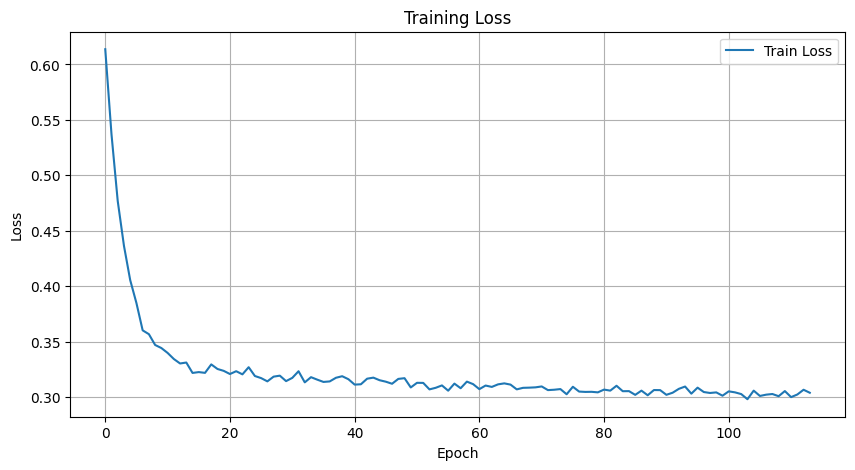

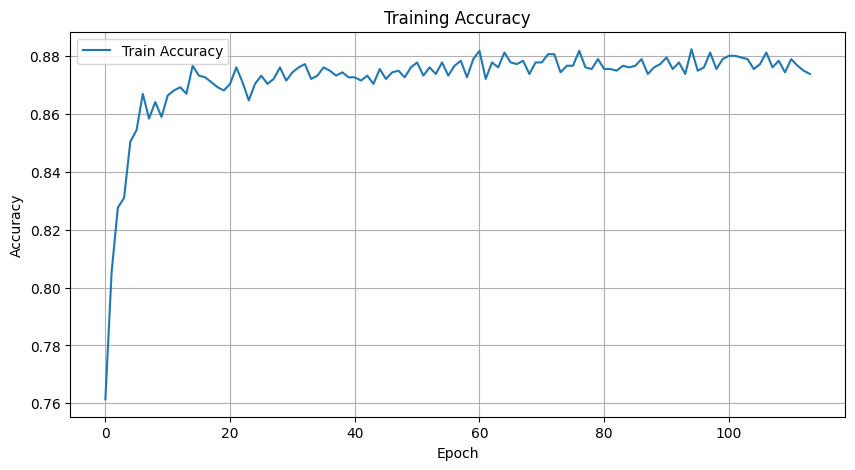

[I 2025-03-06 06:59:32,361] Trial 58 finished with value: 0.863623192223598 and parameters: {'lr': 0.00027326142567495856, 'hidden_size': 81, 'dropout_rate': 0.2696732495355767, 'batch_size': 32, 'num_epochs': 114}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/83], Step [10/55], Loss: 0.6580
Epoch [1/83], Step [20/55], Loss: 0.6382
Epoch [1/83], Step [30/55], Loss: 0.6160
Epoch [1/83], Step [40/55], Loss: 0.5905
Epoch [1/83], Step [50/55], Loss: 0.5921
Epoch [1/83], Train Loss: 0.6126, Train Accuracy: 0.7374
Epoch [2/83], Step [10/55], Loss: 0.6193
Epoch [2/83], Step [20/55], Loss: 0.5821
Epoch [2/83], Step [30/55], Loss: 0.6288
Epoch [2/83], Step [40/55], Loss: 0.5618
Epoch [2/83], Step [50/55], Loss: 0.5889
Epoch [2/83], Train Loss: 0.5953, Train Accuracy: 0.7620
Epoch [3/83], Step [10/55], Loss: 0.6298
Epoch [3/83], Step [20/55], Loss: 0.6202
Epoch [3/83], Step [30/55], Loss: 0.5158
Epoch [3/83], Step [40/55], Loss: 0.5126
Epoch [3/83], Step [50/55], Loss: 0.5779
Epoch [3/83], Train Loss: 0.5790, Train Accuracy: 0.7763
Epoch [4/83], Step [10/55], Loss: 0.5526
Epoch [4/83], Step [20/55], Loss: 0.5803
Epoch [4/83], Step [30/55], Loss: 0.5693
Epoch [4/83], Step [40/55], Loss: 0.5484
Epoch [4/83], Step [50/55], Loss: 0.5689
Epoch [4/

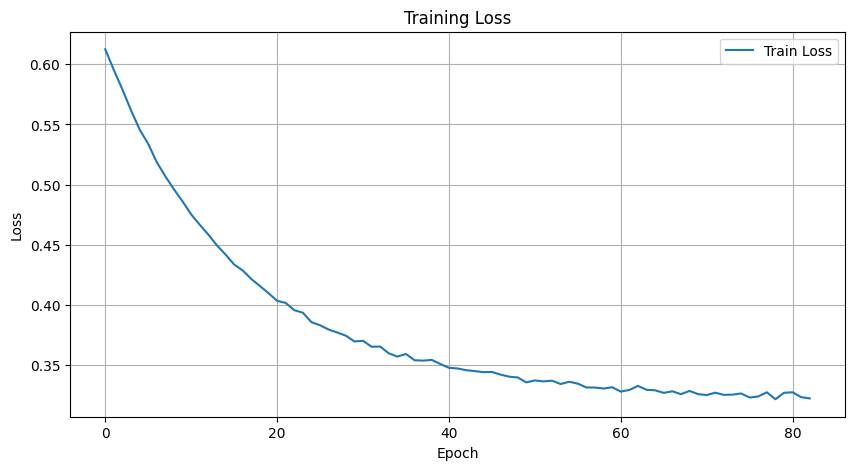

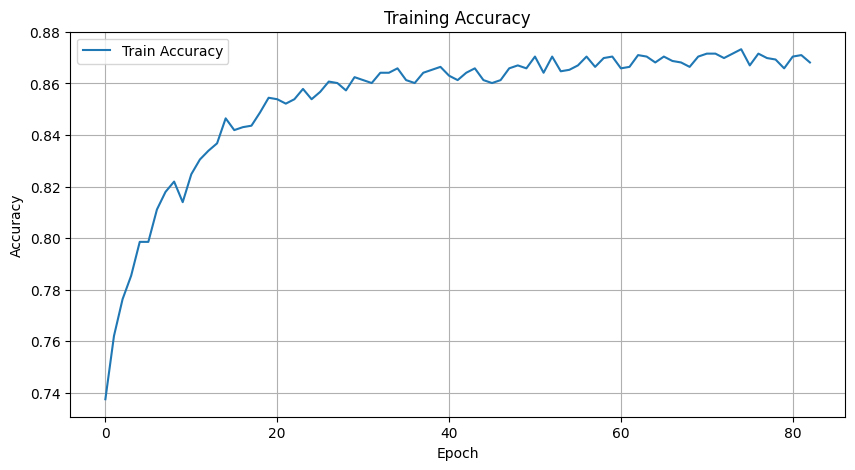

[I 2025-03-06 06:59:41,153] Trial 59 finished with value: 0.8661257606490872 and parameters: {'lr': 4.517100713633661e-05, 'hidden_size': 96, 'dropout_rate': 0.16161475290895932, 'batch_size': 32, 'num_epochs': 83}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/189], Step [10/55], Loss: 0.7470
Epoch [1/189], Step [20/55], Loss: 0.7442
Epoch [1/189], Step [30/55], Loss: 0.7495
Epoch [1/189], Step [40/55], Loss: 0.7291
Epoch [1/189], Step [50/55], Loss: 0.7480
Epoch [1/189], Train Loss: 0.7369, Train Accuracy: 0.3345
Epoch [2/189], Step [10/55], Loss: 0.7644
Epoch [2/189], Step [20/55], Loss: 0.7018
Epoch [2/189], Step [30/55], Loss: 0.7521
Epoch [2/189], Step [40/55], Loss: 0.6949
Epoch [2/189], Step [50/55], Loss: 0.7514
Epoch [2/189], Train Loss: 0.7335, Train Accuracy: 0.3436
Epoch [3/189], Step [10/55], Loss: 0.7546
Epoch [3/189], Step [20/55], Loss: 0.7155
Epoch [3/189], Step [30/55], Loss: 0.7355
Epoch [3/189], Step [40/55], Loss: 0.7456
Epoch [3/189], Step [50/55], Loss: 0.7259
Epoch [3/189], Train Loss: 0.7242, Train Accuracy: 0.4007
Epoch [4/189], Step [10/55], Loss: 0.7436
Epoch [4/189], Step [20/55], Loss: 0.7005
Epoch [4/189], Step [30/55], Loss: 0.7059
Epoch [4/189], Step [40/55], Loss: 0.6865
Epoch [4/189], Step [50/55],

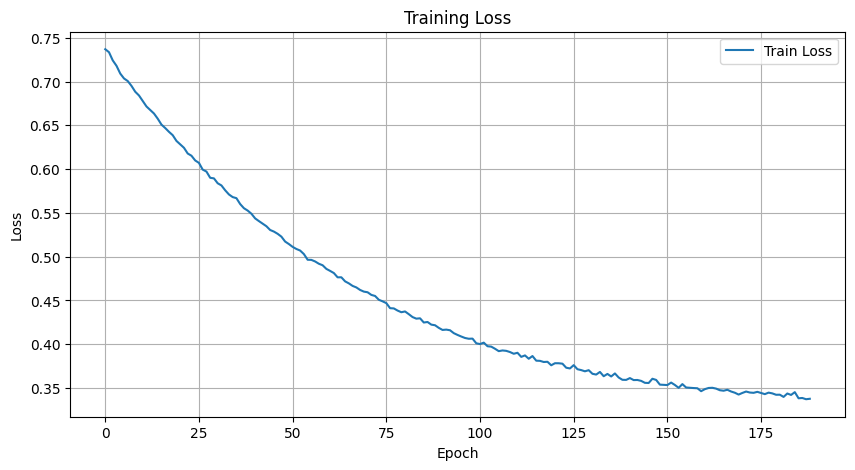

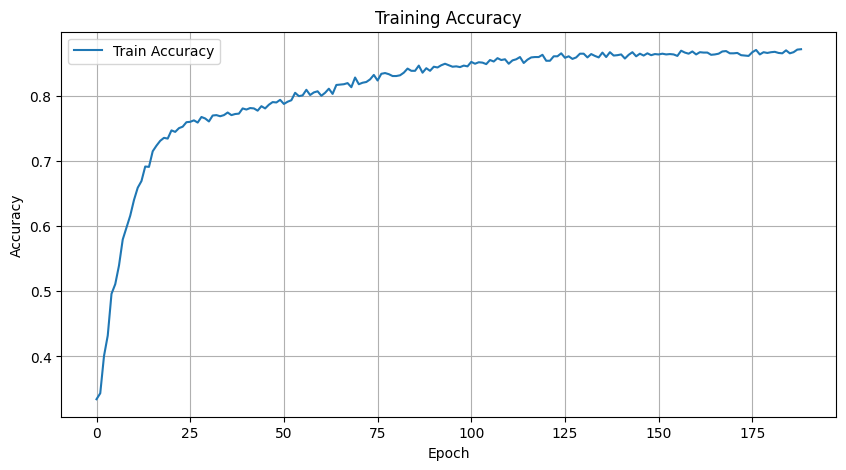

[I 2025-03-06 07:00:00,475] Trial 60 finished with value: 0.8544032032875847 and parameters: {'lr': 1.5167733775711158e-05, 'hidden_size': 91, 'dropout_rate': 0.20210258419497906, 'batch_size': 32, 'num_epochs': 189}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/81], Step [10/55], Loss: 0.6138
Epoch [1/81], Step [20/55], Loss: 0.6252
Epoch [1/81], Step [30/55], Loss: 0.5878
Epoch [1/81], Step [40/55], Loss: 0.5948
Epoch [1/81], Step [50/55], Loss: 0.6243
Epoch [1/81], Train Loss: 0.6134, Train Accuracy: 0.7580
Epoch [2/81], Step [10/55], Loss: 0.6174
Epoch [2/81], Step [20/55], Loss: 0.6156
Epoch [2/81], Step [30/55], Loss: 0.6236
Epoch [2/81], Step [40/55], Loss: 0.6030
Epoch [2/81], Step [50/55], Loss: 0.5795
Epoch [2/81], Train Loss: 0.5978, Train Accuracy: 0.7608
Epoch [3/81], Step [10/55], Loss: 0.5527
Epoch [3/81], Step [20/55], Loss: 0.5464
Epoch [3/81], Step [30/55], Loss: 0.5604
Epoch [3/81], Step [40/55], Loss: 0.5557
Epoch [3/81], Step [50/55], Loss: 0.5851
Epoch [3/81], Train Loss: 0.5789, Train Accuracy: 0.7768
Epoch [4/81], Step [10/55], Loss: 0.5042
Epoch [4/81], Step [20/55], Loss: 0.5475
Epoch [4/81], Step [30/55], Loss: 0.5848
Epoch [4/81], Step [40/55], Loss: 0.5792
Epoch [4/81], Step [50/55], Loss: 0.6527
Epoch [4/

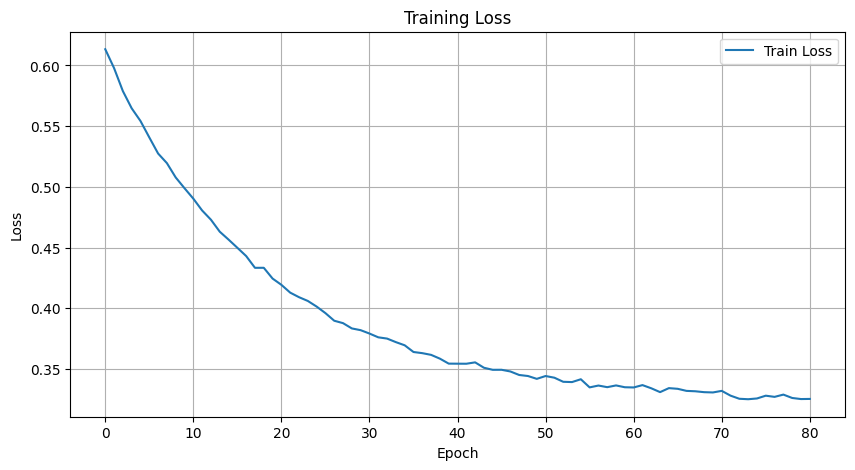

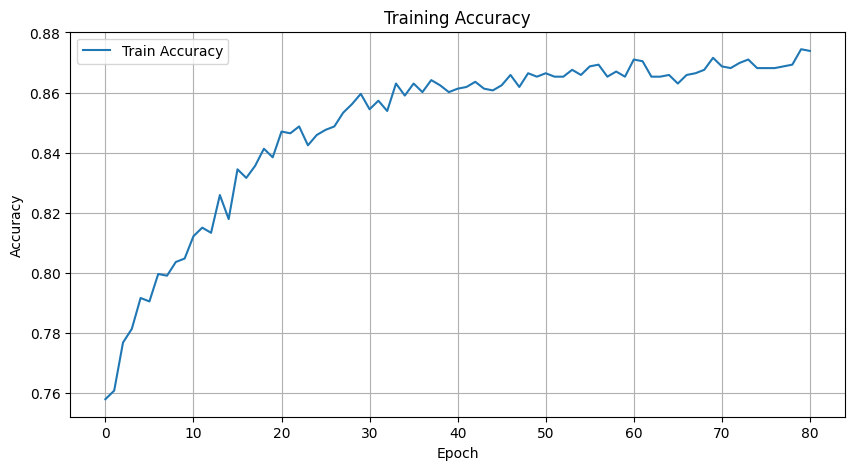

[I 2025-03-06 07:00:09,854] Trial 61 finished with value: 0.8665999315086536 and parameters: {'lr': 4.6299925176500337e-05, 'hidden_size': 97, 'dropout_rate': 0.16375670071271636, 'batch_size': 32, 'num_epochs': 81}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/81], Step [10/55], Loss: 0.6342
Epoch [1/81], Step [20/55], Loss: 0.6866
Epoch [1/81], Step [30/55], Loss: 0.6700
Epoch [1/81], Step [40/55], Loss: 0.6754
Epoch [1/81], Step [50/55], Loss: 0.6773
Epoch [1/81], Train Loss: 0.6790, Train Accuracy: 0.5731
Epoch [2/81], Step [10/55], Loss: 0.6856
Epoch [2/81], Step [20/55], Loss: 0.6236
Epoch [2/81], Step [30/55], Loss: 0.6656
Epoch [2/81], Step [40/55], Loss: 0.6442
Epoch [2/81], Step [50/55], Loss: 0.6660
Epoch [2/81], Train Loss: 0.6633, Train Accuracy: 0.6370
Epoch [3/81], Step [10/55], Loss: 0.6751
Epoch [3/81], Step [20/55], Loss: 0.6469
Epoch [3/81], Step [30/55], Loss: 0.6865
Epoch [3/81], Step [40/55], Loss: 0.6194
Epoch [3/81], Step [50/55], Loss: 0.6652
Epoch [3/81], Train Loss: 0.6464, Train Accuracy: 0.7135
Epoch [4/81], Step [10/55], Loss: 0.6018
Epoch [4/81], Step [20/55], Loss: 0.6370
Epoch [4/81], Step [30/55], Loss: 0.6218
Epoch [4/81], Step [40/55], Loss: 0.6360
Epoch [4/81], Step [50/55], Loss: 0.6058
Epoch [4/

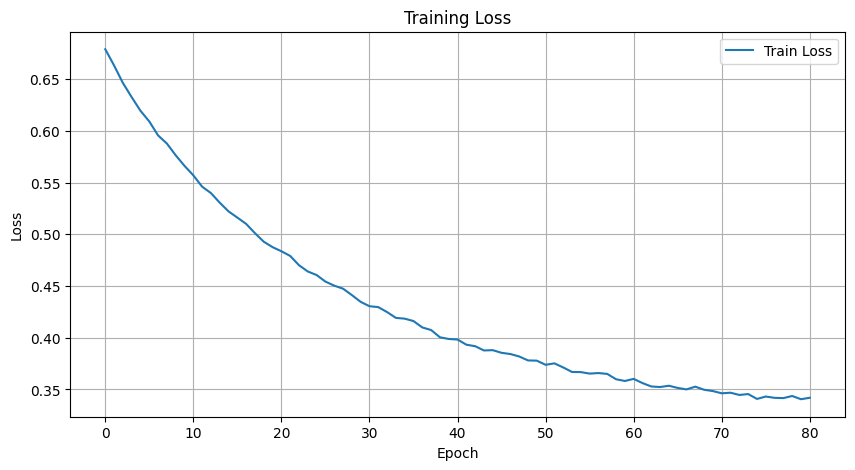

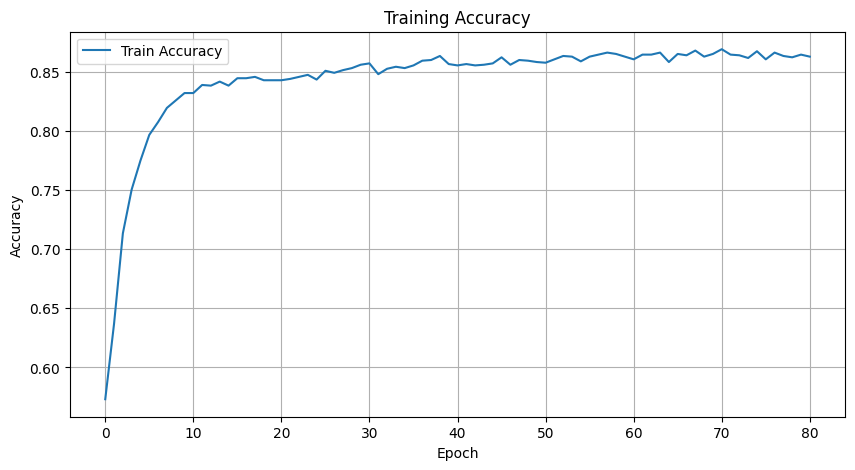

[I 2025-03-06 07:00:19,311] Trial 62 finished with value: 0.8600405679513184 and parameters: {'lr': 2.873445621200027e-05, 'hidden_size': 96, 'dropout_rate': 0.15985086856369163, 'batch_size': 32, 'num_epochs': 81}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/74], Step [10/55], Loss: 0.6596
Epoch [1/74], Step [20/55], Loss: 0.6725
Epoch [1/74], Step [30/55], Loss: 0.6493
Epoch [1/74], Step [40/55], Loss: 0.6947
Epoch [1/74], Step [50/55], Loss: 0.6683
Epoch [1/74], Train Loss: 0.6545, Train Accuracy: 0.6501
Epoch [2/74], Step [10/55], Loss: 0.6431
Epoch [2/74], Step [20/55], Loss: 0.6588
Epoch [2/74], Step [30/55], Loss: 0.6031
Epoch [2/74], Step [40/55], Loss: 0.6146
Epoch [2/74], Step [50/55], Loss: 0.6499
Epoch [2/74], Train Loss: 0.6374, Train Accuracy: 0.7175
Epoch [3/74], Step [10/55], Loss: 0.6284
Epoch [3/74], Step [20/55], Loss: 0.6483
Epoch [3/74], Step [30/55], Loss: 0.6323
Epoch [3/74], Step [40/55], Loss: 0.6151
Epoch [3/74], Step [50/55], Loss: 0.6234
Epoch [3/74], Train Loss: 0.6145, Train Accuracy: 0.7574
Epoch [4/74], Step [10/55], Loss: 0.6396
Epoch [4/74], Step [20/55], Loss: 0.6203
Epoch [4/74], Step [30/55], Loss: 0.6090
Epoch [4/74], Step [40/55], Loss: 0.5614
Epoch [4/74], Step [50/55], Loss: 0.5612
Epoch [4/

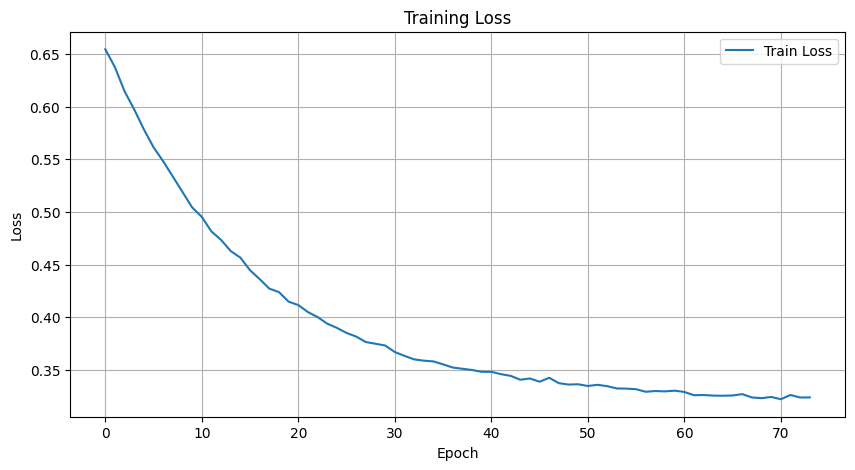

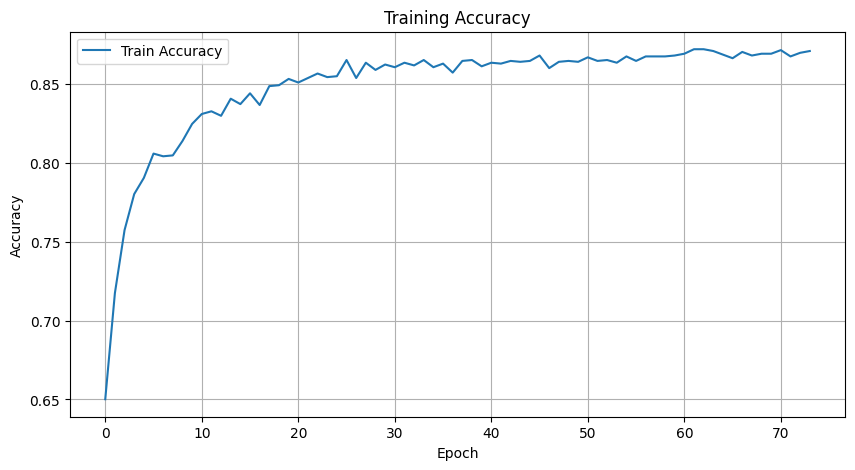

[I 2025-03-06 07:00:28,020] Trial 63 finished with value: 0.8661521034746187 and parameters: {'lr': 4.989829084095097e-05, 'hidden_size': 97, 'dropout_rate': 0.19245519583511456, 'batch_size': 32, 'num_epochs': 74}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/42], Step [10/55], Loss: 0.7587
Epoch [1/42], Step [20/55], Loss: 0.7865
Epoch [1/42], Step [30/55], Loss: 0.7217
Epoch [1/42], Step [40/55], Loss: 0.7345
Epoch [1/42], Step [50/55], Loss: 0.7111
Epoch [1/42], Train Loss: 0.7297, Train Accuracy: 0.4207
Epoch [2/42], Step [10/55], Loss: 0.7505
Epoch [2/42], Step [20/55], Loss: 0.6719
Epoch [2/42], Step [30/55], Loss: 0.7229
Epoch [2/42], Step [40/55], Loss: 0.6971
Epoch [2/42], Step [50/55], Loss: 0.6532
Epoch [2/42], Train Loss: 0.7036, Train Accuracy: 0.5080
Epoch [3/42], Step [10/55], Loss: 0.6972
Epoch [3/42], Step [20/55], Loss: 0.6308
Epoch [3/42], Step [30/55], Loss: 0.6716
Epoch [3/42], Step [40/55], Loss: 0.6797
Epoch [3/42], Step [50/55], Loss: 0.7047
Epoch [3/42], Train Loss: 0.6801, Train Accuracy: 0.6073
Epoch [4/42], Step [10/55], Loss: 0.6831
Epoch [4/42], Step [20/55], Loss: 0.6897
Epoch [4/42], Step [30/55], Loss: 0.6392
Epoch [4/42], Step [40/55], Loss: 0.6460
Epoch [4/42], Step [50/55], Loss: 0.6928
Epoch [4/

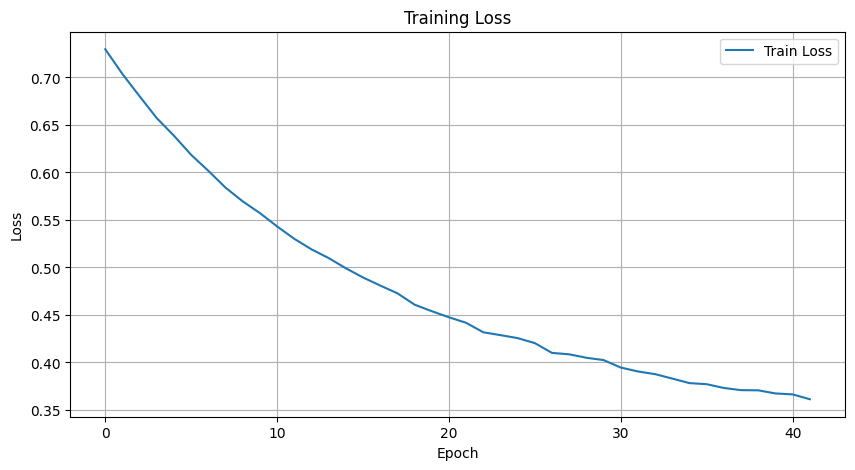

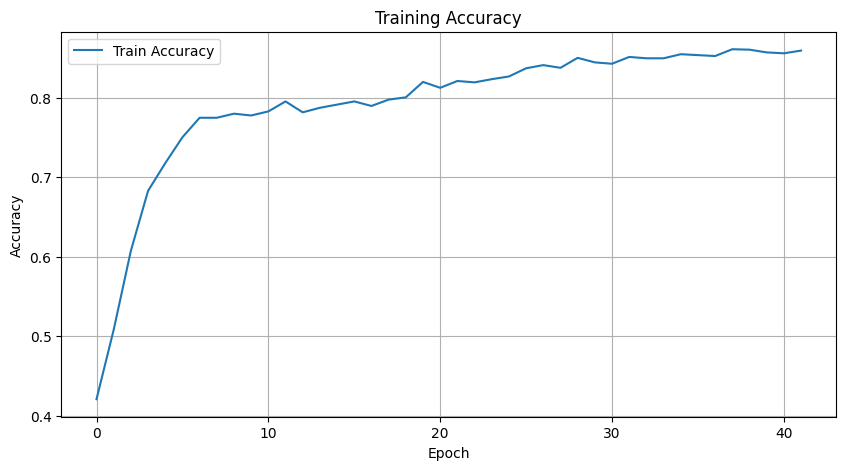

[I 2025-03-06 07:00:32,735] Trial 64 finished with value: 0.8537446326492979 and parameters: {'lr': 4.5785335766788914e-05, 'hidden_size': 96, 'dropout_rate': 0.19582481391195633, 'batch_size': 32, 'num_epochs': 42}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/65], Step [10/28], Loss: 0.6833
Epoch [1/65], Step [20/28], Loss: 0.6586
Epoch [1/65], Train Loss: 0.6686, Train Accuracy: 0.5993
Epoch [2/65], Step [10/28], Loss: 0.6471
Epoch [2/65], Step [20/28], Loss: 0.6645
Epoch [2/65], Train Loss: 0.6537, Train Accuracy: 0.6815
Epoch [3/65], Step [10/28], Loss: 0.6519
Epoch [3/65], Step [20/28], Loss: 0.6412
Epoch [3/65], Train Loss: 0.6430, Train Accuracy: 0.7032
Epoch [4/65], Step [10/28], Loss: 0.6419
Epoch [4/65], Step [20/28], Loss: 0.6346
Epoch [4/65], Train Loss: 0.6275, Train Accuracy: 0.7631
Epoch [5/65], Step [10/28], Loss: 0.6266
Epoch [5/65], Step [20/28], Loss: 0.6131
Epoch [5/65], Train Loss: 0.6137, Train Accuracy: 0.7745
Epoch [6/65], Step [10/28], Loss: 0.5926
Epoch [6/65], Step [20/28], Loss: 0.5995
Epoch [6/65], Train Loss: 0.5983, Train Accuracy: 0.7991
Epoch [7/65], Step [10/28], Loss: 0.5844
Epoch [7/65], Step [20/28], Loss: 0.5959
Epoch [7/65], Train Loss: 0.5911, Train Accuracy: 0.8008
Epoch [8/65], Step [10/28],

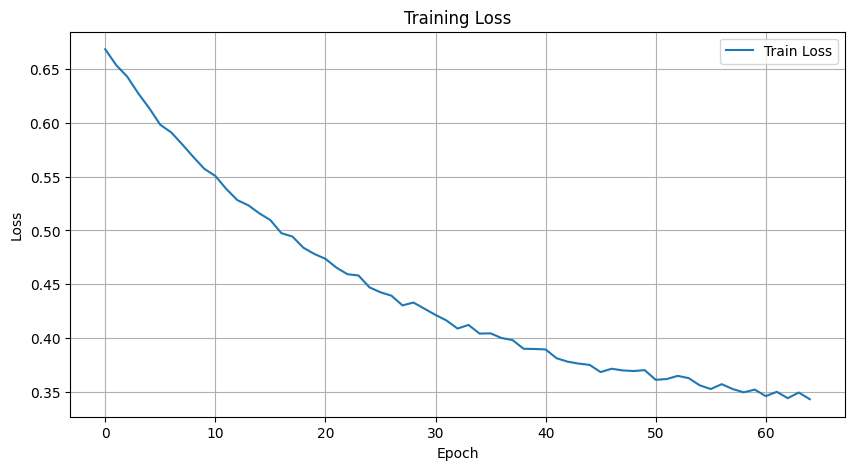

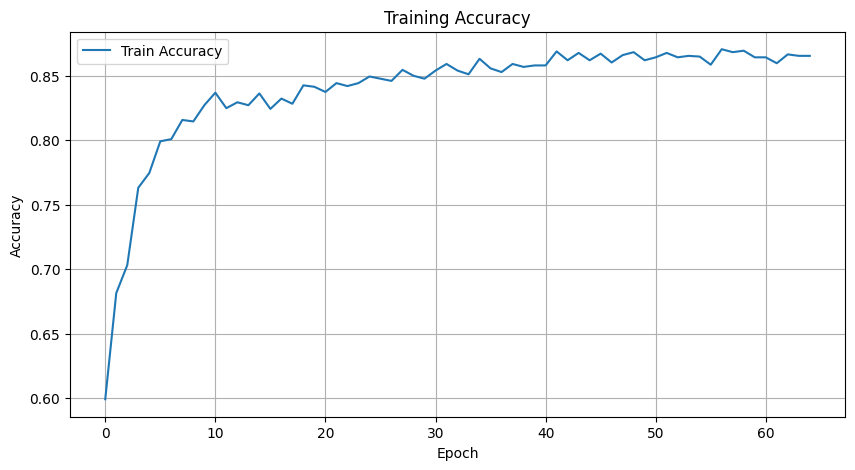

[I 2025-03-06 07:00:37,157] Trial 65 finished with value: 0.8581175416875214 and parameters: {'lr': 5.622781013049695e-05, 'hidden_size': 100, 'dropout_rate': 0.22493676313080205, 'batch_size': 64, 'num_epochs': 65}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/86], Step [10/55], Loss: 0.6643
Epoch [1/86], Step [20/55], Loss: 0.6720
Epoch [1/86], Step [30/55], Loss: 0.6778
Epoch [1/86], Step [40/55], Loss: 0.6573
Epoch [1/86], Step [50/55], Loss: 0.6632
Epoch [1/86], Train Loss: 0.6788, Train Accuracy: 0.6050
Epoch [2/86], Step [10/55], Loss: 0.6635
Epoch [2/86], Step [20/55], Loss: 0.6718
Epoch [2/86], Step [30/55], Loss: 0.6790
Epoch [2/86], Step [40/55], Loss: 0.6612
Epoch [2/86], Step [50/55], Loss: 0.6501
Epoch [2/86], Train Loss: 0.6626, Train Accuracy: 0.6644
Epoch [3/86], Step [10/55], Loss: 0.6493
Epoch [3/86], Step [20/55], Loss: 0.6252
Epoch [3/86], Step [30/55], Loss: 0.6452
Epoch [3/86], Step [40/55], Loss: 0.6480
Epoch [3/86], Step [50/55], Loss: 0.6332
Epoch [3/86], Train Loss: 0.6407, Train Accuracy: 0.7517
Epoch [4/86], Step [10/55], Loss: 0.6044
Epoch [4/86], Step [20/55], Loss: 0.6160
Epoch [4/86], Step [30/55], Loss: 0.6025
Epoch [4/86], Step [40/55], Loss: 0.6136
Epoch [4/86], Step [50/55], Loss: 0.6158
Epoch [4/

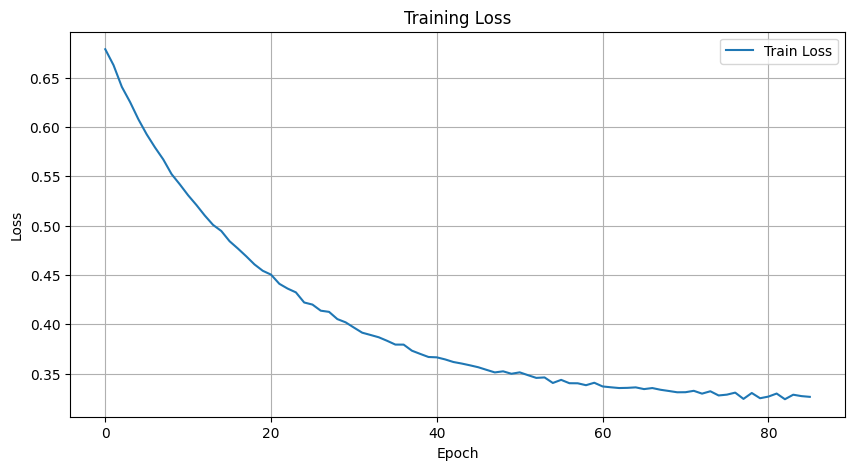

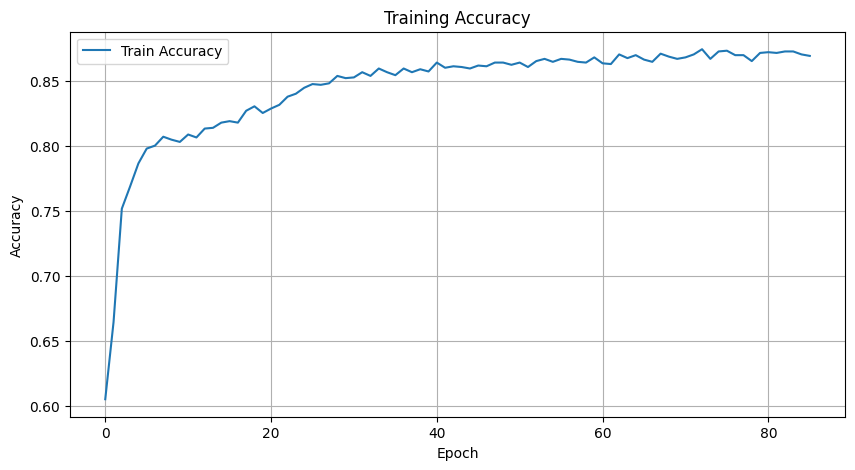

[I 2025-03-06 07:00:46,846] Trial 66 finished with value: 0.8662311319512132 and parameters: {'lr': 4.2466816458741736e-05, 'hidden_size': 92, 'dropout_rate': 0.17128220414259873, 'batch_size': 32, 'num_epochs': 86}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/73], Step [10/55], Loss: 0.6600
Epoch [1/73], Step [20/55], Loss: 0.6847
Epoch [1/73], Step [30/55], Loss: 0.6876
Epoch [1/73], Step [40/55], Loss: 0.7066
Epoch [1/73], Step [50/55], Loss: 0.6804
Epoch [1/73], Train Loss: 0.6866, Train Accuracy: 0.5531
Epoch [2/73], Step [10/55], Loss: 0.6973
Epoch [2/73], Step [20/55], Loss: 0.6532
Epoch [2/73], Step [30/55], Loss: 0.6726
Epoch [2/73], Step [40/55], Loss: 0.6651
Epoch [2/73], Step [50/55], Loss: 0.6863
Epoch [2/73], Train Loss: 0.6725, Train Accuracy: 0.6216
Epoch [3/73], Step [10/55], Loss: 0.6507
Epoch [3/73], Step [20/55], Loss: 0.6878
Epoch [3/73], Step [30/55], Loss: 0.6705
Epoch [3/73], Step [40/55], Loss: 0.6471
Epoch [3/73], Step [50/55], Loss: 0.6557
Epoch [3/73], Train Loss: 0.6594, Train Accuracy: 0.6758
Epoch [4/73], Step [10/55], Loss: 0.6253
Epoch [4/73], Step [20/55], Loss: 0.6445
Epoch [4/73], Step [30/55], Loss: 0.6368
Epoch [4/73], Step [40/55], Loss: 0.6670
Epoch [4/73], Step [50/55], Loss: 0.6323
Epoch [4/

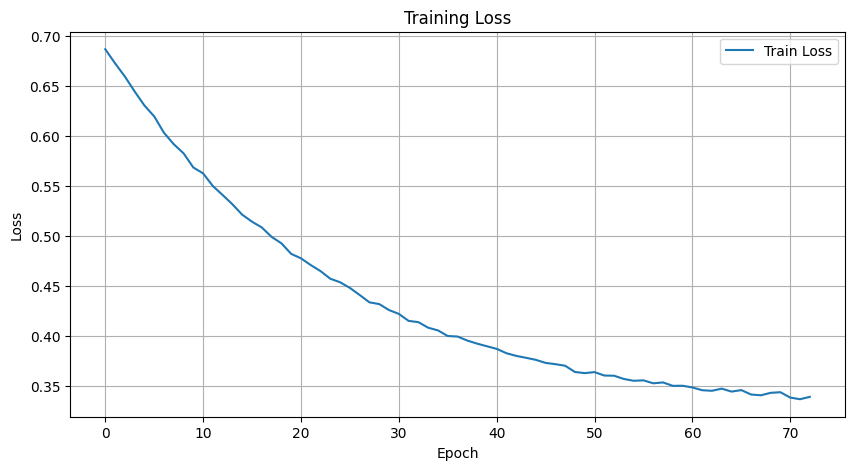

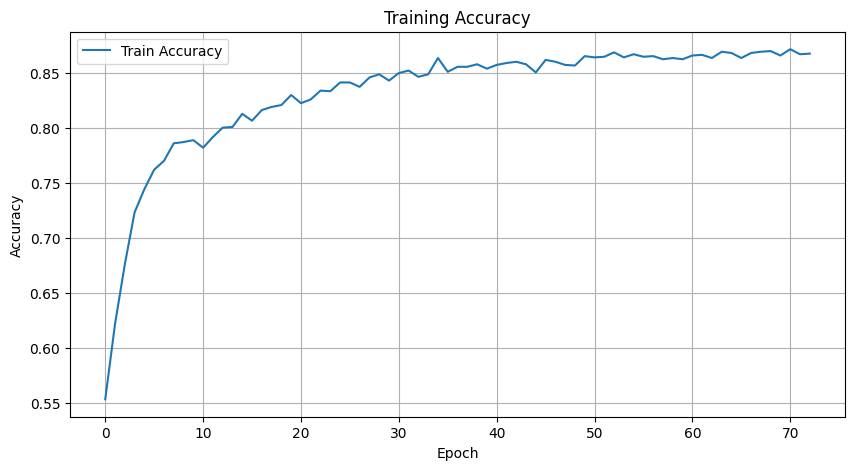

[I 2025-03-06 07:00:55,142] Trial 67 finished with value: 0.8612786807512973 and parameters: {'lr': 3.34378269422656e-05, 'hidden_size': 97, 'dropout_rate': 0.17706716250131177, 'batch_size': 32, 'num_epochs': 73}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/93], Step [10/55], Loss: 0.7504
Epoch [1/93], Step [20/55], Loss: 0.7945
Epoch [1/93], Step [30/55], Loss: 0.7753
Epoch [1/93], Step [40/55], Loss: 0.8172
Epoch [1/93], Step [50/55], Loss: 0.7670
Epoch [1/93], Train Loss: 0.7873, Train Accuracy: 0.2334
Epoch [2/93], Step [10/55], Loss: 0.7473
Epoch [2/93], Step [20/55], Loss: 0.7722
Epoch [2/93], Step [30/55], Loss: 0.7628
Epoch [2/93], Step [40/55], Loss: 0.7667
Epoch [2/93], Step [50/55], Loss: 0.7453
Epoch [2/93], Train Loss: 0.7606, Train Accuracy: 0.2740
Epoch [3/93], Step [10/55], Loss: 0.7350
Epoch [3/93], Step [20/55], Loss: 0.7679
Epoch [3/93], Step [30/55], Loss: 0.7036
Epoch [3/93], Step [40/55], Loss: 0.7225
Epoch [3/93], Step [50/55], Loss: 0.7140
Epoch [3/93], Train Loss: 0.7389, Train Accuracy: 0.3305
Epoch [4/93], Step [10/55], Loss: 0.7219
Epoch [4/93], Step [20/55], Loss: 0.7152
Epoch [4/93], Step [30/55], Loss: 0.7219
Epoch [4/93], Step [40/55], Loss: 0.6970
Epoch [4/93], Step [50/55], Loss: 0.6775
Epoch [4/

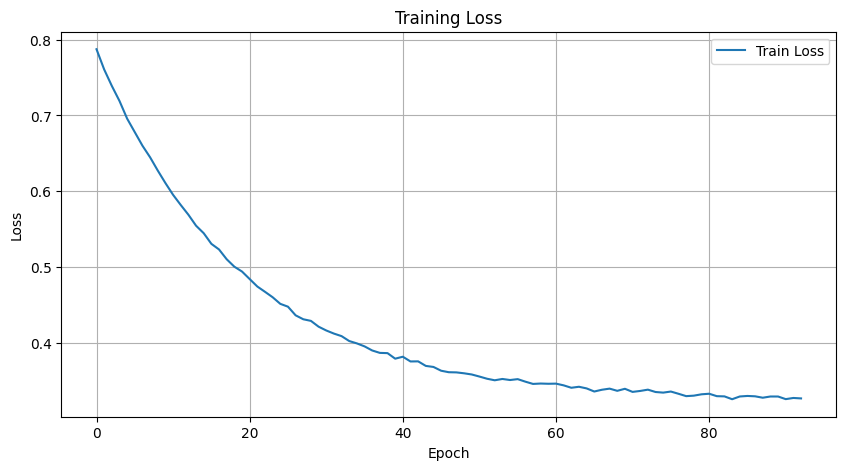

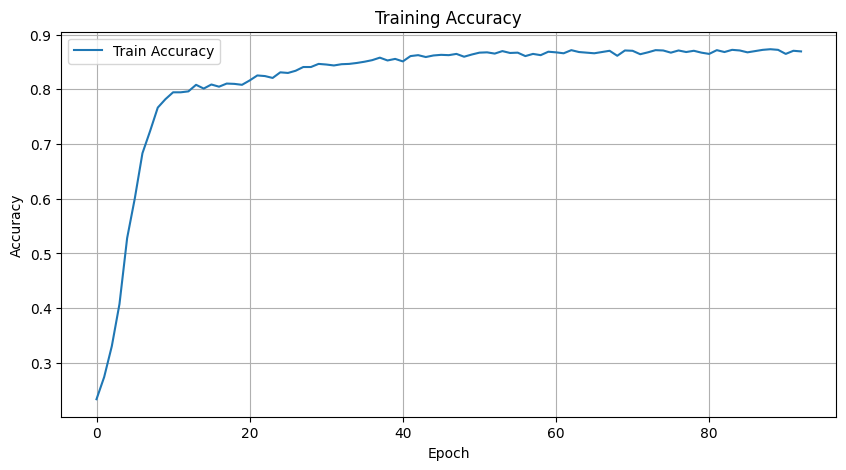

[I 2025-03-06 07:01:05,171] Trial 68 finished with value: 0.8573799425726404 and parameters: {'lr': 4.413864144529617e-05, 'hidden_size': 93, 'dropout_rate': 0.16060638554196063, 'batch_size': 32, 'num_epochs': 93}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/83], Step [10/55], Loss: 0.7329
Epoch [1/83], Step [20/55], Loss: 0.7036
Epoch [1/83], Step [30/55], Loss: 0.7560
Epoch [1/83], Step [40/55], Loss: 0.7433
Epoch [1/83], Step [50/55], Loss: 0.7211
Epoch [1/83], Train Loss: 0.7295, Train Accuracy: 0.3670
Epoch [2/83], Step [10/55], Loss: 0.7022
Epoch [2/83], Step [20/55], Loss: 0.6890
Epoch [2/83], Step [30/55], Loss: 0.7149
Epoch [2/83], Step [40/55], Loss: 0.7372
Epoch [2/83], Step [50/55], Loss: 0.6975
Epoch [2/83], Train Loss: 0.7140, Train Accuracy: 0.4218
Epoch [3/83], Step [10/55], Loss: 0.7162
Epoch [3/83], Step [20/55], Loss: 0.7132
Epoch [3/83], Step [30/55], Loss: 0.6914
Epoch [3/83], Step [40/55], Loss: 0.7136
Epoch [3/83], Step [50/55], Loss: 0.6750
Epoch [3/83], Train Loss: 0.6992, Train Accuracy: 0.4686
Epoch [4/83], Step [10/55], Loss: 0.7075
Epoch [4/83], Step [20/55], Loss: 0.7080
Epoch [4/83], Step [30/55], Loss: 0.7168
Epoch [4/83], Step [40/55], Loss: 0.7097
Epoch [4/83], Step [50/55], Loss: 0.7039
Epoch [4/

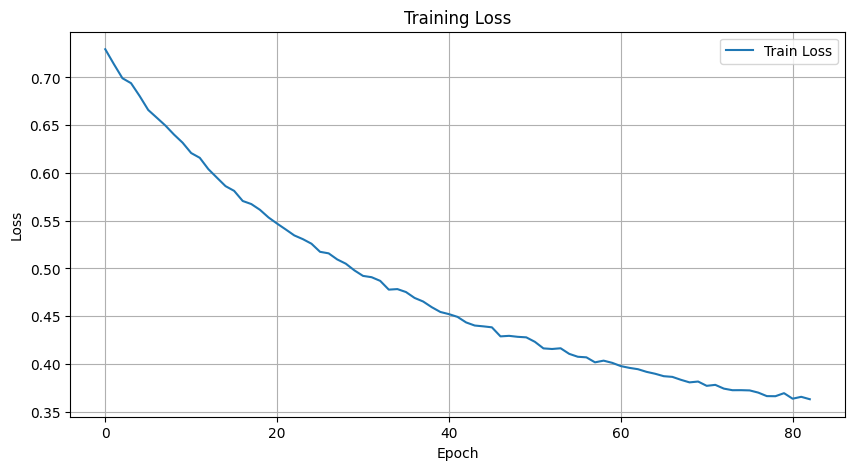

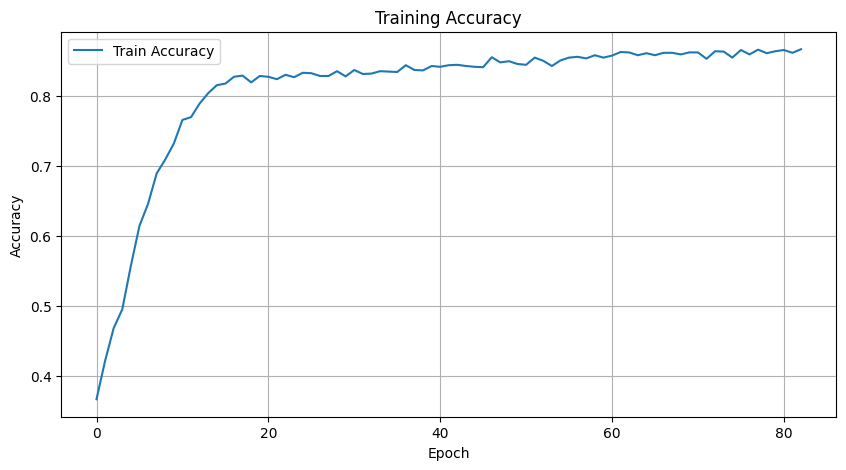

[I 2025-03-06 07:01:13,943] Trial 69 finished with value: 0.854482231764179 and parameters: {'lr': 2.214589771686155e-05, 'hidden_size': 91, 'dropout_rate': 0.2533256294393012, 'batch_size': 32, 'num_epochs': 83}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/77], Step [10/28], Loss: 0.6713
Epoch [1/77], Step [20/28], Loss: 0.6521
Epoch [1/77], Train Loss: 0.6713, Train Accuracy: 0.6347
Epoch [2/77], Step [10/28], Loss: 0.6810
Epoch [2/77], Step [20/28], Loss: 0.6621
Epoch [2/77], Train Loss: 0.6660, Train Accuracy: 0.6501
Epoch [3/77], Step [10/28], Loss: 0.6425
Epoch [3/77], Step [20/28], Loss: 0.6467
Epoch [3/77], Train Loss: 0.6583, Train Accuracy: 0.6758
Epoch [4/77], Step [10/28], Loss: 0.6449
Epoch [4/77], Step [20/28], Loss: 0.6429
Epoch [4/77], Train Loss: 0.6513, Train Accuracy: 0.7015
Epoch [5/77], Step [10/28], Loss: 0.6615
Epoch [5/77], Step [20/28], Loss: 0.6322
Epoch [5/77], Train Loss: 0.6471, Train Accuracy: 0.7192
Epoch [6/77], Step [10/28], Loss: 0.6427
Epoch [6/77], Step [20/28], Loss: 0.6564
Epoch [6/77], Train Loss: 0.6391, Train Accuracy: 0.7323
Epoch [7/77], Step [10/28], Loss: 0.6414
Epoch [7/77], Step [20/28], Loss: 0.6241
Epoch [7/77], Train Loss: 0.6335, Train Accuracy: 0.7489
Epoch [8/77], Step [10/28],

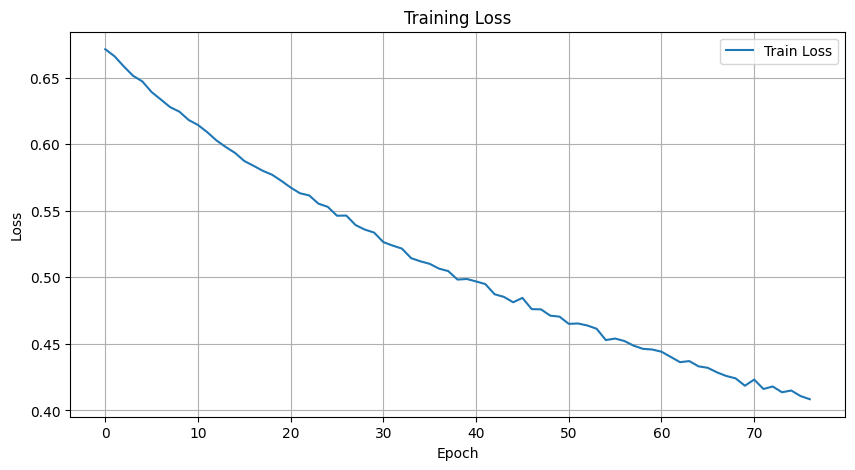

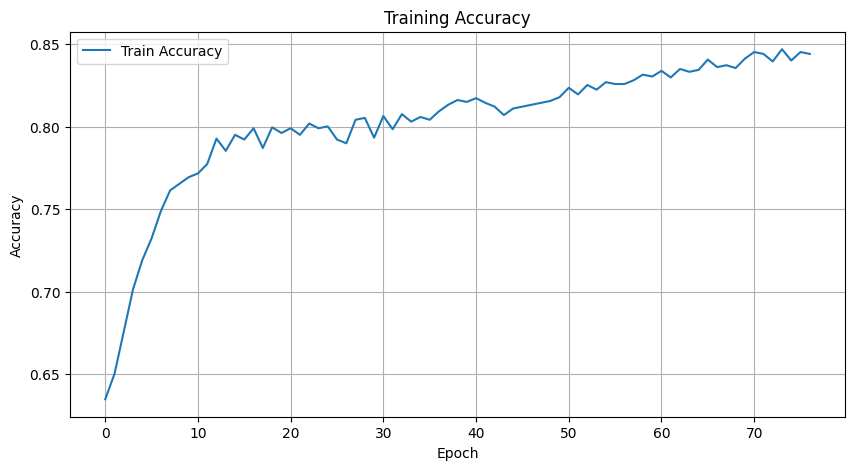

[I 2025-03-06 07:01:19,478] Trial 70 finished with value: 0.8439451015515924 and parameters: {'lr': 2.76025682574539e-05, 'hidden_size': 87, 'dropout_rate': 0.13844134820244822, 'batch_size': 64, 'num_epochs': 77}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/60], Step [10/55], Loss: 0.6069
Epoch [1/60], Step [20/55], Loss: 0.6466
Epoch [1/60], Step [30/55], Loss: 0.6513
Epoch [1/60], Step [40/55], Loss: 0.6573
Epoch [1/60], Step [50/55], Loss: 0.6301
Epoch [1/60], Train Loss: 0.6438, Train Accuracy: 0.7289
Epoch [2/60], Step [10/55], Loss: 0.6351
Epoch [2/60], Step [20/55], Loss: 0.6527
Epoch [2/60], Step [30/55], Loss: 0.6216
Epoch [2/60], Step [40/55], Loss: 0.5900
Epoch [2/60], Step [50/55], Loss: 0.5914
Epoch [2/60], Train Loss: 0.6167, Train Accuracy: 0.7586
Epoch [3/60], Step [10/55], Loss: 0.5903
Epoch [3/60], Step [20/55], Loss: 0.6090
Epoch [3/60], Step [30/55], Loss: 0.5995
Epoch [3/60], Step [40/55], Loss: 0.5712
Epoch [3/60], Step [50/55], Loss: 0.6106
Epoch [3/60], Train Loss: 0.5935, Train Accuracy: 0.7671
Epoch [4/60], Step [10/55], Loss: 0.6815
Epoch [4/60], Step [20/55], Loss: 0.5739
Epoch [4/60], Step [30/55], Loss: 0.5895
Epoch [4/60], Step [40/55], Loss: 0.5228
Epoch [4/60], Step [50/55], Loss: 0.5714
Epoch [4/

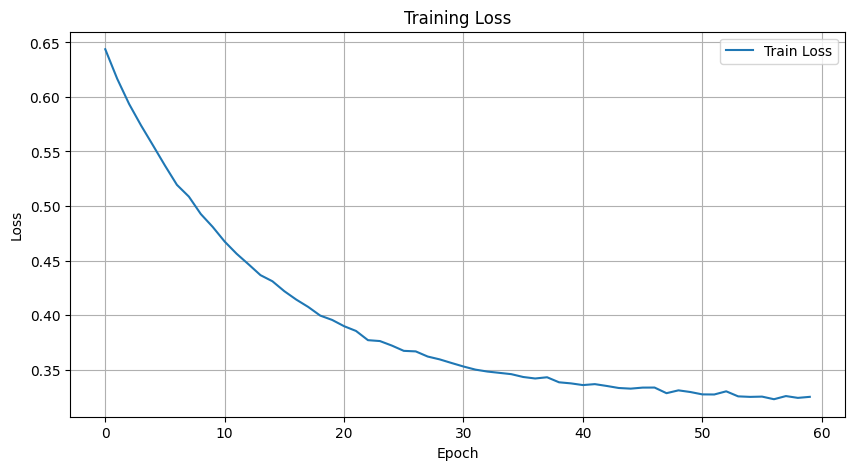

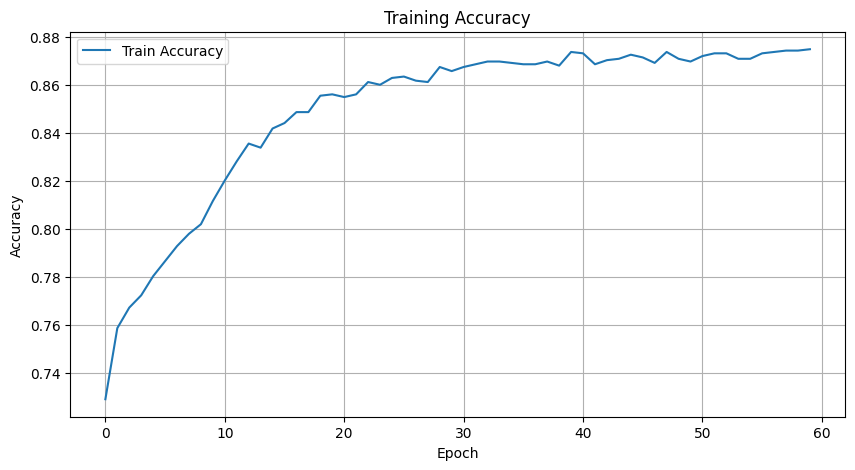

[I 2025-03-06 07:01:26,307] Trial 71 finished with value: 0.8633597639682832 and parameters: {'lr': 6.435090621491553e-05, 'hidden_size': 94, 'dropout_rate': 0.11568123242621711, 'batch_size': 32, 'num_epochs': 60}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/98], Step [10/55], Loss: 0.6253
Epoch [1/98], Step [20/55], Loss: 0.6974
Epoch [1/98], Step [30/55], Loss: 0.7011
Epoch [1/98], Step [40/55], Loss: 0.5688
Epoch [1/98], Step [50/55], Loss: 0.5942
Epoch [1/98], Train Loss: 0.6269, Train Accuracy: 0.7534
Epoch [2/98], Step [10/55], Loss: 0.5839
Epoch [2/98], Step [20/55], Loss: 0.6024
Epoch [2/98], Step [30/55], Loss: 0.6727
Epoch [2/98], Step [40/55], Loss: 0.6386
Epoch [2/98], Step [50/55], Loss: 0.6325
Epoch [2/98], Train Loss: 0.6146, Train Accuracy: 0.7597
Epoch [3/98], Step [10/55], Loss: 0.6313
Epoch [3/98], Step [20/55], Loss: 0.6219
Epoch [3/98], Step [30/55], Loss: 0.5814
Epoch [3/98], Step [40/55], Loss: 0.6551
Epoch [3/98], Step [50/55], Loss: 0.5961
Epoch [3/98], Train Loss: 0.6058, Train Accuracy: 0.7557
Epoch [4/98], Step [10/55], Loss: 0.6491
Epoch [4/98], Step [20/55], Loss: 0.6207
Epoch [4/98], Step [30/55], Loss: 0.5831
Epoch [4/98], Step [40/55], Loss: 0.5798
Epoch [4/98], Step [50/55], Loss: 0.5856
Epoch [4/

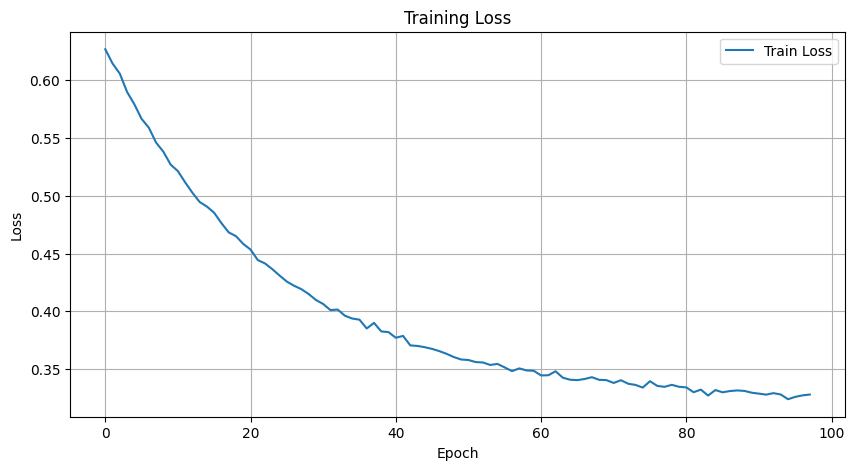

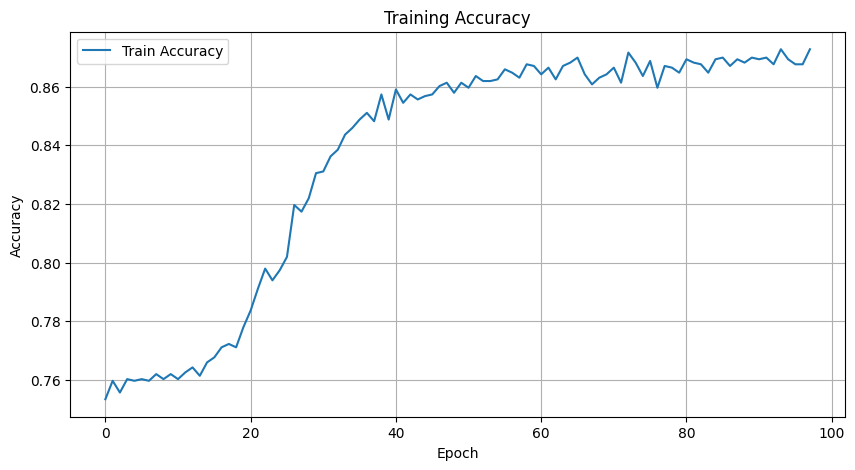

[I 2025-03-06 07:01:36,570] Trial 72 finished with value: 0.8591975975343115 and parameters: {'lr': 3.730422488601016e-05, 'hidden_size': 98, 'dropout_rate': 0.19357479536332636, 'batch_size': 32, 'num_epochs': 98}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/76], Step [10/55], Loss: 0.6724
Epoch [1/76], Step [20/55], Loss: 0.7019
Epoch [1/76], Step [30/55], Loss: 0.6640
Epoch [1/76], Step [40/55], Loss: 0.6559
Epoch [1/76], Step [50/55], Loss: 0.7146
Epoch [1/76], Train Loss: 0.6882, Train Accuracy: 0.5748
Epoch [2/76], Step [10/55], Loss: 0.6588
Epoch [2/76], Step [20/55], Loss: 0.6636
Epoch [2/76], Step [30/55], Loss: 0.6648
Epoch [2/76], Step [40/55], Loss: 0.6226
Epoch [2/76], Step [50/55], Loss: 0.6441
Epoch [2/76], Train Loss: 0.6657, Train Accuracy: 0.6672
Epoch [3/76], Step [10/55], Loss: 0.6348
Epoch [3/76], Step [20/55], Loss: 0.6458
Epoch [3/76], Step [30/55], Loss: 0.6505
Epoch [3/76], Step [40/55], Loss: 0.6499
Epoch [3/76], Step [50/55], Loss: 0.6295
Epoch [3/76], Train Loss: 0.6408, Train Accuracy: 0.7255
Epoch [4/76], Step [10/55], Loss: 0.6144
Epoch [4/76], Step [20/55], Loss: 0.6280
Epoch [4/76], Step [30/55], Loss: 0.6206
Epoch [4/76], Step [40/55], Loss: 0.6402
Epoch [4/76], Step [50/55], Loss: 0.6300
Epoch [4/

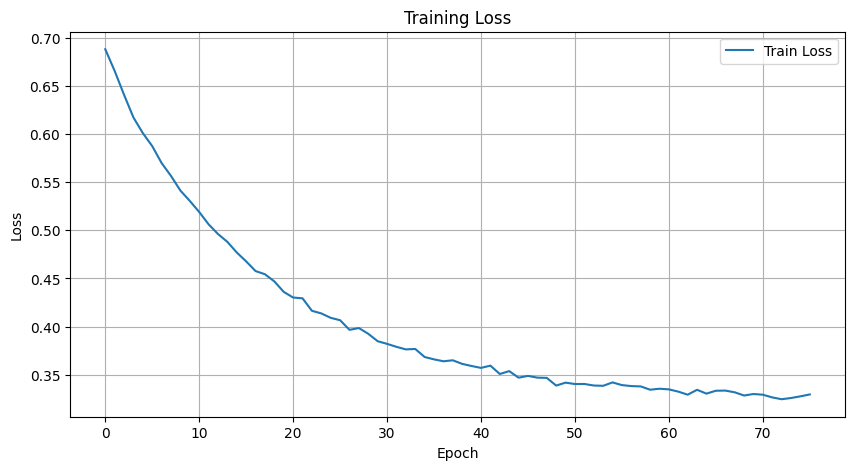

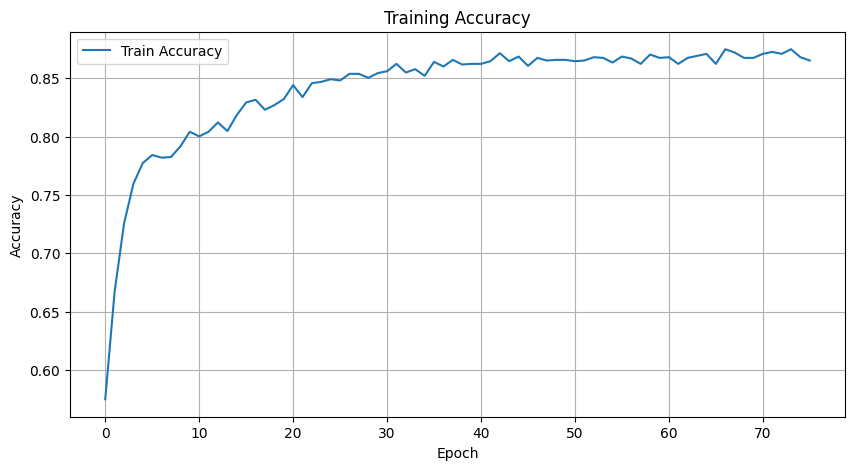

[I 2025-03-06 07:01:44,567] Trial 73 finished with value: 0.8618845657385211 and parameters: {'lr': 4.96868692138724e-05, 'hidden_size': 90, 'dropout_rate': 0.2305416174687641, 'batch_size': 32, 'num_epochs': 76}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/86], Step [10/55], Loss: 0.6741
Epoch [1/86], Step [20/55], Loss: 0.6404
Epoch [1/86], Step [30/55], Loss: 0.6342
Epoch [1/86], Step [40/55], Loss: 0.6164
Epoch [1/86], Step [50/55], Loss: 0.6454
Epoch [1/86], Train Loss: 0.6442, Train Accuracy: 0.7283
Epoch [2/86], Step [10/55], Loss: 0.6462
Epoch [2/86], Step [20/55], Loss: 0.5852
Epoch [2/86], Step [30/55], Loss: 0.6149
Epoch [2/86], Step [40/55], Loss: 0.6081
Epoch [2/86], Step [50/55], Loss: 0.6013
Epoch [2/86], Train Loss: 0.6163, Train Accuracy: 0.7711
Epoch [3/86], Step [10/55], Loss: 0.6108
Epoch [3/86], Step [20/55], Loss: 0.5864
Epoch [3/86], Step [30/55], Loss: 0.5806
Epoch [3/86], Step [40/55], Loss: 0.5917
Epoch [3/86], Step [50/55], Loss: 0.5725
Epoch [3/86], Train Loss: 0.5894, Train Accuracy: 0.8002
Epoch [4/86], Step [10/55], Loss: 0.5153
Epoch [4/86], Step [20/55], Loss: 0.5691
Epoch [4/86], Step [30/55], Loss: 0.5597
Epoch [4/86], Step [40/55], Loss: 0.5367
Epoch [4/86], Step [50/55], Loss: 0.5674
Epoch [4/

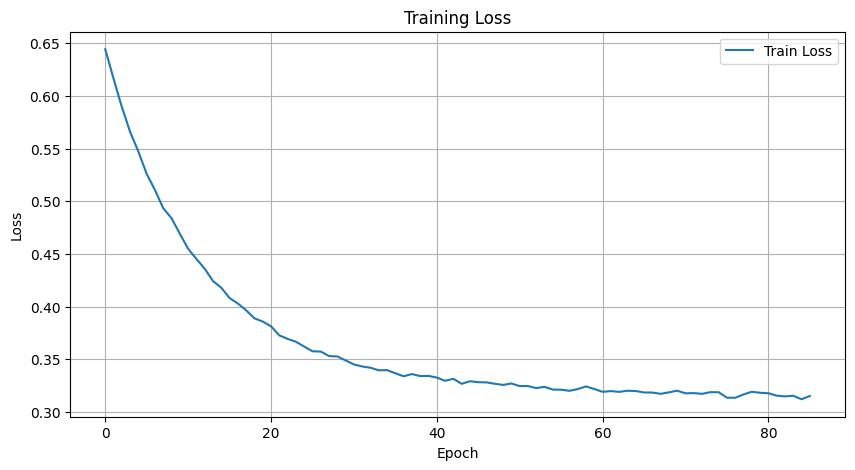

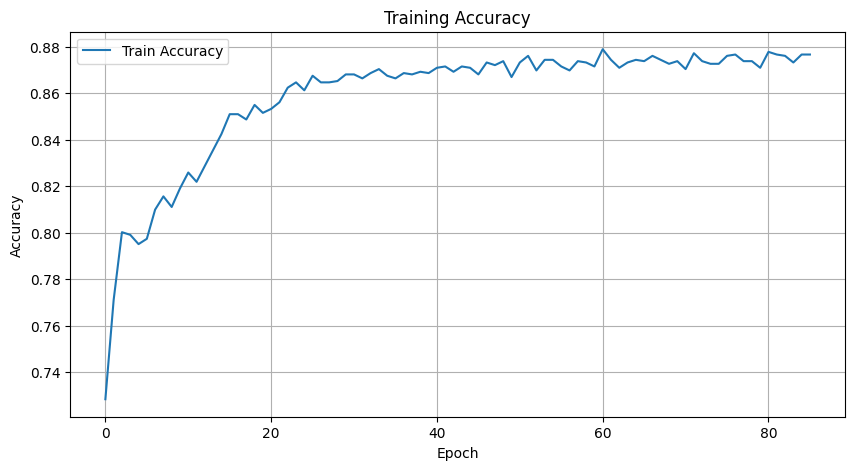

[I 2025-03-06 07:01:53,900] Trial 74 finished with value: 0.86401833460657 and parameters: {'lr': 6.672399696092297e-05, 'hidden_size': 100, 'dropout_rate': 0.15834166305795652, 'batch_size': 32, 'num_epochs': 86}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/150], Step [10/55], Loss: 0.7234
Epoch [1/150], Step [20/55], Loss: 0.7322
Epoch [1/150], Step [30/55], Loss: 0.6917
Epoch [1/150], Step [40/55], Loss: 0.7312
Epoch [1/150], Step [50/55], Loss: 0.7144
Epoch [1/150], Train Loss: 0.7068, Train Accuracy: 0.4481
Epoch [2/150], Step [10/55], Loss: 0.7136
Epoch [2/150], Step [20/55], Loss: 0.6958
Epoch [2/150], Step [30/55], Loss: 0.7168
Epoch [2/150], Step [40/55], Loss: 0.6956
Epoch [2/150], Step [50/55], Loss: 0.6807
Epoch [2/150], Train Loss: 0.7020, Train Accuracy: 0.4640
Epoch [3/150], Step [10/55], Loss: 0.7029
Epoch [3/150], Step [20/55], Loss: 0.6730
Epoch [3/150], Step [30/55], Loss: 0.7181
Epoch [3/150], Step [40/55], Loss: 0.6824
Epoch [3/150], Step [50/55], Loss: 0.6715
Epoch [3/150], Train Loss: 0.6966, Train Accuracy: 0.4903
Epoch [4/150], Step [10/55], Loss: 0.7159
Epoch [4/150], Step [20/55], Loss: 0.6900
Epoch [4/150], Step [30/55], Loss: 0.6988
Epoch [4/150], Step [40/55], Loss: 0.7006
Epoch [4/150], Step [50/55],

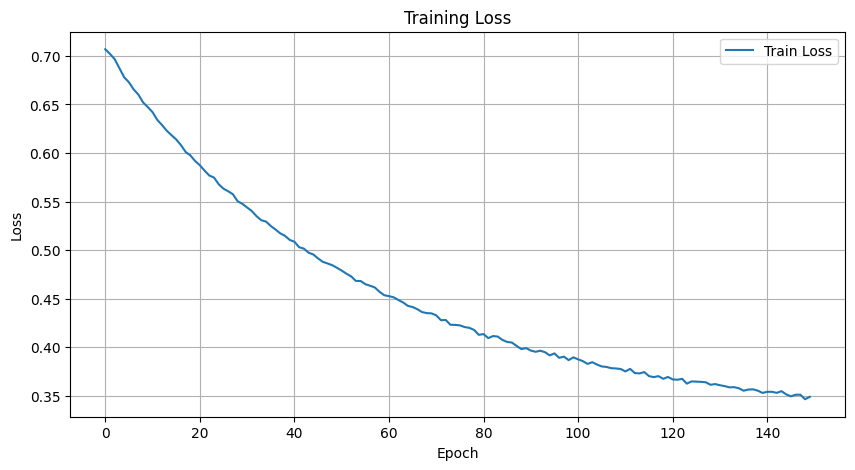

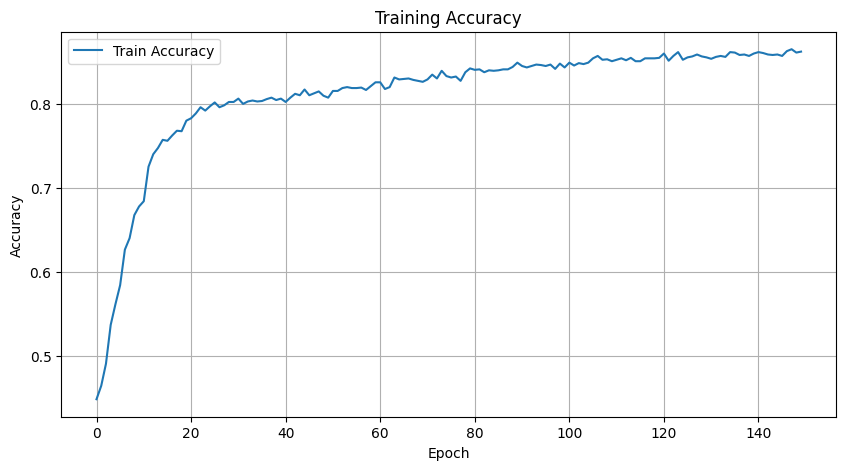

[I 2025-03-06 07:02:09,704] Trial 75 finished with value: 0.8566160006322279 and parameters: {'lr': 1.6267161935801057e-05, 'hidden_size': 88, 'dropout_rate': 0.1304975270111968, 'batch_size': 32, 'num_epochs': 150}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/66], Step [10/55], Loss: 0.6396
Epoch [1/66], Step [20/55], Loss: 0.5973
Epoch [1/66], Step [30/55], Loss: 0.5874
Epoch [1/66], Step [40/55], Loss: 0.5753
Epoch [1/66], Step [50/55], Loss: 0.6117
Epoch [1/66], Train Loss: 0.6023, Train Accuracy: 0.7586
Epoch [2/66], Step [10/55], Loss: 0.5725
Epoch [2/66], Step [20/55], Loss: 0.5449
Epoch [2/66], Step [30/55], Loss: 0.5350
Epoch [2/66], Step [40/55], Loss: 0.5113
Epoch [2/66], Step [50/55], Loss: 0.5900
Epoch [2/66], Train Loss: 0.5696, Train Accuracy: 0.7740
Epoch [3/66], Step [10/55], Loss: 0.5525
Epoch [3/66], Step [20/55], Loss: 0.5274
Epoch [3/66], Step [30/55], Loss: 0.5476
Epoch [3/66], Step [40/55], Loss: 0.5640
Epoch [3/66], Step [50/55], Loss: 0.5527
Epoch [3/66], Train Loss: 0.5452, Train Accuracy: 0.7734
Epoch [4/66], Step [10/55], Loss: 0.5899
Epoch [4/66], Step [20/55], Loss: 0.5244
Epoch [4/66], Step [30/55], Loss: 0.5470
Epoch [4/66], Step [40/55], Loss: 0.5104
Epoch [4/66], Step [50/55], Loss: 0.4810
Epoch [4/

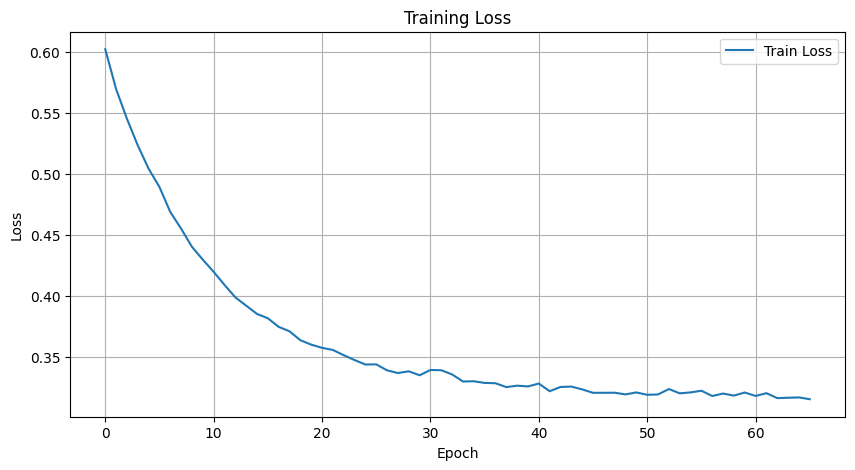

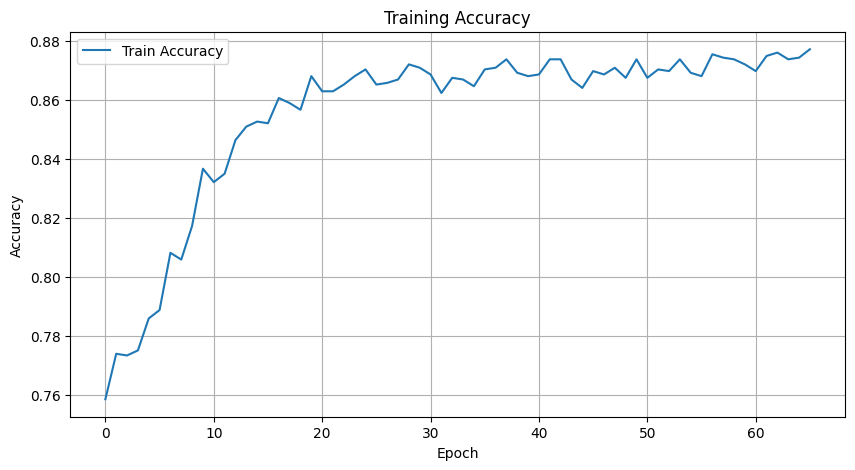

[I 2025-03-06 07:02:16,803] Trial 76 finished with value: 0.8601195964279128 and parameters: {'lr': 8.480492157631713e-05, 'hidden_size': 95, 'dropout_rate': 0.18306165593170637, 'batch_size': 32, 'num_epochs': 66}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/161], Step [10/55], Loss: 0.6244
Epoch [1/161], Step [20/55], Loss: 0.6475
Epoch [1/161], Step [30/55], Loss: 0.6470
Epoch [1/161], Step [40/55], Loss: 0.5671
Epoch [1/161], Step [50/55], Loss: 0.6361
Epoch [1/161], Train Loss: 0.6328, Train Accuracy: 0.7095
Epoch [2/161], Step [10/55], Loss: 0.5943
Epoch [2/161], Step [20/55], Loss: 0.6111
Epoch [2/161], Step [30/55], Loss: 0.5931
Epoch [2/161], Step [40/55], Loss: 0.6343
Epoch [2/161], Step [50/55], Loss: 0.6235
Epoch [2/161], Train Loss: 0.6116, Train Accuracy: 0.7466
Epoch [3/161], Step [10/55], Loss: 0.5852
Epoch [3/161], Step [20/55], Loss: 0.6220
Epoch [3/161], Step [30/55], Loss: 0.5845
Epoch [3/161], Step [40/55], Loss: 0.5533
Epoch [3/161], Step [50/55], Loss: 0.5786
Epoch [3/161], Train Loss: 0.5969, Train Accuracy: 0.7546
Epoch [4/161], Step [10/55], Loss: 0.5641
Epoch [4/161], Step [20/55], Loss: 0.5392
Epoch [4/161], Step [30/55], Loss: 0.5878
Epoch [4/161], Step [40/55], Loss: 0.5914
Epoch [4/161], Step [50/55],

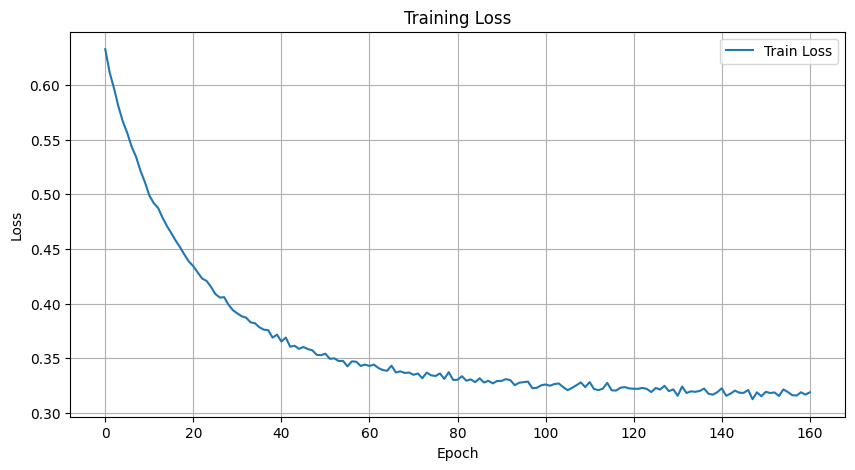

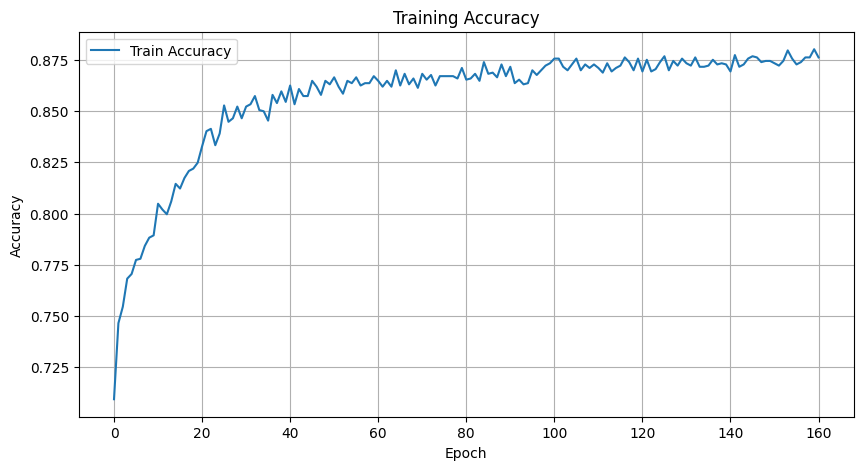

[I 2025-03-06 07:02:33,856] Trial 77 finished with value: 0.8662047891256817 and parameters: {'lr': 4.092403514298713e-05, 'hidden_size': 92, 'dropout_rate': 0.21546275812663207, 'batch_size': 32, 'num_epochs': 161}. Best is trial 50 with value: 0.8681014725639471.


Epoch [1/167], Step [10/55], Loss: 0.6518
Epoch [1/167], Step [20/55], Loss: 0.6308
Epoch [1/167], Step [30/55], Loss: 0.6630
Epoch [1/167], Step [40/55], Loss: 0.6290
Epoch [1/167], Step [50/55], Loss: 0.6628
Epoch [1/167], Train Loss: 0.6643, Train Accuracy: 0.6341
Epoch [2/167], Step [10/55], Loss: 0.6315
Epoch [2/167], Step [20/55], Loss: 0.6590
Epoch [2/167], Step [30/55], Loss: 0.6459
Epoch [2/167], Step [40/55], Loss: 0.6312
Epoch [2/167], Step [50/55], Loss: 0.5990
Epoch [2/167], Train Loss: 0.6481, Train Accuracy: 0.6924
Epoch [3/167], Step [10/55], Loss: 0.6426
Epoch [3/167], Step [20/55], Loss: 0.6222
Epoch [3/167], Step [30/55], Loss: 0.6040
Epoch [3/167], Step [40/55], Loss: 0.6284
Epoch [3/167], Step [50/55], Loss: 0.6040
Epoch [3/167], Train Loss: 0.6311, Train Accuracy: 0.7626
Epoch [4/167], Step [10/55], Loss: 0.6381
Epoch [4/167], Step [20/55], Loss: 0.6588
Epoch [4/167], Step [30/55], Loss: 0.5839
Epoch [4/167], Step [40/55], Loss: 0.5686
Epoch [4/167], Step [50/55],

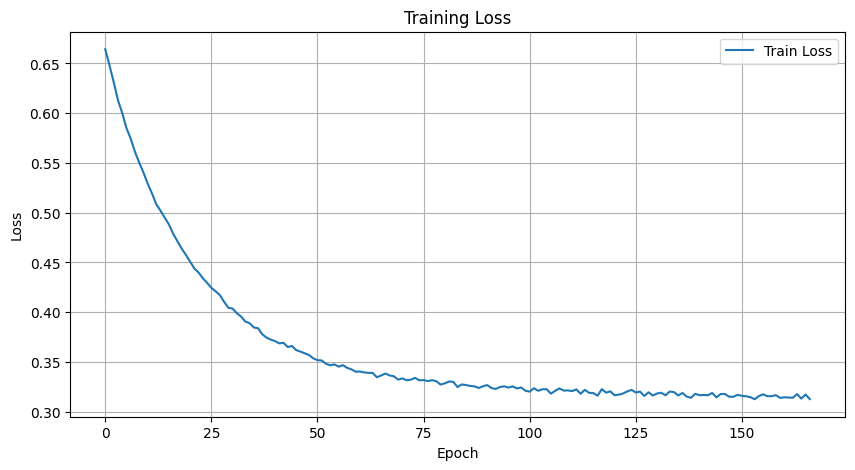

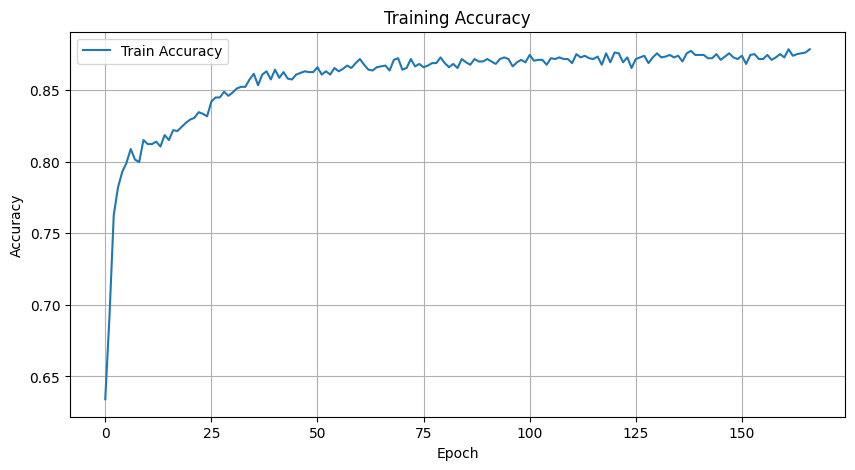

[I 2025-03-06 07:02:51,352] Trial 78 finished with value: 0.8699981560022128 and parameters: {'lr': 4.229330259293684e-05, 'hidden_size': 92, 'dropout_rate': 0.20873658560223074, 'batch_size': 32, 'num_epochs': 167}. Best is trial 78 with value: 0.8699981560022128.


Epoch [1/180], Step [10/55], Loss: 0.7167
Epoch [1/180], Step [20/55], Loss: 0.6722
Epoch [1/180], Step [30/55], Loss: 0.7138
Epoch [1/180], Step [40/55], Loss: 0.7200
Epoch [1/180], Step [50/55], Loss: 0.7338
Epoch [1/180], Train Loss: 0.7018, Train Accuracy: 0.4886
Epoch [2/180], Step [10/55], Loss: 0.7256
Epoch [2/180], Step [20/55], Loss: 0.6955
Epoch [2/180], Step [30/55], Loss: 0.7213
Epoch [2/180], Step [40/55], Loss: 0.6979
Epoch [2/180], Step [50/55], Loss: 0.6913
Epoch [2/180], Train Loss: 0.6989, Train Accuracy: 0.4863
Epoch [3/180], Step [10/55], Loss: 0.6612
Epoch [3/180], Step [20/55], Loss: 0.6653
Epoch [3/180], Step [30/55], Loss: 0.7180
Epoch [3/180], Step [40/55], Loss: 0.6745
Epoch [3/180], Step [50/55], Loss: 0.7274
Epoch [3/180], Train Loss: 0.6923, Train Accuracy: 0.5223
Epoch [4/180], Step [10/55], Loss: 0.6721
Epoch [4/180], Step [20/55], Loss: 0.6838
Epoch [4/180], Step [30/55], Loss: 0.6919
Epoch [4/180], Step [40/55], Loss: 0.6898
Epoch [4/180], Step [50/55],

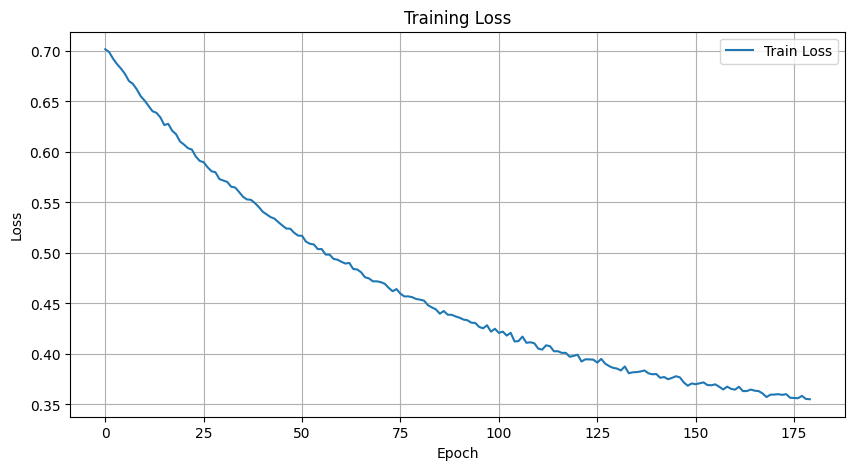

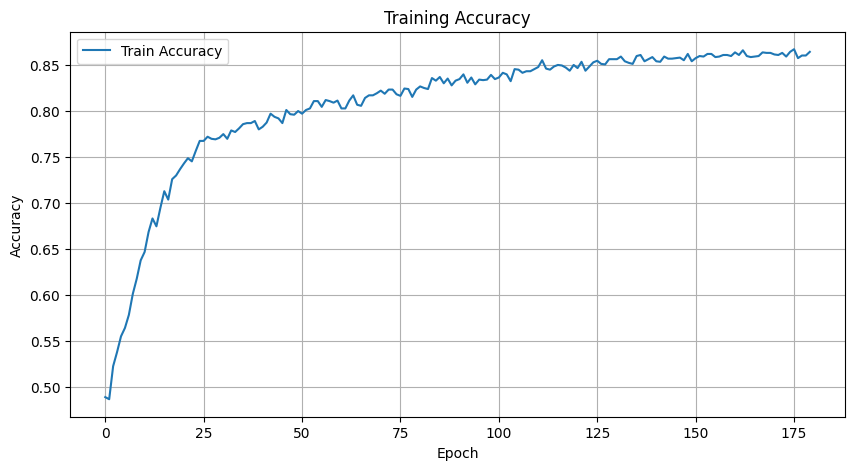

[I 2025-03-06 07:03:10,443] Trial 79 finished with value: 0.8501620083770185 and parameters: {'lr': 1.1749381984379485e-05, 'hidden_size': 92, 'dropout_rate': 0.2515190228525305, 'batch_size': 32, 'num_epochs': 180}. Best is trial 78 with value: 0.8699981560022128.


Epoch [1/166], Step [10/55], Loss: 0.6891
Epoch [1/166], Step [20/55], Loss: 0.7123
Epoch [1/166], Step [30/55], Loss: 0.6902
Epoch [1/166], Step [40/55], Loss: 0.7044
Epoch [1/166], Step [50/55], Loss: 0.6838
Epoch [1/166], Train Loss: 0.7069, Train Accuracy: 0.4378
Epoch [2/166], Step [10/55], Loss: 0.6740
Epoch [2/166], Step [20/55], Loss: 0.7036
Epoch [2/166], Step [30/55], Loss: 0.6885
Epoch [2/166], Step [40/55], Loss: 0.7155
Epoch [2/166], Step [50/55], Loss: 0.7125
Epoch [2/166], Train Loss: 0.6923, Train Accuracy: 0.5006
Epoch [3/166], Step [10/55], Loss: 0.6881
Epoch [3/166], Step [20/55], Loss: 0.7085
Epoch [3/166], Step [30/55], Loss: 0.6931
Epoch [3/166], Step [40/55], Loss: 0.6780
Epoch [3/166], Step [50/55], Loss: 0.6339
Epoch [3/166], Train Loss: 0.6822, Train Accuracy: 0.5548
Epoch [4/166], Step [10/55], Loss: 0.6723
Epoch [4/166], Step [20/55], Loss: 0.6705
Epoch [4/166], Step [30/55], Loss: 0.6679
Epoch [4/166], Step [40/55], Loss: 0.6721
Epoch [4/166], Step [50/55],

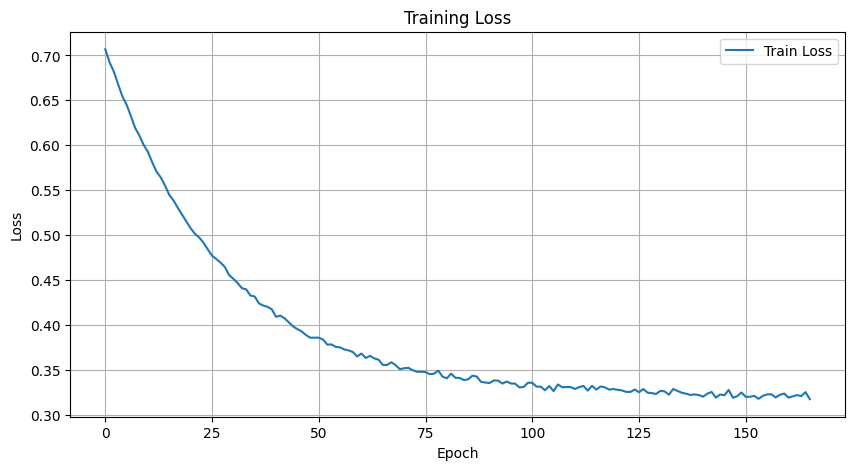

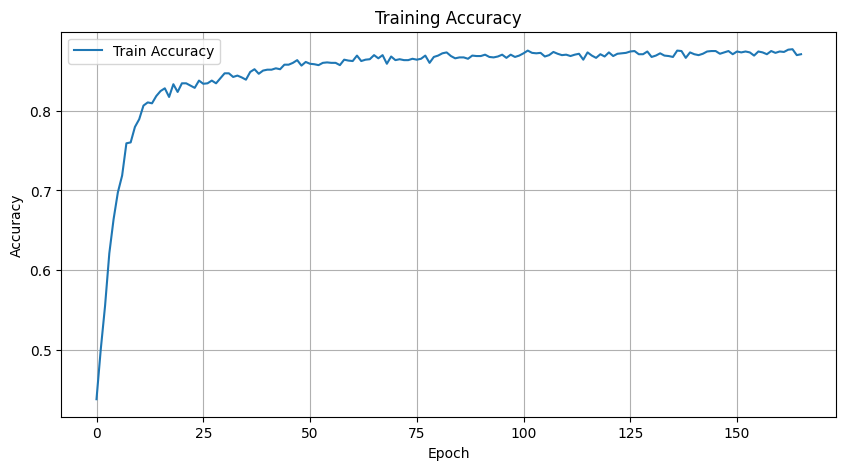

[I 2025-03-06 07:03:27,867] Trial 80 finished with value: 0.8725270672532336 and parameters: {'lr': 3.278754324798049e-05, 'hidden_size': 85, 'dropout_rate': 0.20889712521879314, 'batch_size': 32, 'num_epochs': 166}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/165], Step [10/55], Loss: 0.7323
Epoch [1/165], Step [20/55], Loss: 0.6901
Epoch [1/165], Step [30/55], Loss: 0.7253
Epoch [1/165], Step [40/55], Loss: 0.7039
Epoch [1/165], Step [50/55], Loss: 0.6991
Epoch [1/165], Train Loss: 0.7121, Train Accuracy: 0.4235
Epoch [2/165], Step [10/55], Loss: 0.6985
Epoch [2/165], Step [20/55], Loss: 0.6951
Epoch [2/165], Step [30/55], Loss: 0.6953
Epoch [2/165], Step [40/55], Loss: 0.6965
Epoch [2/165], Step [50/55], Loss: 0.6798
Epoch [2/165], Train Loss: 0.6988, Train Accuracy: 0.4812
Epoch [3/165], Step [10/55], Loss: 0.6905
Epoch [3/165], Step [20/55], Loss: 0.6910
Epoch [3/165], Step [30/55], Loss: 0.6681
Epoch [3/165], Step [40/55], Loss: 0.6585
Epoch [3/165], Step [50/55], Loss: 0.6815
Epoch [3/165], Train Loss: 0.6890, Train Accuracy: 0.5371
Epoch [4/165], Step [10/55], Loss: 0.6837
Epoch [4/165], Step [20/55], Loss: 0.6758
Epoch [4/165], Step [30/55], Loss: 0.6818
Epoch [4/165], Step [40/55], Loss: 0.6887
Epoch [4/165], Step [50/55],

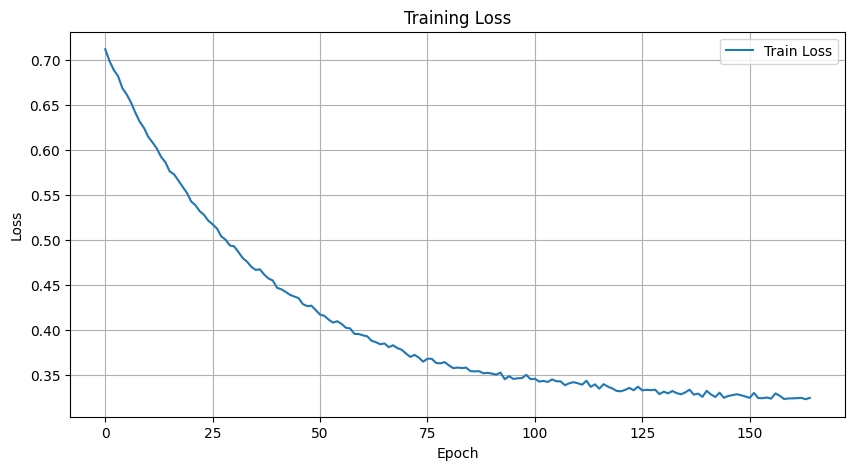

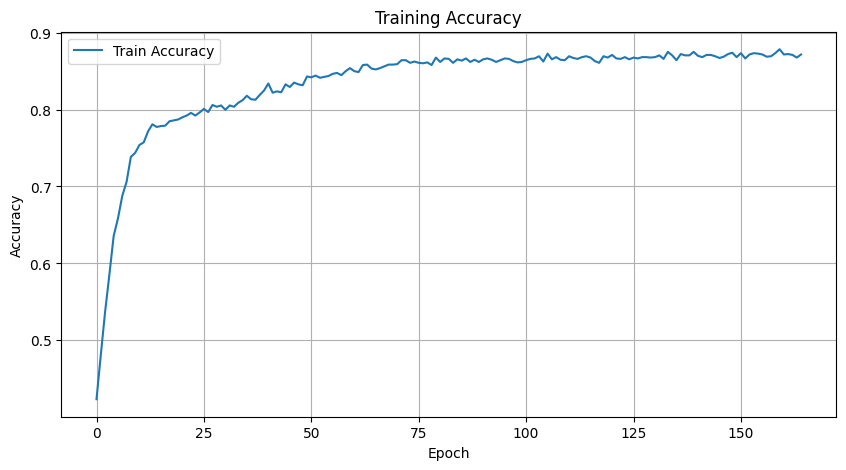

[I 2025-03-06 07:03:45,518] Trial 81 finished with value: 0.8580121703853955 and parameters: {'lr': 2.4182354462356365e-05, 'hidden_size': 85, 'dropout_rate': 0.20686939284725409, 'batch_size': 32, 'num_epochs': 165}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/171], Step [10/55], Loss: 0.7387
Epoch [1/171], Step [20/55], Loss: 0.7241
Epoch [1/171], Step [30/55], Loss: 0.6996
Epoch [1/171], Step [40/55], Loss: 0.7138
Epoch [1/171], Step [50/55], Loss: 0.7544
Epoch [1/171], Train Loss: 0.7380, Train Accuracy: 0.3921
Epoch [2/171], Step [10/55], Loss: 0.6981
Epoch [2/171], Step [20/55], Loss: 0.7207
Epoch [2/171], Step [30/55], Loss: 0.7292
Epoch [2/171], Step [40/55], Loss: 0.7360
Epoch [2/171], Step [50/55], Loss: 0.7306
Epoch [2/171], Train Loss: 0.7212, Train Accuracy: 0.4486
Epoch [3/171], Step [10/55], Loss: 0.7300
Epoch [3/171], Step [20/55], Loss: 0.6512
Epoch [3/171], Step [30/55], Loss: 0.7343
Epoch [3/171], Step [40/55], Loss: 0.6796
Epoch [3/171], Step [50/55], Loss: 0.6908
Epoch [3/171], Train Loss: 0.7039, Train Accuracy: 0.4994
Epoch [4/171], Step [10/55], Loss: 0.7457
Epoch [4/171], Step [20/55], Loss: 0.6714
Epoch [4/171], Step [30/55], Loss: 0.6889
Epoch [4/171], Step [40/55], Loss: 0.6572
Epoch [4/171], Step [50/55],

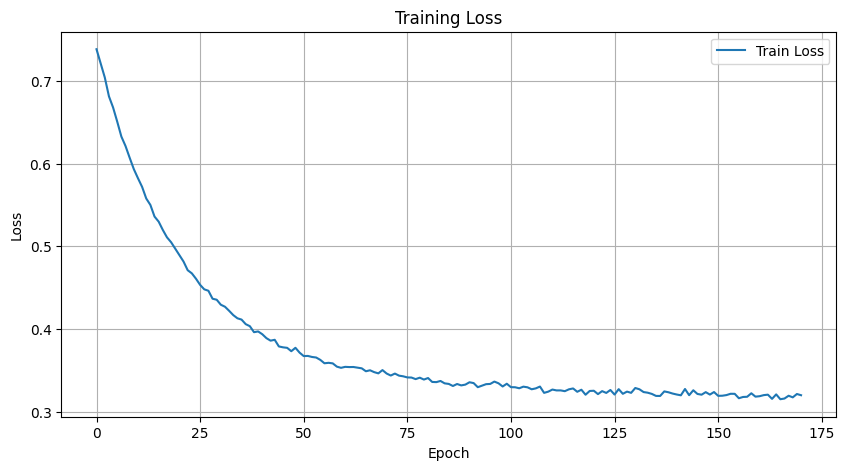

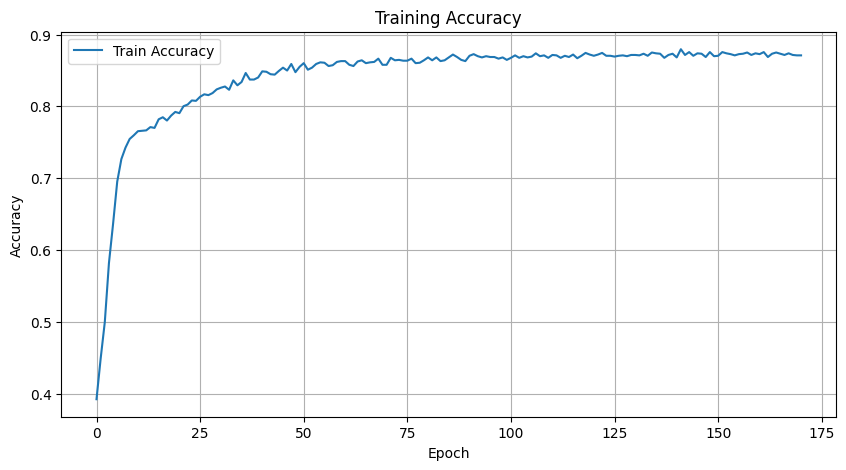

[I 2025-03-06 07:04:03,623] Trial 82 finished with value: 0.8640973630831644 and parameters: {'lr': 3.842467034230003e-05, 'hidden_size': 92, 'dropout_rate': 0.22595176900024286, 'batch_size': 32, 'num_epochs': 171}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/158], Step [10/55], Loss: 0.7042
Epoch [1/158], Step [20/55], Loss: 0.6633
Epoch [1/158], Step [30/55], Loss: 0.7161
Epoch [1/158], Step [40/55], Loss: 0.7337
Epoch [1/158], Step [50/55], Loss: 0.7048
Epoch [1/158], Train Loss: 0.7019, Train Accuracy: 0.4932
Epoch [2/158], Step [10/55], Loss: 0.7067
Epoch [2/158], Step [20/55], Loss: 0.6938
Epoch [2/158], Step [30/55], Loss: 0.6841
Epoch [2/158], Step [40/55], Loss: 0.6891
Epoch [2/158], Step [50/55], Loss: 0.7105
Epoch [2/158], Train Loss: 0.6957, Train Accuracy: 0.5308
Epoch [3/158], Step [10/55], Loss: 0.6937
Epoch [3/158], Step [20/55], Loss: 0.7010
Epoch [3/158], Step [30/55], Loss: 0.6791
Epoch [3/158], Step [40/55], Loss: 0.6729
Epoch [3/158], Step [50/55], Loss: 0.6542
Epoch [3/158], Train Loss: 0.6852, Train Accuracy: 0.5616
Epoch [4/158], Step [10/55], Loss: 0.6459
Epoch [4/158], Step [20/55], Loss: 0.6570
Epoch [4/158], Step [30/55], Loss: 0.7140
Epoch [4/158], Step [40/55], Loss: 0.6957
Epoch [4/158], Step [50/55],

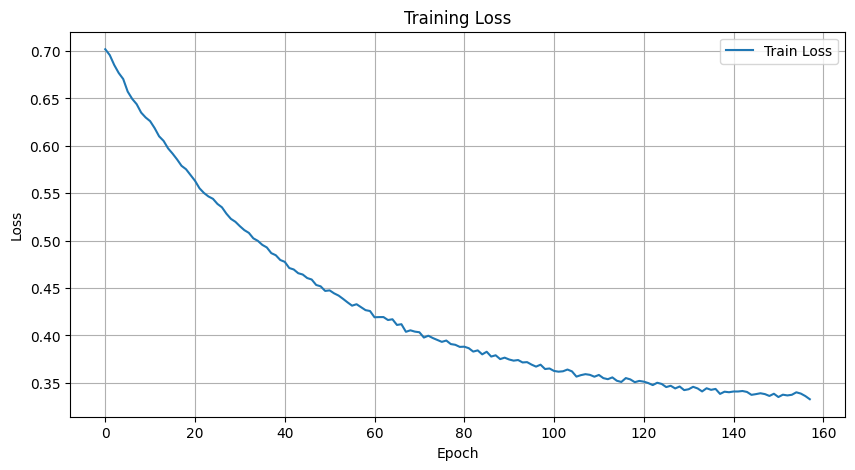

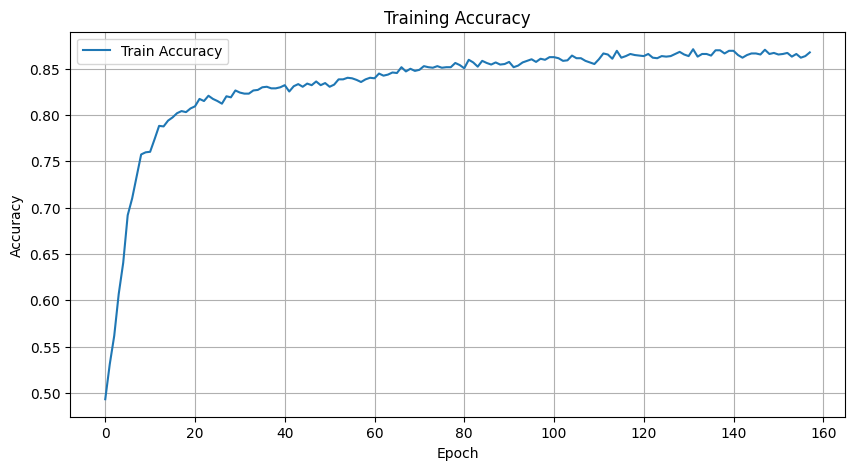

[I 2025-03-06 07:04:19,955] Trial 83 finished with value: 0.8598298253470668 and parameters: {'lr': 1.894657581381384e-05, 'hidden_size': 88, 'dropout_rate': 0.21551656649396725, 'batch_size': 32, 'num_epochs': 158}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/184], Step [10/55], Loss: 0.5966
Epoch [1/184], Step [20/55], Loss: 0.6547
Epoch [1/184], Step [30/55], Loss: 0.5575
Epoch [1/184], Step [40/55], Loss: 0.6384
Epoch [1/184], Step [50/55], Loss: 0.6037
Epoch [1/184], Train Loss: 0.6366, Train Accuracy: 0.7140
Epoch [2/184], Step [10/55], Loss: 0.6441
Epoch [2/184], Step [20/55], Loss: 0.6016
Epoch [2/184], Step [30/55], Loss: 0.6126
Epoch [2/184], Step [40/55], Loss: 0.6559
Epoch [2/184], Step [50/55], Loss: 0.5991
Epoch [2/184], Train Loss: 0.6284, Train Accuracy: 0.7146
Epoch [3/184], Step [10/55], Loss: 0.6314
Epoch [3/184], Step [20/55], Loss: 0.6111
Epoch [3/184], Step [30/55], Loss: 0.6105
Epoch [3/184], Step [40/55], Loss: 0.6149
Epoch [3/184], Step [50/55], Loss: 0.6198
Epoch [3/184], Train Loss: 0.6222, Train Accuracy: 0.7329
Epoch [4/184], Step [10/55], Loss: 0.5966
Epoch [4/184], Step [20/55], Loss: 0.6101
Epoch [4/184], Step [30/55], Loss: 0.6096
Epoch [4/184], Step [40/55], Loss: 0.6437
Epoch [4/184], Step [50/55],

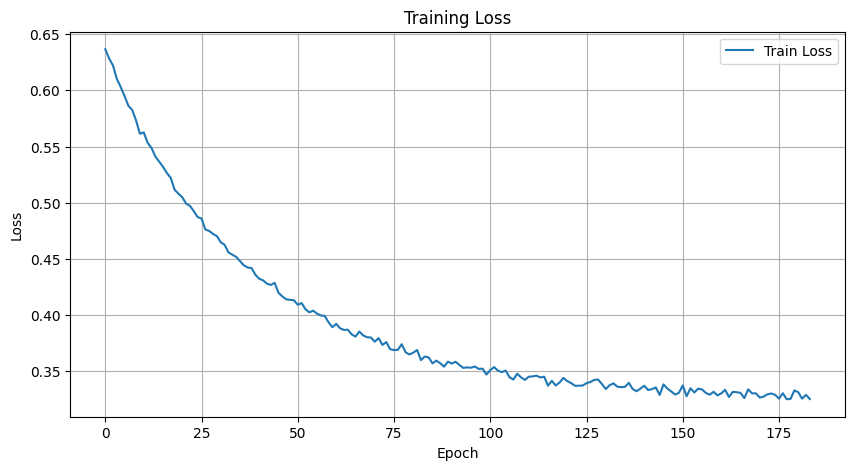

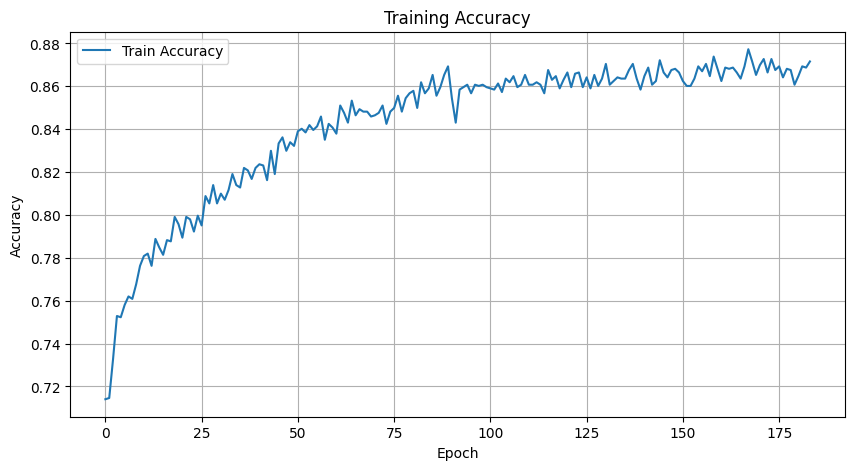

[I 2025-03-06 07:04:38,688] Trial 84 finished with value: 0.8552198308790602 and parameters: {'lr': 3.218280557936889e-05, 'hidden_size': 45, 'dropout_rate': 0.28219876317357084, 'batch_size': 32, 'num_epochs': 184}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/167], Step [10/55], Loss: 0.7607
Epoch [1/167], Step [20/55], Loss: 0.7290
Epoch [1/167], Step [30/55], Loss: 0.7158
Epoch [1/167], Step [40/55], Loss: 0.7468
Epoch [1/167], Step [50/55], Loss: 0.7253
Epoch [1/167], Train Loss: 0.7409, Train Accuracy: 0.3282
Epoch [2/167], Step [10/55], Loss: 0.7113
Epoch [2/167], Step [20/55], Loss: 0.7084
Epoch [2/167], Step [30/55], Loss: 0.6674
Epoch [2/167], Step [40/55], Loss: 0.7086
Epoch [2/167], Step [50/55], Loss: 0.6711
Epoch [2/167], Train Loss: 0.7209, Train Accuracy: 0.4058
Epoch [3/167], Step [10/55], Loss: 0.7231
Epoch [3/167], Step [20/55], Loss: 0.6820
Epoch [3/167], Step [30/55], Loss: 0.6647
Epoch [3/167], Step [40/55], Loss: 0.7000
Epoch [3/167], Step [50/55], Loss: 0.6842
Epoch [3/167], Train Loss: 0.6947, Train Accuracy: 0.5211
Epoch [4/167], Step [10/55], Loss: 0.7213
Epoch [4/167], Step [20/55], Loss: 0.6613
Epoch [4/167], Step [30/55], Loss: 0.6494
Epoch [4/167], Step [40/55], Loss: 0.6692
Epoch [4/167], Step [50/55],

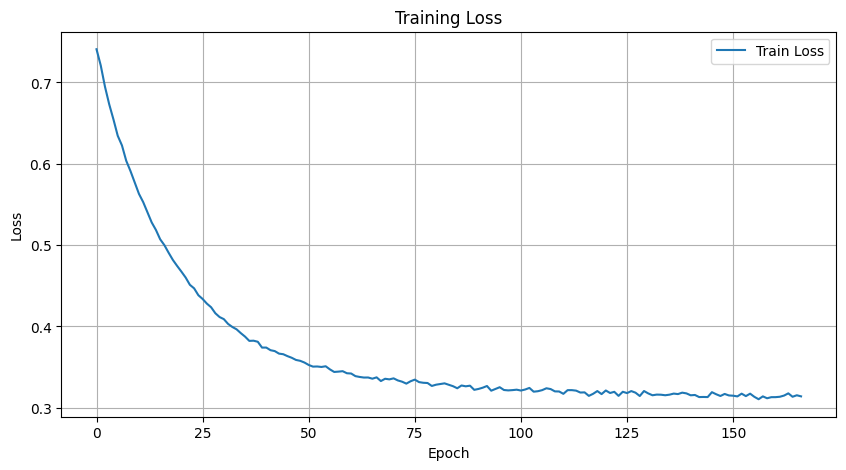

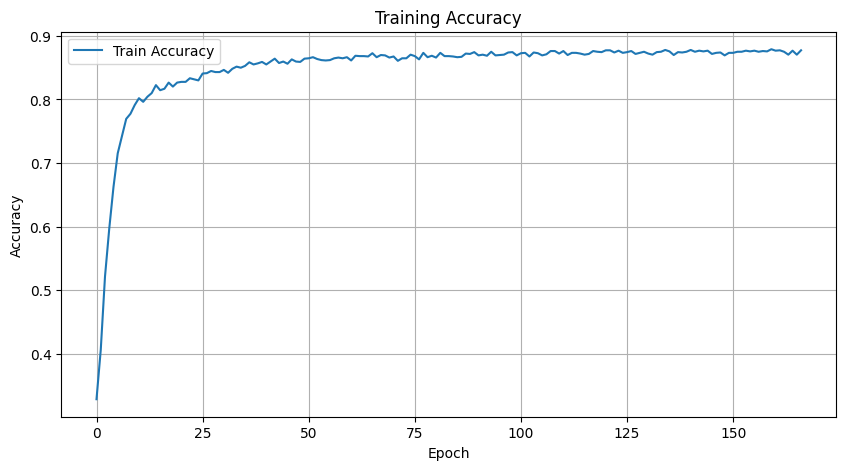

[I 2025-03-06 07:04:55,829] Trial 85 finished with value: 0.8548510313216195 and parameters: {'lr': 4.2418754319585126e-05, 'hidden_size': 98, 'dropout_rate': 0.1973164434735029, 'batch_size': 32, 'num_epochs': 167}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/192], Step [10/55], Loss: 0.7505
Epoch [1/192], Step [20/55], Loss: 0.7135
Epoch [1/192], Step [30/55], Loss: 0.7389
Epoch [1/192], Step [40/55], Loss: 0.7795
Epoch [1/192], Step [50/55], Loss: 0.7516
Epoch [1/192], Train Loss: 0.7541, Train Accuracy: 0.3664
Epoch [2/192], Step [10/55], Loss: 0.7097
Epoch [2/192], Step [20/55], Loss: 0.7120
Epoch [2/192], Step [30/55], Loss: 0.7672
Epoch [2/192], Step [40/55], Loss: 0.7065
Epoch [2/192], Step [50/55], Loss: 0.7186
Epoch [2/192], Train Loss: 0.7280, Train Accuracy: 0.4155
Epoch [3/192], Step [10/55], Loss: 0.6991
Epoch [3/192], Step [20/55], Loss: 0.7370
Epoch [3/192], Step [30/55], Loss: 0.6765
Epoch [3/192], Step [40/55], Loss: 0.6980
Epoch [3/192], Step [50/55], Loss: 0.7149
Epoch [3/192], Train Loss: 0.6975, Train Accuracy: 0.4960
Epoch [4/192], Step [10/55], Loss: 0.7069
Epoch [4/192], Step [20/55], Loss: 0.6652
Epoch [4/192], Step [30/55], Loss: 0.6835
Epoch [4/192], Step [40/55], Loss: 0.6747
Epoch [4/192], Step [50/55],

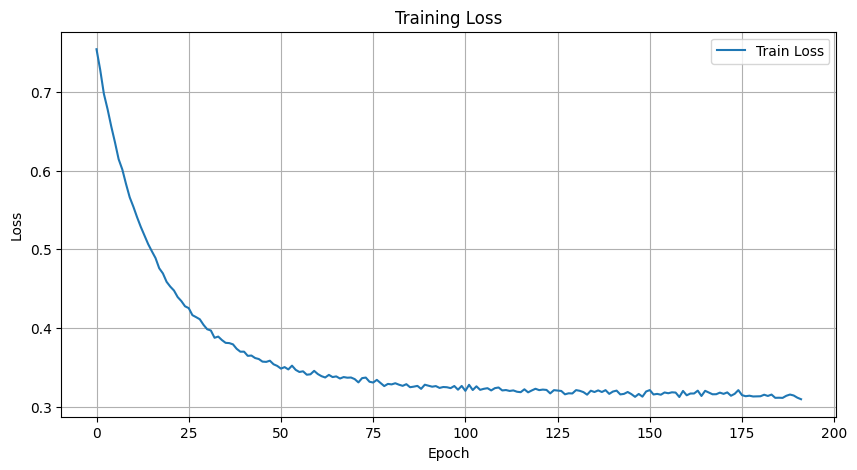

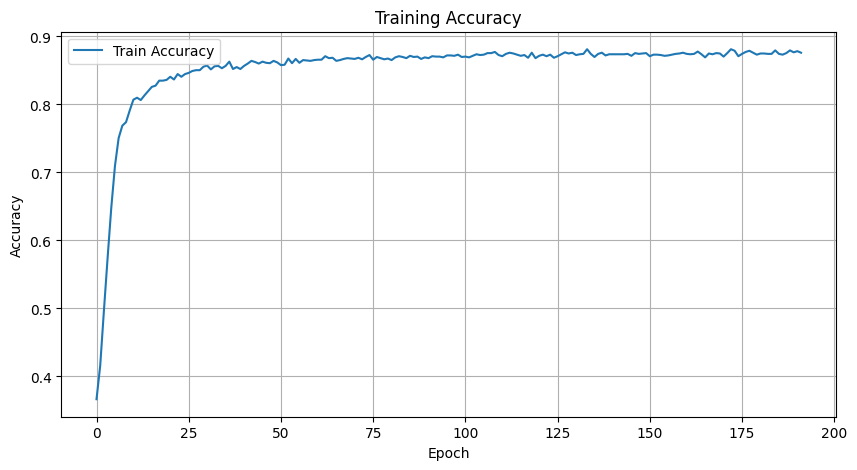

[I 2025-03-06 07:05:16,767] Trial 86 finished with value: 0.8632017070150945 and parameters: {'lr': 5.2053083097132377e-05, 'hidden_size': 85, 'dropout_rate': 0.25723094305553384, 'batch_size': 32, 'num_epochs': 192}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/149], Step [10/55], Loss: 0.6625
Epoch [1/149], Step [20/55], Loss: 0.6376
Epoch [1/149], Step [30/55], Loss: 0.7271
Epoch [1/149], Step [40/55], Loss: 0.6358
Epoch [1/149], Step [50/55], Loss: 0.6787
Epoch [1/149], Train Loss: 0.6768, Train Accuracy: 0.5651
Epoch [2/149], Step [10/55], Loss: 0.6812
Epoch [2/149], Step [20/55], Loss: 0.6884
Epoch [2/149], Step [30/55], Loss: 0.6344
Epoch [2/149], Step [40/55], Loss: 0.5810
Epoch [2/149], Step [50/55], Loss: 0.6436
Epoch [2/149], Train Loss: 0.6700, Train Accuracy: 0.5976
Epoch [3/149], Step [10/55], Loss: 0.7042
Epoch [3/149], Step [20/55], Loss: 0.6782
Epoch [3/149], Step [30/55], Loss: 0.6529
Epoch [3/149], Step [40/55], Loss: 0.6559
Epoch [3/149], Step [50/55], Loss: 0.6406
Epoch [3/149], Train Loss: 0.6578, Train Accuracy: 0.6336
Epoch [4/149], Step [10/55], Loss: 0.6430
Epoch [4/149], Step [20/55], Loss: 0.6542
Epoch [4/149], Step [30/55], Loss: 0.6546
Epoch [4/149], Step [40/55], Loss: 0.6566
Epoch [4/149], Step [50/55],

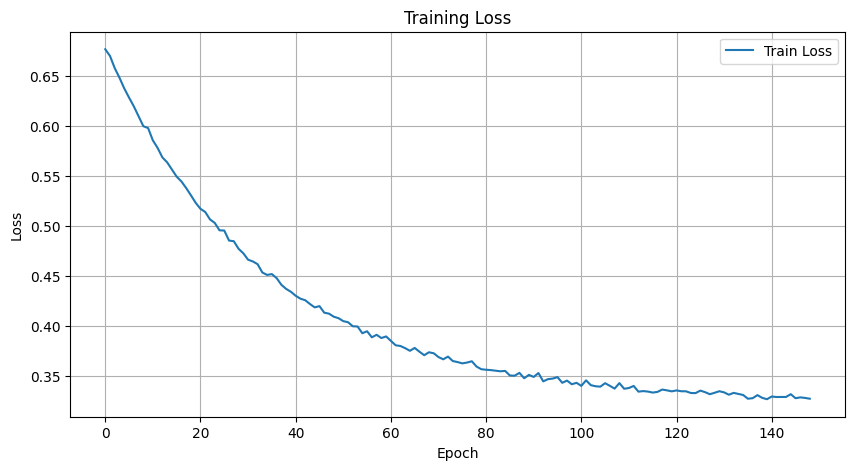

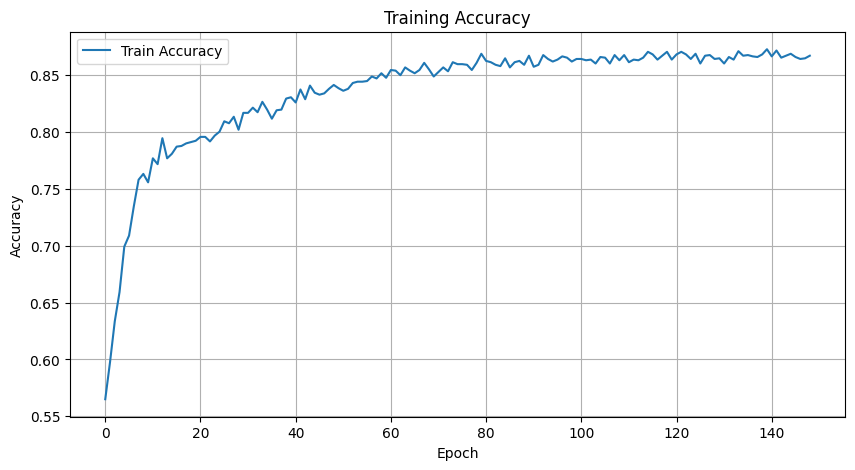

[I 2025-03-06 07:05:33,088] Trial 87 finished with value: 0.8570901714917941 and parameters: {'lr': 2.5336642360426772e-05, 'hidden_size': 82, 'dropout_rate': 0.2431548217937709, 'batch_size': 32, 'num_epochs': 149}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/158], Step [10/55], Loss: 0.6764
Epoch [1/158], Step [20/55], Loss: 0.6698
Epoch [1/158], Step [30/55], Loss: 0.6436
Epoch [1/158], Step [40/55], Loss: 0.6387
Epoch [1/158], Step [50/55], Loss: 0.6289
Epoch [1/158], Train Loss: 0.6561, Train Accuracy: 0.6986
Epoch [2/158], Step [10/55], Loss: 0.6297
Epoch [2/158], Step [20/55], Loss: 0.6436
Epoch [2/158], Step [30/55], Loss: 0.6283
Epoch [2/158], Step [40/55], Loss: 0.6211
Epoch [2/158], Step [50/55], Loss: 0.6034
Epoch [2/158], Train Loss: 0.6073, Train Accuracy: 0.7774
Epoch [3/158], Step [10/55], Loss: 0.6354
Epoch [3/158], Step [20/55], Loss: 0.5578
Epoch [3/158], Step [30/55], Loss: 0.5535
Epoch [3/158], Step [40/55], Loss: 0.5711
Epoch [3/158], Step [50/55], Loss: 0.5051
Epoch [3/158], Train Loss: 0.5654, Train Accuracy: 0.8122
Epoch [4/158], Step [10/55], Loss: 0.5469
Epoch [4/158], Step [20/55], Loss: 0.5161
Epoch [4/158], Step [30/55], Loss: 0.5625
Epoch [4/158], Step [40/55], Loss: 0.5216
Epoch [4/158], Step [50/55],

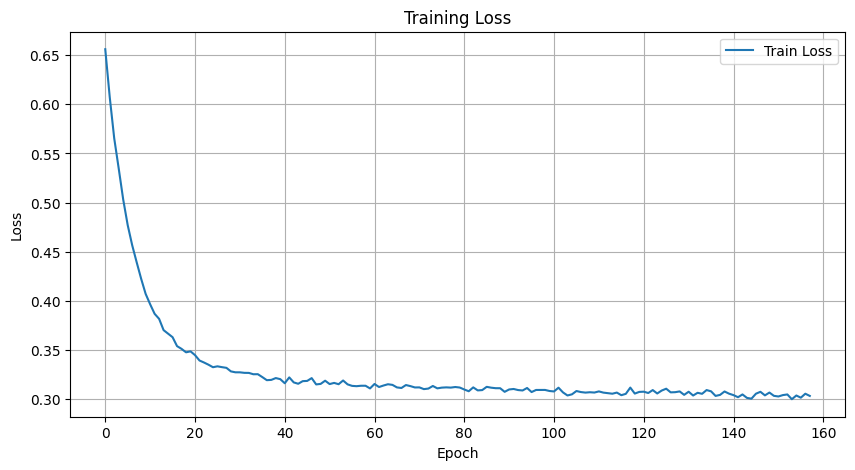

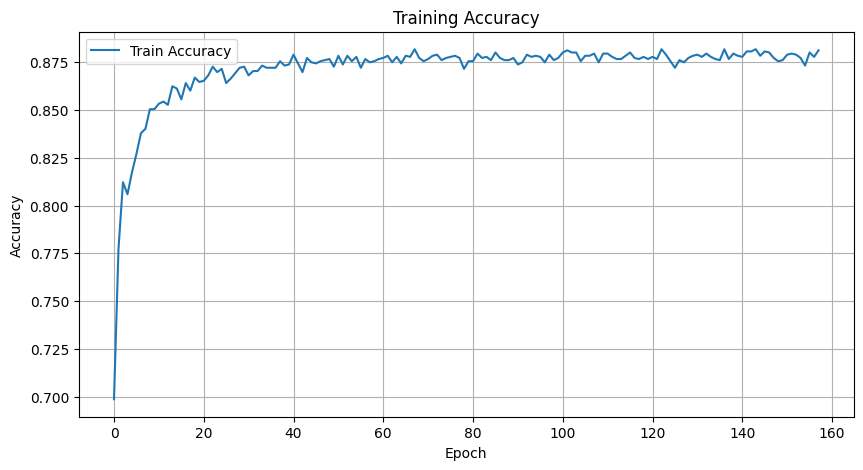

[I 2025-03-06 07:05:49,533] Trial 88 finished with value: 0.8608308527172625 and parameters: {'lr': 0.00012118897306342335, 'hidden_size': 93, 'dropout_rate': 0.17424108872437935, 'batch_size': 32, 'num_epochs': 158}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/174], Step [10/28], Loss: 0.6936
Epoch [1/174], Step [20/28], Loss: 0.6901
Epoch [1/174], Train Loss: 0.6796, Train Accuracy: 0.5748
Epoch [2/174], Step [10/28], Loss: 0.6638
Epoch [2/174], Step [20/28], Loss: 0.6518
Epoch [2/174], Train Loss: 0.6604, Train Accuracy: 0.6587
Epoch [3/174], Step [10/28], Loss: 0.6281
Epoch [3/174], Step [20/28], Loss: 0.6332
Epoch [3/174], Train Loss: 0.6434, Train Accuracy: 0.7352
Epoch [4/174], Step [10/28], Loss: 0.6523
Epoch [4/174], Step [20/28], Loss: 0.6352
Epoch [4/174], Train Loss: 0.6271, Train Accuracy: 0.7591
Epoch [5/174], Step [10/28], Loss: 0.6372
Epoch [5/174], Step [20/28], Loss: 0.6148
Epoch [5/174], Train Loss: 0.6138, Train Accuracy: 0.7791
Epoch [6/174], Step [10/28], Loss: 0.6054
Epoch [6/174], Step [20/28], Loss: 0.5816
Epoch [6/174], Train Loss: 0.5972, Train Accuracy: 0.7888
Epoch [7/174], Step [10/28], Loss: 0.6113
Epoch [7/174], Step [20/28], Loss: 0.5971
Epoch [7/174], Train Loss: 0.5842, Train Accuracy: 0.8037
Epoch 

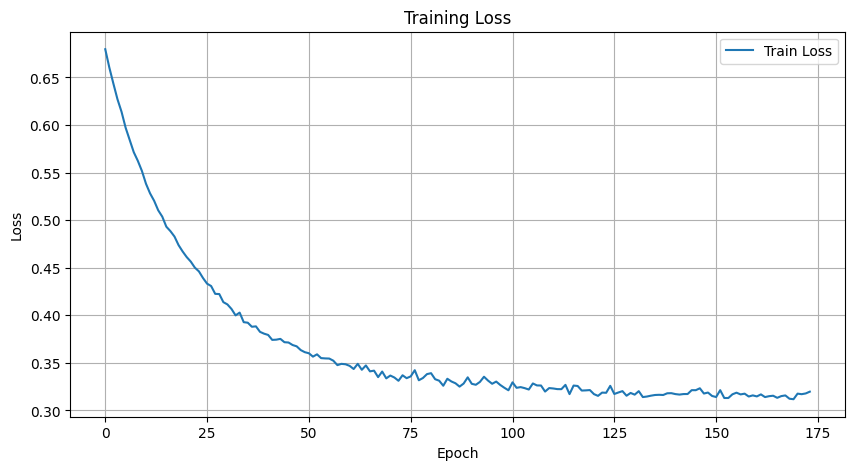

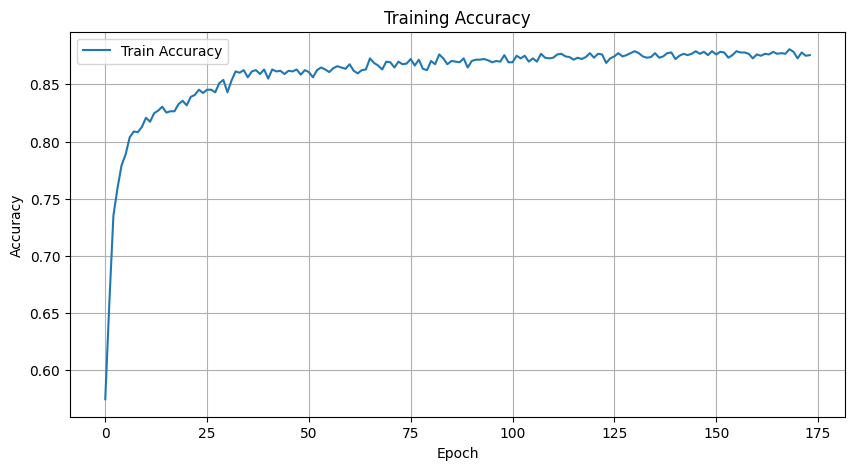

[I 2025-03-06 07:06:00,823] Trial 89 finished with value: 0.8633861067938148 and parameters: {'lr': 7.091798438998139e-05, 'hidden_size': 89, 'dropout_rate': 0.18949572857749855, 'batch_size': 64, 'num_epochs': 174}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/141], Step [10/55], Loss: 0.7226
Epoch [1/141], Step [20/55], Loss: 0.7082
Epoch [1/141], Step [30/55], Loss: 0.7025
Epoch [1/141], Step [40/55], Loss: 0.7205
Epoch [1/141], Step [50/55], Loss: 0.7349
Epoch [1/141], Train Loss: 0.7245, Train Accuracy: 0.3893
Epoch [2/141], Step [10/55], Loss: 0.7246
Epoch [2/141], Step [20/55], Loss: 0.7291
Epoch [2/141], Step [30/55], Loss: 0.7207
Epoch [2/141], Step [40/55], Loss: 0.7092
Epoch [2/141], Step [50/55], Loss: 0.7135
Epoch [2/141], Train Loss: 0.7184, Train Accuracy: 0.4172
Epoch [3/141], Step [10/55], Loss: 0.7262
Epoch [3/141], Step [20/55], Loss: 0.7056
Epoch [3/141], Step [30/55], Loss: 0.6965
Epoch [3/141], Step [40/55], Loss: 0.6706
Epoch [3/141], Step [50/55], Loss: 0.7259
Epoch [3/141], Train Loss: 0.7116, Train Accuracy: 0.4378
Epoch [4/141], Step [10/55], Loss: 0.6981
Epoch [4/141], Step [20/55], Loss: 0.7056
Epoch [4/141], Step [30/55], Loss: 0.6982
Epoch [4/141], Step [40/55], Loss: 0.6639
Epoch [4/141], Step [50/55],

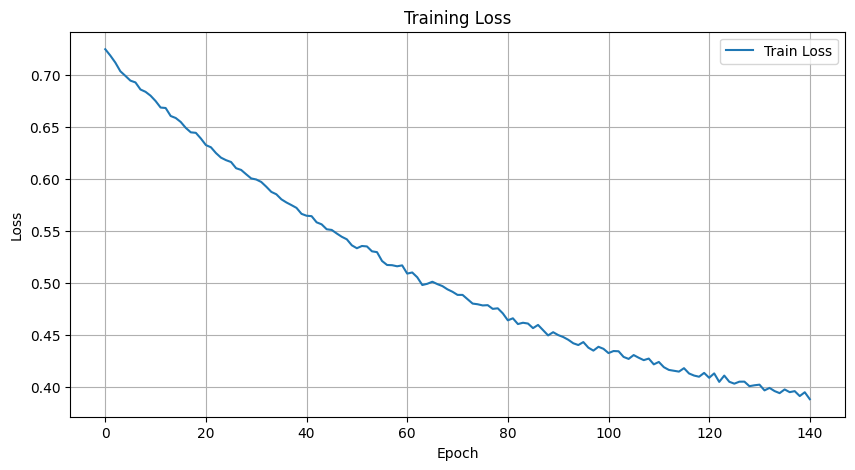

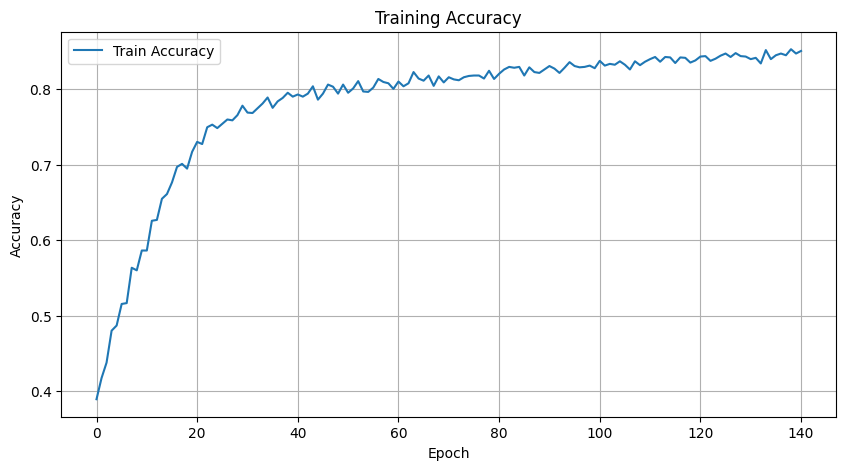

[I 2025-03-06 07:06:15,566] Trial 90 finished with value: 0.8448671004451939 and parameters: {'lr': 2.0119428895083736e-05, 'hidden_size': 34, 'dropout_rate': 0.3245161964843176, 'batch_size': 32, 'num_epochs': 141}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/90], Step [10/55], Loss: 0.7475
Epoch [1/90], Step [20/55], Loss: 0.7344
Epoch [1/90], Step [30/55], Loss: 0.7242
Epoch [1/90], Step [40/55], Loss: 0.7282
Epoch [1/90], Step [50/55], Loss: 0.7149
Epoch [1/90], Train Loss: 0.7324, Train Accuracy: 0.3590
Epoch [2/90], Step [10/55], Loss: 0.6858
Epoch [2/90], Step [20/55], Loss: 0.7161
Epoch [2/90], Step [30/55], Loss: 0.6893
Epoch [2/90], Step [40/55], Loss: 0.6661
Epoch [2/90], Step [50/55], Loss: 0.6743
Epoch [2/90], Train Loss: 0.7044, Train Accuracy: 0.4812
Epoch [3/90], Step [10/55], Loss: 0.7018
Epoch [3/90], Step [20/55], Loss: 0.6980
Epoch [3/90], Step [30/55], Loss: 0.6896
Epoch [3/90], Step [40/55], Loss: 0.6822
Epoch [3/90], Step [50/55], Loss: 0.6354
Epoch [3/90], Train Loss: 0.6781, Train Accuracy: 0.6119
Epoch [4/90], Step [10/55], Loss: 0.6473
Epoch [4/90], Step [20/55], Loss: 0.6539
Epoch [4/90], Step [30/55], Loss: 0.6389
Epoch [4/90], Step [40/55], Loss: 0.6510
Epoch [4/90], Step [50/55], Loss: 0.6051
Epoch [4/

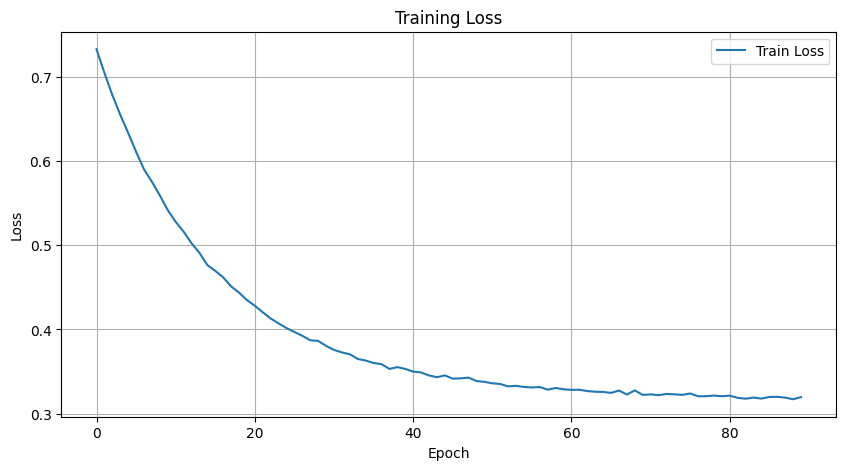

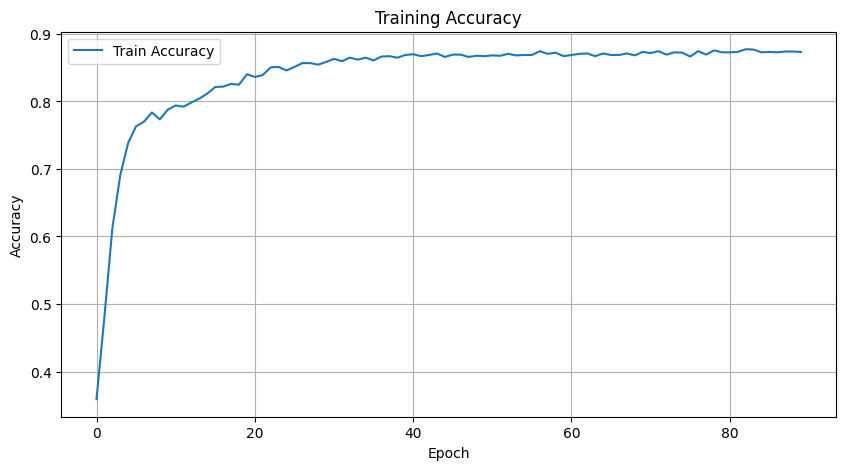

[I 2025-03-06 07:06:25,613] Trial 91 finished with value: 0.8660730749980243 and parameters: {'lr': 5.4696663119407895e-05, 'hidden_size': 96, 'dropout_rate': 0.15264831555911013, 'batch_size': 32, 'num_epochs': 90}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/168], Step [10/55], Loss: 0.7006
Epoch [1/168], Step [20/55], Loss: 0.6982
Epoch [1/168], Step [30/55], Loss: 0.7220
Epoch [1/168], Step [40/55], Loss: 0.6776
Epoch [1/168], Step [50/55], Loss: 0.7163
Epoch [1/168], Train Loss: 0.7071, Train Accuracy: 0.4857
Epoch [2/168], Step [10/55], Loss: 0.6830
Epoch [2/168], Step [20/55], Loss: 0.7066
Epoch [2/168], Step [30/55], Loss: 0.7112
Epoch [2/168], Step [40/55], Loss: 0.7054
Epoch [2/168], Step [50/55], Loss: 0.6861
Epoch [2/168], Train Loss: 0.6907, Train Accuracy: 0.5571
Epoch [3/168], Step [10/55], Loss: 0.6960
Epoch [3/168], Step [20/55], Loss: 0.6713
Epoch [3/168], Step [30/55], Loss: 0.7000
Epoch [3/168], Step [40/55], Loss: 0.6969
Epoch [3/168], Step [50/55], Loss: 0.6713
Epoch [3/168], Train Loss: 0.6788, Train Accuracy: 0.6107
Epoch [4/168], Step [10/55], Loss: 0.6428
Epoch [4/168], Step [20/55], Loss: 0.6486
Epoch [4/168], Step [30/55], Loss: 0.6882
Epoch [4/168], Step [40/55], Loss: 0.6220
Epoch [4/168], Step [50/55],

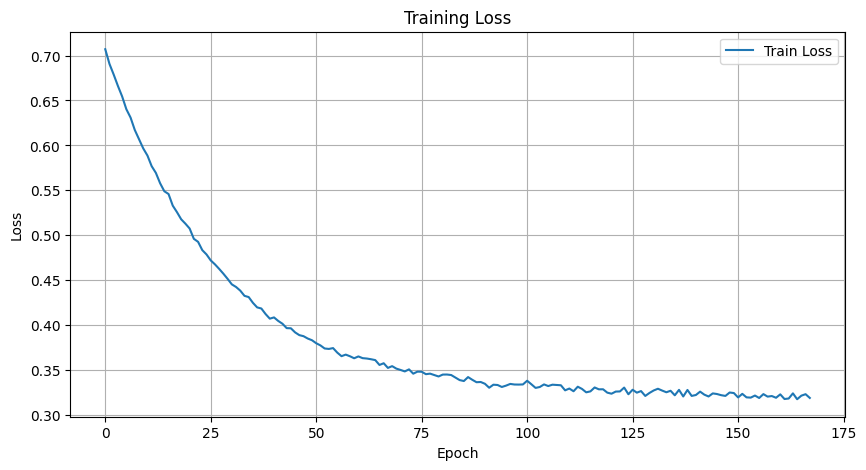

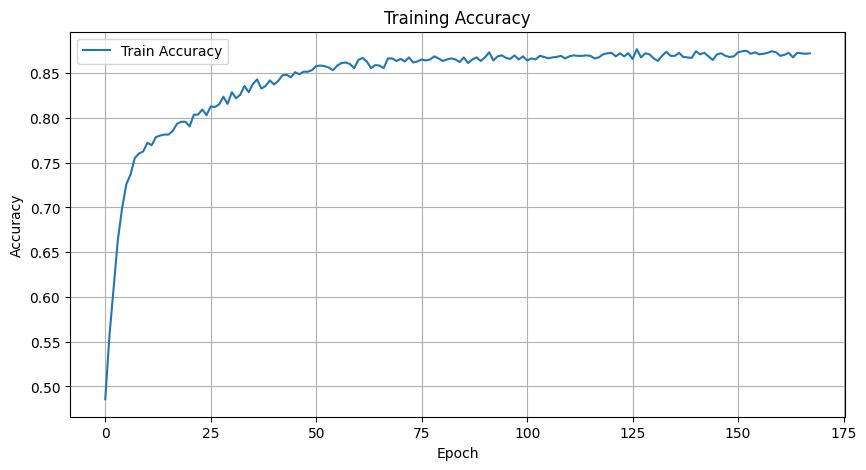

[I 2025-03-06 07:06:43,727] Trial 92 finished with value: 0.8623060509470246 and parameters: {'lr': 3.320891105982325e-05, 'hidden_size': 94, 'dropout_rate': 0.21391877871835524, 'batch_size': 32, 'num_epochs': 168}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/105], Step [10/55], Loss: 0.7414
Epoch [1/105], Step [20/55], Loss: 0.7473
Epoch [1/105], Step [30/55], Loss: 0.7423
Epoch [1/105], Step [40/55], Loss: 0.7053
Epoch [1/105], Step [50/55], Loss: 0.6892
Epoch [1/105], Train Loss: 0.7169, Train Accuracy: 0.4663
Epoch [2/105], Step [10/55], Loss: 0.6981
Epoch [2/105], Step [20/55], Loss: 0.7209
Epoch [2/105], Step [30/55], Loss: 0.6750
Epoch [2/105], Step [40/55], Loss: 0.6955
Epoch [2/105], Step [50/55], Loss: 0.6902
Epoch [2/105], Train Loss: 0.6938, Train Accuracy: 0.5428
Epoch [3/105], Step [10/55], Loss: 0.6681
Epoch [3/105], Step [20/55], Loss: 0.6884
Epoch [3/105], Step [30/55], Loss: 0.6792
Epoch [3/105], Step [40/55], Loss: 0.6793
Epoch [3/105], Step [50/55], Loss: 0.6569
Epoch [3/105], Train Loss: 0.6735, Train Accuracy: 0.6045
Epoch [4/105], Step [10/55], Loss: 0.6871
Epoch [4/105], Step [20/55], Loss: 0.6696
Epoch [4/105], Step [30/55], Loss: 0.6275
Epoch [4/105], Step [40/55], Loss: 0.6976
Epoch [4/105], Step [50/55],

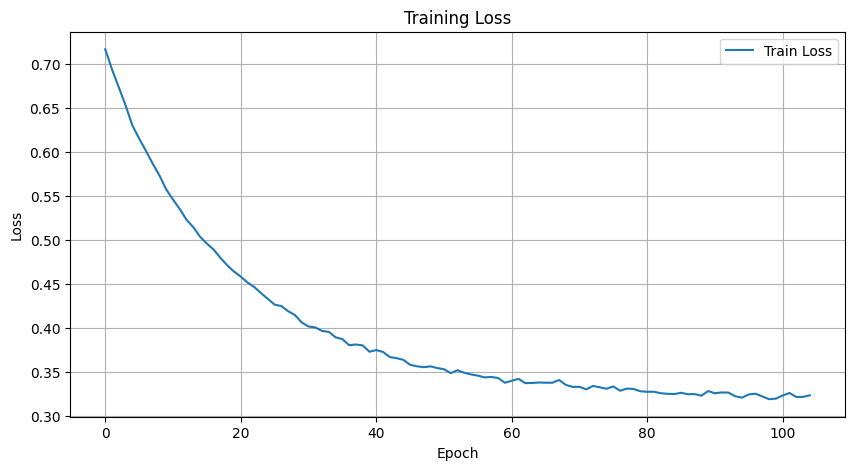

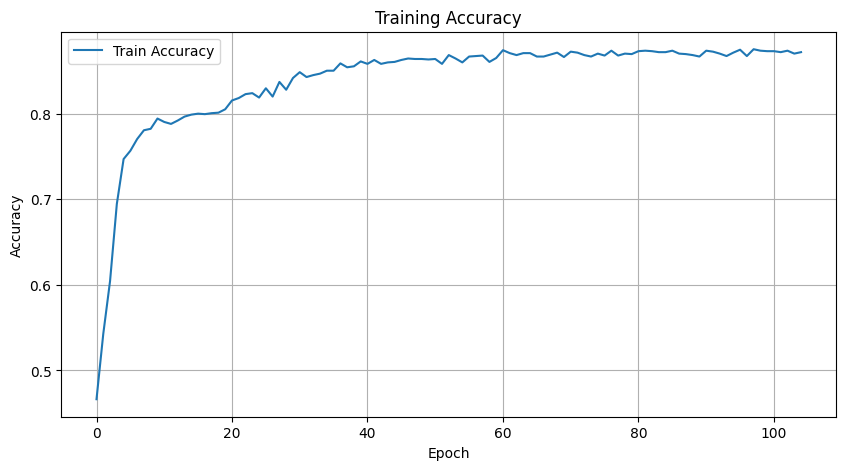

[I 2025-03-06 07:06:55,013] Trial 93 finished with value: 0.859223940359843 and parameters: {'lr': 4.339663545927519e-05, 'hidden_size': 98, 'dropout_rate': 0.23464583405756118, 'batch_size': 32, 'num_epochs': 105}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/71], Step [10/55], Loss: 0.7522
Epoch [1/71], Step [20/55], Loss: 0.7313
Epoch [1/71], Step [30/55], Loss: 0.7306
Epoch [1/71], Step [40/55], Loss: 0.6751
Epoch [1/71], Step [50/55], Loss: 0.7263
Epoch [1/71], Train Loss: 0.7196, Train Accuracy: 0.4304
Epoch [2/71], Step [10/55], Loss: 0.6616
Epoch [2/71], Step [20/55], Loss: 0.6953
Epoch [2/71], Step [30/55], Loss: 0.7088
Epoch [2/71], Step [40/55], Loss: 0.6692
Epoch [2/71], Step [50/55], Loss: 0.6701
Epoch [2/71], Train Loss: 0.6790, Train Accuracy: 0.5565
Epoch [3/71], Step [10/55], Loss: 0.6086
Epoch [3/71], Step [20/55], Loss: 0.6851
Epoch [3/71], Step [30/55], Loss: 0.6288
Epoch [3/71], Step [40/55], Loss: 0.6666
Epoch [3/71], Step [50/55], Loss: 0.6588
Epoch [3/71], Train Loss: 0.6423, Train Accuracy: 0.6969
Epoch [4/71], Step [10/55], Loss: 0.6420
Epoch [4/71], Step [20/55], Loss: 0.6737
Epoch [4/71], Step [30/55], Loss: 0.6124
Epoch [4/71], Step [40/55], Loss: 0.5726
Epoch [4/71], Step [50/55], Loss: 0.6254
Epoch [4/

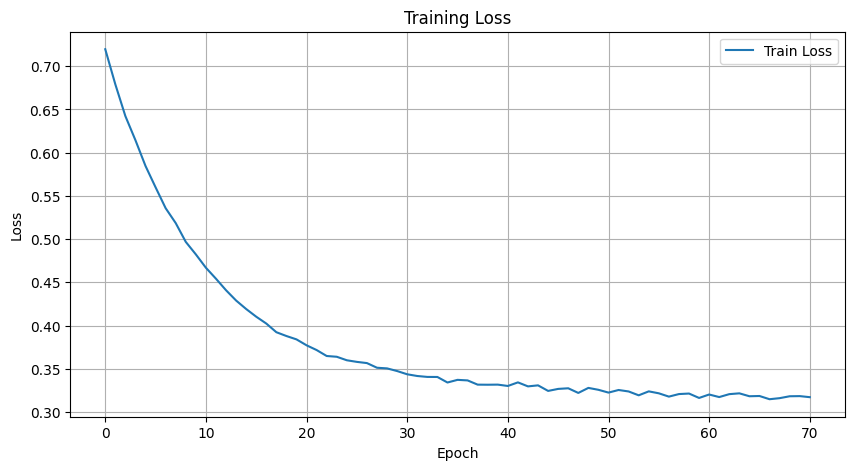

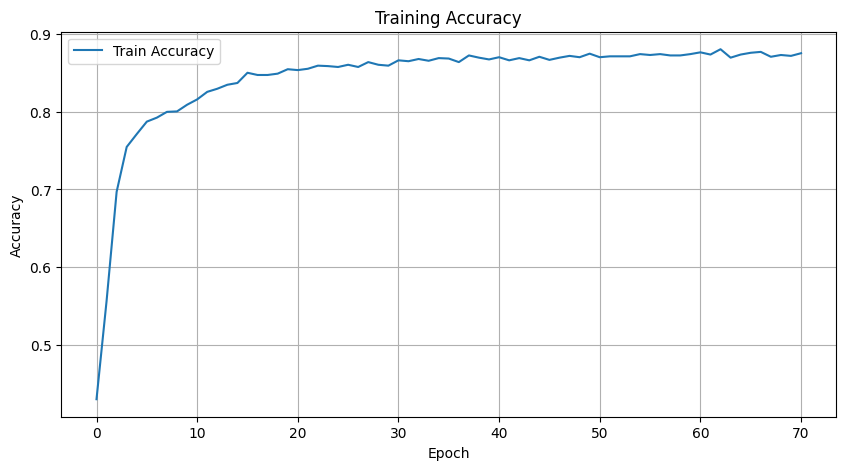

[I 2025-03-06 07:07:02,932] Trial 94 finished with value: 0.8668897025894997 and parameters: {'lr': 8.832503931946409e-05, 'hidden_size': 90, 'dropout_rate': 0.1633350370547743, 'batch_size': 32, 'num_epochs': 71}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/72], Step [10/55], Loss: 0.7683
Epoch [1/72], Step [20/55], Loss: 0.7470
Epoch [1/72], Step [30/55], Loss: 0.7423
Epoch [1/72], Step [40/55], Loss: 0.7428
Epoch [1/72], Step [50/55], Loss: 0.7045
Epoch [1/72], Train Loss: 0.7484, Train Accuracy: 0.2711
Epoch [2/72], Step [10/55], Loss: 0.6931
Epoch [2/72], Step [20/55], Loss: 0.6822
Epoch [2/72], Step [30/55], Loss: 0.6900
Epoch [2/72], Step [40/55], Loss: 0.6925
Epoch [2/72], Step [50/55], Loss: 0.6695
Epoch [2/72], Train Loss: 0.6784, Train Accuracy: 0.5753
Epoch [3/72], Step [10/55], Loss: 0.6933
Epoch [3/72], Step [20/55], Loss: 0.6273
Epoch [3/72], Step [30/55], Loss: 0.6061
Epoch [3/72], Step [40/55], Loss: 0.6075
Epoch [3/72], Step [50/55], Loss: 0.6089
Epoch [3/72], Train Loss: 0.6257, Train Accuracy: 0.7483
Epoch [4/72], Step [10/55], Loss: 0.5684
Epoch [4/72], Step [20/55], Loss: 0.6156
Epoch [4/72], Step [30/55], Loss: 0.5970
Epoch [4/72], Step [40/55], Loss: 0.5818
Epoch [4/72], Step [50/55], Loss: 0.5816
Epoch [4/

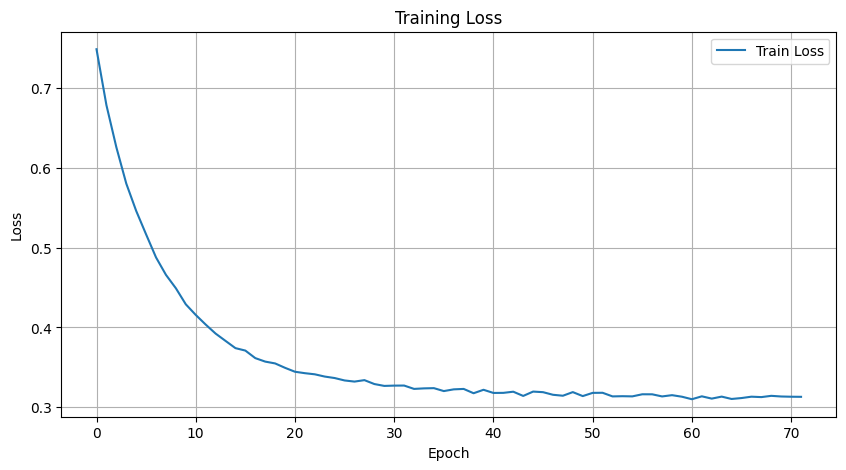

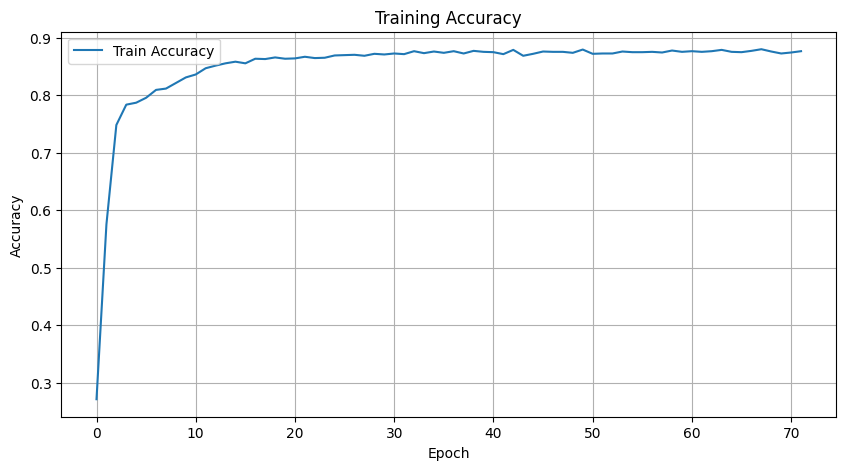

[I 2025-03-06 07:07:11,150] Trial 95 finished with value: 0.8622006796448987 and parameters: {'lr': 0.0001256003201218227, 'hidden_size': 90, 'dropout_rate': 0.1472412344411343, 'batch_size': 32, 'num_epochs': 72}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/58], Step [10/55], Loss: 0.6290
Epoch [1/58], Step [20/55], Loss: 0.6035
Epoch [1/58], Step [30/55], Loss: 0.6008
Epoch [1/58], Step [40/55], Loss: 0.6149
Epoch [1/58], Step [50/55], Loss: 0.5886
Epoch [1/58], Train Loss: 0.6304, Train Accuracy: 0.7437
Epoch [2/58], Step [10/55], Loss: 0.6213
Epoch [2/58], Step [20/55], Loss: 0.5744
Epoch [2/58], Step [30/55], Loss: 0.5899
Epoch [2/58], Step [40/55], Loss: 0.6130
Epoch [2/58], Step [50/55], Loss: 0.5831
Epoch [2/58], Train Loss: 0.6009, Train Accuracy: 0.7734
Epoch [3/58], Step [10/55], Loss: 0.5472
Epoch [3/58], Step [20/55], Loss: 0.6155
Epoch [3/58], Step [30/55], Loss: 0.6199
Epoch [3/58], Step [40/55], Loss: 0.5412
Epoch [3/58], Step [50/55], Loss: 0.5370
Epoch [3/58], Train Loss: 0.5743, Train Accuracy: 0.7797
Epoch [4/58], Step [10/55], Loss: 0.5098
Epoch [4/58], Step [20/55], Loss: 0.4994
Epoch [4/58], Step [30/55], Loss: 0.5800
Epoch [4/58], Step [40/55], Loss: 0.5139
Epoch [4/58], Step [50/55], Loss: 0.5393
Epoch [4/

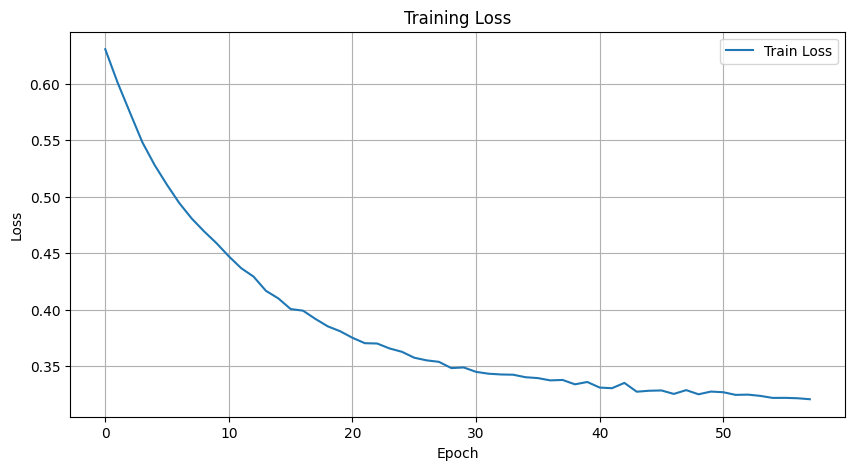

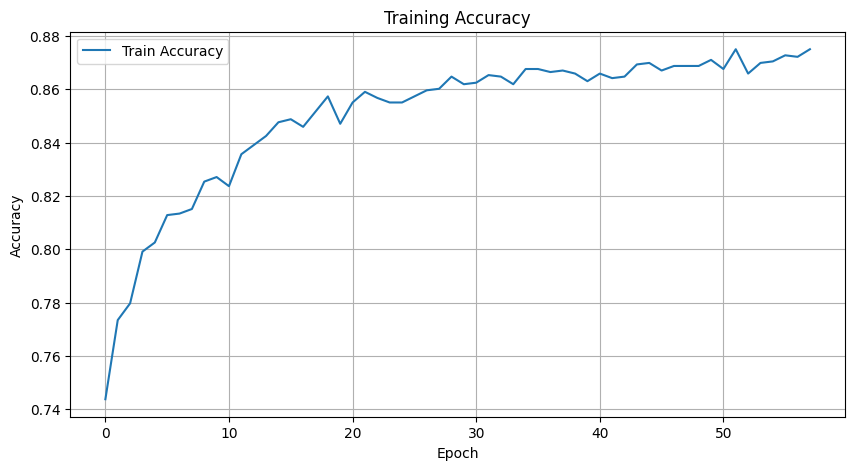

[I 2025-03-06 07:07:18,506] Trial 96 finished with value: 0.8579331419088012 and parameters: {'lr': 8.342978249343657e-05, 'hidden_size': 87, 'dropout_rate': 0.17591473163616617, 'batch_size': 32, 'num_epochs': 58}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/49], Step [10/55], Loss: 0.7075
Epoch [1/49], Step [20/55], Loss: 0.6685
Epoch [1/49], Step [30/55], Loss: 0.6915
Epoch [1/49], Step [40/55], Loss: 0.6941
Epoch [1/49], Step [50/55], Loss: 0.6815
Epoch [1/49], Train Loss: 0.6991, Train Accuracy: 0.5131
Epoch [2/49], Step [10/55], Loss: 0.6807
Epoch [2/49], Step [20/55], Loss: 0.6594
Epoch [2/49], Step [30/55], Loss: 0.6799
Epoch [2/49], Step [40/55], Loss: 0.6565
Epoch [2/49], Step [50/55], Loss: 0.6351
Epoch [2/49], Train Loss: 0.6601, Train Accuracy: 0.6821
Epoch [3/49], Step [10/55], Loss: 0.6550
Epoch [3/49], Step [20/55], Loss: 0.6474
Epoch [3/49], Step [30/55], Loss: 0.6278
Epoch [3/49], Step [40/55], Loss: 0.6300
Epoch [3/49], Step [50/55], Loss: 0.6107
Epoch [3/49], Train Loss: 0.6264, Train Accuracy: 0.7409
Epoch [4/49], Step [10/55], Loss: 0.6028
Epoch [4/49], Step [20/55], Loss: 0.5981
Epoch [4/49], Step [30/55], Loss: 0.5940
Epoch [4/49], Step [40/55], Loss: 0.5958
Epoch [4/49], Step [50/55], Loss: 0.5676
Epoch [4/

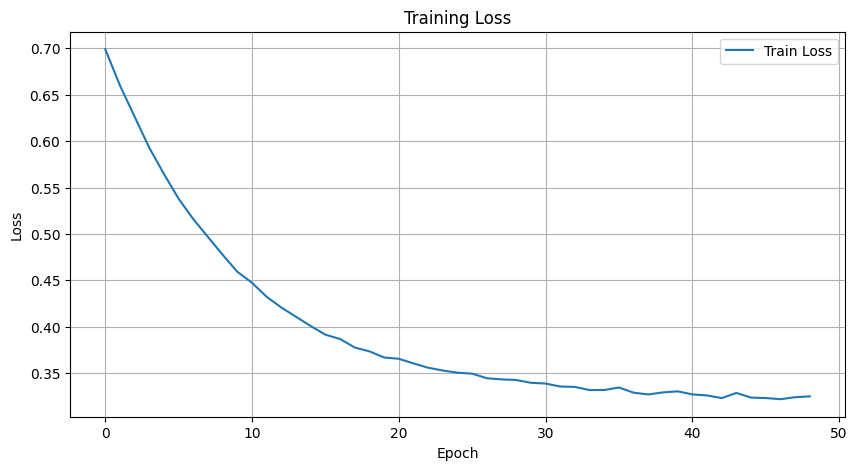

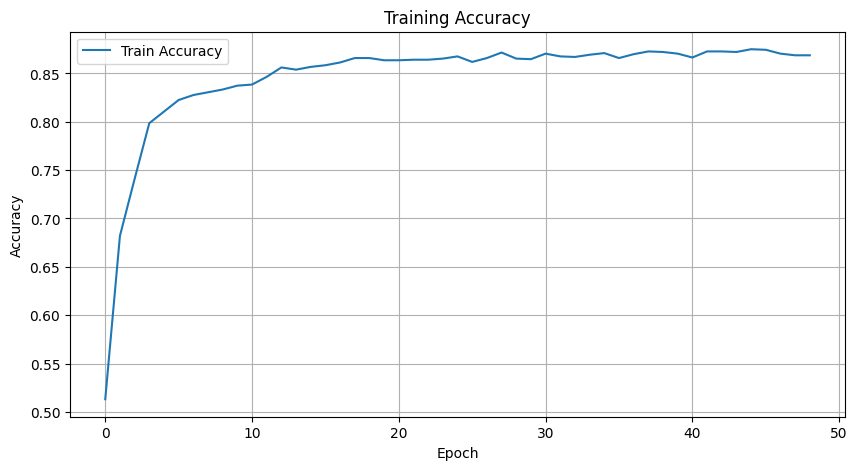

[I 2025-03-06 07:07:24,135] Trial 97 finished with value: 0.8596454255683466 and parameters: {'lr': 9.581879800060724e-05, 'hidden_size': 84, 'dropout_rate': 0.20249421838678178, 'batch_size': 32, 'num_epochs': 49}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/67], Step [10/55], Loss: 0.7310
Epoch [1/67], Step [20/55], Loss: 0.6971
Epoch [1/67], Step [30/55], Loss: 0.7166
Epoch [1/67], Step [40/55], Loss: 0.6822
Epoch [1/67], Step [50/55], Loss: 0.7090
Epoch [1/67], Train Loss: 0.7125, Train Accuracy: 0.4983
Epoch [2/67], Step [10/55], Loss: 0.7169
Epoch [2/67], Step [20/55], Loss: 0.7199
Epoch [2/67], Step [30/55], Loss: 0.7168
Epoch [2/67], Step [40/55], Loss: 0.7087
Epoch [2/67], Step [50/55], Loss: 0.6703
Epoch [2/67], Train Loss: 0.6871, Train Accuracy: 0.5656
Epoch [3/67], Step [10/55], Loss: 0.6541
Epoch [3/67], Step [20/55], Loss: 0.6696
Epoch [3/67], Step [30/55], Loss: 0.6992
Epoch [3/67], Step [40/55], Loss: 0.6657
Epoch [3/67], Step [50/55], Loss: 0.6389
Epoch [3/67], Train Loss: 0.6613, Train Accuracy: 0.6558
Epoch [4/67], Step [10/55], Loss: 0.6273
Epoch [4/67], Step [20/55], Loss: 0.6315
Epoch [4/67], Step [30/55], Loss: 0.6314
Epoch [4/67], Step [40/55], Loss: 0.6180
Epoch [4/67], Step [50/55], Loss: 0.6217
Epoch [4/

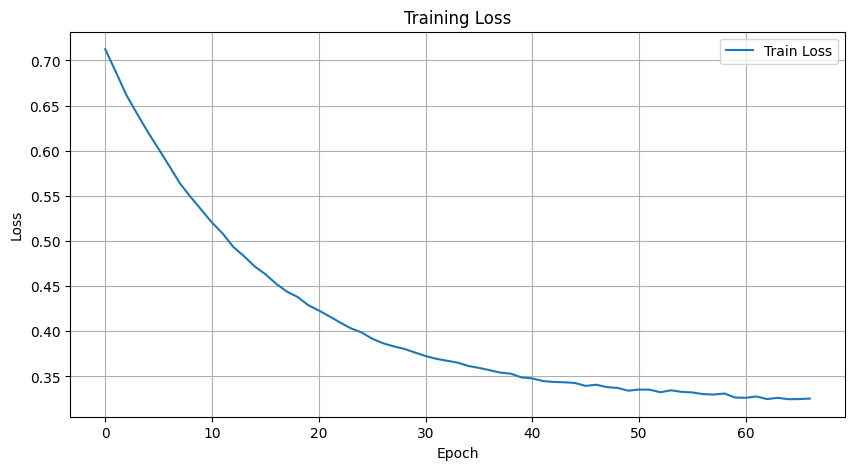

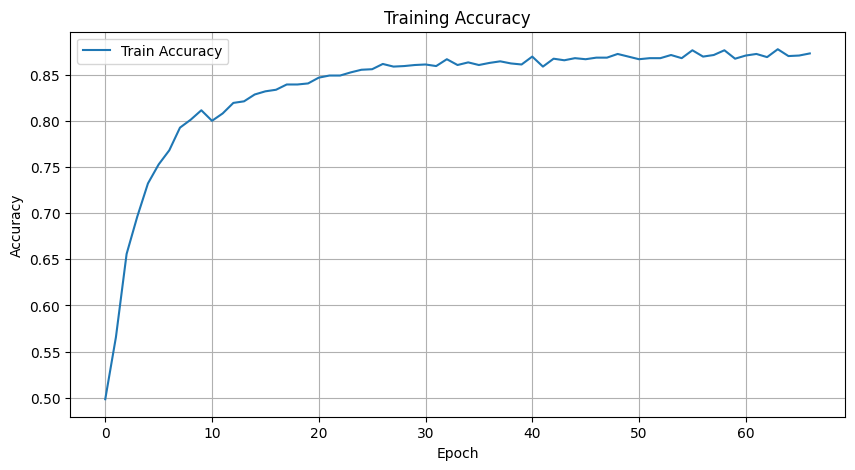

[I 2025-03-06 07:07:31,657] Trial 98 finished with value: 0.8598034825215352 and parameters: {'lr': 7.08599448826844e-05, 'hidden_size': 55, 'dropout_rate': 0.10198767263995694, 'batch_size': 32, 'num_epochs': 67}. Best is trial 80 with value: 0.8725270672532336.


Epoch [1/147], Step [10/55], Loss: 0.6828
Epoch [1/147], Step [20/55], Loss: 0.6821
Epoch [1/147], Step [30/55], Loss: 0.7242
Epoch [1/147], Step [40/55], Loss: 0.6972
Epoch [1/147], Step [50/55], Loss: 0.6989
Epoch [1/147], Train Loss: 0.7000, Train Accuracy: 0.5051
Epoch [2/147], Step [10/55], Loss: 0.7223
Epoch [2/147], Step [20/55], Loss: 0.7104
Epoch [2/147], Step [30/55], Loss: 0.6826
Epoch [2/147], Step [40/55], Loss: 0.6637
Epoch [2/147], Step [50/55], Loss: 0.6792
Epoch [2/147], Train Loss: 0.6831, Train Accuracy: 0.6050
Epoch [3/147], Step [10/55], Loss: 0.6621
Epoch [3/147], Step [20/55], Loss: 0.6869
Epoch [3/147], Step [30/55], Loss: 0.6605
Epoch [3/147], Step [40/55], Loss: 0.6756
Epoch [3/147], Step [50/55], Loss: 0.6577
Epoch [3/147], Train Loss: 0.6703, Train Accuracy: 0.6826
Epoch [4/147], Step [10/55], Loss: 0.6599
Epoch [4/147], Step [20/55], Loss: 0.6838
Epoch [4/147], Step [30/55], Loss: 0.6996
Epoch [4/147], Step [40/55], Loss: 0.6593
Epoch [4/147], Step [50/55],

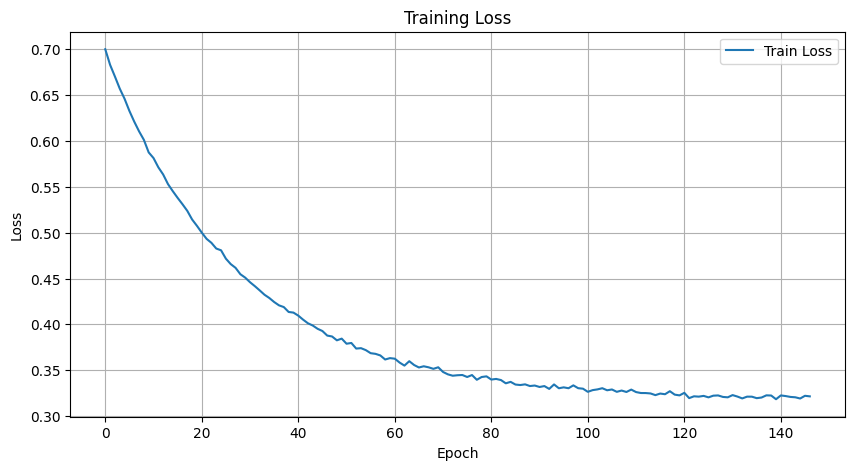

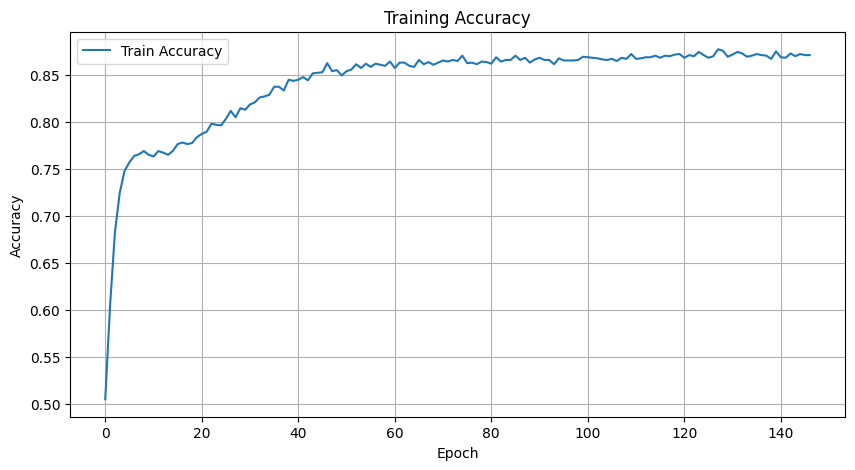

[I 2025-03-06 07:07:47,132] Trial 99 finished with value: 0.8646242195937935 and parameters: {'lr': 3.027612542635763e-05, 'hidden_size': 91, 'dropout_rate': 0.12629845318663174, 'batch_size': 32, 'num_epochs': 147}. Best is trial 80 with value: 0.8725270672532336.


Best Trial:
  Value: 0.8725270672532336
  Params: 
    lr: 3.278754324798049e-05
    hidden_size: 85
    dropout_rate: 0.20889712521879314
    batch_size: 32
    num_epochs: 166


In [13]:
def run_optuna(X_train, X_val, y_train, y_val, n_trials=10):
    def lambda_objective(trial):
        return objective(trial, X_train, X_val, y_train, y_val)
        
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda_objective, n_trials=n_trials)

    print("Best Trial:")
    trial = study.best_trial
    print("  Value: {}".format(trial.value))
    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))

    return study.best_params

best_params = run_optuna(X_train, X_val, y_train, y_val, n_trials=100)

Epoch [1/117], Step [10/28], Loss: 0.6375
Epoch [1/117], Step [20/28], Loss: 0.6454
Epoch [1/117], Train Loss: 0.6532, Train Accuracy: 0.6421
Epoch [2/117], Step [10/28], Loss: 0.6338
Epoch [2/117], Step [20/28], Loss: 0.6351
Epoch [2/117], Train Loss: 0.6348, Train Accuracy: 0.6815
Epoch [3/117], Step [10/28], Loss: 0.6111
Epoch [3/117], Step [20/28], Loss: 0.6093
Epoch [3/117], Train Loss: 0.6249, Train Accuracy: 0.7192
Epoch [4/117], Step [10/28], Loss: 0.6069
Epoch [4/117], Step [20/28], Loss: 0.6352
Epoch [4/117], Train Loss: 0.6123, Train Accuracy: 0.7511
Epoch [5/117], Step [10/28], Loss: 0.6439
Epoch [5/117], Step [20/28], Loss: 0.5850
Epoch [5/117], Train Loss: 0.6008, Train Accuracy: 0.7591
Epoch [6/117], Step [10/28], Loss: 0.6003
Epoch [6/117], Step [20/28], Loss: 0.5549
Epoch [6/117], Train Loss: 0.5891, Train Accuracy: 0.7825
Epoch [7/117], Step [10/28], Loss: 0.5846
Epoch [7/117], Step [20/28], Loss: 0.5486
Epoch [7/117], Train Loss: 0.5778, Train Accuracy: 0.7985
Epoch 

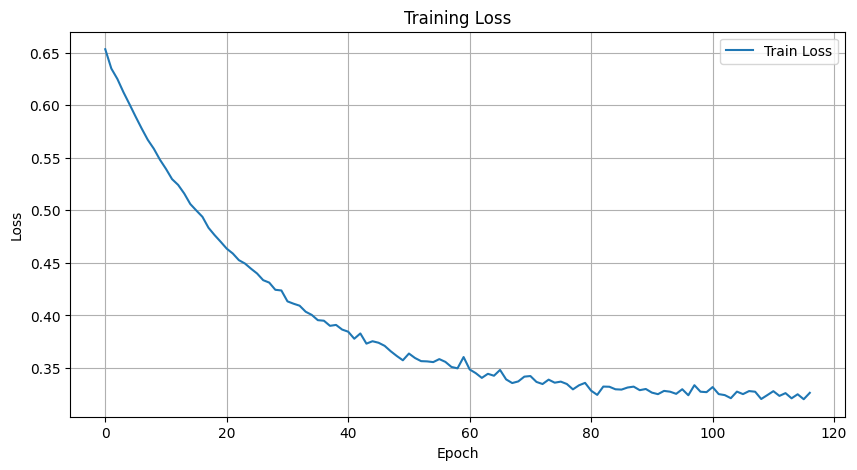

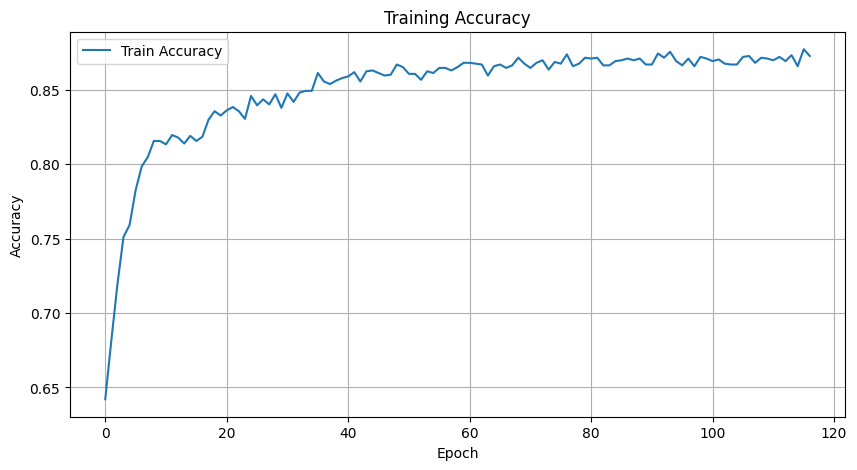

In [14]:
input_size = df_train.shape[1]
hidden_size = 61

model = MLP(input_size, hidden_size, dropout_rate= 0.23631507605369712)

X_train = torch.tensor(X_train, dtype=torch.float32)
X_val = torch.tensor(X_val, dtype=torch.float32)
y_train = torch.tensor(y_train.to_numpy(), dtype=torch.float32)
y_val = torch.tensor(y_val.to_numpy(), dtype=torch.float32)


train_dataset = torch.utils.data.TensorDataset(X_train, y_train)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=64, shuffle=True)

criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=7.650759418753573e-05)

num_epochs = 117
batch_size = 64

train_losses = []
train_accuracies = []

for epoch in range(num_epochs):
    epoch_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    for i, (inputs, labels) in enumerate(train_loader):
        outputs = model(inputs)
        loss = criterion(outputs, labels.unsqueeze(1)) 

        optimizer.zero_grad()
        loss.backward()
        #torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0) 
        optimizer.step()

        epoch_loss += loss.item()  

        # Doğruluk hesaplama
        predicted = (outputs > 0.5).float() 
        correct_predictions += (predicted == labels.unsqueeze(1)).sum().item()
        total_samples += labels.size(0)

        if (i + 1) % 10 == 0:
            print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'
                  .format(epoch + 1, num_epochs, i + 1, len(train_loader), loss.item()))

    epoch_loss /= len(train_loader)
    epoch_accuracy = correct_predictions / total_samples

    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_accuracy)

    print('Epoch [{}/{}], Train Loss: {:.4f}, Train Accuracy: {:.4f}'
          .format(epoch + 1, num_epochs, epoch_loss, epoch_accuracy))

with torch.no_grad():
    outputs = model(X_val)
    predicted_probs = outputs.cpu().numpy() 
    auc = roc_auc_score(y_val.cpu().numpy(), predicted_probs) 
    print('Test AUC: {:.4f}'.format(auc))

plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(train_accuracies, label='Train Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()
plt.grid(True)
plt.show()

In [15]:
PATH = "/kaggle/working/mlp_model_state.pth"
torch.save(model.state_dict(), PATH)
print('The models state dictionary has been saved.: {}'.format(PATH))

The models state dictionary has been saved.: /kaggle/working/mlp_model_state.pth


In [16]:
model = MLP(input_size, hidden_size)
model.load_state_dict(torch.load(PATH))
model.eval()  
print("The model's state dictionary has been loaded.: {}".format(PATH))

The model's state dictionary has been loaded.: /kaggle/working/mlp_model_state.pth


In [17]:
test_tensor = torch.tensor(df_test, dtype=torch.float32)

with torch.no_grad():
    outputs = model(test_tensor)
    predicted_probs = outputs.cpu().numpy()  
    print("Olasılıklar:", predicted_probs)

Olasılıklar: [[0.986337  ]
 [0.9923873 ]
 [0.9621817 ]
 [0.18525784]
 [0.14469512]
 [0.8739364 ]
 [0.9296801 ]
 [0.9693583 ]
 [0.9515617 ]
 [0.7285286 ]
 [0.9891565 ]
 [0.09061371]
 [0.9859803 ]
 [0.9866154 ]
 [0.42288908]
 [0.02456788]
 [0.93770826]
 [0.77446055]
 [0.08809265]
 [0.01495633]
 [0.19573675]
 [0.34379005]
 [0.84132624]
 [0.99214727]
 [0.8869271 ]
 [0.47798592]
 [0.03008986]
 [0.9901417 ]
 [0.9403824 ]
 [0.47233197]
 [0.9627361 ]
 [0.9702976 ]
 [0.87840575]
 [0.98400855]
 [0.8540539 ]
 [0.91541535]
 [0.25156516]
 [0.89480555]
 [0.8293245 ]
 [0.86682695]
 [0.8269858 ]
 [0.8814926 ]
 [0.16625461]
 [0.9099651 ]
 [0.9743523 ]
 [0.17936899]
 [0.3217109 ]
 [0.9860006 ]
 [0.2928259 ]
 [0.8469624 ]
 [0.9564539 ]
 [0.98106706]
 [0.9883265 ]
 [0.97843015]
 [0.98376423]
 [0.9806589 ]
 [0.9463486 ]
 [0.96407306]
 [0.9359511 ]
 [0.96690613]
 [0.8959549 ]
 [0.9794534 ]
 [0.9796791 ]
 [0.8406064 ]
 [0.4264154 ]
 [0.22395763]
 [0.14702141]
 [0.8978539 ]
 [0.918898  ]
 [0.11793492]
 [0.985

In [18]:
output = pd.DataFrame({
    'id': df_test_id, 
    'rainfall': predicted_probs[:,0]
})

output

,id,rainfall
0,2190,0.99
1,2191,0.99
2,2192,0.96
3,2193,0.19
4,2194,0.14
...,...,...
725,2915,0.99
726,2916,0.82
727,2917,0.97
728,2918,0.99


In [19]:
output.to_csv('submission.csv', index=False)